In [1]:
##-----------------------------------------------------------------------------------------##
##-----------------------------------------------------------------------------------------##
##-----------------Multilayer feedforward network for pattern recognition------------------##
##-----------------------------------------------------------------------------------------##
##-----------------------------------------------------------------------------------------##

## Reference: Jin Yu, "Artificial Neural Network: Assignment" Katholieke Universiteit Leuven, 
## Specialized advanced studies Master in Artificial Intelligence.
## http://users.cecs.anu.edu.au/~jinyu/JinYu_files/preproj/ANN.pdf
## (accessed Feb. 5, 2022).


In [2]:
import tensorflow as tf
import math
import copy
from tensorflow.keras.utils import plot_model
import pandas as pd
from tensorflow import keras
from keras.layers import concatenate
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
import numpy as np
import random
import matplotlib.pyplot as plt
from scipy import interpolate
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import time
from keras.losses import mean_squared_error
from tensorflow.keras.callbacks import EarlyStopping
from keras.callbacks import Callback as cb
from keras.layers import Activation
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects

In [3]:
## create target letters (English Alphabet) and distorted letters in 7 by 5 matrix with 1s and 0s,
## where 1s represent the letter pixel and 0s represent empty pixel
## each distorted letter is flipped between 1 to 3 pixel

target_A = np.array([
        [0, 0, 1, 0, 0],
        [0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0],
        [1, 0, 0, 0, 1], 
        [1, 1, 1, 1, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_A = np.array([
        [1, 0, 1, 0, 0],
        [0, 0, 0, 1, 0],
        [0, 1, 0, 1, 0],
        [1, 0, 0, 0, 1], 
        [1, 1, 1, 1, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1]
    ])
target_B = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 0]
    ])
distorted_B = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 1, 0, 1],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 1, 0, 1],
        [1, 1, 1, 1, 0]
    ])
target_C = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
distorted_C = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 1, 0, 0], 
        [0, 0, 0, 0, 0],
        [1, 1, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
target_D = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 0]
    ])
distorted_D = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 1], 
        [0, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 0, 0]
    ])
target_E = np.array([
        [1, 1, 1, 1, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1]
    ])
distorted_E = np.array([
        [1, 1, 1, 1, 1],
        [1, 1, 0, 1, 1],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1]
    ])
target_F = np.array([
        [1, 1, 1, 1, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0]
    ])
distorted_F = np.array([
        [1, 0, 1, 1, 1],
        [1, 0, 1, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0]
    ])
target_G = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 0, 1, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
distorted_G = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 1], 
        [1, 1, 0, 1, 1],
        [0, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
target_H = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_H = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 1], 
        [1, 0, 0, 1, 1],
        [1, 0, 1, 0, 1],
        [1, 0, 1, 0, 1]
    ])
target_I = np.array([
        [0, 1, 1, 1, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 1, 1, 1, 0]
    ])
distorted_I  = np.array([
        [0, 1, 1, 1, 0],
        [0, 1, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [0, 1, 1, 0, 0],
        [0, 1, 1, 1, 0]
    ])
target_J = np.array([
        [1, 1, 1, 1, 1],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [1, 0, 1, 0, 0],
        [0, 1, 0, 0, 0]
    ])
distorted_J  = np.array([
        [1, 0, 1, 1, 1],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [1, 0, 1, 0, 0],
        [0, 1, 0, 0, 0]
    ])
target_K = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 1, 0],
        [1, 0, 1, 0, 0],
        [1, 1, 0, 0, 0], 
        [1, 0, 1, 0, 0],
        [1, 0, 0, 1, 0],
        [1, 0, 0, 0, 1]
    ])
distorted_K  = np.array([
        [1, 0, 1, 0, 1],
        [1, 0, 0, 1, 0],
        [1, 0, 1, 0, 0],
        [0, 1, 0, 0, 0], 
        [0, 0, 1, 0, 0],
        [1, 0, 0, 1, 0],
        [1, 0, 0, 0, 1]
    ])
target_L = np.array([
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1]
    ])
distorted_L = np.array([
        [1, 0, 1, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 1, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 0, 1, 1]
    ])
target_M = np.array([
        [1, 0, 0, 0, 1],
        [1, 1, 0, 1, 1],
        [1, 0, 1, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_M = np.array([
        [1, 0, 0, 0, 1],
        [1, 1, 0, 1, 1],
        [1, 0, 1, 0, 1],
        [1, 0, 0, 1, 1], 
        [1, 0, 0, 0, 1],
        [0, 0, 0, 0, 1],
        [1, 0, 0, 1, 1]
    ])
target_N = np.array([
        [1, 0, 0, 0, 1],
        [1, 1, 0, 0, 1],
        [1, 1, 0, 0, 1],
        [1, 0, 1, 0, 1], 
        [1, 0, 0, 1, 1],
        [1, 0, 0, 1, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_N = np.array([
        [1, 0, 0, 0, 1],
        [1, 1, 1, 0, 1],
        [1, 1, 0, 0, 1],
        [1, 0, 1, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 1, 1],
        [1, 1, 0, 0, 1]
    ])
target_O = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
distorted_O = np.array([
        [0, 1, 1, 0, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 1],
        [0, 0, 1, 1, 0]
    ])
target_P = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0]
    ])
distorted_P = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 0],
        [1, 0, 1, 0, 1],
        [1, 1, 1, 1, 0], 
        [1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0]
    ])
target_Q = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 1, 0, 1],
        [1, 0, 0, 1, 0],
        [0, 1, 1, 0, 1]
    ])
distorted_Q = np.array([
        [0, 1, 0, 1, 0],
        [1, 0, 1, 0, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 1, 0, 1],
        [1, 0, 0, 1, 0],
        [0, 1, 1, 0, 1]
    ])
target_R = np.array([
        [1, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 1, 0], 
        [1, 0, 1, 0, 0],
        [1, 0, 0, 1, 0],
        [1, 0, 0, 0, 1]
    ])
distorted_R = np.array([
        [1, 1, 1, 1, 0],
        [0, 0, 0, 0, 1],
        [1, 1, 0, 0, 0],
        [1, 1, 1, 1, 0], 
        [1, 0, 1, 0, 0],
        [1, 0, 0, 1, 0],
        [1, 0, 0, 0, 1]
    ])
target_S = np.array([
        [0, 1, 1, 1, 0],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 0, 1, 0],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
distorted_S = np.array([
        [0, 1, 0, 1, 0],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 0, 1],
        [0, 1, 1, 0, 0], 
        [0, 0, 0, 1, 0],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
target_T = np.array([
        [1, 1, 1, 1, 1],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0]
    ])
distorted_T  = np.array([
        [1, 1, 1, 1, 1],
        [0, 0, 1, 0, 1],
        [0, 1, 1, 0, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [1, 0, 1, 0, 0]
    ])
target_U = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 1, 1, 0]
    ])
distorted_U  = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 1, 0, 1], 
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0]
    ])
target_V = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0],
        [0, 0, 1, 0, 0]
    ])
distorted_V  = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 1, 0, 0, 0],
        [1, 0, 0, 0, 0], 
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0],
        [0, 0, 1, 0, 0]
    ])
target_W = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1], 
        [1, 0, 1, 0, 1],
        [1, 1, 0, 1, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_W  = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 0, 0, 0, 1],
        [1, 0, 1, 0, 1], 
        [1, 0, 1, 0, 1],
        [1, 1, 0, 1, 1],
        [1, 0, 0, 0, 1]
    ])
target_X = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0],
        [0, 0, 1, 0, 0], 
        [0, 1, 0, 1, 0],
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1]
    ])
distorted_X  = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 0, 0],
        [1, 0, 1, 0, 0], 
        [0, 1, 0, 1, 0],
        [1, 0, 0, 1, 1],
        [1, 0, 0, 0, 1]
    ])
target_Y = np.array([
        [1, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0],
        [0, 0, 1, 0, 0], 
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0]
    ])
distorted_Y  = np.array([
        [0, 0, 0, 0, 1],
        [1, 0, 0, 0, 1],
        [0, 1, 0, 1, 0],
        [0, 1, 1, 0, 0], 
        [0, 0, 1, 1, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0]
    ])
target_Z = np.array([
        [1, 1, 1, 1, 1],
        [0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0], 
        [0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1]
    ])
distorted_Z  = np.array([
        [1, 1, 1, 0, 1],
        [0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0], 
        [0, 1, 1, 0, 0],
        [1, 1, 0, 0, 0],
        [1, 1, 1, 1, 1]
    ])


In [4]:
## data preparation
## labelling letters from 1 to 30

lookup_table = {0:target_A,1:target_B,2:target_C,3:target_D,4:target_E,5:target_F,6:target_G,7:target_H,8:target_I,9:target_J,10:target_K,11:target_L,12:target_M,13:target_N,14:target_O,15:target_P,
                16:target_Q,17:target_R,18:target_S,19:target_T,20:target_U,21:target_V,22:target_W,23:target_X,24:target_Y,25:target_Z}

distorted = [distorted_A,distorted_B,distorted_C,distorted_D,distorted_E,distorted_F,distorted_G,distorted_H,distorted_I,
          distorted_J,distorted_K,distorted_L,distorted_M,distorted_N,distorted_O,distorted_P,distorted_Q,distorted_R,
          distorted_S,distorted_T,distorted_U,distorted_V,distorted_W,distorted_X,distorted_Y,distorted_Z]
targets = [target_A,target_B,target_C,target_D,target_E,target_F,target_G,target_H,target_I,
          target_J,target_K,target_L,target_M,target_N,target_O,target_P,target_Q,target_R,
          target_S,target_T,target_U,target_V,target_W,target_X,target_Y,target_Z]
x_train = []
x_val = []
y_train = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
y_val = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
for x in distorted:
    x_flat = x.flatten().astype("float32")
    x_train.append(x_flat)
for y in targets:
    y_flat = y.flatten().astype("float32")
    x_val.append(y_flat)

x_train = np.array(x_train)
x_val = np.array(x_val)
y_train = np.array(y_train)
y_val = np.array(y_val)

In [5]:
## create a log-sigmoid custom activation function

def log_sigmoid(x):
    return  tf.math.log_sigmoid(x)

get_custom_objects().update({'custom_activation': Activation(log_sigmoid)})

In [6]:
## model for classification to 26 target characters

Recog_error_layer_size = {}
#initialize weights around 0.
initializer = tf.keras.initializers.RandomUniform(minval=-1., maxval=1.)
for i in range(5,26):
    model_parta = keras.Sequential()

    model_parta.add(layers.Dense(i, activation="custom_activation",kernel_initializer=initializer, input_shape=(35,))) #hidden layer1
    model_parta.add(layers.Dense(i, activation="custom_activation")) #hidden layer2
    model_parta.add(layers.Dense(26,activation="softmax"))

    #model_parta.summary()
    #model_parta.layers[1].get_weights()
    model_parta.compile(optimizer='Adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])
    history_parta= model_parta.fit(x_train,y_train,epochs=5000,batch_size=10)
    predicted = model_parta.predict(x_val)
    predicted_labels = [np.argmax(i) for i in predicted] 
    confusion_mat = tf.math.confusion_matrix(labels=y_val,predictions=predicted_labels)
    misclassfied = (len(y_val)-np.trace(confusion_mat))/len(y_val)
    Recog_error_layer_size[i] = misclassfied

print(Recog_error_layer_size)



Epoch 1/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3743 - accuracy: 0.0385
Epoch 2/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3649 - accuracy: 0.0385
Epoch 3/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3597 - accuracy: 0.0385
Epoch 4/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3540 - accuracy: 0.0385
Epoch 5/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3487 - accuracy: 0.0385
Epoch 6/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3442 - accuracy: 0.0385
Epoch 7/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3391 - accuracy: 0.0385
Epoch 8/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3347 - accuracy: 0.0769
Epoch 9/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3304 - accuracy: 0.0769
Epoch 10/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3262 - accuracy: 0.0769
Epoch 11/5000
3/3 [

3/3 [==============================] - 0s 2ms/step - loss: 3.1235 - accuracy: 0.1154
Epoch 84/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1198 - accuracy: 0.1154
Epoch 85/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1160 - accuracy: 0.1154
Epoch 86/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1122 - accuracy: 0.1154
Epoch 87/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1088 - accuracy: 0.1154
Epoch 88/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1052 - accuracy: 0.1154
Epoch 89/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1007 - accuracy: 0.1154
Epoch 90/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0966 - accuracy: 0.1154
Epoch 91/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0930 - accuracy: 0.1154
Epoch 92/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0887 - accuracy: 0.1154
Epoch 93/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.6185 - accuracy: 0.2308
Epoch 166/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6101 - accuracy: 0.2308
Epoch 167/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6012 - accuracy: 0.2308
Epoch 168/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5926 - accuracy: 0.2308
Epoch 169/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5837 - accuracy: 0.2308
Epoch 170/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5743 - accuracy: 0.2308
Epoch 171/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5655 - accuracy: 0.2308
Epoch 172/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5561 - accuracy: 0.2308
Epoch 173/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5471 - accuracy: 0.1923
Epoch 174/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5384 - accuracy: 0.1923
Epoch 175/5000


3/3 [==============================] - 0s 2ms/step - loss: 1.7518 - accuracy: 0.3846
Epoch 248/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7419 - accuracy: 0.3846
Epoch 249/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7321 - accuracy: 0.3846
Epoch 250/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7216 - accuracy: 0.3846
Epoch 251/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7115 - accuracy: 0.3846
Epoch 252/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7015 - accuracy: 0.3846
Epoch 253/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6919 - accuracy: 0.4231
Epoch 254/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6823 - accuracy: 0.4231
Epoch 255/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6721 - accuracy: 0.4231
Epoch 256/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6627 - accuracy: 0.4231
Epoch 257/5000


3/3 [==============================] - 0s 2ms/step - loss: 1.0696 - accuracy: 0.7308
Epoch 330/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0629 - accuracy: 0.7308
Epoch 331/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0551 - accuracy: 0.7308
Epoch 332/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0494 - accuracy: 0.7692
Epoch 333/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0414 - accuracy: 0.7692
Epoch 334/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0365 - accuracy: 0.7692
Epoch 335/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0287 - accuracy: 0.7692
Epoch 336/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0230 - accuracy: 0.7692
Epoch 337/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0163 - accuracy: 0.7692
Epoch 338/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0093 - accuracy: 0.7692
Epoch 339/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.9231
Epoch 412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.9615
Epoch 413/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6170 - accuracy: 1.0000
Epoch 414/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6133 - accuracy: 1.0000
Epoch 415/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.9615
Epoch 416/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.9615
Epoch 417/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6012 - accuracy: 0.9615
Epoch 418/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.5973 - accuracy: 0.9231
Epoch 419/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.9231
Epoch 420/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5898 - accuracy: 0.9231
Epoch 421/5000


Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3552 - accuracy: 1.0000
Epoch 494/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 1.0000
Epoch 495/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3496 - accuracy: 1.0000
Epoch 496/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3467 - accuracy: 1.0000
Epoch 497/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.3449 - accuracy: 1.0000
Epoch 498/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 1.0000
Epoch 499/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 1.0000
Epoch 500/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 1.0000
Epoch 501/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3345 - accuracy: 1.0000
Epoch 502/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.1983 - accuracy: 1.0000
Epoch 575/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1966 - accuracy: 1.0000
Epoch 576/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1949 - accuracy: 1.0000
Epoch 577/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1937 - accuracy: 1.0000
Epoch 578/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1929 - accuracy: 1.0000
Epoch 579/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1914 - accuracy: 1.0000
Epoch 580/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1900 - accuracy: 1.0000
Epoch 581/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1886 - accuracy: 1.0000
Epoch 582/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1870 - accuracy: 1.0000
Epoch 583/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1856 - accuracy: 1.0000
Epoch 584/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.1097 - accuracy: 1.0000
Epoch 657/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1087 - accuracy: 1.0000
Epoch 658/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1078 - accuracy: 1.0000
Epoch 659/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1072 - accuracy: 1.0000
Epoch 660/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1065 - accuracy: 1.0000
Epoch 661/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 1.0000
Epoch 662/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1052 - accuracy: 1.0000
Epoch 663/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1042 - accuracy: 1.0000
Epoch 664/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1035 - accuracy: 1.0000
Epoch 665/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1033 - accuracy: 1.0000
Epoch 666/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 739/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0630 - accuracy: 1.0000
Epoch 740/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0626 - accuracy: 1.0000
Epoch 741/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0622 - accuracy: 1.0000
Epoch 742/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0619 - accuracy: 1.0000
Epoch 743/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0615 - accuracy: 1.0000
Epoch 744/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0614 - accuracy: 1.0000
Epoch 745/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 746/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0605 - accuracy: 1.0000
Epoch 747/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0600 - accuracy: 1.0000
Epoch 748/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 821/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 822/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 823/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 824/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 825/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 826/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 827/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 828/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 829/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 830/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 902/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0265 - accuracy: 1.0000
Epoch 903/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 904/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 905/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 906/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 907/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 908/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0258 - accuracy: 1.0000
Epoch 909/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 910/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0255 - accuracy: 1.0000
Epoch 911/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 985/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 986/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 987/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 988/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 989/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 990/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 991/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 992/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 993/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1066/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1067/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1068/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 1069/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 1070/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 1071/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 1072/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 1073/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 1148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 1149/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 1150/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 1151/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 1152/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 1153/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 1154/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 1227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 1228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 1229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 1230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 1231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 1232/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 1233/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 1234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0079 - accuracy: 1.0000
Epoch 1235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0079 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 4ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 1310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 1311/5000
3/3 [==============================] - ETA: 0s - loss: 0.0056 - accuracy: 1.00 - 0s 8ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 1312/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 1313/5000
3/3 [==============================] - 0s 9ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 18ms/st

3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 1388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 1396/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 1474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 1475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 1476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1555/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1634/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1637/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1714/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1715/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1716/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1719/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1792/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1793/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1794/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1796/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1797/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1798/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1799/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1800/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1873/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1874/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1875/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1876/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1877/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1878/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1879/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1880/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1881/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1954/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1955/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1956/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1957/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1958/5000
3/3 [==============================] - 0s 14ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1959/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1960/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1961/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1962/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2034/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2035/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2036/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2037/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2038/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2039/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2040/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2041/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2042/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.8275e-04 - accuracy: 1.0000
Epoch 2114/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8083e-04 - accuracy: 1.0000
Epoch 2115/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7874e-04 - accuracy: 1.0000
Epoch 2116/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7748e-04 - accuracy: 1.0000
Epoch 2117/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.7516e-04 - accuracy: 1.0000
Epoch 2118/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7292e-04 - accuracy: 1.0000
Epoch 2119/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7166e-04 - accuracy: 1.0000
Epoch 2120/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6907e-04 - accuracy: 1.0000
Epoch 2121/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6695e-04 - accuracy: 1.0000
Epoch 2122/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3847e-04 - accuracy: 1.0000
Epoch 2192/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3685e-04 - accuracy: 1.0000
Epoch 2193/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3515e-04 - accuracy: 1.0000
Epoch 2194/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3360e-04 - accuracy: 1.0000
Epoch 2195/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3184e-04 - accuracy: 1.0000
Epoch 2196/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3030e-04 - accuracy: 1.0000
Epoch 2197/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.2855e-04 - accuracy: 1.0000
Epoch 2198/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2696e-04 - accuracy: 1.0000
Epoch 2199/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2527e-04 - accuracy: 1.0000
Epoch 2200/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.1814e-04 - accuracy: 1.0000
Epoch 2270/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1615e-04 - accuracy: 1.0000
Epoch 2271/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1486e-04 - accuracy: 1.0000
Epoch 2272/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.1315e-04 - accuracy: 1.0000
Epoch 2273/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1208e-04 - accuracy: 1.0000
Epoch 2274/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1059e-04 - accuracy: 1.0000
Epoch 2275/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0906e-04 - accuracy: 1.0000
Epoch 2276/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0772e-04 - accuracy: 1.0000
Epoch 2277/5000
3/3 [==============================] - ETA: 0s - loss: 7.7218e-04 - accuracy: 1.00 - 0s 2ms/step - loss: 7.0650e-04 - accuracy: 1.0000
Epoch 2278/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 6.1669e-04 - accuracy: 1.0000
Epoch 2347/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.1553e-04 - accuracy: 1.0000
Epoch 2348/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1447e-04 - accuracy: 1.0000
Epoch 2349/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1318e-04 - accuracy: 1.0000
Epoch 2350/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1233e-04 - accuracy: 1.0000
Epoch 2351/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.1073e-04 - accuracy: 1.0000
Epoch 2352/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0962e-04 - accuracy: 1.0000
Epoch 2353/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0854e-04 - accuracy: 1.0000
Epoch 2354/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0715e-04 - accuracy: 1.0000
Epoch 2355/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3055e-04 - accuracy: 1.0000
Epoch 2425/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2924e-04 - accuracy: 1.0000
Epoch 2426/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2821e-04 - accuracy: 1.0000
Epoch 2427/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2728e-04 - accuracy: 1.0000
Epoch 2428/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2646e-04 - accuracy: 1.0000
Epoch 2429/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2519e-04 - accuracy: 1.0000
Epoch 2430/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2417e-04 - accuracy: 1.0000
Epoch 2431/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2323e-04 - accuracy: 1.0000
Epoch 2432/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2219e-04 - accuracy: 1.0000
Epoch 2433/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5613e-04 - accuracy: 1.0000
Epoch 2503/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5551e-04 - accuracy: 1.0000
Epoch 2504/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5449e-04 - accuracy: 1.0000
Epoch 2505/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5370e-04 - accuracy: 1.0000
Epoch 2506/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5279e-04 - accuracy: 1.0000
Epoch 2507/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5212e-04 - accuracy: 1.0000
Epoch 2508/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5124e-04 - accuracy: 1.0000
Epoch 2509/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5029e-04 - accuracy: 1.0000
Epoch 2510/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.4957e-04 - accuracy: 1.0000
Epoch 2511/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9343e-04 - accuracy: 1.0000
Epoch 2581/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9275e-04 - accuracy: 1.0000
Epoch 2582/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9195e-04 - accuracy: 1.0000
Epoch 2583/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9113e-04 - accuracy: 1.0000
Epoch 2584/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9021e-04 - accuracy: 1.0000
Epoch 2585/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8959e-04 - accuracy: 1.0000
Epoch 2586/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8908e-04 - accuracy: 1.0000
Epoch 2587/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8825e-04 - accuracy: 1.0000
Epoch 2588/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8750e-04 - accuracy: 1.0000
Epoch 2589/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3985e-04 - accuracy: 1.0000
Epoch 2659/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3920e-04 - accuracy: 1.0000
Epoch 2660/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3854e-04 - accuracy: 1.0000
Epoch 2661/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3791e-04 - accuracy: 1.0000
Epoch 2662/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3719e-04 - accuracy: 1.0000
Epoch 2663/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3673e-04 - accuracy: 1.0000
Epoch 2664/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3610e-04 - accuracy: 1.0000
Epoch 2665/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3536e-04 - accuracy: 1.0000
Epoch 2666/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3464e-04 - accuracy: 1.0000
Epoch 2667/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9351e-04 - accuracy: 1.0000
Epoch 2737/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9298e-04 - accuracy: 1.0000
Epoch 2738/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9233e-04 - accuracy: 1.0000
Epoch 2739/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9173e-04 - accuracy: 1.0000
Epoch 2740/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9115e-04 - accuracy: 1.0000
Epoch 2741/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9056e-04 - accuracy: 1.0000
Epoch 2742/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9035e-04 - accuracy: 1.0000
Epoch 2743/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8965e-04 - accuracy: 1.0000
Epoch 2744/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8906e-04 - accuracy: 1.0000
Epoch 2745/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5383e-04 - accuracy: 1.0000
Epoch 2815/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5322e-04 - accuracy: 1.0000
Epoch 2816/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5270e-04 - accuracy: 1.0000
Epoch 2817/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5229e-04 - accuracy: 1.0000
Epoch 2818/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5191e-04 - accuracy: 1.0000
Epoch 2819/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5135e-04 - accuracy: 1.0000
Epoch 2820/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5092e-04 - accuracy: 1.0000
Epoch 2821/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5053e-04 - accuracy: 1.0000
Epoch 2822/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5003e-04 - accuracy: 1.0000
Epoch 2823/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1987e-04 - accuracy: 1.0000
Epoch 2893/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1950e-04 - accuracy: 1.0000
Epoch 2894/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1911e-04 - accuracy: 1.0000
Epoch 2895/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1869e-04 - accuracy: 1.0000
Epoch 2896/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1834e-04 - accuracy: 1.0000
Epoch 2897/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1792e-04 - accuracy: 1.0000
Epoch 2898/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1747e-04 - accuracy: 1.0000
Epoch 2899/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1715e-04 - accuracy: 1.0000
Epoch 2900/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1669e-04 - accuracy: 1.0000
Epoch 2901/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9069e-04 - accuracy: 1.0000
Epoch 2971/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9034e-04 - accuracy: 1.0000
Epoch 2972/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8997e-04 - accuracy: 1.0000
Epoch 2973/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8962e-04 - accuracy: 1.0000
Epoch 2974/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8931e-04 - accuracy: 1.0000
Epoch 2975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8893e-04 - accuracy: 1.0000
Epoch 2976/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8857e-04 - accuracy: 1.0000
Epoch 2977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8820e-04 - accuracy: 1.0000
Epoch 2978/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8787e-04 - accuracy: 1.0000
Epoch 2979/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6556e-04 - accuracy: 1.0000
Epoch 3049/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6523e-04 - accuracy: 1.0000
Epoch 3050/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6488e-04 - accuracy: 1.0000
Epoch 3051/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6462e-04 - accuracy: 1.0000
Epoch 3052/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6428e-04 - accuracy: 1.0000
Epoch 3053/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6402e-04 - accuracy: 1.0000
Epoch 3054/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6370e-04 - accuracy: 1.0000
Epoch 3055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6341e-04 - accuracy: 1.0000
Epoch 3056/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6312e-04 - accuracy: 1.0000
Epoch 3057/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.4363e-04 - accuracy: 1.0000
Epoch 3127/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4334e-04 - accuracy: 1.0000
Epoch 3128/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4310e-04 - accuracy: 1.0000
Epoch 3129/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4288e-04 - accuracy: 1.0000
Epoch 3130/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4257e-04 - accuracy: 1.0000
Epoch 3131/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4232e-04 - accuracy: 1.0000
Epoch 3132/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4207e-04 - accuracy: 1.0000
Epoch 3133/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4182e-04 - accuracy: 1.0000
Epoch 3134/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4156e-04 - accuracy: 1.0000
Epoch 3135/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2486e-04 - accuracy: 1.0000
Epoch 3205/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2467e-04 - accuracy: 1.0000
Epoch 3206/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2443e-04 - accuracy: 1.0000
Epoch 3207/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2422e-04 - accuracy: 1.0000
Epoch 3208/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2401e-04 - accuracy: 1.0000
Epoch 3209/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2377e-04 - accuracy: 1.0000
Epoch 3210/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2358e-04 - accuracy: 1.0000
Epoch 3211/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2335e-04 - accuracy: 1.0000
Epoch 3212/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.2308e-04 - accuracy: 1.0000
Epoch 3213/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0862e-04 - accuracy: 1.0000
Epoch 3283/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0847e-04 - accuracy: 1.0000
Epoch 3284/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0822e-04 - accuracy: 1.0000
Epoch 3285/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0808e-04 - accuracy: 1.0000
Epoch 3286/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0788e-04 - accuracy: 1.0000
Epoch 3287/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0768e-04 - accuracy: 1.0000
Epoch 3288/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0751e-04 - accuracy: 1.0000
Epoch 3289/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0729e-04 - accuracy: 1.0000
Epoch 3290/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0711e-04 - accuracy: 1.0000
Epoch 3291/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.4774e-05 - accuracy: 1.0000
Epoch 3360/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4586e-05 - accuracy: 1.0000
Epoch 3361/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4453e-05 - accuracy: 1.0000
Epoch 3362/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4270e-05 - accuracy: 1.0000
Epoch 3363/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4114e-05 - accuracy: 1.0000
Epoch 3364/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3935e-05 - accuracy: 1.0000
Epoch 3365/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3770e-05 - accuracy: 1.0000
Epoch 3366/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.3637e-05 - accuracy: 1.0000
Epoch 3367/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3445e-05 - accuracy: 1.0000
Epoch 3368/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2511e-05 - accuracy: 1.0000
Epoch 3438/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2355e-05 - accuracy: 1.0000
Epoch 3439/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2231e-05 - accuracy: 1.0000
Epoch 3440/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2071e-05 - accuracy: 1.0000
Epoch 3441/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1961e-05 - accuracy: 1.0000
Epoch 3442/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1814e-05 - accuracy: 1.0000
Epoch 3443/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1668e-05 - accuracy: 1.0000
Epoch 3444/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1525e-05 - accuracy: 1.0000
Epoch 3445/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1360e-05 - accuracy: 1.0000
Epoch 3446/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.1948e-05 - accuracy: 1.0000
Epoch 3516/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1848e-05 - accuracy: 1.0000
Epoch 3517/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1747e-05 - accuracy: 1.0000
Epoch 3518/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1554e-05 - accuracy: 1.0000
Epoch 3519/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1449e-05 - accuracy: 1.0000
Epoch 3520/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1325e-05 - accuracy: 1.0000
Epoch 3521/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1210e-05 - accuracy: 1.0000
Epoch 3522/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1068e-05 - accuracy: 1.0000
Epoch 3523/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0954e-05 - accuracy: 1.0000
Epoch 3524/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2706e-05 - accuracy: 1.0000
Epoch 3594/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2610e-05 - accuracy: 1.0000
Epoch 3595/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2477e-05 - accuracy: 1.0000
Epoch 3596/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2399e-05 - accuracy: 1.0000
Epoch 3597/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2293e-05 - accuracy: 1.0000
Epoch 3598/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2179e-05 - accuracy: 1.0000
Epoch 3599/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2078e-05 - accuracy: 1.0000
Epoch 3600/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1963e-05 - accuracy: 1.0000
Epoch 3601/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1858e-05 - accuracy: 1.0000
Epoch 3602/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4678e-05 - accuracy: 1.0000
Epoch 3672/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4614e-05 - accuracy: 1.0000
Epoch 3673/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4490e-05 - accuracy: 1.0000
Epoch 3674/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4403e-05 - accuracy: 1.0000
Epoch 3675/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4321e-05 - accuracy: 1.0000
Epoch 3676/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4229e-05 - accuracy: 1.0000
Epoch 3677/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4105e-05 - accuracy: 1.0000
Epoch 3678/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4014e-05 - accuracy: 1.0000
Epoch 3679/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3936e-05 - accuracy: 1.0000
Epoch 3680/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.7723e-05 - accuracy: 1.0000
Epoch 3750/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7641e-05 - accuracy: 1.0000
Epoch 3751/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7572e-05 - accuracy: 1.0000
Epoch 3752/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7476e-05 - accuracy: 1.0000
Epoch 3753/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7407e-05 - accuracy: 1.0000
Epoch 3754/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7302e-05 - accuracy: 1.0000
Epoch 3755/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7224e-05 - accuracy: 1.0000
Epoch 3756/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7146e-05 - accuracy: 1.0000
Epoch 3757/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7072e-05 - accuracy: 1.0000
Epoch 3758/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1662e-05 - accuracy: 1.0000
Epoch 3828/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1598e-05 - accuracy: 1.0000
Epoch 3829/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.1511e-05 - accuracy: 1.0000
Epoch 3830/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1438e-05 - accuracy: 1.0000
Epoch 3831/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1378e-05 - accuracy: 1.0000
Epoch 3832/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1305e-05 - accuracy: 1.0000
Epoch 3833/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1236e-05 - accuracy: 1.0000
Epoch 3834/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1158e-05 - accuracy: 1.0000
Epoch 3835/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1099e-05 - accuracy: 1.0000
Epoch 3836/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6486e-05 - accuracy: 1.0000
Epoch 3905/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6431e-05 - accuracy: 1.0000
Epoch 3906/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6353e-05 - accuracy: 1.0000
Epoch 3907/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6266e-05 - accuracy: 1.0000
Epoch 3908/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6243e-05 - accuracy: 1.0000
Epoch 3909/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6179e-05 - accuracy: 1.0000
Epoch 3910/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6129e-05 - accuracy: 1.0000
Epoch 3911/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6028e-05 - accuracy: 1.0000
Epoch 3912/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5977e-05 - accuracy: 1.0000
Epoch 3913/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1869e-05 - accuracy: 1.0000
Epoch 3983/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1801e-05 - accuracy: 1.0000
Epoch 3984/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1741e-05 - accuracy: 1.0000
Epoch 3985/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1709e-05 - accuracy: 1.0000
Epoch 3986/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1663e-05 - accuracy: 1.0000
Epoch 3987/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1608e-05 - accuracy: 1.0000
Epoch 3988/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.1539e-05 - accuracy: 1.0000
Epoch 3989/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1489e-05 - accuracy: 1.0000
Epoch 3990/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1425e-05 - accuracy: 1.0000
Epoch 3991/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7881e-05 - accuracy: 1.0000
Epoch 4061/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7812e-05 - accuracy: 1.0000
Epoch 4062/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7771e-05 - accuracy: 1.0000
Epoch 4063/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7725e-05 - accuracy: 1.0000
Epoch 4064/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7656e-05 - accuracy: 1.0000
Epoch 4065/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7601e-05 - accuracy: 1.0000
Epoch 4066/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7555e-05 - accuracy: 1.0000
Epoch 4067/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7514e-05 - accuracy: 1.0000
Epoch 4068/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7486e-05 - accuracy: 1.0000
Epoch 4069/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4382e-05 - accuracy: 1.0000
Epoch 4139/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4360e-05 - accuracy: 1.0000
Epoch 4140/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4309e-05 - accuracy: 1.0000
Epoch 4141/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4231e-05 - accuracy: 1.0000
Epoch 4142/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4208e-05 - accuracy: 1.0000
Epoch 4143/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4194e-05 - accuracy: 1.0000
Epoch 4144/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4130e-05 - accuracy: 1.0000
Epoch 4145/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4094e-05 - accuracy: 1.0000
Epoch 4146/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4029e-05 - accuracy: 1.0000
Epoch 4147/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1315e-05 - accuracy: 1.0000
Epoch 4217/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1292e-05 - accuracy: 1.0000
Epoch 4218/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1233e-05 - accuracy: 1.0000
Epoch 4219/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1205e-05 - accuracy: 1.0000
Epoch 4220/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1146e-05 - accuracy: 1.0000
Epoch 4221/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1132e-05 - accuracy: 1.0000
Epoch 4222/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1095e-05 - accuracy: 1.0000
Epoch 4223/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1063e-05 - accuracy: 1.0000
Epoch 4224/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1031e-05 - accuracy: 1.0000
Epoch 4225/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8665e-05 - accuracy: 1.0000
Epoch 4295/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8619e-05 - accuracy: 1.0000
Epoch 4296/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8587e-05 - accuracy: 1.0000
Epoch 4297/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8569e-05 - accuracy: 1.0000
Epoch 4298/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8528e-05 - accuracy: 1.0000
Epoch 4299/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8496e-05 - accuracy: 1.0000
Epoch 4300/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8459e-05 - accuracy: 1.0000
Epoch 4301/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8422e-05 - accuracy: 1.0000
Epoch 4302/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8408e-05 - accuracy: 1.0000
Epoch 4303/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6322e-05 - accuracy: 1.0000
Epoch 4373/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6281e-05 - accuracy: 1.0000
Epoch 4374/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6258e-05 - accuracy: 1.0000
Epoch 4375/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6249e-05 - accuracy: 1.0000
Epoch 4376/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6217e-05 - accuracy: 1.0000
Epoch 4377/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6199e-05 - accuracy: 1.0000
Epoch 4378/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6176e-05 - accuracy: 1.0000
Epoch 4379/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6139e-05 - accuracy: 1.0000
Epoch 4380/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6102e-05 - accuracy: 1.0000
Epoch 4381/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.4319e-05 - accuracy: 1.0000
Epoch 4451/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4273e-05 - accuracy: 1.0000
Epoch 4452/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4264e-05 - accuracy: 1.0000
Epoch 4453/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4232e-05 - accuracy: 1.0000
Epoch 4454/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4213e-05 - accuracy: 1.0000
Epoch 4455/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4172e-05 - accuracy: 1.0000
Epoch 4456/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4149e-05 - accuracy: 1.0000
Epoch 4457/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.4140e-05 - accuracy: 1.0000
Epoch 4458/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4099e-05 - accuracy: 1.0000
Epoch 4459/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.2517e-05 - accuracy: 1.0000
Epoch 4529/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2489e-05 - accuracy: 1.0000
Epoch 4530/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2480e-05 - accuracy: 1.0000
Epoch 4531/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2444e-05 - accuracy: 1.0000
Epoch 4532/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2430e-05 - accuracy: 1.0000
Epoch 4533/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2407e-05 - accuracy: 1.0000
Epoch 4534/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2388e-05 - accuracy: 1.0000
Epoch 4535/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2361e-05 - accuracy: 1.0000
Epoch 4536/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2338e-05 - accuracy: 1.0000
Epoch 4537/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0967e-05 - accuracy: 1.0000
Epoch 4607/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0958e-05 - accuracy: 1.0000
Epoch 4608/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0944e-05 - accuracy: 1.0000
Epoch 4609/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0935e-05 - accuracy: 1.0000
Epoch 4610/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0908e-05 - accuracy: 1.0000
Epoch 4611/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0889e-05 - accuracy: 1.0000
Epoch 4612/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0880e-05 - accuracy: 1.0000
Epoch 4613/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0843e-05 - accuracy: 1.0000
Epoch 4614/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0830e-05 - accuracy: 1.0000
Epoch 4615/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.6192e-06 - accuracy: 1.0000
Epoch 4685/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5871e-06 - accuracy: 1.0000
Epoch 4686/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5688e-06 - accuracy: 1.0000
Epoch 4687/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5550e-06 - accuracy: 1.0000
Epoch 4688/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5321e-06 - accuracy: 1.0000
Epoch 4689/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-06 - accuracy: 1.0000
Epoch 4690/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5138e-06 - accuracy: 1.0000
Epoch 4691/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4817e-06 - accuracy: 1.0000
Epoch 4692/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4771e-06 - accuracy: 1.0000
Epoch 4693/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4088e-06 - accuracy: 1.0000
Epoch 4763/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3905e-06 - accuracy: 1.0000
Epoch 4764/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3950e-06 - accuracy: 1.0000
Epoch 4765/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3767e-06 - accuracy: 1.0000
Epoch 4766/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3721e-06 - accuracy: 1.0000
Epoch 4767/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.3675e-06 - accuracy: 1.0000
Epoch 4768/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3538e-06 - accuracy: 1.0000
Epoch 4769/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-06 - accuracy: 1.0000
Epoch 4770/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3217e-06 - accuracy: 1.0000
Epoch 4771/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 7.3772e-06 - accuracy: 1.0000
Epoch 4841/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3588e-06 - accuracy: 1.0000
Epoch 4842/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3543e-06 - accuracy: 1.0000
Epoch 4843/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3543e-06 - accuracy: 1.0000
Epoch 4844/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3313e-06 - accuracy: 1.0000
Epoch 4845/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3176e-06 - accuracy: 1.0000
Epoch 4846/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3176e-06 - accuracy: 1.0000
Epoch 4847/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3130e-06 - accuracy: 1.0000
Epoch 4848/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2947e-06 - accuracy: 1.0000
Epoch 4849/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4969e-06 - accuracy: 1.0000
Epoch 4919/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4785e-06 - accuracy: 1.0000
Epoch 4920/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4740e-06 - accuracy: 1.0000
Epoch 4921/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4556e-06 - accuracy: 1.0000
Epoch 4922/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4419e-06 - accuracy: 1.0000
Epoch 4923/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4327e-06 - accuracy: 1.0000
Epoch 4924/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4143e-06 - accuracy: 1.0000
Epoch 4925/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4143e-06 - accuracy: 1.0000
Epoch 4926/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4098e-06 - accuracy: 1.0000
Epoch 4927/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6762e-06 - accuracy: 1.0000
Epoch 4997/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6670e-06 - accuracy: 1.0000
Epoch 4998/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6624e-06 - accuracy: 1.0000
Epoch 4999/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6532e-06 - accuracy: 1.0000
Epoch 5000/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6487e-06 - accuracy: 1.0000
Epoch 1/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7731 - accuracy: 0.0000e+00
Epoch 2/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7339 - accuracy: 0.0000e+00
Epoch 3/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.7035 - accuracy: 0.0000e+00
Epoch 4/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6682 - accuracy: 0.0000e+00
Epoch 5/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6414 - ac

3/3 [==============================] - 0s 4ms/step - loss: 2.9217 - accuracy: 0.1154
Epoch 78/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9117 - accuracy: 0.1154
Epoch 79/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9041 - accuracy: 0.1154
Epoch 80/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8946 - accuracy: 0.1154
Epoch 81/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8850 - accuracy: 0.1538
Epoch 82/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8764 - accuracy: 0.1538
Epoch 83/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8678 - accuracy: 0.1538
Epoch 84/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8581 - accuracy: 0.1538
Epoch 85/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8491 - accuracy: 0.1538
Epoch 86/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8398 - accuracy: 0.1538
Epoch 87/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.0589 - accuracy: 0.5000
Epoch 160/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0471 - accuracy: 0.5385
Epoch 161/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0350 - accuracy: 0.5385
Epoch 162/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0226 - accuracy: 0.5385
Epoch 163/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0110 - accuracy: 0.5385
Epoch 164/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9990 - accuracy: 0.5385
Epoch 165/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9866 - accuracy: 0.5385
Epoch 166/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9743 - accuracy: 0.5385
Epoch 167/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9626 - accuracy: 0.5769
Epoch 168/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9501 - accuracy: 0.5769
Epoch 169/5000


Epoch 241/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1235 - accuracy: 0.8077
Epoch 242/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1136 - accuracy: 0.8077
Epoch 243/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1051 - accuracy: 0.8077
Epoch 244/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0944 - accuracy: 0.8077
Epoch 245/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0841 - accuracy: 0.8077
Epoch 246/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0744 - accuracy: 0.8077
Epoch 247/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0645 - accuracy: 0.8077
Epoch 248/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0540 - accuracy: 0.8077
Epoch 249/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0449 - accuracy: 0.8846
Epoch 250/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0343 - accuracy: 0.8846


3/3 [==============================] - 0s 2ms/step - loss: 0.5201 - accuracy: 0.9231
Epoch 323/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.9231
Epoch 324/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5089 - accuracy: 0.9231
Epoch 325/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.9231
Epoch 326/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.9231
Epoch 327/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4952 - accuracy: 0.9231
Epoch 328/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.9231
Epoch 329/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.9231
Epoch 330/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.9231
Epoch 331/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4773 - accuracy: 0.9231
Epoch 332/5000


Epoch 404/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2508 - accuracy: 1.0000
Epoch 405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2485 - accuracy: 1.0000
Epoch 406/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 1.0000
Epoch 407/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2445 - accuracy: 1.0000
Epoch 408/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2428 - accuracy: 1.0000
Epoch 409/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2401 - accuracy: 1.0000
Epoch 410/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2393 - accuracy: 1.0000
Epoch 411/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.2366 - accuracy: 1.0000
Epoch 412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2346 - accuracy: 1.0000
Epoch 413/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2325 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.1257 - accuracy: 1.0000
Epoch 486/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1244 - accuracy: 1.0000
Epoch 487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1232 - accuracy: 1.0000
Epoch 488/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1222 - accuracy: 1.0000
Epoch 489/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1210 - accuracy: 1.0000
Epoch 490/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1202 - accuracy: 1.0000
Epoch 491/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1193 - accuracy: 1.0000
Epoch 492/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1182 - accuracy: 1.0000
Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1173 - accuracy: 1.0000
Epoch 494/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1166 - accuracy: 1.0000
Epoch 495/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0654 - accuracy: 1.0000
Epoch 568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0650 - accuracy: 1.0000
Epoch 569/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0645 - accuracy: 1.0000
Epoch 570/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0640 - accuracy: 1.0000
Epoch 571/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 572/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0632 - accuracy: 1.0000
Epoch 573/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0626 - accuracy: 1.0000
Epoch 574/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0622 - accuracy: 1.0000
Epoch 575/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0617 - accuracy: 1.0000
Epoch 576/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0612 - accuracy: 1.0000
Epoch 577/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 651/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0378 - accuracy: 1.0000
Epoch 652/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 653/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 654/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 655/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 656/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 657/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 658/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 659/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 732/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 733/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0244 - accuracy: 1.0000
Epoch 734/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 735/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 736/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 737/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0240 - accuracy: 1.0000
Epoch 738/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 739/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 740/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 741/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 814/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 815/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 816/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 817/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 818/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 819/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 820/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 821/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 822/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 823/5000


Epoch 895/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 896/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 897/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 898/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 899/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 900/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 901/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 902/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 903/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 904/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 977/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 978/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 979/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 980/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 981/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 982/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 983/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 985/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 986/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 1058/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 1059/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 1060/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 1061/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 1062/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 1063/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 1064/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 1066/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 1139/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 1140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 1141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1142/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1145/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 1220/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 1221/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1222/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1225/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 1228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1301/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1302/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1304/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1306/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1307/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1382/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1383/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1463/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1464/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1466/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1467/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1544/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1546/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1714/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1790/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1791/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1792/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1793/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1794/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.0987e-04 - accuracy: 1.0000
Epoch 1866/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0820e-04 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0635e-04 - accuracy: 1.0000
Epoch 1868/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0439e-04 - accuracy: 1.0000
Epoch 1869/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0238e-04 - accuracy: 1.0000
Epoch 1870/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0065e-04 - accuracy: 1.0000
Epoch 1871/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9861e-04 - accuracy: 1.0000
Epoch 1872/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9685e-04 - accuracy: 1.0000
Epoch 1873/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9493e-04 - accuracy: 1.0000
Epoch 1874/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7366e-04 - accuracy: 1.0000
Epoch 1944/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7183e-04 - accuracy: 1.0000
Epoch 1945/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7044e-04 - accuracy: 1.0000
Epoch 1946/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6875e-04 - accuracy: 1.0000
Epoch 1947/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6710e-04 - accuracy: 1.0000
Epoch 1948/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6610e-04 - accuracy: 1.0000
Epoch 1949/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6390e-04 - accuracy: 1.0000
Epoch 1950/5000
3/3 [==============================] - 0s 4ms/step - loss: 7.6240e-04 - accuracy: 1.0000
Epoch 1951/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6086e-04 - accuracy: 1.0000
Epoch 1952/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.5930e-04 - accuracy: 1.0000
Epoch 2022/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5817e-04 - accuracy: 1.0000
Epoch 2023/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5651e-04 - accuracy: 1.0000
Epoch 2024/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5513e-04 - accuracy: 1.0000
Epoch 2025/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5406e-04 - accuracy: 1.0000
Epoch 2026/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5257e-04 - accuracy: 1.0000
Epoch 2027/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5146e-04 - accuracy: 1.0000
Epoch 2028/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4966e-04 - accuracy: 1.0000
Epoch 2029/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.4859e-04 - accuracy: 1.0000
Epoch 2030/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6380e-04 - accuracy: 1.0000
Epoch 2100/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6252e-04 - accuracy: 1.0000
Epoch 2101/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6172e-04 - accuracy: 1.0000
Epoch 2102/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6037e-04 - accuracy: 1.0000
Epoch 2103/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5932e-04 - accuracy: 1.0000
Epoch 2104/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5853e-04 - accuracy: 1.0000
Epoch 2105/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5707e-04 - accuracy: 1.0000
Epoch 2106/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5596e-04 - accuracy: 1.0000
Epoch 2107/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5502e-04 - accuracy: 1.0000
Epoch 2108/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8310e-04 - accuracy: 1.0000
Epoch 2178/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8211e-04 - accuracy: 1.0000
Epoch 2179/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8108e-04 - accuracy: 1.0000
Epoch 2180/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8010e-04 - accuracy: 1.0000
Epoch 2181/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7908e-04 - accuracy: 1.0000
Epoch 2182/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7834e-04 - accuracy: 1.0000
Epoch 2183/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7739e-04 - accuracy: 1.0000
Epoch 2184/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7632e-04 - accuracy: 1.0000
Epoch 2185/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7562e-04 - accuracy: 1.0000
Epoch 2186/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1490e-04 - accuracy: 1.0000
Epoch 2256/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1424e-04 - accuracy: 1.0000
Epoch 2257/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1336e-04 - accuracy: 1.0000
Epoch 2258/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1246e-04 - accuracy: 1.0000
Epoch 2259/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.1172e-04 - accuracy: 1.0000
Epoch 2260/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1096e-04 - accuracy: 1.0000
Epoch 2261/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1006e-04 - accuracy: 1.0000
Epoch 2262/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0920e-04 - accuracy: 1.0000
Epoch 2263/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0828e-04 - accuracy: 1.0000
Epoch 2264/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5663e-04 - accuracy: 1.0000
Epoch 2334/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5593e-04 - accuracy: 1.0000
Epoch 2335/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.5531e-04 - accuracy: 1.0000
Epoch 2336/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5466e-04 - accuracy: 1.0000
Epoch 2337/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5390e-04 - accuracy: 1.0000
Epoch 2338/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5317e-04 - accuracy: 1.0000
Epoch 2339/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5273e-04 - accuracy: 1.0000
Epoch 2340/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-04 - accuracy: 1.0000
Epoch 2341/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5120e-04 - accuracy: 1.0000
Epoch 2342/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0744e-04 - accuracy: 1.0000
Epoch 2412/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0698e-04 - accuracy: 1.0000
Epoch 2413/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0627e-04 - accuracy: 1.0000
Epoch 2414/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0564e-04 - accuracy: 1.0000
Epoch 2415/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0508e-04 - accuracy: 1.0000
Epoch 2416/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0449e-04 - accuracy: 1.0000
Epoch 2417/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0401e-04 - accuracy: 1.0000
Epoch 2418/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0337e-04 - accuracy: 1.0000
Epoch 2419/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0277e-04 - accuracy: 1.0000
Epoch 2420/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 2.6548e-04 - accuracy: 1.0000
Epoch 2490/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6487e-04 - accuracy: 1.0000
Epoch 2491/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6440e-04 - accuracy: 1.0000
Epoch 2492/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6391e-04 - accuracy: 1.0000
Epoch 2493/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6346e-04 - accuracy: 1.0000
Epoch 2494/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.6292e-04 - accuracy: 1.0000
Epoch 2495/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.6246e-04 - accuracy: 1.0000
Epoch 2496/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6199e-04 - accuracy: 1.0000
Epoch 2497/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6151e-04 - accuracy: 1.0000
Epoch 2498/5000
3/3 [==============================] - 0s 4ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2949e-04 - accuracy: 1.0000
Epoch 2568/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2908e-04 - accuracy: 1.0000
Epoch 2569/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2869e-04 - accuracy: 1.0000
Epoch 2570/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2824e-04 - accuracy: 1.0000
Epoch 2571/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2782e-04 - accuracy: 1.0000
Epoch 2572/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2735e-04 - accuracy: 1.0000
Epoch 2573/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2704e-04 - accuracy: 1.0000
Epoch 2574/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2651e-04 - accuracy: 1.0000
Epoch 2575/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2610e-04 - accuracy: 1.0000
Epoch 2576/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9898e-04 - accuracy: 1.0000
Epoch 2645/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9868e-04 - accuracy: 1.0000
Epoch 2646/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9820e-04 - accuracy: 1.0000
Epoch 2647/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9790e-04 - accuracy: 1.0000
Epoch 2648/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9747e-04 - accuracy: 1.0000
Epoch 2649/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9707e-04 - accuracy: 1.0000
Epoch 2650/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9680e-04 - accuracy: 1.0000
Epoch 2651/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9640e-04 - accuracy: 1.0000
Epoch 2652/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9602e-04 - accuracy: 1.0000
Epoch 2653/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7228e-04 - accuracy: 1.0000
Epoch 2723/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7207e-04 - accuracy: 1.0000
Epoch 2724/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7168e-04 - accuracy: 1.0000
Epoch 2725/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7135e-04 - accuracy: 1.0000
Epoch 2726/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7102e-04 - accuracy: 1.0000
Epoch 2727/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7072e-04 - accuracy: 1.0000
Epoch 2728/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7044e-04 - accuracy: 1.0000
Epoch 2729/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7011e-04 - accuracy: 1.0000
Epoch 2730/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6976e-04 - accuracy: 1.0000
Epoch 2731/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4944e-04 - accuracy: 1.0000
Epoch 2801/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4914e-04 - accuracy: 1.0000
Epoch 2802/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4893e-04 - accuracy: 1.0000
Epoch 2803/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4859e-04 - accuracy: 1.0000
Epoch 2804/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4832e-04 - accuracy: 1.0000
Epoch 2805/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4819e-04 - accuracy: 1.0000
Epoch 2806/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4780e-04 - accuracy: 1.0000
Epoch 2807/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4756e-04 - accuracy: 1.0000
Epoch 2808/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4725e-04 - accuracy: 1.0000
Epoch 2809/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2969e-04 - accuracy: 1.0000
Epoch 2879/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2943e-04 - accuracy: 1.0000
Epoch 2880/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2921e-04 - accuracy: 1.0000
Epoch 2881/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2891e-04 - accuracy: 1.0000
Epoch 2882/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2881e-04 - accuracy: 1.0000
Epoch 2883/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2851e-04 - accuracy: 1.0000
Epoch 2884/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2827e-04 - accuracy: 1.0000
Epoch 2885/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2802e-04 - accuracy: 1.0000
Epoch 2886/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2781e-04 - accuracy: 1.0000
Epoch 2887/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1266e-04 - accuracy: 1.0000
Epoch 2957/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1247e-04 - accuracy: 1.0000
Epoch 2958/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1222e-04 - accuracy: 1.0000
Epoch 2959/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1201e-04 - accuracy: 1.0000
Epoch 2960/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1179e-04 - accuracy: 1.0000
Epoch 2961/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1164e-04 - accuracy: 1.0000
Epoch 2962/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1140e-04 - accuracy: 1.0000
Epoch 2963/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1120e-04 - accuracy: 1.0000
Epoch 2964/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1103e-04 - accuracy: 1.0000
Epoch 2965/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.8144e-05 - accuracy: 1.0000
Epoch 3034/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.7952e-05 - accuracy: 1.0000
Epoch 3035/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.7782e-05 - accuracy: 1.0000
Epoch 3036/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7585e-05 - accuracy: 1.0000
Epoch 3037/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7461e-05 - accuracy: 1.0000
Epoch 3038/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7273e-05 - accuracy: 1.0000
Epoch 3039/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.7103e-05 - accuracy: 1.0000
Epoch 3040/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6902e-05 - accuracy: 1.0000
Epoch 3041/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6792e-05 - accuracy: 1.0000
Epoch 3042/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.5404e-05 - accuracy: 1.0000
Epoch 3112/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5179e-05 - accuracy: 1.0000
Epoch 3113/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5102e-05 - accuracy: 1.0000
Epoch 3114/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4909e-05 - accuracy: 1.0000
Epoch 3115/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4753e-05 - accuracy: 1.0000
Epoch 3116/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4629e-05 - accuracy: 1.0000
Epoch 3117/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4483e-05 - accuracy: 1.0000
Epoch 3118/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4322e-05 - accuracy: 1.0000
Epoch 3119/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.4166e-05 - accuracy: 1.0000
Epoch 3120/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.4410e-05 - accuracy: 1.0000
Epoch 3190/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4236e-05 - accuracy: 1.0000
Epoch 3191/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4094e-05 - accuracy: 1.0000
Epoch 3192/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.3934e-05 - accuracy: 1.0000
Epoch 3193/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3814e-05 - accuracy: 1.0000
Epoch 3194/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3691e-05 - accuracy: 1.0000
Epoch 3195/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3553e-05 - accuracy: 1.0000
Epoch 3196/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3425e-05 - accuracy: 1.0000
Epoch 3197/5000
3/3 [==============================] - 0s 4ms/step - loss: 7.3287e-05 - accuracy: 1.0000
Epoch 3198/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 6.4787e-05 - accuracy: 1.0000
Epoch 3268/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4659e-05 - accuracy: 1.0000
Epoch 3269/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.4567e-05 - accuracy: 1.0000
Epoch 3270/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4448e-05 - accuracy: 1.0000
Epoch 3271/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4324e-05 - accuracy: 1.0000
Epoch 3272/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4201e-05 - accuracy: 1.0000
Epoch 3273/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4086e-05 - accuracy: 1.0000
Epoch 3274/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3981e-05 - accuracy: 1.0000
Epoch 3275/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3898e-05 - accuracy: 1.0000
Epoch 3276/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6503e-05 - accuracy: 1.0000
Epoch 3346/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6398e-05 - accuracy: 1.0000
Epoch 3347/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6297e-05 - accuracy: 1.0000
Epoch 3348/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6214e-05 - accuracy: 1.0000
Epoch 3349/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6077e-05 - accuracy: 1.0000
Epoch 3350/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5980e-05 - accuracy: 1.0000
Epoch 3351/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.5875e-05 - accuracy: 1.0000
Epoch 3352/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5765e-05 - accuracy: 1.0000
Epoch 3353/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5673e-05 - accuracy: 1.0000
Epoch 3354/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9250e-05 - accuracy: 1.0000
Epoch 3424/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9168e-05 - accuracy: 1.0000
Epoch 3425/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9058e-05 - accuracy: 1.0000
Epoch 3426/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8971e-05 - accuracy: 1.0000
Epoch 3427/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8879e-05 - accuracy: 1.0000
Epoch 3428/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8819e-05 - accuracy: 1.0000
Epoch 3429/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8737e-05 - accuracy: 1.0000
Epoch 3430/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8640e-05 - accuracy: 1.0000
Epoch 3431/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8558e-05 - accuracy: 1.0000
Epoch 3432/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2987e-05 - accuracy: 1.0000
Epoch 3502/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2914e-05 - accuracy: 1.0000
Epoch 3503/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2850e-05 - accuracy: 1.0000
Epoch 3504/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2758e-05 - accuracy: 1.0000
Epoch 3505/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2694e-05 - accuracy: 1.0000
Epoch 3506/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2634e-05 - accuracy: 1.0000
Epoch 3507/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2547e-05 - accuracy: 1.0000
Epoch 3508/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2479e-05 - accuracy: 1.0000
Epoch 3509/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2401e-05 - accuracy: 1.0000
Epoch 3510/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7550e-05 - accuracy: 1.0000
Epoch 3580/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7481e-05 - accuracy: 1.0000
Epoch 3581/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7449e-05 - accuracy: 1.0000
Epoch 3582/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7380e-05 - accuracy: 1.0000
Epoch 3583/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7307e-05 - accuracy: 1.0000
Epoch 3584/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7243e-05 - accuracy: 1.0000
Epoch 3585/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7179e-05 - accuracy: 1.0000
Epoch 3586/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7101e-05 - accuracy: 1.0000
Epoch 3587/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7032e-05 - accuracy: 1.0000
Epoch 3588/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2791e-05 - accuracy: 1.0000
Epoch 3658/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2741e-05 - accuracy: 1.0000
Epoch 3659/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2686e-05 - accuracy: 1.0000
Epoch 3660/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2644e-05 - accuracy: 1.0000
Epoch 3661/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.2553e-05 - accuracy: 1.0000
Epoch 3662/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.2507e-05 - accuracy: 1.0000
Epoch 3663/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.2456e-05 - accuracy: 1.0000
Epoch 3664/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2392e-05 - accuracy: 1.0000
Epoch 3665/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2351e-05 - accuracy: 1.0000
Epoch 3666/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 2.8674e-05 - accuracy: 1.0000
Epoch 3736/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8614e-05 - accuracy: 1.0000
Epoch 3737/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8555e-05 - accuracy: 1.0000
Epoch 3738/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8495e-05 - accuracy: 1.0000
Epoch 3739/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8472e-05 - accuracy: 1.0000
Epoch 3740/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8422e-05 - accuracy: 1.0000
Epoch 3741/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8390e-05 - accuracy: 1.0000
Epoch 3742/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8335e-05 - accuracy: 1.0000
Epoch 3743/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8280e-05 - accuracy: 1.0000
Epoch 3744/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5056e-05 - accuracy: 1.0000
Epoch 3814/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5001e-05 - accuracy: 1.0000
Epoch 3815/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4960e-05 - accuracy: 1.0000
Epoch 3816/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4919e-05 - accuracy: 1.0000
Epoch 3817/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4896e-05 - accuracy: 1.0000
Epoch 3818/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4827e-05 - accuracy: 1.0000
Epoch 3819/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4786e-05 - accuracy: 1.0000
Epoch 3820/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4749e-05 - accuracy: 1.0000
Epoch 3821/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4685e-05 - accuracy: 1.0000
Epoch 3822/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1911e-05 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1879e-05 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1829e-05 - accuracy: 1.0000
Epoch 3894/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1778e-05 - accuracy: 1.0000
Epoch 3895/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1755e-05 - accuracy: 1.0000
Epoch 3896/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1723e-05 - accuracy: 1.0000
Epoch 3897/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1682e-05 - accuracy: 1.0000
Epoch 3898/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1632e-05 - accuracy: 1.0000
Epoch 3899/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1609e-05 - accuracy: 1.0000
Epoch 3900/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9192e-05 - accuracy: 1.0000
Epoch 3970/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9156e-05 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9110e-05 - accuracy: 1.0000
Epoch 3972/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9064e-05 - accuracy: 1.0000
Epoch 3973/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9037e-05 - accuracy: 1.0000
Epoch 3974/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9004e-05 - accuracy: 1.0000
Epoch 3975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8954e-05 - accuracy: 1.0000
Epoch 3976/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8922e-05 - accuracy: 1.0000
Epoch 3977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8904e-05 - accuracy: 1.0000
Epoch 3978/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.6781e-05 - accuracy: 1.0000
Epoch 4048/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6758e-05 - accuracy: 1.0000
Epoch 4049/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6749e-05 - accuracy: 1.0000
Epoch 4050/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6703e-05 - accuracy: 1.0000
Epoch 4051/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6685e-05 - accuracy: 1.0000
Epoch 4052/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6634e-05 - accuracy: 1.0000
Epoch 4053/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6607e-05 - accuracy: 1.0000
Epoch 4054/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6588e-05 - accuracy: 1.0000
Epoch 4055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6547e-05 - accuracy: 1.0000
Epoch 4056/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4699e-05 - accuracy: 1.0000
Epoch 4126/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4653e-05 - accuracy: 1.0000
Epoch 4127/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4644e-05 - accuracy: 1.0000
Epoch 4128/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4626e-05 - accuracy: 1.0000
Epoch 4129/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4585e-05 - accuracy: 1.0000
Epoch 4130/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4580e-05 - accuracy: 1.0000
Epoch 4131/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4566e-05 - accuracy: 1.0000
Epoch 4132/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4520e-05 - accuracy: 1.0000
Epoch 4133/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4507e-05 - accuracy: 1.0000
Epoch 4134/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2879e-05 - accuracy: 1.0000
Epoch 4204/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2861e-05 - accuracy: 1.0000
Epoch 4205/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2824e-05 - accuracy: 1.0000
Epoch 4206/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2815e-05 - accuracy: 1.0000
Epoch 4207/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-05 - accuracy: 1.0000
Epoch 4208/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2764e-05 - accuracy: 1.0000
Epoch 4209/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2742e-05 - accuracy: 1.0000
Epoch 4210/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2714e-05 - accuracy: 1.0000
Epoch 4211/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2691e-05 - accuracy: 1.0000
Epoch 4212/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.1274e-05 - accuracy: 1.0000
Epoch 4282/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1247e-05 - accuracy: 1.0000
Epoch 4283/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1224e-05 - accuracy: 1.0000
Epoch 4284/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1219e-05 - accuracy: 1.0000
Epoch 4285/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1201e-05 - accuracy: 1.0000
Epoch 4286/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1160e-05 - accuracy: 1.0000
Epoch 4287/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1137e-05 - accuracy: 1.0000
Epoch 4288/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1123e-05 - accuracy: 1.0000
Epoch 4289/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1109e-05 - accuracy: 1.0000
Epoch 4290/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.8897e-06 - accuracy: 1.0000
Epoch 4360/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8760e-06 - accuracy: 1.0000
Epoch 4361/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8668e-06 - accuracy: 1.0000
Epoch 4362/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.8209e-06 - accuracy: 1.0000
Epoch 4363/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.8118e-06 - accuracy: 1.0000
Epoch 4364/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8026e-06 - accuracy: 1.0000
Epoch 4365/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7797e-06 - accuracy: 1.0000
Epoch 4366/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7705e-06 - accuracy: 1.0000
Epoch 4367/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7613e-06 - accuracy: 1.0000
Epoch 4368/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 8.6885e-06 - accuracy: 1.0000
Epoch 4438/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6655e-06 - accuracy: 1.0000
Epoch 4439/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6380e-06 - accuracy: 1.0000
Epoch 4440/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6289e-06 - accuracy: 1.0000
Epoch 4441/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6289e-06 - accuracy: 1.0000
Epoch 4442/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6105e-06 - accuracy: 1.0000
Epoch 4443/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.5922e-06 - accuracy: 1.0000
Epoch 4444/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5601e-06 - accuracy: 1.0000
Epoch 4445/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5555e-06 - accuracy: 1.0000
Epoch 4446/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6064e-06 - accuracy: 1.0000
Epoch 4516/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5835e-06 - accuracy: 1.0000
Epoch 4517/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5743e-06 - accuracy: 1.0000
Epoch 4518/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5652e-06 - accuracy: 1.0000
Epoch 4519/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5422e-06 - accuracy: 1.0000
Epoch 4520/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5331e-06 - accuracy: 1.0000
Epoch 4521/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5101e-06 - accuracy: 1.0000
Epoch 4522/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5101e-06 - accuracy: 1.0000
Epoch 4523/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.4918e-06 - accuracy: 1.0000
Epoch 4524/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6574e-06 - accuracy: 1.0000
Epoch 4594/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6436e-06 - accuracy: 1.0000
Epoch 4595/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6298e-06 - accuracy: 1.0000
Epoch 4596/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6115e-06 - accuracy: 1.0000
Epoch 4597/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6023e-06 - accuracy: 1.0000
Epoch 4598/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.5977e-06 - accuracy: 1.0000
Epoch 4599/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5886e-06 - accuracy: 1.0000
Epoch 4600/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5702e-06 - accuracy: 1.0000
Epoch 4601/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5565e-06 - accuracy: 1.0000
Epoch 4602/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8504e-06 - accuracy: 1.0000
Epoch 4672/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8366e-06 - accuracy: 1.0000
Epoch 4673/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8229e-06 - accuracy: 1.0000
Epoch 4674/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8137e-06 - accuracy: 1.0000
Epoch 4675/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8000e-06 - accuracy: 1.0000
Epoch 4676/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7862e-06 - accuracy: 1.0000
Epoch 4677/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7770e-06 - accuracy: 1.0000
Epoch 4678/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7679e-06 - accuracy: 1.0000
Epoch 4679/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7633e-06 - accuracy: 1.0000
Epoch 4680/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1260e-06 - accuracy: 1.0000
Epoch 4750/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0939e-06 - accuracy: 1.0000
Epoch 4751/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0847e-06 - accuracy: 1.0000
Epoch 4752/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0847e-06 - accuracy: 1.0000
Epoch 4753/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0755e-06 - accuracy: 1.0000
Epoch 4754/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0618e-06 - accuracy: 1.0000
Epoch 4755/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.0618e-06 - accuracy: 1.0000
Epoch 4756/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0526e-06 - accuracy: 1.0000
Epoch 4757/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0480e-06 - accuracy: 1.0000
Epoch 4758/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4841e-06 - accuracy: 1.0000
Epoch 4828/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4795e-06 - accuracy: 1.0000
Epoch 4829/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4657e-06 - accuracy: 1.0000
Epoch 4830/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4658e-06 - accuracy: 1.0000
Epoch 4831/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4566e-06 - accuracy: 1.0000
Epoch 4832/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-06 - accuracy: 1.0000
Epoch 4833/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4428e-06 - accuracy: 1.0000
Epoch 4834/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4382e-06 - accuracy: 1.0000
Epoch 4835/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4245e-06 - accuracy: 1.0000
Epoch 4836/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9431e-06 - accuracy: 1.0000
Epoch 4905/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9385e-06 - accuracy: 1.0000
Epoch 4906/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9385e-06 - accuracy: 1.0000
Epoch 4907/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9339e-06 - accuracy: 1.0000
Epoch 4908/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9339e-06 - accuracy: 1.0000
Epoch 4909/5000
3/3 [==============================] - ETA: 0s - loss: 3.5047e-06 - accuracy: 1.00 - 0s 2ms/step - loss: 3.9339e-06 - accuracy: 1.0000
Epoch 4910/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9293e-06 - accuracy: 1.0000
Epoch 4911/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9156e-06 - accuracy: 1.0000
Epoch 4912/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9110e-06 - accuracy: 1.0000
Epoch 4913/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 3.5075e-06 - accuracy: 1.0000
Epoch 4982/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4937e-06 - accuracy: 1.0000
Epoch 4983/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4800e-06 - accuracy: 1.0000
Epoch 4984/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4754e-06 - accuracy: 1.0000
Epoch 4985/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4800e-06 - accuracy: 1.0000
Epoch 4986/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4754e-06 - accuracy: 1.0000
Epoch 4987/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4708e-06 - accuracy: 1.0000
Epoch 4988/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4616e-06 - accuracy: 1.0000
Epoch 4989/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4616e-06 - accuracy: 1.0000
Epoch 4990/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1195 - accuracy: 0.0769
Epoch 63/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1145 - accuracy: 0.0769
Epoch 64/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1097 - accuracy: 0.0769
Epoch 65/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1049 - accuracy: 0.1154
Epoch 66/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0999 - accuracy: 0.1154
Epoch 67/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0948 - accuracy: 0.1154
Epoch 68/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0899 - accuracy: 0.1538
Epoch 69/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0846 - accuracy: 0.1538
Epoch 70/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0790 - accuracy: 0.1538
Epoch 71/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0735 - accuracy: 0.1538
Epoch 72/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.1824 - accuracy: 0.4615
Epoch 145/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1640 - accuracy: 0.4615
Epoch 146/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1461 - accuracy: 0.4615
Epoch 147/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1263 - accuracy: 0.4615
Epoch 148/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.1068 - accuracy: 0.5000
Epoch 149/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0884 - accuracy: 0.5000
Epoch 150/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0691 - accuracy: 0.5000
Epoch 151/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0501 - accuracy: 0.5000
Epoch 152/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0303 - accuracy: 0.5000
Epoch 153/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0112 - accuracy: 0.5000
Epoch 154/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.7477 - accuracy: 0.9231
Epoch 227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7386 - accuracy: 0.9231
Epoch 228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7279 - accuracy: 0.9231
Epoch 229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7194 - accuracy: 0.9231
Epoch 230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7093 - accuracy: 0.9231
Epoch 231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7006 - accuracy: 0.9231
Epoch 232/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.9231
Epoch 233/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.9231
Epoch 234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.9231
Epoch 235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.9231
Epoch 236/5000


3/3 [==============================] - 0s 3ms/step - loss: 0.2910 - accuracy: 1.0000
Epoch 309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2880 - accuracy: 1.0000
Epoch 310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2848 - accuracy: 1.0000
Epoch 311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2819 - accuracy: 1.0000
Epoch 312/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2792 - accuracy: 1.0000
Epoch 313/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2769 - accuracy: 1.0000
Epoch 314/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 1.0000
Epoch 315/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2705 - accuracy: 1.0000
Epoch 316/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2680 - accuracy: 1.0000
Epoch 317/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2658 - accuracy: 1.0000
Epoch 318/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.1330 - accuracy: 1.0000
Epoch 391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1317 - accuracy: 1.0000
Epoch 392/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1305 - accuracy: 1.0000
Epoch 393/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1294 - accuracy: 1.0000
Epoch 394/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1281 - accuracy: 1.0000
Epoch 395/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1271 - accuracy: 1.0000
Epoch 396/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1259 - accuracy: 1.0000
Epoch 397/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1247 - accuracy: 1.0000
Epoch 398/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1238 - accuracy: 1.0000
Epoch 399/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 1.0000
Epoch 400/5000


Epoch 472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0680 - accuracy: 1.0000
Epoch 473/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0675 - accuracy: 1.0000
Epoch 474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0670 - accuracy: 1.0000
Epoch 475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0664 - accuracy: 1.0000
Epoch 476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0660 - accuracy: 1.0000
Epoch 477/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0654 - accuracy: 1.0000
Epoch 478/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0650 - accuracy: 1.0000
Epoch 479/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0646 - accuracy: 1.0000
Epoch 480/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0641 - accuracy: 1.0000
Epoch 481/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0637 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 555/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 558/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 559/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 560/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 561/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 562/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 563/5000


Epoch 635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0244 - accuracy: 1.0000
Epoch 636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 637/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0240 - accuracy: 1.0000
Epoch 639/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 640/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 641/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 642/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 643/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0233 - accuracy: 1.0000
Epoch 644/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0232 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 719/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 720/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 721/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 722/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 723/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 724/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 725/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 726/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 799/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 800/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 801/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 803/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 804/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 805/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 806/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 807/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 808/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 881/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 882/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 883/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 884/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 885/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 886/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 887/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 888/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 889/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 890/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 962/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 963/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 964/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 965/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 966/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 967/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 968/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 969/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 970/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 971/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 1043/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 1044/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 1045/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 1046/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 1047/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 1048/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 1049/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 1050/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 1051/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1124/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1125/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1126/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1127/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1128/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1129/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1130/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1131/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 1132/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1205/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1206/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1207/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1208/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1209/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1210/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 1211/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 1212/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 1213/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1286/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1287/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1288/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1289/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1290/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1291/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1292/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1293/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 1294/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1367/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1368/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1369/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1370/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1371/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1372/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1373/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1374/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1375/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1448/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1449/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1450/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1451/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1452/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1453/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1454/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1455/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1456/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1529/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1530/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1531/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1532/5000
3/3 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1533/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1534/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1535/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1536/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1537/5000
3/3 [==============================] - 0s 3ms/ste

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1609/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1610/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1611/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1612/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1613/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1614/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1615/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1616/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1617/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.6997e-04 - accuracy: 1.0000
Epoch 1689/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6804e-04 - accuracy: 1.0000
Epoch 1690/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6579e-04 - accuracy: 1.0000
Epoch 1691/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.6416e-04 - accuracy: 1.0000
Epoch 1692/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.6182e-04 - accuracy: 1.0000
Epoch 1693/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5971e-04 - accuracy: 1.0000
Epoch 1694/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5779e-04 - accuracy: 1.0000
Epoch 1695/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5580e-04 - accuracy: 1.0000
Epoch 1696/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5351e-04 - accuracy: 1.0000
Epoch 1697/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2097e-04 - accuracy: 1.0000
Epoch 1767/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1901e-04 - accuracy: 1.0000
Epoch 1768/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1737e-04 - accuracy: 1.0000
Epoch 1769/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1577e-04 - accuracy: 1.0000
Epoch 1770/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1374e-04 - accuracy: 1.0000
Epoch 1771/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1227e-04 - accuracy: 1.0000
Epoch 1772/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1043e-04 - accuracy: 1.0000
Epoch 1773/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0885e-04 - accuracy: 1.0000
Epoch 1774/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0685e-04 - accuracy: 1.0000
Epoch 1775/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9683e-04 - accuracy: 1.0000
Epoch 1845/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9520e-04 - accuracy: 1.0000
Epoch 1846/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.9396e-04 - accuracy: 1.0000
Epoch 1847/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9229e-04 - accuracy: 1.0000
Epoch 1848/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9085e-04 - accuracy: 1.0000
Epoch 1849/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8975e-04 - accuracy: 1.0000
Epoch 1850/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8819e-04 - accuracy: 1.0000
Epoch 1851/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.8686e-04 - accuracy: 1.0000
Epoch 1852/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.8540e-04 - accuracy: 1.0000
Epoch 1853/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9318e-04 - accuracy: 1.0000
Epoch 1923/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9192e-04 - accuracy: 1.0000
Epoch 1924/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.9059e-04 - accuracy: 1.0000
Epoch 1925/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8962e-04 - accuracy: 1.0000
Epoch 1926/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8828e-04 - accuracy: 1.0000
Epoch 1927/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8696e-04 - accuracy: 1.0000
Epoch 1928/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8612e-04 - accuracy: 1.0000
Epoch 1929/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8490e-04 - accuracy: 1.0000
Epoch 1930/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8355e-04 - accuracy: 1.0000
Epoch 1931/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.0685e-04 - accuracy: 1.0000
Epoch 2001/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0599e-04 - accuracy: 1.0000
Epoch 2002/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0495e-04 - accuracy: 1.0000
Epoch 2003/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0376e-04 - accuracy: 1.0000
Epoch 2004/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0271e-04 - accuracy: 1.0000
Epoch 2005/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0181e-04 - accuracy: 1.0000
Epoch 2006/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0070e-04 - accuracy: 1.0000
Epoch 2007/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0000e-04 - accuracy: 1.0000
Epoch 2008/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.9891e-04 - accuracy: 1.0000
Epoch 2009/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3400e-04 - accuracy: 1.0000
Epoch 2079/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.3306e-04 - accuracy: 1.0000
Epoch 2080/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3244e-04 - accuracy: 1.0000
Epoch 2081/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.3132e-04 - accuracy: 1.0000
Epoch 2082/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3045e-04 - accuracy: 1.0000
Epoch 2083/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2975e-04 - accuracy: 1.0000
Epoch 2084/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2882e-04 - accuracy: 1.0000
Epoch 2085/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2805e-04 - accuracy: 1.0000
Epoch 2086/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.2705e-04 - accuracy: 1.0000
Epoch 2087/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.7250e-04 - accuracy: 1.0000
Epoch 2157/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7203e-04 - accuracy: 1.0000
Epoch 2158/5000
3/3 [==============================] - 0s 4ms/step - loss: 3.7098e-04 - accuracy: 1.0000
Epoch 2159/5000
3/3 [==============================] - 0s 5ms/step - loss: 3.7028e-04 - accuracy: 1.0000
Epoch 2160/5000
3/3 [==============================] - 0s 6ms/step - loss: 3.6962e-04 - accuracy: 1.0000
Epoch 2161/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6883e-04 - accuracy: 1.0000
Epoch 2162/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6830e-04 - accuracy: 1.0000
Epoch 2163/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6741e-04 - accuracy: 1.0000
Epoch 2164/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6669e-04 - accuracy: 1.0000
Epoch 2165/5000
3/3 [==============================] - 0s 4ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1991e-04 - accuracy: 1.0000
Epoch 2235/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1926e-04 - accuracy: 1.0000
Epoch 2236/5000
3/3 [==============================] - 0s 4ms/step - loss: 3.1876e-04 - accuracy: 1.0000
Epoch 2237/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1807e-04 - accuracy: 1.0000
Epoch 2238/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1749e-04 - accuracy: 1.0000
Epoch 2239/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1689e-04 - accuracy: 1.0000
Epoch 2240/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1627e-04 - accuracy: 1.0000
Epoch 2241/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1567e-04 - accuracy: 1.0000
Epoch 2242/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1505e-04 - accuracy: 1.0000
Epoch 2243/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7583e-04 - accuracy: 1.0000
Epoch 2313/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7526e-04 - accuracy: 1.0000
Epoch 2314/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7468e-04 - accuracy: 1.0000
Epoch 2315/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7417e-04 - accuracy: 1.0000
Epoch 2316/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7375e-04 - accuracy: 1.0000
Epoch 2317/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7313e-04 - accuracy: 1.0000
Epoch 2318/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7270e-04 - accuracy: 1.0000
Epoch 2319/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.7220e-04 - accuracy: 1.0000
Epoch 2320/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7161e-04 - accuracy: 1.0000
Epoch 2321/5000
3/3 [==============================] - 0s 4ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 2.3799e-04 - accuracy: 1.0000
Epoch 2391/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3745e-04 - accuracy: 1.0000
Epoch 2392/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3702e-04 - accuracy: 1.0000
Epoch 2393/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3668e-04 - accuracy: 1.0000
Epoch 2394/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3611e-04 - accuracy: 1.0000
Epoch 2395/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3570e-04 - accuracy: 1.0000
Epoch 2396/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3523e-04 - accuracy: 1.0000
Epoch 2397/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3478e-04 - accuracy: 1.0000
Epoch 2398/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3426e-04 - accuracy: 1.0000
Epoch 2399/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 2.0546e-04 - accuracy: 1.0000
Epoch 2469/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0514e-04 - accuracy: 1.0000
Epoch 2470/5000
3/3 [==============================] - 0s 5ms/step - loss: 2.0473e-04 - accuracy: 1.0000
Epoch 2471/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0439e-04 - accuracy: 1.0000
Epoch 2472/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0394e-04 - accuracy: 1.0000
Epoch 2473/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0352e-04 - accuracy: 1.0000
Epoch 2474/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0315e-04 - accuracy: 1.0000
Epoch 2475/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0276e-04 - accuracy: 1.0000
Epoch 2476/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0238e-04 - accuracy: 1.0000
Epoch 2477/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.7774e-04 - accuracy: 1.0000
Epoch 2547/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7739e-04 - accuracy: 1.0000
Epoch 2548/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7710e-04 - accuracy: 1.0000
Epoch 2549/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7672e-04 - accuracy: 1.0000
Epoch 2550/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7646e-04 - accuracy: 1.0000
Epoch 2551/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7613e-04 - accuracy: 1.0000
Epoch 2552/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7578e-04 - accuracy: 1.0000
Epoch 2553/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7545e-04 - accuracy: 1.0000
Epoch 2554/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7515e-04 - accuracy: 1.0000
Epoch 2555/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5394e-04 - accuracy: 1.0000
Epoch 2625/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5364e-04 - accuracy: 1.0000
Epoch 2626/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5331e-04 - accuracy: 1.0000
Epoch 2627/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5311e-04 - accuracy: 1.0000
Epoch 2628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5280e-04 - accuracy: 1.0000
Epoch 2629/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5253e-04 - accuracy: 1.0000
Epoch 2630/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5224e-04 - accuracy: 1.0000
Epoch 2631/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5197e-04 - accuracy: 1.0000
Epoch 2632/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5168e-04 - accuracy: 1.0000
Epoch 2633/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3355e-04 - accuracy: 1.0000
Epoch 2703/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3328e-04 - accuracy: 1.0000
Epoch 2704/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3305e-04 - accuracy: 1.0000
Epoch 2705/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3280e-04 - accuracy: 1.0000
Epoch 2706/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3253e-04 - accuracy: 1.0000
Epoch 2707/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3226e-04 - accuracy: 1.0000
Epoch 2708/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3206e-04 - accuracy: 1.0000
Epoch 2709/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3191e-04 - accuracy: 1.0000
Epoch 2710/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3159e-04 - accuracy: 1.0000
Epoch 2711/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1593e-04 - accuracy: 1.0000
Epoch 2781/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1573e-04 - accuracy: 1.0000
Epoch 2782/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1551e-04 - accuracy: 1.0000
Epoch 2783/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1534e-04 - accuracy: 1.0000
Epoch 2784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1510e-04 - accuracy: 1.0000
Epoch 2785/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1490e-04 - accuracy: 1.0000
Epoch 2786/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1466e-04 - accuracy: 1.0000
Epoch 2787/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1449e-04 - accuracy: 1.0000
Epoch 2788/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1430e-04 - accuracy: 1.0000
Epoch 2789/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0066e-04 - accuracy: 1.0000
Epoch 2859/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0050e-04 - accuracy: 1.0000
Epoch 2860/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0032e-04 - accuracy: 1.0000
Epoch 2861/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0011e-04 - accuracy: 1.0000
Epoch 2862/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9955e-05 - accuracy: 1.0000
Epoch 2863/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9790e-05 - accuracy: 1.0000
Epoch 2864/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9606e-05 - accuracy: 1.0000
Epoch 2865/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9437e-05 - accuracy: 1.0000
Epoch 2866/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9262e-05 - accuracy: 1.0000
Epoch 2867/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 8.7517e-05 - accuracy: 1.0000
Epoch 2937/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.7348e-05 - accuracy: 1.0000
Epoch 2938/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7210e-05 - accuracy: 1.0000
Epoch 2939/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7013e-05 - accuracy: 1.0000
Epoch 2940/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6880e-05 - accuracy: 1.0000
Epoch 2941/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6724e-05 - accuracy: 1.0000
Epoch 2942/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6555e-05 - accuracy: 1.0000
Epoch 2943/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6417e-05 - accuracy: 1.0000
Epoch 2944/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6266e-05 - accuracy: 1.0000
Epoch 2945/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 7.6162e-05 - accuracy: 1.0000
Epoch 3015/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5997e-05 - accuracy: 1.0000
Epoch 3016/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5891e-05 - accuracy: 1.0000
Epoch 3017/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5740e-05 - accuracy: 1.0000
Epoch 3018/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5625e-05 - accuracy: 1.0000
Epoch 3019/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5501e-05 - accuracy: 1.0000
Epoch 3020/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5346e-05 - accuracy: 1.0000
Epoch 3021/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5181e-05 - accuracy: 1.0000
Epoch 3022/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5043e-05 - accuracy: 1.0000
Epoch 3023/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6328e-05 - accuracy: 1.0000
Epoch 3093/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6209e-05 - accuracy: 1.0000
Epoch 3094/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6099e-05 - accuracy: 1.0000
Epoch 3095/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5984e-05 - accuracy: 1.0000
Epoch 3096/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5846e-05 - accuracy: 1.0000
Epoch 3097/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.5727e-05 - accuracy: 1.0000
Epoch 3098/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5622e-05 - accuracy: 1.0000
Epoch 3099/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5516e-05 - accuracy: 1.0000
Epoch 3100/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5406e-05 - accuracy: 1.0000
Epoch 3101/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7791e-05 - accuracy: 1.0000
Epoch 3171/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7690e-05 - accuracy: 1.0000
Epoch 3172/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7603e-05 - accuracy: 1.0000
Epoch 3173/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7493e-05 - accuracy: 1.0000
Epoch 3174/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7351e-05 - accuracy: 1.0000
Epoch 3175/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7250e-05 - accuracy: 1.0000
Epoch 3176/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7172e-05 - accuracy: 1.0000
Epoch 3177/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7076e-05 - accuracy: 1.0000
Epoch 3178/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6962e-05 - accuracy: 1.0000
Epoch 3179/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0405e-05 - accuracy: 1.0000
Epoch 3249/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0332e-05 - accuracy: 1.0000
Epoch 3250/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0236e-05 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0144e-05 - accuracy: 1.0000
Epoch 3252/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0052e-05 - accuracy: 1.0000
Epoch 3253/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9970e-05 - accuracy: 1.0000
Epoch 3254/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9915e-05 - accuracy: 1.0000
Epoch 3255/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.9814e-05 - accuracy: 1.0000
Epoch 3256/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9699e-05 - accuracy: 1.0000
Epoch 3257/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3982e-05 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3900e-05 - accuracy: 1.0000
Epoch 3328/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3822e-05 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.3767e-05 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3689e-05 - accuracy: 1.0000
Epoch 3331/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3606e-05 - accuracy: 1.0000
Epoch 3332/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3538e-05 - accuracy: 1.0000
Epoch 3333/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3446e-05 - accuracy: 1.0000
Epoch 3334/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.3368e-05 - accuracy: 1.0000
Epoch 3335/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8384e-05 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8329e-05 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8238e-05 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8178e-05 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8137e-05 - accuracy: 1.0000
Epoch 3409/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8054e-05 - accuracy: 1.0000
Epoch 3410/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7990e-05 - accuracy: 1.0000
Epoch 3411/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7926e-05 - accuracy: 1.0000
Epoch 3412/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7875e-05 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.3593e-05 - accuracy: 1.0000
Epoch 3482/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3502e-05 - accuracy: 1.0000
Epoch 3483/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3465e-05 - accuracy: 1.0000
Epoch 3484/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3419e-05 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3360e-05 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3309e-05 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3227e-05 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3162e-05 - accuracy: 1.0000
Epoch 3489/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3112e-05 - accuracy: 1.0000
Epoch 3490/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9407e-05 - accuracy: 1.0000
Epoch 3559/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9357e-05 - accuracy: 1.0000
Epoch 3560/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9329e-05 - accuracy: 1.0000
Epoch 3561/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9247e-05 - accuracy: 1.0000
Epoch 3562/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9197e-05 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9146e-05 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9086e-05 - accuracy: 1.0000
Epoch 3565/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9059e-05 - accuracy: 1.0000
Epoch 3566/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8986e-05 - accuracy: 1.0000
Epoch 3567/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 2.5698e-05 - accuracy: 1.0000
Epoch 3637/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5675e-05 - accuracy: 1.0000
Epoch 3638/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5639e-05 - accuracy: 1.0000
Epoch 3639/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5561e-05 - accuracy: 1.0000
Epoch 3640/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5497e-05 - accuracy: 1.0000
Epoch 3641/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5469e-05 - accuracy: 1.0000
Epoch 3642/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5428e-05 - accuracy: 1.0000
Epoch 3643/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5377e-05 - accuracy: 1.0000
Epoch 3644/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5350e-05 - accuracy: 1.0000
Epoch 3645/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2461e-05 - accuracy: 1.0000
Epoch 3715/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2425e-05 - accuracy: 1.0000
Epoch 3716/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2379e-05 - accuracy: 1.0000
Epoch 3717/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2351e-05 - accuracy: 1.0000
Epoch 3718/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2292e-05 - accuracy: 1.0000
Epoch 3719/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2273e-05 - accuracy: 1.0000
Epoch 3720/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2237e-05 - accuracy: 1.0000
Epoch 3721/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2182e-05 - accuracy: 1.0000
Epoch 3722/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2127e-05 - accuracy: 1.0000
Epoch 3723/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9628e-05 - accuracy: 1.0000
Epoch 3793/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9601e-05 - accuracy: 1.0000
Epoch 3794/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9568e-05 - accuracy: 1.0000
Epoch 3795/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9532e-05 - accuracy: 1.0000
Epoch 3796/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9504e-05 - accuracy: 1.0000
Epoch 3797/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9468e-05 - accuracy: 1.0000
Epoch 3798/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9449e-05 - accuracy: 1.0000
Epoch 3799/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9417e-05 - accuracy: 1.0000
Epoch 3800/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9394e-05 - accuracy: 1.0000
Epoch 3801/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7175e-05 - accuracy: 1.0000
Epoch 3871/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7138e-05 - accuracy: 1.0000
Epoch 3872/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7120e-05 - accuracy: 1.0000
Epoch 3873/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7079e-05 - accuracy: 1.0000
Epoch 3874/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7070e-05 - accuracy: 1.0000
Epoch 3875/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7024e-05 - accuracy: 1.0000
Epoch 3876/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7001e-05 - accuracy: 1.0000
Epoch 3877/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6964e-05 - accuracy: 1.0000
Epoch 3878/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6950e-05 - accuracy: 1.0000
Epoch 3879/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5043e-05 - accuracy: 1.0000
Epoch 3949/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5025e-05 - accuracy: 1.0000
Epoch 3950/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5006e-05 - accuracy: 1.0000
Epoch 3951/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4979e-05 - accuracy: 1.0000
Epoch 3952/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4951e-05 - accuracy: 1.0000
Epoch 3953/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4942e-05 - accuracy: 1.0000
Epoch 3954/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4910e-05 - accuracy: 1.0000
Epoch 3955/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4878e-05 - accuracy: 1.0000
Epoch 3956/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4855e-05 - accuracy: 1.0000
Epoch 3957/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3150e-05 - accuracy: 1.0000
Epoch 4027/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3145e-05 - accuracy: 1.0000
Epoch 4028/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3136e-05 - accuracy: 1.0000
Epoch 4029/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3104e-05 - accuracy: 1.0000
Epoch 4030/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3085e-05 - accuracy: 1.0000
Epoch 4031/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3062e-05 - accuracy: 1.0000
Epoch 4032/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3044e-05 - accuracy: 1.0000
Epoch 4033/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3026e-05 - accuracy: 1.0000
Epoch 4034/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3007e-05 - accuracy: 1.0000
Epoch 4035/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1545e-05 - accuracy: 1.0000
Epoch 4105/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1531e-05 - accuracy: 1.0000
Epoch 4106/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1508e-05 - accuracy: 1.0000
Epoch 4107/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1490e-05 - accuracy: 1.0000
Epoch 4108/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1467e-05 - accuracy: 1.0000
Epoch 4109/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1453e-05 - accuracy: 1.0000
Epoch 4110/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1439e-05 - accuracy: 1.0000
Epoch 4111/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1416e-05 - accuracy: 1.0000
Epoch 4112/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1394e-05 - accuracy: 1.0000
Epoch 4113/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0119e-05 - accuracy: 1.0000
Epoch 4183/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0110e-05 - accuracy: 1.0000
Epoch 4184/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0091e-05 - accuracy: 1.0000
Epoch 4185/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0078e-05 - accuracy: 1.0000
Epoch 4186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0078e-05 - accuracy: 1.0000
Epoch 4187/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0050e-05 - accuracy: 1.0000
Epoch 4188/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0027e-05 - accuracy: 1.0000
Epoch 4189/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0014e-05 - accuracy: 1.0000
Epoch 4190/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9814e-06 - accuracy: 1.0000
Epoch 4191/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8535e-06 - accuracy: 1.0000
Epoch 4261/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8444e-06 - accuracy: 1.0000
Epoch 4262/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8260e-06 - accuracy: 1.0000
Epoch 4263/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.7985e-06 - accuracy: 1.0000
Epoch 4264/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.7985e-06 - accuracy: 1.0000
Epoch 4265/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7848e-06 - accuracy: 1.0000
Epoch 4266/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7802e-06 - accuracy: 1.0000
Epoch 4267/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7435e-06 - accuracy: 1.0000
Epoch 4268/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7389e-06 - accuracy: 1.0000
Epoch 4269/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7898e-06 - accuracy: 1.0000
Epoch 4339/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7669e-06 - accuracy: 1.0000
Epoch 4340/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7440e-06 - accuracy: 1.0000
Epoch 4341/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7302e-06 - accuracy: 1.0000
Epoch 4342/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7165e-06 - accuracy: 1.0000
Epoch 4343/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7119e-06 - accuracy: 1.0000
Epoch 4344/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6890e-06 - accuracy: 1.0000
Epoch 4345/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6752e-06 - accuracy: 1.0000
Epoch 4346/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6569e-06 - accuracy: 1.0000
Epoch 4347/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.8087e-06 - accuracy: 1.0000
Epoch 4417/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7903e-06 - accuracy: 1.0000
Epoch 4418/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7857e-06 - accuracy: 1.0000
Epoch 4419/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7903e-06 - accuracy: 1.0000
Epoch 4420/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7720e-06 - accuracy: 1.0000
Epoch 4421/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7582e-06 - accuracy: 1.0000
Epoch 4422/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7445e-06 - accuracy: 1.0000
Epoch 4423/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7124e-06 - accuracy: 1.0000
Epoch 4424/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7032e-06 - accuracy: 1.0000
Epoch 4425/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9880e-06 - accuracy: 1.0000
Epoch 4495/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9696e-06 - accuracy: 1.0000
Epoch 4496/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9467e-06 - accuracy: 1.0000
Epoch 4497/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9329e-06 - accuracy: 1.0000
Epoch 4498/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9192e-06 - accuracy: 1.0000
Epoch 4499/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9146e-06 - accuracy: 1.0000
Epoch 4500/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9146e-06 - accuracy: 1.0000
Epoch 4501/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9054e-06 - accuracy: 1.0000
Epoch 4502/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8871e-06 - accuracy: 1.0000
Epoch 4503/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.2452e-06 - accuracy: 1.0000
Epoch 4573/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2452e-06 - accuracy: 1.0000
Epoch 4574/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2314e-06 - accuracy: 1.0000
Epoch 4575/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2085e-06 - accuracy: 1.0000
Epoch 4576/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2039e-06 - accuracy: 1.0000
Epoch 4577/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1993e-06 - accuracy: 1.0000
Epoch 4578/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1902e-06 - accuracy: 1.0000
Epoch 4579/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-06 - accuracy: 1.0000
Epoch 4580/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1718e-06 - accuracy: 1.0000
Epoch 4581/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5987e-06 - accuracy: 1.0000
Epoch 4651/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5895e-06 - accuracy: 1.0000
Epoch 4652/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5850e-06 - accuracy: 1.0000
Epoch 4653/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5804e-06 - accuracy: 1.0000
Epoch 4654/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5712e-06 - accuracy: 1.0000
Epoch 4655/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5712e-06 - accuracy: 1.0000
Epoch 4656/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5620e-06 - accuracy: 1.0000
Epoch 4657/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5529e-06 - accuracy: 1.0000
Epoch 4658/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5437e-06 - accuracy: 1.0000
Epoch 4659/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0210e-06 - accuracy: 1.0000
Epoch 4729/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0164e-06 - accuracy: 1.0000
Epoch 4730/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0164e-06 - accuracy: 1.0000
Epoch 4731/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0164e-06 - accuracy: 1.0000
Epoch 4732/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0164e-06 - accuracy: 1.0000
Epoch 4733/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9981e-06 - accuracy: 1.0000
Epoch 4734/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0027e-06 - accuracy: 1.0000
Epoch 4735/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9981e-06 - accuracy: 1.0000
Epoch 4736/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9981e-06 - accuracy: 1.0000
Epoch 4737/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5442e-06 - accuracy: 1.0000
Epoch 4806/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.5304e-06 - accuracy: 1.0000
Epoch 4807/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5258e-06 - accuracy: 1.0000
Epoch 4808/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-06 - accuracy: 1.0000
Epoch 4809/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5167e-06 - accuracy: 1.0000
Epoch 4810/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5121e-06 - accuracy: 1.0000
Epoch 4811/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.4983e-06 - accuracy: 1.0000
Epoch 4812/5000
3/3 [==============================] - 0s 27ms/step - loss: 3.4800e-06 - accuracy: 1.0000
Epoch 4813/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4800e-06 - accuracy: 1.0000
Epoch 4814/5000
3/3 [==============================] - 0s 2ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 3.1132e-06 - accuracy: 1.0000
Epoch 4884/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1086e-06 - accuracy: 1.0000
Epoch 4885/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0994e-06 - accuracy: 1.0000
Epoch 4886/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0903e-06 - accuracy: 1.0000
Epoch 4887/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0857e-06 - accuracy: 1.0000
Epoch 4888/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0811e-06 - accuracy: 1.0000
Epoch 4889/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0811e-06 - accuracy: 1.0000
Epoch 4890/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0765e-06 - accuracy: 1.0000
Epoch 4891/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0719e-06 - accuracy: 1.0000
Epoch 4892/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7143e-06 - accuracy: 1.0000
Epoch 4962/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7189e-06 - accuracy: 1.0000
Epoch 4963/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7143e-06 - accuracy: 1.0000
Epoch 4964/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7005e-06 - accuracy: 1.0000
Epoch 4965/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6960e-06 - accuracy: 1.0000
Epoch 4966/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6914e-06 - accuracy: 1.0000
Epoch 4967/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6914e-06 - accuracy: 1.0000
Epoch 4968/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6868e-06 - accuracy: 1.0000
Epoch 4969/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6868e-06 - accuracy: 1.0000
Epoch 4970/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1739 - accuracy: 0.0769
Epoch 42/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1693 - accuracy: 0.0769
Epoch 43/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1654 - accuracy: 0.0769
Epoch 44/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1608 - accuracy: 0.0769
Epoch 45/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1558 - accuracy: 0.0769
Epoch 46/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1517 - accuracy: 0.1154
Epoch 47/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1469 - accuracy: 0.1154
Epoch 48/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1421 - accuracy: 0.0769
Epoch 49/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1375 - accuracy: 0.0769
Epoch 50/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1325 - accuracy: 0.0769
Epoch 51/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.3497 - accuracy: 0.4615
Epoch 124/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3316 - accuracy: 0.4615
Epoch 125/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3134 - accuracy: 0.4615
Epoch 126/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2967 - accuracy: 0.4615
Epoch 127/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2785 - accuracy: 0.4615
Epoch 128/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2618 - accuracy: 0.4615
Epoch 129/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2440 - accuracy: 0.4615
Epoch 130/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2254 - accuracy: 0.4615
Epoch 131/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2076 - accuracy: 0.4615
Epoch 132/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1901 - accuracy: 0.4615
Epoch 133/5000


Epoch 205/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9965 - accuracy: 0.8462
Epoch 206/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9824 - accuracy: 0.8462
Epoch 207/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9708 - accuracy: 0.8462
Epoch 208/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9590 - accuracy: 0.8462
Epoch 209/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9478 - accuracy: 0.8462
Epoch 210/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9349 - accuracy: 0.8462
Epoch 211/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9225 - accuracy: 0.8462
Epoch 212/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9112 - accuracy: 0.8462
Epoch 213/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9002 - accuracy: 0.8462
Epoch 214/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.8884 - accuracy: 0.8462


3/3 [==============================] - 0s 2ms/step - loss: 0.3215 - accuracy: 1.0000
Epoch 287/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3173 - accuracy: 1.0000
Epoch 288/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.3127 - accuracy: 1.0000
Epoch 289/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3079 - accuracy: 1.0000
Epoch 290/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3037 - accuracy: 1.0000
Epoch 291/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2990 - accuracy: 1.0000
Epoch 292/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2951 - accuracy: 1.0000
Epoch 293/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2907 - accuracy: 1.0000
Epoch 294/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.2873 - accuracy: 1.0000
Epoch 295/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2831 - accuracy: 1.0000
Epoch 296/5000


Epoch 368/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1074 - accuracy: 1.0000
Epoch 369/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1061 - accuracy: 1.0000
Epoch 370/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1051 - accuracy: 1.0000
Epoch 371/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1041 - accuracy: 1.0000
Epoch 372/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1029 - accuracy: 1.0000
Epoch 373/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1017 - accuracy: 1.0000
Epoch 374/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1006 - accuracy: 1.0000
Epoch 375/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0995 - accuracy: 1.0000
Epoch 376/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0983 - accuracy: 1.0000
Epoch 377/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0973 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0493 - accuracy: 1.0000
Epoch 450/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0489 - accuracy: 1.0000
Epoch 451/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0484 - accuracy: 1.0000
Epoch 452/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0481 - accuracy: 1.0000
Epoch 453/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0478 - accuracy: 1.0000
Epoch 454/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0474 - accuracy: 1.0000
Epoch 455/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0470 - accuracy: 1.0000
Epoch 456/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0466 - accuracy: 1.0000
Epoch 457/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0462 - accuracy: 1.0000
Epoch 458/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 459/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0280 - accuracy: 1.0000
Epoch 532/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0279 - accuracy: 1.0000
Epoch 533/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 534/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0275 - accuracy: 1.0000
Epoch 535/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 536/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 537/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0270 - accuracy: 1.0000
Epoch 538/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0269 - accuracy: 1.0000
Epoch 539/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0267 - accuracy: 1.0000
Epoch 540/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 541/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 614/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0178 - accuracy: 1.0000
Epoch 615/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 616/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 617/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 618/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 619/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 620/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 621/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 622/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 623/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 696/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 697/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 698/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 699/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 700/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 701/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 702/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 703/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 704/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 705/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 778/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 779/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 780/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 781/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 782/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 783/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 784/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 785/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 786/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 787/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 860/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 861/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 862/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 863/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 864/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 865/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 866/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 867/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 868/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 869/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 942/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 943/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 944/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 945/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 946/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 947/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 948/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 949/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 950/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 951/5000


3/3 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 1023/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1024/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1025/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1026/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1027/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1028/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1029/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1030/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1031/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1104/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1105/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1106/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1107/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1108/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1109/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1110/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1111/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1112/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1185/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1186/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1187/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1188/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1189/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1190/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1191/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1192/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1193/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1266/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1267/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1268/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1269/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1270/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1272/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1273/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1274/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1347/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1348/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1349/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1350/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1351/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1352/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1354/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1355/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1428/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1429/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1430/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1431/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1432/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1433/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1436/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1508/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1509/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1510/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1512/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1513/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1515/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

Epoch 1588/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7928e-04 - accuracy: 1.0000
Epoch 1589/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7737e-04 - accuracy: 1.0000
Epoch 1590/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7489e-04 - accuracy: 1.0000
Epoch 1591/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7280e-04 - accuracy: 1.0000
Epoch 1592/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7087e-04 - accuracy: 1.0000
Epoch 1593/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6873e-04 - accuracy: 1.0000
Epoch 1594/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6629e-04 - accuracy: 1.0000
Epoch 1595/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6433e-04 - accuracy: 1.0000
Epoch 1596/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6243e-04 - accuracy: 1.0000
Epoch 1597/5000
3/3 [==============================] - 

3/3 [==============================] - 0s 2ms/step - loss: 8.2834e-04 - accuracy: 1.0000
Epoch 1667/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2655e-04 - accuracy: 1.0000
Epoch 1668/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2489e-04 - accuracy: 1.0000
Epoch 1669/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2306e-04 - accuracy: 1.0000
Epoch 1670/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2154e-04 - accuracy: 1.0000
Epoch 1671/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2003e-04 - accuracy: 1.0000
Epoch 1672/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1808e-04 - accuracy: 1.0000
Epoch 1673/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1613e-04 - accuracy: 1.0000
Epoch 1674/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1454e-04 - accuracy: 1.0000
Epoch 1675/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0323e-04 - accuracy: 1.0000
Epoch 1745/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0213e-04 - accuracy: 1.0000
Epoch 1746/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0044e-04 - accuracy: 1.0000
Epoch 1747/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9879e-04 - accuracy: 1.0000
Epoch 1748/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9749e-04 - accuracy: 1.0000
Epoch 1749/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9638e-04 - accuracy: 1.0000
Epoch 1750/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9480e-04 - accuracy: 1.0000
Epoch 1751/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9327e-04 - accuracy: 1.0000
Epoch 1752/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9154e-04 - accuracy: 1.0000
Epoch 1753/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9906e-04 - accuracy: 1.0000
Epoch 1823/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9787e-04 - accuracy: 1.0000
Epoch 1824/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9660e-04 - accuracy: 1.0000
Epoch 1825/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9548e-04 - accuracy: 1.0000
Epoch 1826/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9428e-04 - accuracy: 1.0000
Epoch 1827/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9312e-04 - accuracy: 1.0000
Epoch 1828/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9194e-04 - accuracy: 1.0000
Epoch 1829/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9066e-04 - accuracy: 1.0000
Epoch 1830/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8938e-04 - accuracy: 1.0000
Epoch 1831/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.1182e-04 - accuracy: 1.0000
Epoch 1901/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1073e-04 - accuracy: 1.0000
Epoch 1902/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0982e-04 - accuracy: 1.0000
Epoch 1903/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0876e-04 - accuracy: 1.0000
Epoch 1904/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0780e-04 - accuracy: 1.0000
Epoch 1905/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0668e-04 - accuracy: 1.0000
Epoch 1906/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0574e-04 - accuracy: 1.0000
Epoch 1907/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0466e-04 - accuracy: 1.0000
Epoch 1908/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0391e-04 - accuracy: 1.0000
Epoch 1909/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3869e-04 - accuracy: 1.0000
Epoch 1979/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.3817e-04 - accuracy: 1.0000
Epoch 1980/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3703e-04 - accuracy: 1.0000
Epoch 1981/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3609e-04 - accuracy: 1.0000
Epoch 1982/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3522e-04 - accuracy: 1.0000
Epoch 1983/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3444e-04 - accuracy: 1.0000
Epoch 1984/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3368e-04 - accuracy: 1.0000
Epoch 1985/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3266e-04 - accuracy: 1.0000
Epoch 1986/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3173e-04 - accuracy: 1.0000
Epoch 1987/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7614e-04 - accuracy: 1.0000
Epoch 2057/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7555e-04 - accuracy: 1.0000
Epoch 2058/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7479e-04 - accuracy: 1.0000
Epoch 2059/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7405e-04 - accuracy: 1.0000
Epoch 2060/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7345e-04 - accuracy: 1.0000
Epoch 2061/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7275e-04 - accuracy: 1.0000
Epoch 2062/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7189e-04 - accuracy: 1.0000
Epoch 2063/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7118e-04 - accuracy: 1.0000
Epoch 2064/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7058e-04 - accuracy: 1.0000
Epoch 2065/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2395e-04 - accuracy: 1.0000
Epoch 2135/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2324e-04 - accuracy: 1.0000
Epoch 2136/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2267e-04 - accuracy: 1.0000
Epoch 2137/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2206e-04 - accuracy: 1.0000
Epoch 2138/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2148e-04 - accuracy: 1.0000
Epoch 2139/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2081e-04 - accuracy: 1.0000
Epoch 2140/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2017e-04 - accuracy: 1.0000
Epoch 2141/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1947e-04 - accuracy: 1.0000
Epoch 2142/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1881e-04 - accuracy: 1.0000
Epoch 2143/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7916e-04 - accuracy: 1.0000
Epoch 2213/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7859e-04 - accuracy: 1.0000
Epoch 2214/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7794e-04 - accuracy: 1.0000
Epoch 2215/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7749e-04 - accuracy: 1.0000
Epoch 2216/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7697e-04 - accuracy: 1.0000
Epoch 2217/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7643e-04 - accuracy: 1.0000
Epoch 2218/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7588e-04 - accuracy: 1.0000
Epoch 2219/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7543e-04 - accuracy: 1.0000
Epoch 2220/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7476e-04 - accuracy: 1.0000
Epoch 2221/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4080e-04 - accuracy: 1.0000
Epoch 2291/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4035e-04 - accuracy: 1.0000
Epoch 2292/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3995e-04 - accuracy: 1.0000
Epoch 2293/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3945e-04 - accuracy: 1.0000
Epoch 2294/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3891e-04 - accuracy: 1.0000
Epoch 2295/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3851e-04 - accuracy: 1.0000
Epoch 2296/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3807e-04 - accuracy: 1.0000
Epoch 2297/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3765e-04 - accuracy: 1.0000
Epoch 2298/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3719e-04 - accuracy: 1.0000
Epoch 2299/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0822e-04 - accuracy: 1.0000
Epoch 2369/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0776e-04 - accuracy: 1.0000
Epoch 2370/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0741e-04 - accuracy: 1.0000
Epoch 2371/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0705e-04 - accuracy: 1.0000
Epoch 2372/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0667e-04 - accuracy: 1.0000
Epoch 2373/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0625e-04 - accuracy: 1.0000
Epoch 2374/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0585e-04 - accuracy: 1.0000
Epoch 2375/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0552e-04 - accuracy: 1.0000
Epoch 2376/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0508e-04 - accuracy: 1.0000
Epoch 2377/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8022e-04 - accuracy: 1.0000
Epoch 2447/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7987e-04 - accuracy: 1.0000
Epoch 2448/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7959e-04 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7922e-04 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7894e-04 - accuracy: 1.0000
Epoch 2451/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7865e-04 - accuracy: 1.0000
Epoch 2452/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7827e-04 - accuracy: 1.0000
Epoch 2453/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7797e-04 - accuracy: 1.0000
Epoch 2454/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7758e-04 - accuracy: 1.0000
Epoch 2455/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5613e-04 - accuracy: 1.0000
Epoch 2525/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5584e-04 - accuracy: 1.0000
Epoch 2526/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5558e-04 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5533e-04 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5501e-04 - accuracy: 1.0000
Epoch 2529/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5469e-04 - accuracy: 1.0000
Epoch 2530/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5441e-04 - accuracy: 1.0000
Epoch 2531/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5416e-04 - accuracy: 1.0000
Epoch 2532/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5390e-04 - accuracy: 1.0000
Epoch 2533/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3552e-04 - accuracy: 1.0000
Epoch 2603/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3529e-04 - accuracy: 1.0000
Epoch 2604/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3498e-04 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3472e-04 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3446e-04 - accuracy: 1.0000
Epoch 2607/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3426e-04 - accuracy: 1.0000
Epoch 2608/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3399e-04 - accuracy: 1.0000
Epoch 2609/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3377e-04 - accuracy: 1.0000
Epoch 2610/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3350e-04 - accuracy: 1.0000
Epoch 2611/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1764e-04 - accuracy: 1.0000
Epoch 2681/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1740e-04 - accuracy: 1.0000
Epoch 2682/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1725e-04 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1702e-04 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1681e-04 - accuracy: 1.0000
Epoch 2685/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1657e-04 - accuracy: 1.0000
Epoch 2686/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1635e-04 - accuracy: 1.0000
Epoch 2687/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1620e-04 - accuracy: 1.0000
Epoch 2688/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1599e-04 - accuracy: 1.0000
Epoch 2689/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0228e-04 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0207e-04 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0192e-04 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0173e-04 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0153e-04 - accuracy: 1.0000
Epoch 2763/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0133e-04 - accuracy: 1.0000
Epoch 2764/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0118e-04 - accuracy: 1.0000
Epoch 2765/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0096e-04 - accuracy: 1.0000
Epoch 2766/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0081e-04 - accuracy: 1.0000
Epoch 2767/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8981e-05 - accuracy: 1.0000
Epoch 2837/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8788e-05 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8628e-05 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8485e-05 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8316e-05 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8206e-05 - accuracy: 1.0000
Epoch 2842/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7972e-05 - accuracy: 1.0000
Epoch 2843/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7812e-05 - accuracy: 1.0000
Epoch 2844/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7656e-05 - accuracy: 1.0000
Epoch 2845/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7368e-05 - accuracy: 1.0000
Epoch 2915/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7207e-05 - accuracy: 1.0000
Epoch 2916/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.7111e-05 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6978e-05 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6832e-05 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6676e-05 - accuracy: 1.0000
Epoch 2920/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6552e-05 - accuracy: 1.0000
Epoch 2921/5000
3/3 [==============================] - 0s 4ms/step - loss: 7.6382e-05 - accuracy: 1.0000
Epoch 2922/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6245e-05 - accuracy: 1.0000
Epoch 2923/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 6.7355e-05 - accuracy: 1.0000
Epoch 2993/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7241e-05 - accuracy: 1.0000
Epoch 2994/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7126e-05 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6979e-05 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6892e-05 - accuracy: 1.0000
Epoch 2997/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6768e-05 - accuracy: 1.0000
Epoch 2998/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6654e-05 - accuracy: 1.0000
Epoch 2999/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6544e-05 - accuracy: 1.0000
Epoch 3000/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6406e-05 - accuracy: 1.0000
Epoch 3001/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8750e-05 - accuracy: 1.0000
Epoch 3071/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8676e-05 - accuracy: 1.0000
Epoch 3072/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8562e-05 - accuracy: 1.0000
Epoch 3073/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8429e-05 - accuracy: 1.0000
Epoch 3074/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8323e-05 - accuracy: 1.0000
Epoch 3075/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8259e-05 - accuracy: 1.0000
Epoch 3076/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8131e-05 - accuracy: 1.0000
Epoch 3077/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8048e-05 - accuracy: 1.0000
Epoch 3078/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7934e-05 - accuracy: 1.0000
Epoch 3079/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1199e-05 - accuracy: 1.0000
Epoch 3149/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1107e-05 - accuracy: 1.0000
Epoch 3150/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1029e-05 - accuracy: 1.0000
Epoch 3151/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0938e-05 - accuracy: 1.0000
Epoch 3152/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0864e-05 - accuracy: 1.0000
Epoch 3153/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0777e-05 - accuracy: 1.0000
Epoch 3154/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0662e-05 - accuracy: 1.0000
Epoch 3155/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0580e-05 - accuracy: 1.0000
Epoch 3156/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0502e-05 - accuracy: 1.0000
Epoch 3157/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4661e-05 - accuracy: 1.0000
Epoch 3227/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4592e-05 - accuracy: 1.0000
Epoch 3228/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4510e-05 - accuracy: 1.0000
Epoch 3229/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4441e-05 - accuracy: 1.0000
Epoch 3230/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4363e-05 - accuracy: 1.0000
Epoch 3231/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4313e-05 - accuracy: 1.0000
Epoch 3232/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4235e-05 - accuracy: 1.0000
Epoch 3233/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.4152e-05 - accuracy: 1.0000
Epoch 3234/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4083e-05 - accuracy: 1.0000
Epoch 3235/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.9095e-05 - accuracy: 1.0000
Epoch 3304/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9040e-05 - accuracy: 1.0000
Epoch 3305/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8953e-05 - accuracy: 1.0000
Epoch 3306/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8889e-05 - accuracy: 1.0000
Epoch 3307/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8820e-05 - accuracy: 1.0000
Epoch 3308/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8747e-05 - accuracy: 1.0000
Epoch 3309/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8683e-05 - accuracy: 1.0000
Epoch 3310/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8628e-05 - accuracy: 1.0000
Epoch 3311/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8536e-05 - accuracy: 1.0000
Epoch 3312/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.4144e-05 - accuracy: 1.0000
Epoch 3382/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4098e-05 - accuracy: 1.0000
Epoch 3383/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4038e-05 - accuracy: 1.0000
Epoch 3384/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3974e-05 - accuracy: 1.0000
Epoch 3385/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3919e-05 - accuracy: 1.0000
Epoch 3386/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3850e-05 - accuracy: 1.0000
Epoch 3387/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3795e-05 - accuracy: 1.0000
Epoch 3388/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3740e-05 - accuracy: 1.0000
Epoch 3389/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3681e-05 - accuracy: 1.0000
Epoch 3390/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9871e-05 - accuracy: 1.0000
Epoch 3459/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9838e-05 - accuracy: 1.0000
Epoch 3460/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9774e-05 - accuracy: 1.0000
Epoch 3461/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9715e-05 - accuracy: 1.0000
Epoch 3462/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9655e-05 - accuracy: 1.0000
Epoch 3463/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9600e-05 - accuracy: 1.0000
Epoch 3464/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9554e-05 - accuracy: 1.0000
Epoch 3465/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9508e-05 - accuracy: 1.0000
Epoch 3466/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9453e-05 - accuracy: 1.0000
Epoch 3467/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6097e-05 - accuracy: 1.0000
Epoch 3537/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6070e-05 - accuracy: 1.0000
Epoch 3538/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6033e-05 - accuracy: 1.0000
Epoch 3539/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.5973e-05 - accuracy: 1.0000
Epoch 3540/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5932e-05 - accuracy: 1.0000
Epoch 3541/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5891e-05 - accuracy: 1.0000
Epoch 3542/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5850e-05 - accuracy: 1.0000
Epoch 3543/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5813e-05 - accuracy: 1.0000
Epoch 3544/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5744e-05 - accuracy: 1.0000
Epoch 3545/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2856e-05 - accuracy: 1.0000
Epoch 3615/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2805e-05 - accuracy: 1.0000
Epoch 3616/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2759e-05 - accuracy: 1.0000
Epoch 3617/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2714e-05 - accuracy: 1.0000
Epoch 3618/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2682e-05 - accuracy: 1.0000
Epoch 3619/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2645e-05 - accuracy: 1.0000
Epoch 3620/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2604e-05 - accuracy: 1.0000
Epoch 3621/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2567e-05 - accuracy: 1.0000
Epoch 3622/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2549e-05 - accuracy: 1.0000
Epoch 3623/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9990e-05 - accuracy: 1.0000
Epoch 3693/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9954e-05 - accuracy: 1.0000
Epoch 3694/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9921e-05 - accuracy: 1.0000
Epoch 3695/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9903e-05 - accuracy: 1.0000
Epoch 3696/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9862e-05 - accuracy: 1.0000
Epoch 3697/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9834e-05 - accuracy: 1.0000
Epoch 3698/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9770e-05 - accuracy: 1.0000
Epoch 3699/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9743e-05 - accuracy: 1.0000
Epoch 3700/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9711e-05 - accuracy: 1.0000
Epoch 3701/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7464e-05 - accuracy: 1.0000
Epoch 3771/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7441e-05 - accuracy: 1.0000
Epoch 3772/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7404e-05 - accuracy: 1.0000
Epoch 3773/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7391e-05 - accuracy: 1.0000
Epoch 3774/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7349e-05 - accuracy: 1.0000
Epoch 3775/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7317e-05 - accuracy: 1.0000
Epoch 3776/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7285e-05 - accuracy: 1.0000
Epoch 3777/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.7258e-05 - accuracy: 1.0000
Epoch 3778/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7235e-05 - accuracy: 1.0000
Epoch 3779/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5286e-05 - accuracy: 1.0000
Epoch 3849/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5254e-05 - accuracy: 1.0000
Epoch 3850/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5259e-05 - accuracy: 1.0000
Epoch 3851/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5231e-05 - accuracy: 1.0000
Epoch 3852/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5194e-05 - accuracy: 1.0000
Epoch 3853/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5181e-05 - accuracy: 1.0000
Epoch 3854/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5130e-05 - accuracy: 1.0000
Epoch 3855/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5112e-05 - accuracy: 1.0000
Epoch 3856/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5098e-05 - accuracy: 1.0000
Epoch 3857/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3379e-05 - accuracy: 1.0000
Epoch 3927/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3365e-05 - accuracy: 1.0000
Epoch 3928/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3319e-05 - accuracy: 1.0000
Epoch 3929/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3287e-05 - accuracy: 1.0000
Epoch 3930/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3269e-05 - accuracy: 1.0000
Epoch 3931/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3241e-05 - accuracy: 1.0000
Epoch 3932/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3214e-05 - accuracy: 1.0000
Epoch 3933/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3186e-05 - accuracy: 1.0000
Epoch 3934/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3177e-05 - accuracy: 1.0000
Epoch 3935/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1715e-05 - accuracy: 1.0000
Epoch 4005/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1673e-05 - accuracy: 1.0000
Epoch 4006/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1664e-05 - accuracy: 1.0000
Epoch 4007/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-05 - accuracy: 1.0000
Epoch 4008/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1637e-05 - accuracy: 1.0000
Epoch 4009/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1604e-05 - accuracy: 1.0000
Epoch 4010/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1595e-05 - accuracy: 1.0000
Epoch 4011/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1563e-05 - accuracy: 1.0000
Epoch 4012/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1545e-05 - accuracy: 1.0000
Epoch 4013/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.0261e-05 - accuracy: 1.0000
Epoch 4083/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0238e-05 - accuracy: 1.0000
Epoch 4084/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0220e-05 - accuracy: 1.0000
Epoch 4085/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0202e-05 - accuracy: 1.0000
Epoch 4086/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0183e-05 - accuracy: 1.0000
Epoch 4087/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0169e-05 - accuracy: 1.0000
Epoch 4088/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0165e-05 - accuracy: 1.0000
Epoch 4089/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0146e-05 - accuracy: 1.0000
Epoch 4090/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0137e-05 - accuracy: 1.0000
Epoch 4091/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.9865e-06 - accuracy: 1.0000
Epoch 4161/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9682e-06 - accuracy: 1.0000
Epoch 4162/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9452e-06 - accuracy: 1.0000
Epoch 4163/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.9223e-06 - accuracy: 1.0000
Epoch 4164/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9131e-06 - accuracy: 1.0000
Epoch 4165/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.8948e-06 - accuracy: 1.0000
Epoch 4166/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8765e-06 - accuracy: 1.0000
Epoch 4167/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8810e-06 - accuracy: 1.0000
Epoch 4168/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8627e-06 - accuracy: 1.0000
Epoch 4169/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8724e-06 - accuracy: 1.0000
Epoch 4239/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.8632e-06 - accuracy: 1.0000
Epoch 4240/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8540e-06 - accuracy: 1.0000
Epoch 4241/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8357e-06 - accuracy: 1.0000
Epoch 4242/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8082e-06 - accuracy: 1.0000
Epoch 4243/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.7852e-06 - accuracy: 1.0000
Epoch 4244/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7807e-06 - accuracy: 1.0000
Epoch 4245/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7761e-06 - accuracy: 1.0000
Epoch 4246/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7669e-06 - accuracy: 1.0000
Epoch 4247/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9325e-06 - accuracy: 1.0000
Epoch 4317/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9141e-06 - accuracy: 1.0000
Epoch 4318/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9004e-06 - accuracy: 1.0000
Epoch 4319/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8958e-06 - accuracy: 1.0000
Epoch 4320/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8728e-06 - accuracy: 1.0000
Epoch 4321/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8637e-06 - accuracy: 1.0000
Epoch 4322/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8545e-06 - accuracy: 1.0000
Epoch 4323/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8362e-06 - accuracy: 1.0000
Epoch 4324/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8132e-06 - accuracy: 1.0000
Epoch 4325/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.0430e-06 - accuracy: 1.0000
Epoch 4395/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.0338e-06 - accuracy: 1.0000
Epoch 4396/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0292e-06 - accuracy: 1.0000
Epoch 4397/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0017e-06 - accuracy: 1.0000
Epoch 4398/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0017e-06 - accuracy: 1.0000
Epoch 4399/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9834e-06 - accuracy: 1.0000
Epoch 4400/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9834e-06 - accuracy: 1.0000
Epoch 4401/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9742e-06 - accuracy: 1.0000
Epoch 4402/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9650e-06 - accuracy: 1.0000
Epoch 4403/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3048e-06 - accuracy: 1.0000
Epoch 4473/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2956e-06 - accuracy: 1.0000
Epoch 4474/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2773e-06 - accuracy: 1.0000
Epoch 4475/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2727e-06 - accuracy: 1.0000
Epoch 4476/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2727e-06 - accuracy: 1.0000
Epoch 4477/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2681e-06 - accuracy: 1.0000
Epoch 4478/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2498e-06 - accuracy: 1.0000
Epoch 4479/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2452e-06 - accuracy: 1.0000
Epoch 4480/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2406e-06 - accuracy: 1.0000
Epoch 4481/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6583e-06 - accuracy: 1.0000
Epoch 4551/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6400e-06 - accuracy: 1.0000
Epoch 4552/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6354e-06 - accuracy: 1.0000
Epoch 4553/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6308e-06 - accuracy: 1.0000
Epoch 4554/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6262e-06 - accuracy: 1.0000
Epoch 4555/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6125e-06 - accuracy: 1.0000
Epoch 4556/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6125e-06 - accuracy: 1.0000
Epoch 4557/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5895e-06 - accuracy: 1.0000
Epoch 4558/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5895e-06 - accuracy: 1.0000
Epoch 4559/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0714e-06 - accuracy: 1.0000
Epoch 4629/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0577e-06 - accuracy: 1.0000
Epoch 4630/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0531e-06 - accuracy: 1.0000
Epoch 4631/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0439e-06 - accuracy: 1.0000
Epoch 4632/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0439e-06 - accuracy: 1.0000
Epoch 4633/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0256e-06 - accuracy: 1.0000
Epoch 4634/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0118e-06 - accuracy: 1.0000
Epoch 4635/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.0027e-06 - accuracy: 1.0000
Epoch 4636/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.0073e-06 - accuracy: 1.0000
Epoch 4637/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5809e-06 - accuracy: 1.0000
Epoch 4707/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5717e-06 - accuracy: 1.0000
Epoch 4708/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5717e-06 - accuracy: 1.0000
Epoch 4709/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5625e-06 - accuracy: 1.0000
Epoch 4710/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5671e-06 - accuracy: 1.0000
Epoch 4711/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5625e-06 - accuracy: 1.0000
Epoch 4712/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5442e-06 - accuracy: 1.0000
Epoch 4713/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5350e-06 - accuracy: 1.0000
Epoch 4714/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5442e-06 - accuracy: 1.0000
Epoch 4715/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1499e-06 - accuracy: 1.0000
Epoch 4785/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1453e-06 - accuracy: 1.0000
Epoch 4786/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1407e-06 - accuracy: 1.0000
Epoch 4787/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1315e-06 - accuracy: 1.0000
Epoch 4788/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1315e-06 - accuracy: 1.0000
Epoch 4789/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1269e-06 - accuracy: 1.0000
Epoch 4790/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1224e-06 - accuracy: 1.0000
Epoch 4791/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1178e-06 - accuracy: 1.0000
Epoch 4792/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1132e-06 - accuracy: 1.0000
Epoch 4793/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7556e-06 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7464e-06 - accuracy: 1.0000
Epoch 4865/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7464e-06 - accuracy: 1.0000
Epoch 4866/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7372e-06 - accuracy: 1.0000
Epoch 4867/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7281e-06 - accuracy: 1.0000
Epoch 4868/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7326e-06 - accuracy: 1.0000
Epoch 4869/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.7326e-06 - accuracy: 1.0000
Epoch 4870/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7235e-06 - accuracy: 1.0000
Epoch 4871/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4163e-06 - accuracy: 1.0000
Epoch 4940/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4163e-06 - accuracy: 1.0000
Epoch 4941/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4209e-06 - accuracy: 1.0000
Epoch 4942/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4117e-06 - accuracy: 1.0000
Epoch 4943/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4025e-06 - accuracy: 1.0000
Epoch 4944/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3979e-06 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3888e-06 - accuracy: 1.0000
Epoch 4946/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3842e-06 - accuracy: 1.0000
Epoch 4947/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3796e-06 - accuracy: 1.0000
Epoch 4948/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4888 - accuracy: 0.0385
Epoch 18/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.4692 - accuracy: 0.0385
Epoch 19/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4488 - accuracy: 0.0385
Epoch 20/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4307 - accuracy: 0.0385
Epoch 21/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4147 - accuracy: 0.0385
Epoch 22/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3973 - accuracy: 0.0385
Epoch 23/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3836 - accuracy: 0.0385
Epoch 24/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3669 - accuracy: 0.0385
Epoch 25/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3544 - accuracy: 0.0385
Epoch 26/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3393 - accuracy: 0.0385
Epoch 27/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.4489 - accuracy: 0.3462
Epoch 100/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4327 - accuracy: 0.3462
Epoch 101/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4188 - accuracy: 0.3462
Epoch 102/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4026 - accuracy: 0.3846
Epoch 103/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3885 - accuracy: 0.3846
Epoch 104/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3740 - accuracy: 0.3846
Epoch 105/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3574 - accuracy: 0.3846
Epoch 106/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3429 - accuracy: 0.3846
Epoch 107/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3267 - accuracy: 0.3846
Epoch 108/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3099 - accuracy: 0.3846
Epoch 109/5000


Epoch 181/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1586 - accuracy: 0.7692
Epoch 182/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1456 - accuracy: 0.7692
Epoch 183/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1332 - accuracy: 0.7692
Epoch 184/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1204 - accuracy: 0.8077
Epoch 185/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1077 - accuracy: 0.8077
Epoch 186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0961 - accuracy: 0.8077
Epoch 187/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0825 - accuracy: 0.8077
Epoch 188/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0710 - accuracy: 0.8077
Epoch 189/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0590 - accuracy: 0.8077
Epoch 190/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0467 - accuracy: 0.8077


3/3 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.9615
Epoch 263/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.9615
Epoch 264/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.9615
Epoch 265/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4340 - accuracy: 0.9615
Epoch 266/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.9615
Epoch 267/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.9615
Epoch 268/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4169 - accuracy: 0.9615
Epoch 269/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4129 - accuracy: 0.9615
Epoch 270/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4066 - accuracy: 0.9615
Epoch 271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4023 - accuracy: 0.9615
Epoch 272/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.1573 - accuracy: 1.0000
Epoch 345/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1550 - accuracy: 1.0000
Epoch 346/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1533 - accuracy: 1.0000
Epoch 347/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1517 - accuracy: 1.0000
Epoch 348/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1496 - accuracy: 1.0000
Epoch 349/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1475 - accuracy: 1.0000
Epoch 350/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1457 - accuracy: 1.0000
Epoch 351/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1440 - accuracy: 1.0000
Epoch 352/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1422 - accuracy: 1.0000
Epoch 353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1405 - accuracy: 1.0000
Epoch 354/5000


Epoch 426/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0642 - accuracy: 1.0000
Epoch 427/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 428/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0630 - accuracy: 1.0000
Epoch 429/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0624 - accuracy: 1.0000
Epoch 430/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0618 - accuracy: 1.0000
Epoch 431/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0614 - accuracy: 1.0000
Epoch 432/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 433/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0603 - accuracy: 1.0000
Epoch 434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0597 - accuracy: 1.0000
Epoch 435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0591 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 508/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 509/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0326 - accuracy: 1.0000
Epoch 510/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 1.0000
Epoch 511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 512/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0319 - accuracy: 1.0000
Epoch 513/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0315 - accuracy: 1.0000
Epoch 515/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0313 - accuracy: 1.0000
Epoch 516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 517/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 590/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 591/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 592/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 593/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 594/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 595/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 596/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 597/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0189 - accuracy: 1.0000
Epoch 598/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 599/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 672/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 673/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 674/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 675/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 676/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 677/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 678/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 679/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 680/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 681/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 753/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 754/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 755/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 756/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 757/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 758/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 759/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 760/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 761/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 762/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 835/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 836/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 837/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 839/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 840/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 841/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 842/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 843/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 844/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 916/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 917/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 918/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 919/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 920/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 921/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 922/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 923/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 924/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 925/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 998/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 999/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1000/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1001/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1003/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1004/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1005/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 1006/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 10

3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1079/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1080/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1081/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1082/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1083/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1084/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1085/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1086/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1087/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1160/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1161/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1162/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1163/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1164/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1165/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1166/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1167/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1168/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1241/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1242/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1243/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1244/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1245/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1246/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1247/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1248/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1249/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1322/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1323/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1324/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1325/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1326/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1327/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1328/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1329/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1330/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1403/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1404/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1406/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1407/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1408/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1409/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1410/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1411/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1484/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1485/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1486/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1488/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1489/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1490/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1491/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1492/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.6406e-04 - accuracy: 1.0000
Epoch 1564/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6229e-04 - accuracy: 1.0000
Epoch 1565/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6008e-04 - accuracy: 1.0000
Epoch 1566/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5786e-04 - accuracy: 1.0000
Epoch 1567/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5555e-04 - accuracy: 1.0000
Epoch 1568/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5372e-04 - accuracy: 1.0000
Epoch 1569/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5201e-04 - accuracy: 1.0000
Epoch 1570/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4940e-04 - accuracy: 1.0000
Epoch 1571/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4743e-04 - accuracy: 1.0000
Epoch 1572/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1613e-04 - accuracy: 1.0000
Epoch 1642/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1437e-04 - accuracy: 1.0000
Epoch 1643/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1260e-04 - accuracy: 1.0000
Epoch 1644/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1087e-04 - accuracy: 1.0000
Epoch 1645/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0933e-04 - accuracy: 1.0000
Epoch 1646/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0769e-04 - accuracy: 1.0000
Epoch 1647/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0574e-04 - accuracy: 1.0000
Epoch 1648/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0416e-04 - accuracy: 1.0000
Epoch 1649/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0236e-04 - accuracy: 1.0000
Epoch 1650/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9457e-04 - accuracy: 1.0000
Epoch 1719/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9339e-04 - accuracy: 1.0000
Epoch 1720/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9163e-04 - accuracy: 1.0000
Epoch 1721/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9017e-04 - accuracy: 1.0000
Epoch 1722/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8892e-04 - accuracy: 1.0000
Epoch 1723/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8757e-04 - accuracy: 1.0000
Epoch 1724/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8615e-04 - accuracy: 1.0000
Epoch 1725/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8467e-04 - accuracy: 1.0000
Epoch 1726/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8335e-04 - accuracy: 1.0000
Epoch 1727/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9240e-04 - accuracy: 1.0000
Epoch 1797/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9105e-04 - accuracy: 1.0000
Epoch 1798/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9024e-04 - accuracy: 1.0000
Epoch 1799/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8891e-04 - accuracy: 1.0000
Epoch 1800/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8759e-04 - accuracy: 1.0000
Epoch 1801/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8649e-04 - accuracy: 1.0000
Epoch 1802/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8534e-04 - accuracy: 1.0000
Epoch 1803/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8394e-04 - accuracy: 1.0000
Epoch 1804/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8279e-04 - accuracy: 1.0000
Epoch 1805/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0624e-04 - accuracy: 1.0000
Epoch 1875/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0520e-04 - accuracy: 1.0000
Epoch 1876/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0413e-04 - accuracy: 1.0000
Epoch 1877/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0314e-04 - accuracy: 1.0000
Epoch 1878/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0204e-04 - accuracy: 1.0000
Epoch 1879/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0118e-04 - accuracy: 1.0000
Epoch 1880/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0001e-04 - accuracy: 1.0000
Epoch 1881/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9897e-04 - accuracy: 1.0000
Epoch 1882/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9811e-04 - accuracy: 1.0000
Epoch 1883/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3424e-04 - accuracy: 1.0000
Epoch 1953/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3304e-04 - accuracy: 1.0000
Epoch 1954/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3223e-04 - accuracy: 1.0000
Epoch 1955/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3132e-04 - accuracy: 1.0000
Epoch 1956/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3070e-04 - accuracy: 1.0000
Epoch 1957/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2962e-04 - accuracy: 1.0000
Epoch 1958/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2880e-04 - accuracy: 1.0000
Epoch 1959/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2788e-04 - accuracy: 1.0000
Epoch 1960/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2705e-04 - accuracy: 1.0000
Epoch 1961/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7282e-04 - accuracy: 1.0000
Epoch 2031/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7195e-04 - accuracy: 1.0000
Epoch 2032/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7147e-04 - accuracy: 1.0000
Epoch 2033/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7061e-04 - accuracy: 1.0000
Epoch 2034/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7004e-04 - accuracy: 1.0000
Epoch 2035/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6921e-04 - accuracy: 1.0000
Epoch 2036/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6850e-04 - accuracy: 1.0000
Epoch 2037/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6779e-04 - accuracy: 1.0000
Epoch 2038/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6723e-04 - accuracy: 1.0000
Epoch 2039/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2176e-04 - accuracy: 1.0000
Epoch 2108/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2115e-04 - accuracy: 1.0000
Epoch 2109/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2064e-04 - accuracy: 1.0000
Epoch 2110/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1994e-04 - accuracy: 1.0000
Epoch 2111/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1933e-04 - accuracy: 1.0000
Epoch 2112/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1877e-04 - accuracy: 1.0000
Epoch 2113/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1813e-04 - accuracy: 1.0000
Epoch 2114/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1752e-04 - accuracy: 1.0000
Epoch 2115/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1692e-04 - accuracy: 1.0000
Epoch 2116/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7742e-04 - accuracy: 1.0000
Epoch 2186/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7689e-04 - accuracy: 1.0000
Epoch 2187/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7644e-04 - accuracy: 1.0000
Epoch 2188/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7578e-04 - accuracy: 1.0000
Epoch 2189/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7531e-04 - accuracy: 1.0000
Epoch 2190/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7475e-04 - accuracy: 1.0000
Epoch 2191/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7430e-04 - accuracy: 1.0000
Epoch 2192/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7383e-04 - accuracy: 1.0000
Epoch 2193/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7326e-04 - accuracy: 1.0000
Epoch 2194/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3965e-04 - accuracy: 1.0000
Epoch 2264/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3929e-04 - accuracy: 1.0000
Epoch 2265/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3886e-04 - accuracy: 1.0000
Epoch 2266/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3835e-04 - accuracy: 1.0000
Epoch 2267/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3793e-04 - accuracy: 1.0000
Epoch 2268/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3748e-04 - accuracy: 1.0000
Epoch 2269/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3703e-04 - accuracy: 1.0000
Epoch 2270/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3655e-04 - accuracy: 1.0000
Epoch 2271/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3621e-04 - accuracy: 1.0000
Epoch 2272/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0749e-04 - accuracy: 1.0000
Epoch 2342/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0707e-04 - accuracy: 1.0000
Epoch 2343/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0673e-04 - accuracy: 1.0000
Epoch 2344/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0629e-04 - accuracy: 1.0000
Epoch 2345/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0588e-04 - accuracy: 1.0000
Epoch 2346/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0552e-04 - accuracy: 1.0000
Epoch 2347/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0519e-04 - accuracy: 1.0000
Epoch 2348/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0480e-04 - accuracy: 1.0000
Epoch 2349/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.0441e-04 - accuracy: 1.0000
Epoch 2350/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8001e-04 - accuracy: 1.0000
Epoch 2419/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7977e-04 - accuracy: 1.0000
Epoch 2420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7932e-04 - accuracy: 1.0000
Epoch 2421/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7905e-04 - accuracy: 1.0000
Epoch 2422/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7874e-04 - accuracy: 1.0000
Epoch 2423/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7839e-04 - accuracy: 1.0000
Epoch 2424/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7811e-04 - accuracy: 1.0000
Epoch 2425/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7775e-04 - accuracy: 1.0000
Epoch 2426/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7739e-04 - accuracy: 1.0000
Epoch 2427/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5619e-04 - accuracy: 1.0000
Epoch 2497/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5590e-04 - accuracy: 1.0000
Epoch 2498/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5561e-04 - accuracy: 1.0000
Epoch 2499/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5534e-04 - accuracy: 1.0000
Epoch 2500/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5504e-04 - accuracy: 1.0000
Epoch 2501/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5472e-04 - accuracy: 1.0000
Epoch 2502/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5449e-04 - accuracy: 1.0000
Epoch 2503/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5423e-04 - accuracy: 1.0000
Epoch 2504/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5396e-04 - accuracy: 1.0000
Epoch 2505/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3574e-04 - accuracy: 1.0000
Epoch 2575/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3543e-04 - accuracy: 1.0000
Epoch 2576/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3518e-04 - accuracy: 1.0000
Epoch 2577/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3490e-04 - accuracy: 1.0000
Epoch 2578/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3464e-04 - accuracy: 1.0000
Epoch 2579/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3444e-04 - accuracy: 1.0000
Epoch 2580/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3416e-04 - accuracy: 1.0000
Epoch 2581/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3393e-04 - accuracy: 1.0000
Epoch 2582/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3370e-04 - accuracy: 1.0000
Epoch 2583/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1790e-04 - accuracy: 1.0000
Epoch 2653/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1774e-04 - accuracy: 1.0000
Epoch 2654/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1755e-04 - accuracy: 1.0000
Epoch 2655/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1730e-04 - accuracy: 1.0000
Epoch 2656/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1705e-04 - accuracy: 1.0000
Epoch 2657/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1689e-04 - accuracy: 1.0000
Epoch 2658/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1669e-04 - accuracy: 1.0000
Epoch 2659/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1644e-04 - accuracy: 1.0000
Epoch 2660/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1625e-04 - accuracy: 1.0000
Epoch 2661/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0257e-04 - accuracy: 1.0000
Epoch 2731/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0236e-04 - accuracy: 1.0000
Epoch 2732/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0223e-04 - accuracy: 1.0000
Epoch 2733/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0203e-04 - accuracy: 1.0000
Epoch 2734/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0184e-04 - accuracy: 1.0000
Epoch 2735/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0167e-04 - accuracy: 1.0000
Epoch 2736/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0149e-04 - accuracy: 1.0000
Epoch 2737/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0131e-04 - accuracy: 1.0000
Epoch 2738/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0113e-04 - accuracy: 1.0000
Epoch 2739/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.9443e-05 - accuracy: 1.0000
Epoch 2808/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9333e-05 - accuracy: 1.0000
Epoch 2809/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9168e-05 - accuracy: 1.0000
Epoch 2810/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8999e-05 - accuracy: 1.0000
Epoch 2811/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8829e-05 - accuracy: 1.0000
Epoch 2812/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8692e-05 - accuracy: 1.0000
Epoch 2813/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8527e-05 - accuracy: 1.0000
Epoch 2814/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8375e-05 - accuracy: 1.0000
Epoch 2815/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8192e-05 - accuracy: 1.0000
Epoch 2816/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7932e-05 - accuracy: 1.0000
Epoch 2886/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7826e-05 - accuracy: 1.0000
Epoch 2887/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7684e-05 - accuracy: 1.0000
Epoch 2888/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7542e-05 - accuracy: 1.0000
Epoch 2889/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7382e-05 - accuracy: 1.0000
Epoch 2890/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7295e-05 - accuracy: 1.0000
Epoch 2891/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7116e-05 - accuracy: 1.0000
Epoch 2892/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7015e-05 - accuracy: 1.0000
Epoch 2893/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6868e-05 - accuracy: 1.0000
Epoch 2894/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7979e-05 - accuracy: 1.0000
Epoch 2964/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7850e-05 - accuracy: 1.0000
Epoch 2965/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7731e-05 - accuracy: 1.0000
Epoch 2966/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7589e-05 - accuracy: 1.0000
Epoch 2967/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7484e-05 - accuracy: 1.0000
Epoch 2968/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7387e-05 - accuracy: 1.0000
Epoch 2969/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7286e-05 - accuracy: 1.0000
Epoch 2970/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.7140e-05 - accuracy: 1.0000
Epoch 2971/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.7066e-05 - accuracy: 1.0000
Epoch 2972/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.9309e-05 - accuracy: 1.0000
Epoch 3042/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9208e-05 - accuracy: 1.0000
Epoch 3043/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.9107e-05 - accuracy: 1.0000
Epoch 3044/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9043e-05 - accuracy: 1.0000
Epoch 3045/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8910e-05 - accuracy: 1.0000
Epoch 3046/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8805e-05 - accuracy: 1.0000
Epoch 3047/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8745e-05 - accuracy: 1.0000
Epoch 3048/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8603e-05 - accuracy: 1.0000
Epoch 3049/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8484e-05 - accuracy: 1.0000
Epoch 3050/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1804e-05 - accuracy: 1.0000
Epoch 3120/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1685e-05 - accuracy: 1.0000
Epoch 3121/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1593e-05 - accuracy: 1.0000
Epoch 3122/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1501e-05 - accuracy: 1.0000
Epoch 3123/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1428e-05 - accuracy: 1.0000
Epoch 3124/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1336e-05 - accuracy: 1.0000
Epoch 3125/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1236e-05 - accuracy: 1.0000
Epoch 3126/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1148e-05 - accuracy: 1.0000
Epoch 3127/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1034e-05 - accuracy: 1.0000
Epoch 3128/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 4.5188e-05 - accuracy: 1.0000
Epoch 3198/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5133e-05 - accuracy: 1.0000
Epoch 3199/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5028e-05 - accuracy: 1.0000
Epoch 3200/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4977e-05 - accuracy: 1.0000
Epoch 3201/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4881e-05 - accuracy: 1.0000
Epoch 3202/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4822e-05 - accuracy: 1.0000
Epoch 3203/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4702e-05 - accuracy: 1.0000
Epoch 3204/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4675e-05 - accuracy: 1.0000
Epoch 3205/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4574e-05 - accuracy: 1.0000
Epoch 3206/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9526e-05 - accuracy: 1.0000
Epoch 3276/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9480e-05 - accuracy: 1.0000
Epoch 3277/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9398e-05 - accuracy: 1.0000
Epoch 3278/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9329e-05 - accuracy: 1.0000
Epoch 3279/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9256e-05 - accuracy: 1.0000
Epoch 3280/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9196e-05 - accuracy: 1.0000
Epoch 3281/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9123e-05 - accuracy: 1.0000
Epoch 3282/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9077e-05 - accuracy: 1.0000
Epoch 3283/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8981e-05 - accuracy: 1.0000
Epoch 3284/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4547e-05 - accuracy: 1.0000
Epoch 3354/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4483e-05 - accuracy: 1.0000
Epoch 3355/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4437e-05 - accuracy: 1.0000
Epoch 3356/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4377e-05 - accuracy: 1.0000
Epoch 3357/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4304e-05 - accuracy: 1.0000
Epoch 3358/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4258e-05 - accuracy: 1.0000
Epoch 3359/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4180e-05 - accuracy: 1.0000
Epoch 3360/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4130e-05 - accuracy: 1.0000
Epoch 3361/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.4079e-05 - accuracy: 1.0000
Epoch 3362/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0260e-05 - accuracy: 1.0000
Epoch 3431/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0205e-05 - accuracy: 1.0000
Epoch 3432/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0173e-05 - accuracy: 1.0000
Epoch 3433/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0118e-05 - accuracy: 1.0000
Epoch 3434/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0059e-05 - accuracy: 1.0000
Epoch 3435/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9999e-05 - accuracy: 1.0000
Epoch 3436/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9958e-05 - accuracy: 1.0000
Epoch 3437/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9903e-05 - accuracy: 1.0000
Epoch 3438/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9857e-05 - accuracy: 1.0000
Epoch 3439/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6487e-05 - accuracy: 1.0000
Epoch 3509/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6437e-05 - accuracy: 1.0000
Epoch 3510/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6404e-05 - accuracy: 1.0000
Epoch 3511/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6340e-05 - accuracy: 1.0000
Epoch 3512/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6313e-05 - accuracy: 1.0000
Epoch 3513/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6271e-05 - accuracy: 1.0000
Epoch 3514/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6221e-05 - accuracy: 1.0000
Epoch 3515/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6175e-05 - accuracy: 1.0000
Epoch 3516/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6111e-05 - accuracy: 1.0000
Epoch 3517/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3163e-05 - accuracy: 1.0000
Epoch 3587/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3113e-05 - accuracy: 1.0000
Epoch 3588/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3090e-05 - accuracy: 1.0000
Epoch 3589/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3058e-05 - accuracy: 1.0000
Epoch 3590/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3030e-05 - accuracy: 1.0000
Epoch 3591/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2966e-05 - accuracy: 1.0000
Epoch 3592/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2929e-05 - accuracy: 1.0000
Epoch 3593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2915e-05 - accuracy: 1.0000
Epoch 3594/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2860e-05 - accuracy: 1.0000
Epoch 3595/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0288e-05 - accuracy: 1.0000
Epoch 3665/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0275e-05 - accuracy: 1.0000
Epoch 3666/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0233e-05 - accuracy: 1.0000
Epoch 3667/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0178e-05 - accuracy: 1.0000
Epoch 3668/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0160e-05 - accuracy: 1.0000
Epoch 3669/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0109e-05 - accuracy: 1.0000
Epoch 3670/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0077e-05 - accuracy: 1.0000
Epoch 3671/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0045e-05 - accuracy: 1.0000
Epoch 3672/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9995e-05 - accuracy: 1.0000
Epoch 3673/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7757e-05 - accuracy: 1.0000
Epoch 3743/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7739e-05 - accuracy: 1.0000
Epoch 3744/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7707e-05 - accuracy: 1.0000
Epoch 3745/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7684e-05 - accuracy: 1.0000
Epoch 3746/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7666e-05 - accuracy: 1.0000
Epoch 3747/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7624e-05 - accuracy: 1.0000
Epoch 3748/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7606e-05 - accuracy: 1.0000
Epoch 3749/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7569e-05 - accuracy: 1.0000
Epoch 3750/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7547e-05 - accuracy: 1.0000
Epoch 3751/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-05 - accuracy: 1.0000
Epoch 3821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-05 - accuracy: 1.0000
Epoch 3822/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5515e-05 - accuracy: 1.0000
Epoch 3823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-05 - accuracy: 1.0000
Epoch 3824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5474e-05 - accuracy: 1.0000
Epoch 3825/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5442e-05 - accuracy: 1.0000
Epoch 3826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5428e-05 - accuracy: 1.0000
Epoch 3827/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5378e-05 - accuracy: 1.0000
Epoch 3828/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5350e-05 - accuracy: 1.0000
Epoch 3829/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.3649e-05 - accuracy: 1.0000
Epoch 3899/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3631e-05 - accuracy: 1.0000
Epoch 3900/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3594e-05 - accuracy: 1.0000
Epoch 3901/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3553e-05 - accuracy: 1.0000
Epoch 3902/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3548e-05 - accuracy: 1.0000
Epoch 3903/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3535e-05 - accuracy: 1.0000
Epoch 3904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3526e-05 - accuracy: 1.0000
Epoch 3905/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3475e-05 - accuracy: 1.0000
Epoch 3906/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3471e-05 - accuracy: 1.0000
Epoch 3907/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1953e-05 - accuracy: 1.0000
Epoch 3977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1939e-05 - accuracy: 1.0000
Epoch 3978/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1916e-05 - accuracy: 1.0000
Epoch 3979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1884e-05 - accuracy: 1.0000
Epoch 3980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1866e-05 - accuracy: 1.0000
Epoch 3981/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1861e-05 - accuracy: 1.0000
Epoch 3982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1834e-05 - accuracy: 1.0000
Epoch 3983/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1815e-05 - accuracy: 1.0000
Epoch 3984/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-05 - accuracy: 1.0000
Epoch 3985/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0445e-05 - accuracy: 1.0000
Epoch 4055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0435e-05 - accuracy: 1.0000
Epoch 4056/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0426e-05 - accuracy: 1.0000
Epoch 4057/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0399e-05 - accuracy: 1.0000
Epoch 4058/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0394e-05 - accuracy: 1.0000
Epoch 4059/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0376e-05 - accuracy: 1.0000
Epoch 4060/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0371e-05 - accuracy: 1.0000
Epoch 4061/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0344e-05 - accuracy: 1.0000
Epoch 4062/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-05 - accuracy: 1.0000
Epoch 4063/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.1791e-06 - accuracy: 1.0000
Epoch 4133/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-06 - accuracy: 1.0000
Epoch 4134/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1470e-06 - accuracy: 1.0000
Epoch 4135/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1240e-06 - accuracy: 1.0000
Epoch 4136/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1057e-06 - accuracy: 1.0000
Epoch 4137/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1011e-06 - accuracy: 1.0000
Epoch 4138/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0828e-06 - accuracy: 1.0000
Epoch 4139/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0599e-06 - accuracy: 1.0000
Epoch 4140/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0553e-06 - accuracy: 1.0000
Epoch 4141/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0603e-06 - accuracy: 1.0000
Epoch 4211/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0466e-06 - accuracy: 1.0000
Epoch 4212/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0420e-06 - accuracy: 1.0000
Epoch 4213/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0282e-06 - accuracy: 1.0000
Epoch 4214/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0191e-06 - accuracy: 1.0000
Epoch 4215/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0053e-06 - accuracy: 1.0000
Epoch 4216/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9916e-06 - accuracy: 1.0000
Epoch 4217/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9778e-06 - accuracy: 1.0000
Epoch 4218/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9595e-06 - accuracy: 1.0000
Epoch 4219/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0929e-06 - accuracy: 1.0000
Epoch 4289/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0700e-06 - accuracy: 1.0000
Epoch 4290/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0517e-06 - accuracy: 1.0000
Epoch 4291/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0241e-06 - accuracy: 1.0000
Epoch 4292/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0241e-06 - accuracy: 1.0000
Epoch 4293/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0196e-06 - accuracy: 1.0000
Epoch 4294/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0104e-06 - accuracy: 1.0000
Epoch 4295/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0058e-06 - accuracy: 1.0000
Epoch 4296/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9921e-06 - accuracy: 1.0000
Epoch 4297/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2034e-06 - accuracy: 1.0000
Epoch 4367/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1805e-06 - accuracy: 1.0000
Epoch 4368/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1622e-06 - accuracy: 1.0000
Epoch 4369/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.1668e-06 - accuracy: 1.0000
Epoch 4370/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.1668e-06 - accuracy: 1.0000
Epoch 4371/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1576e-06 - accuracy: 1.0000
Epoch 4372/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1484e-06 - accuracy: 1.0000
Epoch 4373/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1393e-06 - accuracy: 1.0000
Epoch 4374/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1347e-06 - accuracy: 1.0000
Epoch 4375/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4378e-06 - accuracy: 1.0000
Epoch 4445/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4378e-06 - accuracy: 1.0000
Epoch 4446/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4332e-06 - accuracy: 1.0000
Epoch 4447/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4286e-06 - accuracy: 1.0000
Epoch 4448/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4194e-06 - accuracy: 1.0000
Epoch 4449/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4103e-06 - accuracy: 1.0000
Epoch 4450/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3919e-06 - accuracy: 1.0000
Epoch 4451/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3736e-06 - accuracy: 1.0000
Epoch 4452/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3644e-06 - accuracy: 1.0000
Epoch 4453/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.7775e-06 - accuracy: 1.0000
Epoch 4523/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7638e-06 - accuracy: 1.0000
Epoch 4524/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7500e-06 - accuracy: 1.0000
Epoch 4525/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7500e-06 - accuracy: 1.0000
Epoch 4526/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7454e-06 - accuracy: 1.0000
Epoch 4527/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7271e-06 - accuracy: 1.0000
Epoch 4528/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7179e-06 - accuracy: 1.0000
Epoch 4529/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7133e-06 - accuracy: 1.0000
Epoch 4530/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7133e-06 - accuracy: 1.0000
Epoch 4531/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1998e-06 - accuracy: 1.0000
Epoch 4601/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1952e-06 - accuracy: 1.0000
Epoch 4602/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1952e-06 - accuracy: 1.0000
Epoch 4603/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1907e-06 - accuracy: 1.0000
Epoch 4604/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1815e-06 - accuracy: 1.0000
Epoch 4605/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1815e-06 - accuracy: 1.0000
Epoch 4606/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1723e-06 - accuracy: 1.0000
Epoch 4607/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1631e-06 - accuracy: 1.0000
Epoch 4608/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1494e-06 - accuracy: 1.0000
Epoch 4609/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6634e-06 - accuracy: 1.0000
Epoch 4679/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6496e-06 - accuracy: 1.0000
Epoch 4680/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6359e-06 - accuracy: 1.0000
Epoch 4681/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6313e-06 - accuracy: 1.0000
Epoch 4682/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6175e-06 - accuracy: 1.0000
Epoch 4683/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6175e-06 - accuracy: 1.0000
Epoch 4684/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6130e-06 - accuracy: 1.0000
Epoch 4685/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6084e-06 - accuracy: 1.0000
Epoch 4686/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5992e-06 - accuracy: 1.0000
Epoch 4687/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2186e-06 - accuracy: 1.0000
Epoch 4757/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2141e-06 - accuracy: 1.0000
Epoch 4758/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2049e-06 - accuracy: 1.0000
Epoch 4759/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.1911e-06 - accuracy: 1.0000
Epoch 4760/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1865e-06 - accuracy: 1.0000
Epoch 4761/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1865e-06 - accuracy: 1.0000
Epoch 4762/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.1820e-06 - accuracy: 1.0000
Epoch 4763/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1865e-06 - accuracy: 1.0000
Epoch 4764/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1774e-06 - accuracy: 1.0000
Epoch 4765/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8335e-06 - accuracy: 1.0000
Epoch 4835/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8335e-06 - accuracy: 1.0000
Epoch 4836/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8289e-06 - accuracy: 1.0000
Epoch 4837/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8289e-06 - accuracy: 1.0000
Epoch 4838/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8289e-06 - accuracy: 1.0000
Epoch 4839/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8243e-06 - accuracy: 1.0000
Epoch 4840/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8198e-06 - accuracy: 1.0000
Epoch 4841/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8014e-06 - accuracy: 1.0000
Epoch 4842/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8060e-06 - accuracy: 1.0000
Epoch 4843/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4896e-06 - accuracy: 1.0000
Epoch 4913/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4896e-06 - accuracy: 1.0000
Epoch 4914/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4896e-06 - accuracy: 1.0000
Epoch 4915/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4667e-06 - accuracy: 1.0000
Epoch 4916/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4759e-06 - accuracy: 1.0000
Epoch 4917/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4713e-06 - accuracy: 1.0000
Epoch 4918/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4621e-06 - accuracy: 1.0000
Epoch 4919/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4667e-06 - accuracy: 1.0000
Epoch 4920/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4667e-06 - accuracy: 1.0000
Epoch 4921/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1733e-06 - accuracy: 1.0000
Epoch 4991/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1733e-06 - accuracy: 1.0000
Epoch 4992/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1687e-06 - accuracy: 1.0000
Epoch 4993/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1641e-06 - accuracy: 1.0000
Epoch 4994/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1595e-06 - accuracy: 1.0000
Epoch 4995/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1549e-06 - accuracy: 1.0000
Epoch 4996/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1549e-06 - accuracy: 1.0000
Epoch 4997/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1549e-06 - accuracy: 1.0000
Epoch 4998/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1549e-06 - accuracy: 1.0000
Epoch 4999/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0579 - accuracy: 0.1538
Epoch 65/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0504 - accuracy: 0.1538
Epoch 66/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0425 - accuracy: 0.1538
Epoch 67/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0339 - accuracy: 0.1538
Epoch 68/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0269 - accuracy: 0.1538
Epoch 69/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0184 - accuracy: 0.1538
Epoch 70/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0107 - accuracy: 0.1538
Epoch 71/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0033 - accuracy: 0.1538
Epoch 72/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9940 - accuracy: 0.1538
Epoch 73/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9875 - accuracy: 0.1538
Epoch 74/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.1099 - accuracy: 0.3846
Epoch 147/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0928 - accuracy: 0.3846
Epoch 148/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0744 - accuracy: 0.4231
Epoch 149/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0568 - accuracy: 0.4231
Epoch 150/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0387 - accuracy: 0.4231
Epoch 151/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0214 - accuracy: 0.4615
Epoch 152/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0033 - accuracy: 0.4615
Epoch 153/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9840 - accuracy: 0.4615
Epoch 154/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9657 - accuracy: 0.5000
Epoch 155/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9471 - accuracy: 0.5000
Epoch 156/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.9615
Epoch 229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.9615
Epoch 230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6474 - accuracy: 0.9615
Epoch 231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 1.0000
Epoch 232/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.6277 - accuracy: 1.0000
Epoch 233/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6172 - accuracy: 1.0000
Epoch 234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 1.0000
Epoch 235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5990 - accuracy: 1.0000
Epoch 236/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5912 - accuracy: 1.0000
Epoch 237/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5818 - accuracy: 1.0000
Epoch 238/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.2118 - accuracy: 1.0000
Epoch 311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2103 - accuracy: 1.0000
Epoch 312/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2063 - accuracy: 1.0000
Epoch 313/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2040 - accuracy: 1.0000
Epoch 314/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2010 - accuracy: 1.0000
Epoch 315/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1994 - accuracy: 1.0000
Epoch 316/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1959 - accuracy: 1.0000
Epoch 317/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1935 - accuracy: 1.0000
Epoch 318/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1911 - accuracy: 1.0000
Epoch 319/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1883 - accuracy: 1.0000
Epoch 320/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0802 - accuracy: 1.0000
Epoch 393/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0793 - accuracy: 1.0000
Epoch 394/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0784 - accuracy: 1.0000
Epoch 395/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0777 - accuracy: 1.0000
Epoch 396/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0771 - accuracy: 1.0000
Epoch 397/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0761 - accuracy: 1.0000
Epoch 398/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0755 - accuracy: 1.0000
Epoch 399/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0747 - accuracy: 1.0000
Epoch 400/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0740 - accuracy: 1.0000
Epoch 401/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0732 - accuracy: 1.0000
Epoch 402/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 475/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 477/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 478/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 479/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 480/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 481/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 482/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 483/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 484/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 558/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 559/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 560/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 561/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 562/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 563/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 564/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 565/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0144 - accuracy: 1.0000
Epoch 638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0144 - accuracy: 1.0000
Epoch 639/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 640/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 641/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 642/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 643/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 644/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 645/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 646/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 647/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 720/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 721/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 722/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 723/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 724/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 725/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 726/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 727/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 728/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 729/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 803/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 804/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 805/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 806/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 807/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 808/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 809/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 810/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 811/5000


Epoch 883/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 884/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 885/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 886/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 887/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 888/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 889/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 890/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 891/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 892/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 965/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 966/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 967/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 968/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 969/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 970/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 971/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 972/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 973/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 974/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1046/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1047/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1048/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1049/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1050/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1051/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 1052/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1053/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 1054/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 1127/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1128/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1129/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1130/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1131/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1132/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1133/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1134/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 1135/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1208/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1209/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1210/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1211/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1212/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1213/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1214/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1215/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 1216/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1289/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1290/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1291/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1292/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1293/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1294/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1295/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1296/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 1297/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1370/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1371/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1372/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1373/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1374/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1375/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1376/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1377/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1378/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1451/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1452/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1453/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1454/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1455/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1456/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1457/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1458/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1459/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.5356e-04 - accuracy: 1.0000
Epoch 1531/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5149e-04 - accuracy: 1.0000
Epoch 1532/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4915e-04 - accuracy: 1.0000
Epoch 1533/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4720e-04 - accuracy: 1.0000
Epoch 1534/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4501e-04 - accuracy: 1.0000
Epoch 1535/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4308e-04 - accuracy: 1.0000
Epoch 1536/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4104e-04 - accuracy: 1.0000
Epoch 1537/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3881e-04 - accuracy: 1.0000
Epoch 1538/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3706e-04 - accuracy: 1.0000
Epoch 1539/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0362e-04 - accuracy: 1.0000
Epoch 1609/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0152e-04 - accuracy: 1.0000
Epoch 1610/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9962e-04 - accuracy: 1.0000
Epoch 1611/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9797e-04 - accuracy: 1.0000
Epoch 1612/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9654e-04 - accuracy: 1.0000
Epoch 1613/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9454e-04 - accuracy: 1.0000
Epoch 1614/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9305e-04 - accuracy: 1.0000
Epoch 1615/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9152e-04 - accuracy: 1.0000
Epoch 1616/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8959e-04 - accuracy: 1.0000
Epoch 1617/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7965e-04 - accuracy: 1.0000
Epoch 1687/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7859e-04 - accuracy: 1.0000
Epoch 1688/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7698e-04 - accuracy: 1.0000
Epoch 1689/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7539e-04 - accuracy: 1.0000
Epoch 1690/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7416e-04 - accuracy: 1.0000
Epoch 1691/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7272e-04 - accuracy: 1.0000
Epoch 1692/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7106e-04 - accuracy: 1.0000
Epoch 1693/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6974e-04 - accuracy: 1.0000
Epoch 1694/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6832e-04 - accuracy: 1.0000
Epoch 1695/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7686e-04 - accuracy: 1.0000
Epoch 1765/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7555e-04 - accuracy: 1.0000
Epoch 1766/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7454e-04 - accuracy: 1.0000
Epoch 1767/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7311e-04 - accuracy: 1.0000
Epoch 1768/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7186e-04 - accuracy: 1.0000
Epoch 1769/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7067e-04 - accuracy: 1.0000
Epoch 1770/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6961e-04 - accuracy: 1.0000
Epoch 1771/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6836e-04 - accuracy: 1.0000
Epoch 1772/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6734e-04 - accuracy: 1.0000
Epoch 1773/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9183e-04 - accuracy: 1.0000
Epoch 1843/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9054e-04 - accuracy: 1.0000
Epoch 1844/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8960e-04 - accuracy: 1.0000
Epoch 1845/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8867e-04 - accuracy: 1.0000
Epoch 1846/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8761e-04 - accuracy: 1.0000
Epoch 1847/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8675e-04 - accuracy: 1.0000
Epoch 1848/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8576e-04 - accuracy: 1.0000
Epoch 1849/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8487e-04 - accuracy: 1.0000
Epoch 1850/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8383e-04 - accuracy: 1.0000
Epoch 1851/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2046e-04 - accuracy: 1.0000
Epoch 1921/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1958e-04 - accuracy: 1.0000
Epoch 1922/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1878e-04 - accuracy: 1.0000
Epoch 1923/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1811e-04 - accuracy: 1.0000
Epoch 1924/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1727e-04 - accuracy: 1.0000
Epoch 1925/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1640e-04 - accuracy: 1.0000
Epoch 1926/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1562e-04 - accuracy: 1.0000
Epoch 1927/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1463e-04 - accuracy: 1.0000
Epoch 1928/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1402e-04 - accuracy: 1.0000
Epoch 1929/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6038e-04 - accuracy: 1.0000
Epoch 1999/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5960e-04 - accuracy: 1.0000
Epoch 2000/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5895e-04 - accuracy: 1.0000
Epoch 2001/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.5832e-04 - accuracy: 1.0000
Epoch 2002/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5761e-04 - accuracy: 1.0000
Epoch 2003/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5681e-04 - accuracy: 1.0000
Epoch 2004/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5606e-04 - accuracy: 1.0000
Epoch 2005/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.5550e-04 - accuracy: 1.0000
Epoch 2006/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.5496e-04 - accuracy: 1.0000
Epoch 2007/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0927e-04 - accuracy: 1.0000
Epoch 2077/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0873e-04 - accuracy: 1.0000
Epoch 2078/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0807e-04 - accuracy: 1.0000
Epoch 2079/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0750e-04 - accuracy: 1.0000
Epoch 2080/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0685e-04 - accuracy: 1.0000
Epoch 2081/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.0637e-04 - accuracy: 1.0000
Epoch 2082/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0567e-04 - accuracy: 1.0000
Epoch 2083/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0512e-04 - accuracy: 1.0000
Epoch 2084/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0446e-04 - accuracy: 1.0000
Epoch 2085/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6595e-04 - accuracy: 1.0000
Epoch 2155/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6546e-04 - accuracy: 1.0000
Epoch 2156/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6496e-04 - accuracy: 1.0000
Epoch 2157/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6448e-04 - accuracy: 1.0000
Epoch 2158/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6395e-04 - accuracy: 1.0000
Epoch 2159/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6347e-04 - accuracy: 1.0000
Epoch 2160/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6293e-04 - accuracy: 1.0000
Epoch 2161/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6244e-04 - accuracy: 1.0000
Epoch 2162/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6199e-04 - accuracy: 1.0000
Epoch 2163/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2935e-04 - accuracy: 1.0000
Epoch 2233/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2888e-04 - accuracy: 1.0000
Epoch 2234/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2848e-04 - accuracy: 1.0000
Epoch 2235/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2803e-04 - accuracy: 1.0000
Epoch 2236/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2767e-04 - accuracy: 1.0000
Epoch 2237/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2720e-04 - accuracy: 1.0000
Epoch 2238/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2672e-04 - accuracy: 1.0000
Epoch 2239/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2634e-04 - accuracy: 1.0000
Epoch 2240/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.2586e-04 - accuracy: 1.0000
Epoch 2241/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9794e-04 - accuracy: 1.0000
Epoch 2311/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9758e-04 - accuracy: 1.0000
Epoch 2312/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9723e-04 - accuracy: 1.0000
Epoch 2313/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9679e-04 - accuracy: 1.0000
Epoch 2314/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9643e-04 - accuracy: 1.0000
Epoch 2315/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9616e-04 - accuracy: 1.0000
Epoch 2316/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9575e-04 - accuracy: 1.0000
Epoch 2317/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9533e-04 - accuracy: 1.0000
Epoch 2318/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9501e-04 - accuracy: 1.0000
Epoch 2319/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7122e-04 - accuracy: 1.0000
Epoch 2389/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7087e-04 - accuracy: 1.0000
Epoch 2390/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7055e-04 - accuracy: 1.0000
Epoch 2391/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7031e-04 - accuracy: 1.0000
Epoch 2392/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6992e-04 - accuracy: 1.0000
Epoch 2393/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6963e-04 - accuracy: 1.0000
Epoch 2394/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6932e-04 - accuracy: 1.0000
Epoch 2395/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6899e-04 - accuracy: 1.0000
Epoch 2396/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6869e-04 - accuracy: 1.0000
Epoch 2397/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4819e-04 - accuracy: 1.0000
Epoch 2467/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4795e-04 - accuracy: 1.0000
Epoch 2468/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4768e-04 - accuracy: 1.0000
Epoch 2469/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4744e-04 - accuracy: 1.0000
Epoch 2470/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4713e-04 - accuracy: 1.0000
Epoch 2471/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4688e-04 - accuracy: 1.0000
Epoch 2472/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4660e-04 - accuracy: 1.0000
Epoch 2473/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4637e-04 - accuracy: 1.0000
Epoch 2474/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4607e-04 - accuracy: 1.0000
Epoch 2475/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2847e-04 - accuracy: 1.0000
Epoch 2545/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2825e-04 - accuracy: 1.0000
Epoch 2546/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2798e-04 - accuracy: 1.0000
Epoch 2547/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2780e-04 - accuracy: 1.0000
Epoch 2548/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2756e-04 - accuracy: 1.0000
Epoch 2549/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2729e-04 - accuracy: 1.0000
Epoch 2550/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2707e-04 - accuracy: 1.0000
Epoch 2551/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2682e-04 - accuracy: 1.0000
Epoch 2552/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2657e-04 - accuracy: 1.0000
Epoch 2553/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1139e-04 - accuracy: 1.0000
Epoch 2623/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1124e-04 - accuracy: 1.0000
Epoch 2624/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1103e-04 - accuracy: 1.0000
Epoch 2625/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1077e-04 - accuracy: 1.0000
Epoch 2626/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1063e-04 - accuracy: 1.0000
Epoch 2627/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1040e-04 - accuracy: 1.0000
Epoch 2628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1022e-04 - accuracy: 1.0000
Epoch 2629/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0998e-04 - accuracy: 1.0000
Epoch 2630/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0980e-04 - accuracy: 1.0000
Epoch 2631/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.6939e-05 - accuracy: 1.0000
Epoch 2700/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6742e-05 - accuracy: 1.0000
Epoch 2701/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6545e-05 - accuracy: 1.0000
Epoch 2702/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6403e-05 - accuracy: 1.0000
Epoch 2703/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6210e-05 - accuracy: 1.0000
Epoch 2704/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.6041e-05 - accuracy: 1.0000
Epoch 2705/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5857e-05 - accuracy: 1.0000
Epoch 2706/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5669e-05 - accuracy: 1.0000
Epoch 2707/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5500e-05 - accuracy: 1.0000
Epoch 2708/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4167e-05 - accuracy: 1.0000
Epoch 2778/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.4052e-05 - accuracy: 1.0000
Epoch 2779/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3860e-05 - accuracy: 1.0000
Epoch 2780/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3713e-05 - accuracy: 1.0000
Epoch 2781/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3580e-05 - accuracy: 1.0000
Epoch 2782/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3419e-05 - accuracy: 1.0000
Epoch 2783/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3268e-05 - accuracy: 1.0000
Epoch 2784/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3131e-05 - accuracy: 1.0000
Epoch 2785/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3002e-05 - accuracy: 1.0000
Epoch 2786/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3219e-05 - accuracy: 1.0000
Epoch 2856/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3077e-05 - accuracy: 1.0000
Epoch 2857/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2921e-05 - accuracy: 1.0000
Epoch 2858/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2848e-05 - accuracy: 1.0000
Epoch 2859/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2678e-05 - accuracy: 1.0000
Epoch 2860/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2540e-05 - accuracy: 1.0000
Epoch 2861/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2412e-05 - accuracy: 1.0000
Epoch 2862/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2311e-05 - accuracy: 1.0000
Epoch 2863/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2164e-05 - accuracy: 1.0000
Epoch 2864/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.3674e-05 - accuracy: 1.0000
Epoch 2934/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3545e-05 - accuracy: 1.0000
Epoch 2935/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.3435e-05 - accuracy: 1.0000
Epoch 2936/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3348e-05 - accuracy: 1.0000
Epoch 2937/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3192e-05 - accuracy: 1.0000
Epoch 2938/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3110e-05 - accuracy: 1.0000
Epoch 2939/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2972e-05 - accuracy: 1.0000
Epoch 2940/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2853e-05 - accuracy: 1.0000
Epoch 2941/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2748e-05 - accuracy: 1.0000
Epoch 2942/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.5431e-05 - accuracy: 1.0000
Epoch 3012/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5362e-05 - accuracy: 1.0000
Epoch 3013/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5229e-05 - accuracy: 1.0000
Epoch 3014/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5165e-05 - accuracy: 1.0000
Epoch 3015/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5064e-05 - accuracy: 1.0000
Epoch 3016/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4981e-05 - accuracy: 1.0000
Epoch 3017/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4885e-05 - accuracy: 1.0000
Epoch 3018/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4761e-05 - accuracy: 1.0000
Epoch 3019/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4665e-05 - accuracy: 1.0000
Epoch 3020/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8315e-05 - accuracy: 1.0000
Epoch 3090/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8233e-05 - accuracy: 1.0000
Epoch 3091/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8132e-05 - accuracy: 1.0000
Epoch 3092/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8058e-05 - accuracy: 1.0000
Epoch 3093/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7953e-05 - accuracy: 1.0000
Epoch 3094/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7902e-05 - accuracy: 1.0000
Epoch 3095/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7788e-05 - accuracy: 1.0000
Epoch 3096/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7692e-05 - accuracy: 1.0000
Epoch 3097/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7618e-05 - accuracy: 1.0000
Epoch 3098/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2094e-05 - accuracy: 1.0000
Epoch 3168/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.2039e-05 - accuracy: 1.0000
Epoch 3169/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1938e-05 - accuracy: 1.0000
Epoch 3170/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1878e-05 - accuracy: 1.0000
Epoch 3171/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1814e-05 - accuracy: 1.0000
Epoch 3172/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1736e-05 - accuracy: 1.0000
Epoch 3173/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1676e-05 - accuracy: 1.0000
Epoch 3174/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1594e-05 - accuracy: 1.0000
Epoch 3175/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.1507e-05 - accuracy: 1.0000
Epoch 3176/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6739e-05 - accuracy: 1.0000
Epoch 3246/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6647e-05 - accuracy: 1.0000
Epoch 3247/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6601e-05 - accuracy: 1.0000
Epoch 3248/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6514e-05 - accuracy: 1.0000
Epoch 3249/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6454e-05 - accuracy: 1.0000
Epoch 3250/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6418e-05 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6367e-05 - accuracy: 1.0000
Epoch 3252/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6294e-05 - accuracy: 1.0000
Epoch 3253/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6225e-05 - accuracy: 1.0000
Epoch 3254/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2035e-05 - accuracy: 1.0000
Epoch 3324/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1970e-05 - accuracy: 1.0000
Epoch 3325/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.1906e-05 - accuracy: 1.0000
Epoch 3326/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1860e-05 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1824e-05 - accuracy: 1.0000
Epoch 3328/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1773e-05 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1709e-05 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1668e-05 - accuracy: 1.0000
Epoch 3331/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1608e-05 - accuracy: 1.0000
Epoch 3332/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7977e-05 - accuracy: 1.0000
Epoch 3402/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7931e-05 - accuracy: 1.0000
Epoch 3403/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7885e-05 - accuracy: 1.0000
Epoch 3404/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7826e-05 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7789e-05 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7739e-05 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7679e-05 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7642e-05 - accuracy: 1.0000
Epoch 3409/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7601e-05 - accuracy: 1.0000
Epoch 3410/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4470e-05 - accuracy: 1.0000
Epoch 3480/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4401e-05 - accuracy: 1.0000
Epoch 3481/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4383e-05 - accuracy: 1.0000
Epoch 3482/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4328e-05 - accuracy: 1.0000
Epoch 3483/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4268e-05 - accuracy: 1.0000
Epoch 3484/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4231e-05 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4195e-05 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4153e-05 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4121e-05 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1375e-05 - accuracy: 1.0000
Epoch 3558/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1338e-05 - accuracy: 1.0000
Epoch 3559/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1297e-05 - accuracy: 1.0000
Epoch 3560/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1242e-05 - accuracy: 1.0000
Epoch 3561/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1214e-05 - accuracy: 1.0000
Epoch 3562/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1178e-05 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1127e-05 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1095e-05 - accuracy: 1.0000
Epoch 3565/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1059e-05 - accuracy: 1.0000
Epoch 3566/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8688e-05 - accuracy: 1.0000
Epoch 3636/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8670e-05 - accuracy: 1.0000
Epoch 3637/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8651e-05 - accuracy: 1.0000
Epoch 3638/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8606e-05 - accuracy: 1.0000
Epoch 3639/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8574e-05 - accuracy: 1.0000
Epoch 3640/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8537e-05 - accuracy: 1.0000
Epoch 3641/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8500e-05 - accuracy: 1.0000
Epoch 3642/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8463e-05 - accuracy: 1.0000
Epoch 3643/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8445e-05 - accuracy: 1.0000
Epoch 3644/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6373e-05 - accuracy: 1.0000
Epoch 3714/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6368e-05 - accuracy: 1.0000
Epoch 3715/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6318e-05 - accuracy: 1.0000
Epoch 3716/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6267e-05 - accuracy: 1.0000
Epoch 3717/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6240e-05 - accuracy: 1.0000
Epoch 3718/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6203e-05 - accuracy: 1.0000
Epoch 3719/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6194e-05 - accuracy: 1.0000
Epoch 3720/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6162e-05 - accuracy: 1.0000
Epoch 3721/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6139e-05 - accuracy: 1.0000
Epoch 3722/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4305e-05 - accuracy: 1.0000
Epoch 3792/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4277e-05 - accuracy: 1.0000
Epoch 3793/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4241e-05 - accuracy: 1.0000
Epoch 3794/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4218e-05 - accuracy: 1.0000
Epoch 3795/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4200e-05 - accuracy: 1.0000
Epoch 3796/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4177e-05 - accuracy: 1.0000
Epoch 3797/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4158e-05 - accuracy: 1.0000
Epoch 3798/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4135e-05 - accuracy: 1.0000
Epoch 3799/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4108e-05 - accuracy: 1.0000
Epoch 3800/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2517e-05 - accuracy: 1.0000
Epoch 3870/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2503e-05 - accuracy: 1.0000
Epoch 3871/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2476e-05 - accuracy: 1.0000
Epoch 3872/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2457e-05 - accuracy: 1.0000
Epoch 3873/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2439e-05 - accuracy: 1.0000
Epoch 3874/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2416e-05 - accuracy: 1.0000
Epoch 3875/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2402e-05 - accuracy: 1.0000
Epoch 3876/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2375e-05 - accuracy: 1.0000
Epoch 3877/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2347e-05 - accuracy: 1.0000
Epoch 3878/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0953e-05 - accuracy: 1.0000
Epoch 3948/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0926e-05 - accuracy: 1.0000
Epoch 3949/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0917e-05 - accuracy: 1.0000
Epoch 3950/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0894e-05 - accuracy: 1.0000
Epoch 3951/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0875e-05 - accuracy: 1.0000
Epoch 3952/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0866e-05 - accuracy: 1.0000
Epoch 3953/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0857e-05 - accuracy: 1.0000
Epoch 3954/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0820e-05 - accuracy: 1.0000
Epoch 3955/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0802e-05 - accuracy: 1.0000
Epoch 3956/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5825e-06 - accuracy: 1.0000
Epoch 4026/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5688e-06 - accuracy: 1.0000
Epoch 4027/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5596e-06 - accuracy: 1.0000
Epoch 4028/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5459e-06 - accuracy: 1.0000
Epoch 4029/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-06 - accuracy: 1.0000
Epoch 4030/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4954e-06 - accuracy: 1.0000
Epoch 4031/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4863e-06 - accuracy: 1.0000
Epoch 4032/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4633e-06 - accuracy: 1.0000
Epoch 4033/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4542e-06 - accuracy: 1.0000
Epoch 4034/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3859e-06 - accuracy: 1.0000
Epoch 4104/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3675e-06 - accuracy: 1.0000
Epoch 4105/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3584e-06 - accuracy: 1.0000
Epoch 4106/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-06 - accuracy: 1.0000
Epoch 4107/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3400e-06 - accuracy: 1.0000
Epoch 4108/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3354e-06 - accuracy: 1.0000
Epoch 4109/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3171e-06 - accuracy: 1.0000
Epoch 4110/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3079e-06 - accuracy: 1.0000
Epoch 4111/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-06 - accuracy: 1.0000
Epoch 4112/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3543e-06 - accuracy: 1.0000
Epoch 4182/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3405e-06 - accuracy: 1.0000
Epoch 4183/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3359e-06 - accuracy: 1.0000
Epoch 4184/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3038e-06 - accuracy: 1.0000
Epoch 4185/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2763e-06 - accuracy: 1.0000
Epoch 4186/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2580e-06 - accuracy: 1.0000
Epoch 4187/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2580e-06 - accuracy: 1.0000
Epoch 4188/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2396e-06 - accuracy: 1.0000
Epoch 4189/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2396e-06 - accuracy: 1.0000
Epoch 4190/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4602e-06 - accuracy: 1.0000
Epoch 4260/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4602e-06 - accuracy: 1.0000
Epoch 4261/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.4419e-06 - accuracy: 1.0000
Epoch 4262/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4373e-06 - accuracy: 1.0000
Epoch 4263/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4189e-06 - accuracy: 1.0000
Epoch 4264/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4144e-06 - accuracy: 1.0000
Epoch 4265/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3960e-06 - accuracy: 1.0000
Epoch 4266/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3868e-06 - accuracy: 1.0000
Epoch 4267/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3777e-06 - accuracy: 1.0000
Epoch 4268/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6441e-06 - accuracy: 1.0000
Epoch 4338/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6303e-06 - accuracy: 1.0000
Epoch 4339/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6212e-06 - accuracy: 1.0000
Epoch 4340/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6212e-06 - accuracy: 1.0000
Epoch 4341/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6028e-06 - accuracy: 1.0000
Epoch 4342/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5982e-06 - accuracy: 1.0000
Epoch 4343/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5936e-06 - accuracy: 1.0000
Epoch 4344/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5982e-06 - accuracy: 1.0000
Epoch 4345/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5845e-06 - accuracy: 1.0000
Epoch 4346/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9563e-06 - accuracy: 1.0000
Epoch 4416/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9426e-06 - accuracy: 1.0000
Epoch 4417/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9426e-06 - accuracy: 1.0000
Epoch 4418/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9426e-06 - accuracy: 1.0000
Epoch 4419/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9426e-06 - accuracy: 1.0000
Epoch 4420/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9151e-06 - accuracy: 1.0000
Epoch 4421/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9059e-06 - accuracy: 1.0000
Epoch 4422/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9059e-06 - accuracy: 1.0000
Epoch 4423/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8967e-06 - accuracy: 1.0000
Epoch 4424/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3511e-06 - accuracy: 1.0000
Epoch 4494/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3420e-06 - accuracy: 1.0000
Epoch 4495/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3420e-06 - accuracy: 1.0000
Epoch 4496/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3282e-06 - accuracy: 1.0000
Epoch 4497/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 4498/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 4499/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3099e-06 - accuracy: 1.0000
Epoch 4500/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2961e-06 - accuracy: 1.0000
Epoch 4501/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2961e-06 - accuracy: 1.0000
Epoch 4502/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7780e-06 - accuracy: 1.0000
Epoch 4572/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7688e-06 - accuracy: 1.0000
Epoch 4573/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7688e-06 - accuracy: 1.0000
Epoch 4574/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7643e-06 - accuracy: 1.0000
Epoch 4575/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.7551e-06 - accuracy: 1.0000
Epoch 4576/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7459e-06 - accuracy: 1.0000
Epoch 4577/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7367e-06 - accuracy: 1.0000
Epoch 4578/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7322e-06 - accuracy: 1.0000
Epoch 4579/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7322e-06 - accuracy: 1.0000
Epoch 4580/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3424e-06 - accuracy: 1.0000
Epoch 4650/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3424e-06 - accuracy: 1.0000
Epoch 4651/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3379e-06 - accuracy: 1.0000
Epoch 4652/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3333e-06 - accuracy: 1.0000
Epoch 4653/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3333e-06 - accuracy: 1.0000
Epoch 4654/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3333e-06 - accuracy: 1.0000
Epoch 4655/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3195e-06 - accuracy: 1.0000
Epoch 4656/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3058e-06 - accuracy: 1.0000
Epoch 4657/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3012e-06 - accuracy: 1.0000
Epoch 4658/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9160e-06 - accuracy: 1.0000
Epoch 4728/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 4729/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8977e-06 - accuracy: 1.0000
Epoch 4730/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8885e-06 - accuracy: 1.0000
Epoch 4731/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8839e-06 - accuracy: 1.0000
Epoch 4732/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8748e-06 - accuracy: 1.0000
Epoch 4733/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8748e-06 - accuracy: 1.0000
Epoch 4734/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.8748e-06 - accuracy: 1.0000
Epoch 4735/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8748e-06 - accuracy: 1.0000
Epoch 4736/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5859e-06 - accuracy: 1.0000
Epoch 4806/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5813e-06 - accuracy: 1.0000
Epoch 4807/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5768e-06 - accuracy: 1.0000
Epoch 4808/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5768e-06 - accuracy: 1.0000
Epoch 4809/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5630e-06 - accuracy: 1.0000
Epoch 4810/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5630e-06 - accuracy: 1.0000
Epoch 4811/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5630e-06 - accuracy: 1.0000
Epoch 4812/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5584e-06 - accuracy: 1.0000
Epoch 4813/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 4814/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2696e-06 - accuracy: 1.0000
Epoch 4884/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2558e-06 - accuracy: 1.0000
Epoch 4885/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2420e-06 - accuracy: 1.0000
Epoch 4886/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4887/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4888/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4889/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4890/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4891/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2237e-06 - accuracy: 1.0000
Epoch 4892/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4962/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4963/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4964/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4965/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4966/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4967/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9624e-06 - accuracy: 1.0000
Epoch 4968/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9624e-06 - accuracy: 1.0000
Epoch 4969/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4970/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1984 - accuracy: 0.0769
Epoch 34/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1859 - accuracy: 0.0769
Epoch 35/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1747 - accuracy: 0.0769
Epoch 36/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1634 - accuracy: 0.0769
Epoch 37/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1520 - accuracy: 0.0769
Epoch 38/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1405 - accuracy: 0.0769
Epoch 39/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1307 - accuracy: 0.0769
Epoch 40/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1193 - accuracy: 0.0769
Epoch 41/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1098 - accuracy: 0.0769
Epoch 42/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0978 - accuracy: 0.0769
Epoch 43/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.0005 - accuracy: 0.5000
Epoch 116/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9796 - accuracy: 0.5000
Epoch 117/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9581 - accuracy: 0.5000
Epoch 118/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9364 - accuracy: 0.5000
Epoch 119/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9148 - accuracy: 0.5000
Epoch 120/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8920 - accuracy: 0.5000
Epoch 121/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8716 - accuracy: 0.5385
Epoch 122/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8486 - accuracy: 0.6154
Epoch 123/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8259 - accuracy: 0.6154
Epoch 124/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8032 - accuracy: 0.6154
Epoch 125/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 1.0000
Epoch 198/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 1.0000
Epoch 199/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5113 - accuracy: 1.0000
Epoch 200/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5025 - accuracy: 1.0000
Epoch 201/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 1.0000
Epoch 202/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 1.0000
Epoch 203/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4773 - accuracy: 1.0000
Epoch 204/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4701 - accuracy: 1.0000
Epoch 205/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4604 - accuracy: 1.0000
Epoch 206/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4530 - accuracy: 1.0000
Epoch 207/5000


3/3 [==============================] - 0s 3ms/step - loss: 0.1502 - accuracy: 1.0000
Epoch 280/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1482 - accuracy: 1.0000
Epoch 281/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1464 - accuracy: 1.0000
Epoch 282/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1442 - accuracy: 1.0000
Epoch 283/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1425 - accuracy: 1.0000
Epoch 284/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1406 - accuracy: 1.0000
Epoch 285/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1389 - accuracy: 1.0000
Epoch 286/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1371 - accuracy: 1.0000
Epoch 287/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1358 - accuracy: 1.0000
Epoch 288/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1335 - accuracy: 1.0000
Epoch 289/5000


Epoch 361/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0611 - accuracy: 1.0000
Epoch 362/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0606 - accuracy: 1.0000
Epoch 363/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0599 - accuracy: 1.0000
Epoch 364/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0595 - accuracy: 1.0000
Epoch 365/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0590 - accuracy: 1.0000
Epoch 366/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0584 - accuracy: 1.0000
Epoch 367/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0580 - accuracy: 1.0000
Epoch 368/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0574 - accuracy: 1.0000
Epoch 369/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 370/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0564 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0318 - accuracy: 1.0000
Epoch 443/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0316 - accuracy: 1.0000
Epoch 444/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0313 - accuracy: 1.0000
Epoch 445/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 446/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 447/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 448/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0304 - accuracy: 1.0000
Epoch 449/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0302 - accuracy: 1.0000
Epoch 450/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 451/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0298 - accuracy: 1.0000
Epoch 452/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 525/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 526/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 527/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 528/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 529/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 530/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 531/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 532/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 533/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 534/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 607/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 608/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 609/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 610/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 611/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 612/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 613/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 614/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 615/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 616/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 688/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 689/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 690/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 691/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 692/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 693/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 694/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 695/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 696/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 697/5000


3/3 [==============================] - 0s 1ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 770/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 771/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 772/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 773/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 774/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 775/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 776/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 777/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 778/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 779/5000


Epoch 851/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0046 - accuracy: 1.0000
Epoch 852/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0046 - accuracy: 1.0000
Epoch 853/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 854/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 855/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 856/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 857/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 858/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 859/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 860/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 933/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 934/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 935/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 936/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 937/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 938/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 939/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 940/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 941/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 942/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 1014/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1015/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1016/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1017/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1018/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1019/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1020/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1021/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 1022/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1095/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1096/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1097/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1098/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1099/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1100/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1101/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 1102/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1103/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1175/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1176/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1177/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1178/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1179/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1180/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1181/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1182/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1183/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1256/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1257/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1258/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1259/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1260/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1261/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1262/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1263/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1264/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1337/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1338/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1339/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1340/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1341/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1342/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1343/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1344/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1345/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.7963e-04 - accuracy: 1.0000
Epoch 1417/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7712e-04 - accuracy: 1.0000
Epoch 1418/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7506e-04 - accuracy: 1.0000
Epoch 1419/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7337e-04 - accuracy: 1.0000
Epoch 1420/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7062e-04 - accuracy: 1.0000
Epoch 1421/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6914e-04 - accuracy: 1.0000
Epoch 1422/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6637e-04 - accuracy: 1.0000
Epoch 1423/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6430e-04 - accuracy: 1.0000
Epoch 1424/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6159e-04 - accuracy: 1.0000
Epoch 1425/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2089e-04 - accuracy: 1.0000
Epoch 1495/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1956e-04 - accuracy: 1.0000
Epoch 1496/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1740e-04 - accuracy: 1.0000
Epoch 1497/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.1612e-04 - accuracy: 1.0000
Epoch 1498/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1385e-04 - accuracy: 1.0000
Epoch 1499/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1210e-04 - accuracy: 1.0000
Epoch 1500/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1032e-04 - accuracy: 1.0000
Epoch 1501/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0827e-04 - accuracy: 1.0000
Epoch 1502/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0609e-04 - accuracy: 1.0000
Epoch 1503/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9145e-04 - accuracy: 1.0000
Epoch 1573/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.9005e-04 - accuracy: 1.0000
Epoch 1574/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8835e-04 - accuracy: 1.0000
Epoch 1575/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8714e-04 - accuracy: 1.0000
Epoch 1576/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8539e-04 - accuracy: 1.0000
Epoch 1577/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8402e-04 - accuracy: 1.0000
Epoch 1578/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8298e-04 - accuracy: 1.0000
Epoch 1579/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8088e-04 - accuracy: 1.0000
Epoch 1580/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7962e-04 - accuracy: 1.0000
Epoch 1581/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8480e-04 - accuracy: 1.0000
Epoch 1651/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8349e-04 - accuracy: 1.0000
Epoch 1652/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8211e-04 - accuracy: 1.0000
Epoch 1653/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8078e-04 - accuracy: 1.0000
Epoch 1654/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7966e-04 - accuracy: 1.0000
Epoch 1655/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7815e-04 - accuracy: 1.0000
Epoch 1656/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7707e-04 - accuracy: 1.0000
Epoch 1657/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7593e-04 - accuracy: 1.0000
Epoch 1658/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7449e-04 - accuracy: 1.0000
Epoch 1659/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9601e-04 - accuracy: 1.0000
Epoch 1729/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9504e-04 - accuracy: 1.0000
Epoch 1730/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9393e-04 - accuracy: 1.0000
Epoch 1731/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9321e-04 - accuracy: 1.0000
Epoch 1732/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9189e-04 - accuracy: 1.0000
Epoch 1733/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9091e-04 - accuracy: 1.0000
Epoch 1734/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9026e-04 - accuracy: 1.0000
Epoch 1735/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8889e-04 - accuracy: 1.0000
Epoch 1736/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8795e-04 - accuracy: 1.0000
Epoch 1737/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2247e-04 - accuracy: 1.0000
Epoch 1807/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2148e-04 - accuracy: 1.0000
Epoch 1808/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2095e-04 - accuracy: 1.0000
Epoch 1809/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1985e-04 - accuracy: 1.0000
Epoch 1810/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1902e-04 - accuracy: 1.0000
Epoch 1811/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1817e-04 - accuracy: 1.0000
Epoch 1812/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1738e-04 - accuracy: 1.0000
Epoch 1813/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1640e-04 - accuracy: 1.0000
Epoch 1814/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1546e-04 - accuracy: 1.0000
Epoch 1815/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6022e-04 - accuracy: 1.0000
Epoch 1885/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5933e-04 - accuracy: 1.0000
Epoch 1886/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5881e-04 - accuracy: 1.0000
Epoch 1887/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5803e-04 - accuracy: 1.0000
Epoch 1888/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5720e-04 - accuracy: 1.0000
Epoch 1889/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5658e-04 - accuracy: 1.0000
Epoch 1890/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5587e-04 - accuracy: 1.0000
Epoch 1891/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5503e-04 - accuracy: 1.0000
Epoch 1892/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.5439e-04 - accuracy: 1.0000
Epoch 1893/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0846e-04 - accuracy: 1.0000
Epoch 1963/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0784e-04 - accuracy: 1.0000
Epoch 1964/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0717e-04 - accuracy: 1.0000
Epoch 1965/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0651e-04 - accuracy: 1.0000
Epoch 1966/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0615e-04 - accuracy: 1.0000
Epoch 1967/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0529e-04 - accuracy: 1.0000
Epoch 1968/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0480e-04 - accuracy: 1.0000
Epoch 1969/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0421e-04 - accuracy: 1.0000
Epoch 1970/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0356e-04 - accuracy: 1.0000
Epoch 1971/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6442e-04 - accuracy: 1.0000
Epoch 2041/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6393e-04 - accuracy: 1.0000
Epoch 2042/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6334e-04 - accuracy: 1.0000
Epoch 2043/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6283e-04 - accuracy: 1.0000
Epoch 2044/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6234e-04 - accuracy: 1.0000
Epoch 2045/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-04 - accuracy: 1.0000
Epoch 2046/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6127e-04 - accuracy: 1.0000
Epoch 2047/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6078e-04 - accuracy: 1.0000
Epoch 2048/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6032e-04 - accuracy: 1.0000
Epoch 2049/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2723e-04 - accuracy: 1.0000
Epoch 2119/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2685e-04 - accuracy: 1.0000
Epoch 2120/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2637e-04 - accuracy: 1.0000
Epoch 2121/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2598e-04 - accuracy: 1.0000
Epoch 2122/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2547e-04 - accuracy: 1.0000
Epoch 2123/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2506e-04 - accuracy: 1.0000
Epoch 2124/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2467e-04 - accuracy: 1.0000
Epoch 2125/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2430e-04 - accuracy: 1.0000
Epoch 2126/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2390e-04 - accuracy: 1.0000
Epoch 2127/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9562e-04 - accuracy: 1.0000
Epoch 2197/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9528e-04 - accuracy: 1.0000
Epoch 2198/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9484e-04 - accuracy: 1.0000
Epoch 2199/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9451e-04 - accuracy: 1.0000
Epoch 2200/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9422e-04 - accuracy: 1.0000
Epoch 2201/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9385e-04 - accuracy: 1.0000
Epoch 2202/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9345e-04 - accuracy: 1.0000
Epoch 2203/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9307e-04 - accuracy: 1.0000
Epoch 2204/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9267e-04 - accuracy: 1.0000
Epoch 2205/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6878e-04 - accuracy: 1.0000
Epoch 2275/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6845e-04 - accuracy: 1.0000
Epoch 2276/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6813e-04 - accuracy: 1.0000
Epoch 2277/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6784e-04 - accuracy: 1.0000
Epoch 2278/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6748e-04 - accuracy: 1.0000
Epoch 2279/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6724e-04 - accuracy: 1.0000
Epoch 2280/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6683e-04 - accuracy: 1.0000
Epoch 2281/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6655e-04 - accuracy: 1.0000
Epoch 2282/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6622e-04 - accuracy: 1.0000
Epoch 2283/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4565e-04 - accuracy: 1.0000
Epoch 2353/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4534e-04 - accuracy: 1.0000
Epoch 2354/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4507e-04 - accuracy: 1.0000
Epoch 2355/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4490e-04 - accuracy: 1.0000
Epoch 2356/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4453e-04 - accuracy: 1.0000
Epoch 2357/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4431e-04 - accuracy: 1.0000
Epoch 2358/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4398e-04 - accuracy: 1.0000
Epoch 2359/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4375e-04 - accuracy: 1.0000
Epoch 2360/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4348e-04 - accuracy: 1.0000
Epoch 2361/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2608e-04 - accuracy: 1.0000
Epoch 2431/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2582e-04 - accuracy: 1.0000
Epoch 2432/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2556e-04 - accuracy: 1.0000
Epoch 2433/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2532e-04 - accuracy: 1.0000
Epoch 2434/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2507e-04 - accuracy: 1.0000
Epoch 2435/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2486e-04 - accuracy: 1.0000
Epoch 2436/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2463e-04 - accuracy: 1.0000
Epoch 2437/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2433e-04 - accuracy: 1.0000
Epoch 2438/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2415e-04 - accuracy: 1.0000
Epoch 2439/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0912e-04 - accuracy: 1.0000
Epoch 2509/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0895e-04 - accuracy: 1.0000
Epoch 2510/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0873e-04 - accuracy: 1.0000
Epoch 2511/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0849e-04 - accuracy: 1.0000
Epoch 2512/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0838e-04 - accuracy: 1.0000
Epoch 2513/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0814e-04 - accuracy: 1.0000
Epoch 2514/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0796e-04 - accuracy: 1.0000
Epoch 2515/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0776e-04 - accuracy: 1.0000
Epoch 2516/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0758e-04 - accuracy: 1.0000
Epoch 2517/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.4646e-05 - accuracy: 1.0000
Epoch 2587/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4444e-05 - accuracy: 1.0000
Epoch 2588/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4302e-05 - accuracy: 1.0000
Epoch 2589/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4123e-05 - accuracy: 1.0000
Epoch 2590/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3990e-05 - accuracy: 1.0000
Epoch 2591/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3766e-05 - accuracy: 1.0000
Epoch 2592/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3601e-05 - accuracy: 1.0000
Epoch 2593/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3436e-05 - accuracy: 1.0000
Epoch 2594/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3289e-05 - accuracy: 1.0000
Epoch 2595/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2126e-05 - accuracy: 1.0000
Epoch 2665/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1979e-05 - accuracy: 1.0000
Epoch 2666/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1828e-05 - accuracy: 1.0000
Epoch 2667/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1690e-05 - accuracy: 1.0000
Epoch 2668/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1562e-05 - accuracy: 1.0000
Epoch 2669/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1388e-05 - accuracy: 1.0000
Epoch 2670/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1246e-05 - accuracy: 1.0000
Epoch 2671/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1108e-05 - accuracy: 1.0000
Epoch 2672/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0966e-05 - accuracy: 1.0000
Epoch 2673/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 7.1357e-05 - accuracy: 1.0000
Epoch 2743/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1256e-05 - accuracy: 1.0000
Epoch 2744/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1128e-05 - accuracy: 1.0000
Epoch 2745/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1008e-05 - accuracy: 1.0000
Epoch 2746/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0894e-05 - accuracy: 1.0000
Epoch 2747/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.0710e-05 - accuracy: 1.0000
Epoch 2748/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0600e-05 - accuracy: 1.0000
Epoch 2749/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0486e-05 - accuracy: 1.0000
Epoch 2750/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0390e-05 - accuracy: 1.0000
Epoch 2751/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2110e-05 - accuracy: 1.0000
Epoch 2821/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1982e-05 - accuracy: 1.0000
Epoch 2822/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1858e-05 - accuracy: 1.0000
Epoch 2823/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1766e-05 - accuracy: 1.0000
Epoch 2824/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1624e-05 - accuracy: 1.0000
Epoch 2825/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1523e-05 - accuracy: 1.0000
Epoch 2826/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1441e-05 - accuracy: 1.0000
Epoch 2827/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1326e-05 - accuracy: 1.0000
Epoch 2828/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1193e-05 - accuracy: 1.0000
Epoch 2829/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4041e-05 - accuracy: 1.0000
Epoch 2899/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3958e-05 - accuracy: 1.0000
Epoch 2900/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3853e-05 - accuracy: 1.0000
Epoch 2901/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3734e-05 - accuracy: 1.0000
Epoch 2902/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3656e-05 - accuracy: 1.0000
Epoch 2903/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3560e-05 - accuracy: 1.0000
Epoch 2904/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3450e-05 - accuracy: 1.0000
Epoch 2905/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3372e-05 - accuracy: 1.0000
Epoch 2906/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3262e-05 - accuracy: 1.0000
Epoch 2907/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.7059e-05 - accuracy: 1.0000
Epoch 2977/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6976e-05 - accuracy: 1.0000
Epoch 2978/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6903e-05 - accuracy: 1.0000
Epoch 2979/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6843e-05 - accuracy: 1.0000
Epoch 2980/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6701e-05 - accuracy: 1.0000
Epoch 2981/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6651e-05 - accuracy: 1.0000
Epoch 2982/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.6559e-05 - accuracy: 1.0000
Epoch 2983/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6513e-05 - accuracy: 1.0000
Epoch 2984/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6408e-05 - accuracy: 1.0000
Epoch 2985/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0933e-05 - accuracy: 1.0000
Epoch 3055/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0878e-05 - accuracy: 1.0000
Epoch 3056/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0796e-05 - accuracy: 1.0000
Epoch 3057/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0732e-05 - accuracy: 1.0000
Epoch 3058/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0668e-05 - accuracy: 1.0000
Epoch 3059/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0622e-05 - accuracy: 1.0000
Epoch 3060/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0530e-05 - accuracy: 1.0000
Epoch 3061/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0466e-05 - accuracy: 1.0000
Epoch 3062/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0411e-05 - accuracy: 1.0000
Epoch 3063/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5753e-05 - accuracy: 1.0000
Epoch 3133/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5684e-05 - accuracy: 1.0000
Epoch 3134/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5592e-05 - accuracy: 1.0000
Epoch 3135/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5542e-05 - accuracy: 1.0000
Epoch 3136/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5473e-05 - accuracy: 1.0000
Epoch 3137/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5395e-05 - accuracy: 1.0000
Epoch 3138/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5358e-05 - accuracy: 1.0000
Epoch 3139/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5271e-05 - accuracy: 1.0000
Epoch 3140/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5225e-05 - accuracy: 1.0000
Epoch 3141/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1118e-05 - accuracy: 1.0000
Epoch 3211/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1063e-05 - accuracy: 1.0000
Epoch 3212/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1017e-05 - accuracy: 1.0000
Epoch 3213/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0948e-05 - accuracy: 1.0000
Epoch 3214/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0911e-05 - accuracy: 1.0000
Epoch 3215/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0856e-05 - accuracy: 1.0000
Epoch 3216/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0801e-05 - accuracy: 1.0000
Epoch 3217/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0751e-05 - accuracy: 1.0000
Epoch 3218/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0696e-05 - accuracy: 1.0000
Epoch 3219/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7165e-05 - accuracy: 1.0000
Epoch 3289/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7110e-05 - accuracy: 1.0000
Epoch 3290/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7069e-05 - accuracy: 1.0000
Epoch 3291/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7023e-05 - accuracy: 1.0000
Epoch 3292/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6941e-05 - accuracy: 1.0000
Epoch 3293/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6918e-05 - accuracy: 1.0000
Epoch 3294/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6867e-05 - accuracy: 1.0000
Epoch 3295/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6826e-05 - accuracy: 1.0000
Epoch 3296/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6776e-05 - accuracy: 1.0000
Epoch 3297/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3731e-05 - accuracy: 1.0000
Epoch 3367/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3690e-05 - accuracy: 1.0000
Epoch 3368/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3644e-05 - accuracy: 1.0000
Epoch 3369/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3603e-05 - accuracy: 1.0000
Epoch 3370/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3557e-05 - accuracy: 1.0000
Epoch 3371/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3521e-05 - accuracy: 1.0000
Epoch 3372/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3493e-05 - accuracy: 1.0000
Epoch 3373/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3452e-05 - accuracy: 1.0000
Epoch 3374/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3420e-05 - accuracy: 1.0000
Epoch 3375/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0738e-05 - accuracy: 1.0000
Epoch 3445/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0710e-05 - accuracy: 1.0000
Epoch 3446/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0683e-05 - accuracy: 1.0000
Epoch 3447/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0650e-05 - accuracy: 1.0000
Epoch 3448/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0595e-05 - accuracy: 1.0000
Epoch 3449/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0550e-05 - accuracy: 1.0000
Epoch 3450/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0508e-05 - accuracy: 1.0000
Epoch 3451/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0481e-05 - accuracy: 1.0000
Epoch 3452/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0453e-05 - accuracy: 1.0000
Epoch 3453/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8110e-05 - accuracy: 1.0000
Epoch 3523/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8087e-05 - accuracy: 1.0000
Epoch 3524/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8055e-05 - accuracy: 1.0000
Epoch 3525/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8010e-05 - accuracy: 1.0000
Epoch 3526/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7996e-05 - accuracy: 1.0000
Epoch 3527/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7964e-05 - accuracy: 1.0000
Epoch 3528/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7936e-05 - accuracy: 1.0000
Epoch 3529/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7904e-05 - accuracy: 1.0000
Epoch 3530/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7877e-05 - accuracy: 1.0000
Epoch 3531/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5836e-05 - accuracy: 1.0000
Epoch 3601/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5832e-05 - accuracy: 1.0000
Epoch 3602/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5809e-05 - accuracy: 1.0000
Epoch 3603/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5777e-05 - accuracy: 1.0000
Epoch 3604/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5745e-05 - accuracy: 1.0000
Epoch 3605/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5703e-05 - accuracy: 1.0000
Epoch 3606/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5690e-05 - accuracy: 1.0000
Epoch 3607/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5653e-05 - accuracy: 1.0000
Epoch 3608/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5630e-05 - accuracy: 1.0000
Epoch 3609/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3837e-05 - accuracy: 1.0000
Epoch 3679/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3810e-05 - accuracy: 1.0000
Epoch 3680/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3787e-05 - accuracy: 1.0000
Epoch 3681/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3782e-05 - accuracy: 1.0000
Epoch 3682/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3746e-05 - accuracy: 1.0000
Epoch 3683/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3714e-05 - accuracy: 1.0000
Epoch 3684/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3686e-05 - accuracy: 1.0000
Epoch 3685/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3659e-05 - accuracy: 1.0000
Epoch 3686/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3640e-05 - accuracy: 1.0000
Epoch 3687/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2090e-05 - accuracy: 1.0000
Epoch 3757/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2077e-05 - accuracy: 1.0000
Epoch 3758/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2045e-05 - accuracy: 1.0000
Epoch 3759/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2035e-05 - accuracy: 1.0000
Epoch 3760/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2026e-05 - accuracy: 1.0000
Epoch 3761/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1990e-05 - accuracy: 1.0000
Epoch 3762/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-05 - accuracy: 1.0000
Epoch 3763/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1953e-05 - accuracy: 1.0000
Epoch 3764/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1939e-05 - accuracy: 1.0000
Epoch 3765/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0600e-05 - accuracy: 1.0000
Epoch 3834/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0577e-05 - accuracy: 1.0000
Epoch 3835/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0555e-05 - accuracy: 1.0000
Epoch 3836/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0536e-05 - accuracy: 1.0000
Epoch 3837/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0532e-05 - accuracy: 1.0000
Epoch 3838/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0518e-05 - accuracy: 1.0000
Epoch 3839/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0518e-05 - accuracy: 1.0000
Epoch 3840/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0490e-05 - accuracy: 1.0000
Epoch 3841/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0477e-05 - accuracy: 1.0000
Epoch 3842/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.2799e-06 - accuracy: 1.0000
Epoch 3912/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2616e-06 - accuracy: 1.0000
Epoch 3913/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2570e-06 - accuracy: 1.0000
Epoch 3914/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2524e-06 - accuracy: 1.0000
Epoch 3915/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2387e-06 - accuracy: 1.0000
Epoch 3916/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2066e-06 - accuracy: 1.0000
Epoch 3917/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1882e-06 - accuracy: 1.0000
Epoch 3918/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-06 - accuracy: 1.0000
Epoch 3919/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1470e-06 - accuracy: 1.0000
Epoch 3920/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1245e-06 - accuracy: 1.0000
Epoch 3990/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0970e-06 - accuracy: 1.0000
Epoch 3991/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0878e-06 - accuracy: 1.0000
Epoch 3992/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0787e-06 - accuracy: 1.0000
Epoch 3993/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-06 - accuracy: 1.0000
Epoch 3994/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0466e-06 - accuracy: 1.0000
Epoch 3995/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0420e-06 - accuracy: 1.0000
Epoch 3996/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0099e-06 - accuracy: 1.0000
Epoch 3997/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9916e-06 - accuracy: 1.0000
Epoch 3998/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.1067e-06 - accuracy: 1.0000
Epoch 4068/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0975e-06 - accuracy: 1.0000
Epoch 4069/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0837e-06 - accuracy: 1.0000
Epoch 4070/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0654e-06 - accuracy: 1.0000
Epoch 4071/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0562e-06 - accuracy: 1.0000
Epoch 4072/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0333e-06 - accuracy: 1.0000
Epoch 4073/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0379e-06 - accuracy: 1.0000
Epoch 4074/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0287e-06 - accuracy: 1.0000
Epoch 4075/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-06 - accuracy: 1.0000
Epoch 4076/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2310e-06 - accuracy: 1.0000
Epoch 4146/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2218e-06 - accuracy: 1.0000
Epoch 4147/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1989e-06 - accuracy: 1.0000
Epoch 4148/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1943e-06 - accuracy: 1.0000
Epoch 4149/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1851e-06 - accuracy: 1.0000
Epoch 4150/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1805e-06 - accuracy: 1.0000
Epoch 4151/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1713e-06 - accuracy: 1.0000
Epoch 4152/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1713e-06 - accuracy: 1.0000
Epoch 4153/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1622e-06 - accuracy: 1.0000
Epoch 4154/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4561e-06 - accuracy: 1.0000
Epoch 4224/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4378e-06 - accuracy: 1.0000
Epoch 4225/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.4240e-06 - accuracy: 1.0000
Epoch 4226/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4194e-06 - accuracy: 1.0000
Epoch 4227/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4148e-06 - accuracy: 1.0000
Epoch 4228/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4102e-06 - accuracy: 1.0000
Epoch 4229/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4102e-06 - accuracy: 1.0000
Epoch 4230/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3965e-06 - accuracy: 1.0000
Epoch 4231/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3736e-06 - accuracy: 1.0000
Epoch 4232/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.7775e-06 - accuracy: 1.0000
Epoch 4302/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7775e-06 - accuracy: 1.0000
Epoch 4303/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7684e-06 - accuracy: 1.0000
Epoch 4304/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7638e-06 - accuracy: 1.0000
Epoch 4305/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.7500e-06 - accuracy: 1.0000
Epoch 4306/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7454e-06 - accuracy: 1.0000
Epoch 4307/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7408e-06 - accuracy: 1.0000
Epoch 4308/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7363e-06 - accuracy: 1.0000
Epoch 4309/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7179e-06 - accuracy: 1.0000
Epoch 4310/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2044e-06 - accuracy: 1.0000
Epoch 4380/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1907e-06 - accuracy: 1.0000
Epoch 4381/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1815e-06 - accuracy: 1.0000
Epoch 4382/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1677e-06 - accuracy: 1.0000
Epoch 4383/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1631e-06 - accuracy: 1.0000
Epoch 4384/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1540e-06 - accuracy: 1.0000
Epoch 4385/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1402e-06 - accuracy: 1.0000
Epoch 4386/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1356e-06 - accuracy: 1.0000
Epoch 4387/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1356e-06 - accuracy: 1.0000
Epoch 4388/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6588e-06 - accuracy: 1.0000
Epoch 4458/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.6588e-06 - accuracy: 1.0000
Epoch 4459/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.6450e-06 - accuracy: 1.0000
Epoch 4460/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6267e-06 - accuracy: 1.0000
Epoch 4461/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6175e-06 - accuracy: 1.0000
Epoch 4462/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6129e-06 - accuracy: 1.0000
Epoch 4463/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6129e-06 - accuracy: 1.0000
Epoch 4464/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6084e-06 - accuracy: 1.0000
Epoch 4465/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6084e-06 - accuracy: 1.0000
Epoch 4466/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2141e-06 - accuracy: 1.0000
Epoch 4536/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2141e-06 - accuracy: 1.0000
Epoch 4537/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2095e-06 - accuracy: 1.0000
Epoch 4538/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2003e-06 - accuracy: 1.0000
Epoch 4539/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1911e-06 - accuracy: 1.0000
Epoch 4540/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1865e-06 - accuracy: 1.0000
Epoch 4541/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1774e-06 - accuracy: 1.0000
Epoch 4542/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1774e-06 - accuracy: 1.0000
Epoch 4543/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1774e-06 - accuracy: 1.0000
Epoch 4544/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8243e-06 - accuracy: 1.0000
Epoch 4614/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8243e-06 - accuracy: 1.0000
Epoch 4615/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8243e-06 - accuracy: 1.0000
Epoch 4616/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8152e-06 - accuracy: 1.0000
Epoch 4617/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8106e-06 - accuracy: 1.0000
Epoch 4618/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8106e-06 - accuracy: 1.0000
Epoch 4619/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8014e-06 - accuracy: 1.0000
Epoch 4620/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8014e-06 - accuracy: 1.0000
Epoch 4621/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8014e-06 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5080e-06 - accuracy: 1.0000
Epoch 4692/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4942e-06 - accuracy: 1.0000
Epoch 4693/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4896e-06 - accuracy: 1.0000
Epoch 4694/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4805e-06 - accuracy: 1.0000
Epoch 4695/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4805e-06 - accuracy: 1.0000
Epoch 4696/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4805e-06 - accuracy: 1.0000
Epoch 4697/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4759e-06 - accuracy: 1.0000
Epoch 4698/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4713e-06 - accuracy: 1.0000
Epoch 4699/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4621e-06 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1595e-06 - accuracy: 1.0000
Epoch 4770/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1549e-06 - accuracy: 1.0000
Epoch 4771/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4772/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4773/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4774/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1458e-06 - accuracy: 1.0000
Epoch 4775/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1458e-06 - accuracy: 1.0000
Epoch 4776/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1458e-06 - accuracy: 1.0000
Epoch 4777/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1458e-06 - accuracy: 1.0000
Epoch 4778/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8936e-06 - accuracy: 1.0000
Epoch 4848/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8936e-06 - accuracy: 1.0000
Epoch 4849/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8936e-06 - accuracy: 1.0000
Epoch 4850/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8890e-06 - accuracy: 1.0000
Epoch 4851/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8798e-06 - accuracy: 1.0000
Epoch 4852/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8798e-06 - accuracy: 1.0000
Epoch 4853/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8753e-06 - accuracy: 1.0000
Epoch 4854/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8753e-06 - accuracy: 1.0000
Epoch 4855/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8707e-06 - accuracy: 1.0000
Epoch 4856/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.6781e-06 - accuracy: 1.0000
Epoch 4926/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6735e-06 - accuracy: 1.0000
Epoch 4927/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6689e-06 - accuracy: 1.0000
Epoch 4928/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6689e-06 - accuracy: 1.0000
Epoch 4929/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6689e-06 - accuracy: 1.0000
Epoch 4930/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6598e-06 - accuracy: 1.0000
Epoch 4931/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6552e-06 - accuracy: 1.0000
Epoch 4932/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6506e-06 - accuracy: 1.0000
Epoch 4933/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4934/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1395 - accuracy: 0.0385
Epoch 4/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0545 - accuracy: 0.0385
Epoch 5/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9801 - accuracy: 0.0385
Epoch 6/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9107 - accuracy: 0.0385
Epoch 7/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8533 - accuracy: 0.0385
Epoch 8/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7929 - accuracy: 0.0769
Epoch 9/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7384 - accuracy: 0.0385
Epoch 10/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6971 - accuracy: 0.0385
Epoch 11/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6561 - accuracy: 0.0385
Epoch 12/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6159 - accuracy: 0.0385
Epoch 13/5000
3/3 [===========

3/3 [==============================] - 0s 2ms/step - loss: 2.5170 - accuracy: 0.2692
Epoch 86/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4959 - accuracy: 0.2692
Epoch 87/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4754 - accuracy: 0.3077
Epoch 88/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4541 - accuracy: 0.3077
Epoch 89/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4321 - accuracy: 0.3077
Epoch 90/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4104 - accuracy: 0.3077
Epoch 91/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3883 - accuracy: 0.3462
Epoch 92/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.3674 - accuracy: 0.3462
Epoch 93/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3434 - accuracy: 0.3462
Epoch 94/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3209 - accuracy: 0.3462
Epoch 95/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.6836 - accuracy: 1.0000
Epoch 167/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 1.0000
Epoch 168/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6535 - accuracy: 1.0000
Epoch 169/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6399 - accuracy: 1.0000
Epoch 170/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 1.0000
Epoch 171/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6136 - accuracy: 1.0000
Epoch 172/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 1.0000
Epoch 173/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5873 - accuracy: 1.0000
Epoch 174/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5752 - accuracy: 1.0000
Epoch 175/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.5627 - accuracy: 1.0000
Epoch 176/5000


Epoch 248/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1433 - accuracy: 1.0000
Epoch 249/5000
3/3 [==============================] - ETA: 0s - loss: 0.1367 - accuracy: 1.00 - 0s 2ms/step - loss: 0.1411 - accuracy: 1.0000
Epoch 250/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1392 - accuracy: 1.0000
Epoch 251/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1369 - accuracy: 1.0000
Epoch 252/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1347 - accuracy: 1.0000
Epoch 253/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1323 - accuracy: 1.0000
Epoch 254/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1303 - accuracy: 1.0000
Epoch 255/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1287 - accuracy: 1.0000
Epoch 256/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1269 - accuracy: 1.0000
Epoch 257/5000
3/3 [==============================] - 0s 2

3/3 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 330/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 331/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0514 - accuracy: 1.0000
Epoch 332/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0509 - accuracy: 1.0000
Epoch 333/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0503 - accuracy: 1.0000
Epoch 334/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0499 - accuracy: 1.0000
Epoch 335/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0493 - accuracy: 1.0000
Epoch 336/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0488 - accuracy: 1.0000
Epoch 337/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0484 - accuracy: 1.0000
Epoch 338/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0480 - accuracy: 1.0000
Epoch 339/5000


Epoch 411/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 413/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0258 - accuracy: 1.0000
Epoch 414/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 415/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0254 - accuracy: 1.0000
Epoch 416/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0252 - accuracy: 1.0000
Epoch 417/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 418/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 419/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 420/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0245 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 494/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 495/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 496/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 497/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 498/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 499/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 500/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 501/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 502/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 575/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 576/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 577/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 578/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 579/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 580/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 581/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 582/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 583/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 584/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 657/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 658/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 659/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 660/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 661/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 662/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 663/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 664/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 665/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 666/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 739/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 740/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 741/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 742/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 743/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 744/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 745/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 746/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 747/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 748/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 821/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 822/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 823/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 824/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 825/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 826/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 827/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 828/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 829/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 830/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 903/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 904/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 905/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 906/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 907/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 908/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 909/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 910/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 911/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 912/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 985/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 986/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 987/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 988/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 989/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 990/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 991/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 992/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 993/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 994/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1066/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1067/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1068/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1069/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1070/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1071/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1072/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1073/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 1074/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1149/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1150/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1151/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1152/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1153/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1154/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1155/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1232/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1233/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1236/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.9236e-04 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8962e-04 - accuracy: 1.0000
Epoch 1310/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8750e-04 - accuracy: 1.0000
Epoch 1311/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8522e-04 - accuracy: 1.0000
Epoch 1312/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8294e-04 - accuracy: 1.0000
Epoch 1313/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8079e-04 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7855e-04 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7616e-04 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7389e-04 - accuracy: 1.0000
Epoch 1317/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2848e-04 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2684e-04 - accuracy: 1.0000
Epoch 1388/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2504e-04 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2315e-04 - accuracy: 1.0000
Epoch 1390/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2166e-04 - accuracy: 1.0000
Epoch 1391/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1947e-04 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1784e-04 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1608e-04 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1405e-04 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9672e-04 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9496e-04 - accuracy: 1.0000
Epoch 1466/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9381e-04 - accuracy: 1.0000
Epoch 1467/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9215e-04 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9044e-04 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8902e-04 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8764e-04 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8612e-04 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8447e-04 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8790e-04 - accuracy: 1.0000
Epoch 1543/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8652e-04 - accuracy: 1.0000
Epoch 1544/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8531e-04 - accuracy: 1.0000
Epoch 1545/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8420e-04 - accuracy: 1.0000
Epoch 1546/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8285e-04 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8175e-04 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8037e-04 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7927e-04 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7821e-04 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9941e-04 - accuracy: 1.0000
Epoch 1620/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9841e-04 - accuracy: 1.0000
Epoch 1621/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9746e-04 - accuracy: 1.0000
Epoch 1622/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9622e-04 - accuracy: 1.0000
Epoch 1623/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.9553e-04 - accuracy: 1.0000
Epoch 1624/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9428e-04 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9327e-04 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9220e-04 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9116e-04 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2507e-04 - accuracy: 1.0000
Epoch 1698/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2418e-04 - accuracy: 1.0000
Epoch 1699/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.2328e-04 - accuracy: 1.0000
Epoch 1700/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2240e-04 - accuracy: 1.0000
Epoch 1701/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2148e-04 - accuracy: 1.0000
Epoch 1702/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2086e-04 - accuracy: 1.0000
Epoch 1703/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1985e-04 - accuracy: 1.0000
Epoch 1704/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1896e-04 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1815e-04 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6299e-04 - accuracy: 1.0000
Epoch 1776/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6228e-04 - accuracy: 1.0000
Epoch 1777/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6168e-04 - accuracy: 1.0000
Epoch 1778/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6088e-04 - accuracy: 1.0000
Epoch 1779/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6003e-04 - accuracy: 1.0000
Epoch 1780/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5931e-04 - accuracy: 1.0000
Epoch 1781/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5864e-04 - accuracy: 1.0000
Epoch 1782/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5794e-04 - accuracy: 1.0000
Epoch 1783/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5728e-04 - accuracy: 1.0000
Epoch 1784/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1079e-04 - accuracy: 1.0000
Epoch 1854/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1031e-04 - accuracy: 1.0000
Epoch 1855/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0953e-04 - accuracy: 1.0000
Epoch 1856/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0892e-04 - accuracy: 1.0000
Epoch 1857/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0846e-04 - accuracy: 1.0000
Epoch 1858/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.0776e-04 - accuracy: 1.0000
Epoch 1859/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0704e-04 - accuracy: 1.0000
Epoch 1860/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0647e-04 - accuracy: 1.0000
Epoch 1861/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0586e-04 - accuracy: 1.0000
Epoch 1862/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6683e-04 - accuracy: 1.0000
Epoch 1932/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6628e-04 - accuracy: 1.0000
Epoch 1933/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6587e-04 - accuracy: 1.0000
Epoch 1934/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6530e-04 - accuracy: 1.0000
Epoch 1935/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6478e-04 - accuracy: 1.0000
Epoch 1936/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6423e-04 - accuracy: 1.0000
Epoch 1937/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6380e-04 - accuracy: 1.0000
Epoch 1938/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6336e-04 - accuracy: 1.0000
Epoch 1939/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6278e-04 - accuracy: 1.0000
Epoch 1940/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2965e-04 - accuracy: 1.0000
Epoch 2010/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2919e-04 - accuracy: 1.0000
Epoch 2011/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2876e-04 - accuracy: 1.0000
Epoch 2012/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2830e-04 - accuracy: 1.0000
Epoch 2013/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2792e-04 - accuracy: 1.0000
Epoch 2014/5000
3/3 [==============================] - ETA: 0s - loss: 2.0915e-04 - accuracy: 1.00 - 0s 2ms/step - loss: 2.2743e-04 - accuracy: 1.0000
Epoch 2015/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2700e-04 - accuracy: 1.0000
Epoch 2016/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2656e-04 - accuracy: 1.0000
Epoch 2017/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2617e-04 - accuracy: 1.0000
Epoch 2018/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 1.9844e-04 - accuracy: 1.0000
Epoch 2087/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9808e-04 - accuracy: 1.0000
Epoch 2088/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9770e-04 - accuracy: 1.0000
Epoch 2089/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9733e-04 - accuracy: 1.0000
Epoch 2090/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9695e-04 - accuracy: 1.0000
Epoch 2091/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9659e-04 - accuracy: 1.0000
Epoch 2092/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9624e-04 - accuracy: 1.0000
Epoch 2093/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9594e-04 - accuracy: 1.0000
Epoch 2094/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9552e-04 - accuracy: 1.0000
Epoch 2095/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7138e-04 - accuracy: 1.0000
Epoch 2165/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7110e-04 - accuracy: 1.0000
Epoch 2166/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7073e-04 - accuracy: 1.0000
Epoch 2167/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7040e-04 - accuracy: 1.0000
Epoch 2168/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7009e-04 - accuracy: 1.0000
Epoch 2169/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6975e-04 - accuracy: 1.0000
Epoch 2170/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6946e-04 - accuracy: 1.0000
Epoch 2171/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6919e-04 - accuracy: 1.0000
Epoch 2172/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6883e-04 - accuracy: 1.0000
Epoch 2173/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4824e-04 - accuracy: 1.0000
Epoch 2243/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4798e-04 - accuracy: 1.0000
Epoch 2244/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4772e-04 - accuracy: 1.0000
Epoch 2245/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4742e-04 - accuracy: 1.0000
Epoch 2246/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4717e-04 - accuracy: 1.0000
Epoch 2247/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4687e-04 - accuracy: 1.0000
Epoch 2248/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4662e-04 - accuracy: 1.0000
Epoch 2249/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4634e-04 - accuracy: 1.0000
Epoch 2250/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4606e-04 - accuracy: 1.0000
Epoch 2251/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2837e-04 - accuracy: 1.0000
Epoch 2321/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2814e-04 - accuracy: 1.0000
Epoch 2322/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2791e-04 - accuracy: 1.0000
Epoch 2323/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2769e-04 - accuracy: 1.0000
Epoch 2324/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2747e-04 - accuracy: 1.0000
Epoch 2325/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2722e-04 - accuracy: 1.0000
Epoch 2326/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2702e-04 - accuracy: 1.0000
Epoch 2327/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2674e-04 - accuracy: 1.0000
Epoch 2328/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2656e-04 - accuracy: 1.0000
Epoch 2329/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1139e-04 - accuracy: 1.0000
Epoch 2399/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1116e-04 - accuracy: 1.0000
Epoch 2400/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1100e-04 - accuracy: 1.0000
Epoch 2401/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1076e-04 - accuracy: 1.0000
Epoch 2402/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1057e-04 - accuracy: 1.0000
Epoch 2403/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1037e-04 - accuracy: 1.0000
Epoch 2404/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1017e-04 - accuracy: 1.0000
Epoch 2405/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0996e-04 - accuracy: 1.0000
Epoch 2406/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0978e-04 - accuracy: 1.0000
Epoch 2407/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.6655e-05 - accuracy: 1.0000
Epoch 2477/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.6485e-05 - accuracy: 1.0000
Epoch 2478/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6284e-05 - accuracy: 1.0000
Epoch 2479/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6137e-05 - accuracy: 1.0000
Epoch 2480/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5963e-05 - accuracy: 1.0000
Epoch 2481/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5784e-05 - accuracy: 1.0000
Epoch 2482/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5619e-05 - accuracy: 1.0000
Epoch 2483/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5440e-05 - accuracy: 1.0000
Epoch 2484/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5257e-05 - accuracy: 1.0000
Epoch 2485/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4039e-05 - accuracy: 1.0000
Epoch 2555/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3896e-05 - accuracy: 1.0000
Epoch 2556/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3718e-05 - accuracy: 1.0000
Epoch 2557/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3603e-05 - accuracy: 1.0000
Epoch 2558/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3443e-05 - accuracy: 1.0000
Epoch 2559/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3296e-05 - accuracy: 1.0000
Epoch 2560/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.3149e-05 - accuracy: 1.0000
Epoch 2561/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3002e-05 - accuracy: 1.0000
Epoch 2562/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2824e-05 - accuracy: 1.0000
Epoch 2563/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3077e-05 - accuracy: 1.0000
Epoch 2633/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2962e-05 - accuracy: 1.0000
Epoch 2634/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2788e-05 - accuracy: 1.0000
Epoch 2635/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2678e-05 - accuracy: 1.0000
Epoch 2636/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2582e-05 - accuracy: 1.0000
Epoch 2637/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2421e-05 - accuracy: 1.0000
Epoch 2638/5000
3/3 [==============================] - 0s 4ms/step - loss: 7.2293e-05 - accuracy: 1.0000
Epoch 2639/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2165e-05 - accuracy: 1.0000
Epoch 2640/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2100e-05 - accuracy: 1.0000
Epoch 2641/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.3669e-05 - accuracy: 1.0000
Epoch 2711/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3523e-05 - accuracy: 1.0000
Epoch 2712/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3431e-05 - accuracy: 1.0000
Epoch 2713/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3312e-05 - accuracy: 1.0000
Epoch 2714/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3215e-05 - accuracy: 1.0000
Epoch 2715/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3078e-05 - accuracy: 1.0000
Epoch 2716/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.3004e-05 - accuracy: 1.0000
Epoch 2717/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2862e-05 - accuracy: 1.0000
Epoch 2718/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2761e-05 - accuracy: 1.0000
Epoch 2719/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.5463e-05 - accuracy: 1.0000
Epoch 2789/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5389e-05 - accuracy: 1.0000
Epoch 2790/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5298e-05 - accuracy: 1.0000
Epoch 2791/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5197e-05 - accuracy: 1.0000
Epoch 2792/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5078e-05 - accuracy: 1.0000
Epoch 2793/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5013e-05 - accuracy: 1.0000
Epoch 2794/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4903e-05 - accuracy: 1.0000
Epoch 2795/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4793e-05 - accuracy: 1.0000
Epoch 2796/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4688e-05 - accuracy: 1.0000
Epoch 2797/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8343e-05 - accuracy: 1.0000
Epoch 2867/5000
3/3 [==============================] - 0s 4ms/step - loss: 4.8251e-05 - accuracy: 1.0000
Epoch 2868/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8150e-05 - accuracy: 1.0000
Epoch 2869/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8086e-05 - accuracy: 1.0000
Epoch 2870/5000
3/3 [==============================] - 0s 4ms/step - loss: 4.8022e-05 - accuracy: 1.0000
Epoch 2871/5000
3/3 [==============================] - 0s 4ms/step - loss: 4.7925e-05 - accuracy: 1.0000
Epoch 2872/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7852e-05 - accuracy: 1.0000
Epoch 2873/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7765e-05 - accuracy: 1.0000
Epoch 2874/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7682e-05 - accuracy: 1.0000
Epoch 2875/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2194e-05 - accuracy: 1.0000
Epoch 2945/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2130e-05 - accuracy: 1.0000
Epoch 2946/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.2052e-05 - accuracy: 1.0000
Epoch 2947/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1974e-05 - accuracy: 1.0000
Epoch 2948/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1906e-05 - accuracy: 1.0000
Epoch 2949/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1841e-05 - accuracy: 1.0000
Epoch 2950/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.1777e-05 - accuracy: 1.0000
Epoch 2951/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.1704e-05 - accuracy: 1.0000
Epoch 2952/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.1617e-05 - accuracy: 1.0000
Epoch 2953/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6858e-05 - accuracy: 1.0000
Epoch 3023/5000
3/3 [==============================] - 0s 4ms/step - loss: 3.6803e-05 - accuracy: 1.0000
Epoch 3024/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6725e-05 - accuracy: 1.0000
Epoch 3025/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6652e-05 - accuracy: 1.0000
Epoch 3026/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6560e-05 - accuracy: 1.0000
Epoch 3027/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6514e-05 - accuracy: 1.0000
Epoch 3028/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6454e-05 - accuracy: 1.0000
Epoch 3029/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6386e-05 - accuracy: 1.0000
Epoch 3030/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.6335e-05 - accuracy: 1.0000
Epoch 3031/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2168e-05 - accuracy: 1.0000
Epoch 3101/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2108e-05 - accuracy: 1.0000
Epoch 3102/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2062e-05 - accuracy: 1.0000
Epoch 3103/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1998e-05 - accuracy: 1.0000
Epoch 3104/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1943e-05 - accuracy: 1.0000
Epoch 3105/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1888e-05 - accuracy: 1.0000
Epoch 3106/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1851e-05 - accuracy: 1.0000
Epoch 3107/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1773e-05 - accuracy: 1.0000
Epoch 3108/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1709e-05 - accuracy: 1.0000
Epoch 3109/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8142e-05 - accuracy: 1.0000
Epoch 3179/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8078e-05 - accuracy: 1.0000
Epoch 3180/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8023e-05 - accuracy: 1.0000
Epoch 3181/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7972e-05 - accuracy: 1.0000
Epoch 3182/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7945e-05 - accuracy: 1.0000
Epoch 3183/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7872e-05 - accuracy: 1.0000
Epoch 3184/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7817e-05 - accuracy: 1.0000
Epoch 3185/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7775e-05 - accuracy: 1.0000
Epoch 3186/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7739e-05 - accuracy: 1.0000
Epoch 3187/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4584e-05 - accuracy: 1.0000
Epoch 3257/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4548e-05 - accuracy: 1.0000
Epoch 3258/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4520e-05 - accuracy: 1.0000
Epoch 3259/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4488e-05 - accuracy: 1.0000
Epoch 3260/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4428e-05 - accuracy: 1.0000
Epoch 3261/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4383e-05 - accuracy: 1.0000
Epoch 3262/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4332e-05 - accuracy: 1.0000
Epoch 3263/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4295e-05 - accuracy: 1.0000
Epoch 3264/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4263e-05 - accuracy: 1.0000
Epoch 3265/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1508e-05 - accuracy: 1.0000
Epoch 3335/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1476e-05 - accuracy: 1.0000
Epoch 3336/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1425e-05 - accuracy: 1.0000
Epoch 3337/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1402e-05 - accuracy: 1.0000
Epoch 3338/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1379e-05 - accuracy: 1.0000
Epoch 3339/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1343e-05 - accuracy: 1.0000
Epoch 3340/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1320e-05 - accuracy: 1.0000
Epoch 3341/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1269e-05 - accuracy: 1.0000
Epoch 3342/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1247e-05 - accuracy: 1.0000
Epoch 3343/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8835e-05 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8798e-05 - accuracy: 1.0000
Epoch 3414/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8775e-05 - accuracy: 1.0000
Epoch 3415/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8739e-05 - accuracy: 1.0000
Epoch 3416/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8706e-05 - accuracy: 1.0000
Epoch 3417/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8661e-05 - accuracy: 1.0000
Epoch 3418/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8638e-05 - accuracy: 1.0000
Epoch 3419/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8587e-05 - accuracy: 1.0000
Epoch 3420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8560e-05 - accuracy: 1.0000
Epoch 3421/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6483e-05 - accuracy: 1.0000
Epoch 3491/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6451e-05 - accuracy: 1.0000
Epoch 3492/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6432e-05 - accuracy: 1.0000
Epoch 3493/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6396e-05 - accuracy: 1.0000
Epoch 3494/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6377e-05 - accuracy: 1.0000
Epoch 3495/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6354e-05 - accuracy: 1.0000
Epoch 3496/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6322e-05 - accuracy: 1.0000
Epoch 3497/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6295e-05 - accuracy: 1.0000
Epoch 3498/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6244e-05 - accuracy: 1.0000
Epoch 3499/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4456e-05 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4420e-05 - accuracy: 1.0000
Epoch 3570/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4397e-05 - accuracy: 1.0000
Epoch 3571/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4365e-05 - accuracy: 1.0000
Epoch 3572/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4323e-05 - accuracy: 1.0000
Epoch 3573/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4300e-05 - accuracy: 1.0000
Epoch 3574/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4300e-05 - accuracy: 1.0000
Epoch 3575/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4273e-05 - accuracy: 1.0000
Epoch 3576/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4241e-05 - accuracy: 1.0000
Epoch 3577/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2654e-05 - accuracy: 1.0000
Epoch 3647/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2622e-05 - accuracy: 1.0000
Epoch 3648/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2586e-05 - accuracy: 1.0000
Epoch 3649/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2576e-05 - accuracy: 1.0000
Epoch 3650/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2558e-05 - accuracy: 1.0000
Epoch 3651/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2554e-05 - accuracy: 1.0000
Epoch 3652/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2521e-05 - accuracy: 1.0000
Epoch 3653/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2494e-05 - accuracy: 1.0000
Epoch 3654/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2480e-05 - accuracy: 1.0000
Epoch 3655/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1077e-05 - accuracy: 1.0000
Epoch 3725/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1063e-05 - accuracy: 1.0000
Epoch 3726/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1041e-05 - accuracy: 1.0000
Epoch 3727/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1027e-05 - accuracy: 1.0000
Epoch 3728/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1013e-05 - accuracy: 1.0000
Epoch 3729/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0976e-05 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0967e-05 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0944e-05 - accuracy: 1.0000
Epoch 3732/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0931e-05 - accuracy: 1.0000
Epoch 3733/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.7247e-06 - accuracy: 1.0000
Epoch 3803/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7109e-06 - accuracy: 1.0000
Epoch 3804/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6742e-06 - accuracy: 1.0000
Epoch 3805/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6376e-06 - accuracy: 1.0000
Epoch 3806/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6238e-06 - accuracy: 1.0000
Epoch 3807/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6101e-06 - accuracy: 1.0000
Epoch 3808/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5963e-06 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5825e-06 - accuracy: 1.0000
Epoch 3810/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5780e-06 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4959e-06 - accuracy: 1.0000
Epoch 3881/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4913e-06 - accuracy: 1.0000
Epoch 3882/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4776e-06 - accuracy: 1.0000
Epoch 3883/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4638e-06 - accuracy: 1.0000
Epoch 3884/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4455e-06 - accuracy: 1.0000
Epoch 3885/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4409e-06 - accuracy: 1.0000
Epoch 3886/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4317e-06 - accuracy: 1.0000
Epoch 3887/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3996e-06 - accuracy: 1.0000
Epoch 3888/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3813e-06 - accuracy: 1.0000
Epoch 3889/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.4414e-06 - accuracy: 1.0000
Epoch 3959/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4276e-06 - accuracy: 1.0000
Epoch 3960/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4139e-06 - accuracy: 1.0000
Epoch 3961/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3909e-06 - accuracy: 1.0000
Epoch 3962/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3864e-06 - accuracy: 1.0000
Epoch 3963/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3864e-06 - accuracy: 1.0000
Epoch 3964/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3726e-06 - accuracy: 1.0000
Epoch 3965/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3680e-06 - accuracy: 1.0000
Epoch 3966/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3634e-06 - accuracy: 1.0000
Epoch 3967/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.5473e-06 - accuracy: 1.0000
Epoch 4037/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5290e-06 - accuracy: 1.0000
Epoch 4038/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5290e-06 - accuracy: 1.0000
Epoch 4039/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5198e-06 - accuracy: 1.0000
Epoch 4040/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5061e-06 - accuracy: 1.0000
Epoch 4041/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4877e-06 - accuracy: 1.0000
Epoch 4042/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4694e-06 - accuracy: 1.0000
Epoch 4043/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4602e-06 - accuracy: 1.0000
Epoch 4044/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4510e-06 - accuracy: 1.0000
Epoch 4045/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7358e-06 - accuracy: 1.0000
Epoch 4115/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-06 - accuracy: 1.0000
Epoch 4116/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7266e-06 - accuracy: 1.0000
Epoch 4117/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6945e-06 - accuracy: 1.0000
Epoch 4118/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6808e-06 - accuracy: 1.0000
Epoch 4119/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6716e-06 - accuracy: 1.0000
Epoch 4120/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6670e-06 - accuracy: 1.0000
Epoch 4121/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6624e-06 - accuracy: 1.0000
Epoch 4122/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6487e-06 - accuracy: 1.0000
Epoch 4123/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0159e-06 - accuracy: 1.0000
Epoch 4193/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0068e-06 - accuracy: 1.0000
Epoch 4194/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0068e-06 - accuracy: 1.0000
Epoch 4195/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9930e-06 - accuracy: 1.0000
Epoch 4196/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9884e-06 - accuracy: 1.0000
Epoch 4197/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9839e-06 - accuracy: 1.0000
Epoch 4198/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9839e-06 - accuracy: 1.0000
Epoch 4199/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9747e-06 - accuracy: 1.0000
Epoch 4200/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9609e-06 - accuracy: 1.0000
Epoch 4201/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4291e-06 - accuracy: 1.0000
Epoch 4271/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4291e-06 - accuracy: 1.0000
Epoch 4272/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4153e-06 - accuracy: 1.0000
Epoch 4273/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4107e-06 - accuracy: 1.0000
Epoch 4274/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.4016e-06 - accuracy: 1.0000
Epoch 4275/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3970e-06 - accuracy: 1.0000
Epoch 4276/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3786e-06 - accuracy: 1.0000
Epoch 4277/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3695e-06 - accuracy: 1.0000
Epoch 4278/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3649e-06 - accuracy: 1.0000
Epoch 4279/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8789e-06 - accuracy: 1.0000
Epoch 4349/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8651e-06 - accuracy: 1.0000
Epoch 4350/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8560e-06 - accuracy: 1.0000
Epoch 4351/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8560e-06 - accuracy: 1.0000
Epoch 4352/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8514e-06 - accuracy: 1.0000
Epoch 4353/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8514e-06 - accuracy: 1.0000
Epoch 4354/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8468e-06 - accuracy: 1.0000
Epoch 4355/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8376e-06 - accuracy: 1.0000
Epoch 4356/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8330e-06 - accuracy: 1.0000
Epoch 4357/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 4427/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4020e-06 - accuracy: 1.0000
Epoch 4428/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 4429/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4020e-06 - accuracy: 1.0000
Epoch 4430/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 4431/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 4432/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3883e-06 - accuracy: 1.0000
Epoch 4433/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3883e-06 - accuracy: 1.0000
Epoch 4434/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3837e-06 - accuracy: 1.0000
Epoch 4435/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-06 - accuracy: 1.0000
Epoch 4505/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-06 - accuracy: 1.0000
Epoch 4506/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9711e-06 - accuracy: 1.0000
Epoch 4507/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9619e-06 - accuracy: 1.0000
Epoch 4508/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9619e-06 - accuracy: 1.0000
Epoch 4509/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9573e-06 - accuracy: 1.0000
Epoch 4510/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9527e-06 - accuracy: 1.0000
Epoch 4511/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9527e-06 - accuracy: 1.0000
Epoch 4512/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9481e-06 - accuracy: 1.0000
Epoch 4513/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6272e-06 - accuracy: 1.0000
Epoch 4583/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6272e-06 - accuracy: 1.0000
Epoch 4584/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-06 - accuracy: 1.0000
Epoch 4585/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-06 - accuracy: 1.0000
Epoch 4586/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-06 - accuracy: 1.0000
Epoch 4587/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-06 - accuracy: 1.0000
Epoch 4588/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6088e-06 - accuracy: 1.0000
Epoch 4589/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6043e-06 - accuracy: 1.0000
Epoch 4590/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5997e-06 - accuracy: 1.0000
Epoch 4591/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3337e-06 - accuracy: 1.0000
Epoch 4661/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4662/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4663/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4664/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 4665/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3062e-06 - accuracy: 1.0000
Epoch 4666/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 4667/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2925e-06 - accuracy: 1.0000
Epoch 4668/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2879e-06 - accuracy: 1.0000
Epoch 4669/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9853e-06 - accuracy: 1.0000
Epoch 4739/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9807e-06 - accuracy: 1.0000
Epoch 4740/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9807e-06 - accuracy: 1.0000
Epoch 4741/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9853e-06 - accuracy: 1.0000
Epoch 4742/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9853e-06 - accuracy: 1.0000
Epoch 4743/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9807e-06 - accuracy: 1.0000
Epoch 4744/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4745/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4746/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4747/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7698e-06 - accuracy: 1.0000
Epoch 4817/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4818/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4819/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4820/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7423e-06 - accuracy: 1.0000
Epoch 4822/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7423e-06 - accuracy: 1.0000
Epoch 4823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7331e-06 - accuracy: 1.0000
Epoch 4824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7285e-06 - accuracy: 1.0000
Epoch 4825/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4895/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4896/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4897/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5451e-06 - accuracy: 1.0000
Epoch 4898/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5451e-06 - accuracy: 1.0000
Epoch 4899/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5360e-06 - accuracy: 1.0000
Epoch 4900/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5314e-06 - accuracy: 1.0000
Epoch 4901/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5268e-06 - accuracy: 1.0000
Epoch 4902/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5268e-06 - accuracy: 1.0000
Epoch 4903/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4973/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4974/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3847e-06 - accuracy: 1.0000
Epoch 4975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3801e-06 - accuracy: 1.0000
Epoch 4976/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3801e-06 - accuracy: 1.0000
Epoch 4977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3755e-06 - accuracy: 1.0000
Epoch 4978/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3709e-06 - accuracy: 1.0000
Epoch 4979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3709e-06 - accuracy: 1.0000
Epoch 4980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3709e-06 - accuracy: 1.0000
Epoch 4981/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9131 - accuracy: 0.1923
Epoch 54/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9008 - accuracy: 0.2308
Epoch 55/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8893 - accuracy: 0.2308
Epoch 56/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8783 - accuracy: 0.2308
Epoch 57/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8649 - accuracy: 0.2308
Epoch 58/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8524 - accuracy: 0.2308
Epoch 59/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8390 - accuracy: 0.2308
Epoch 60/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8269 - accuracy: 0.2308
Epoch 61/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8117 - accuracy: 0.1923
Epoch 62/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.7981 - accuracy: 0.2692
Epoch 63/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 1.1453 - accuracy: 0.8462
Epoch 136/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1214 - accuracy: 0.8462
Epoch 137/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0968 - accuracy: 0.8462
Epoch 138/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0749 - accuracy: 0.8462
Epoch 139/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0512 - accuracy: 0.8846
Epoch 140/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0280 - accuracy: 0.8846
Epoch 141/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0067 - accuracy: 0.8846
Epoch 142/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9835 - accuracy: 0.8846
Epoch 143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9636 - accuracy: 0.8846
Epoch 144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9414 - accuracy: 0.8846
Epoch 145/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.2178 - accuracy: 1.0000
Epoch 218/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2142 - accuracy: 1.0000
Epoch 219/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2095 - accuracy: 1.0000
Epoch 220/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2063 - accuracy: 1.0000
Epoch 221/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2023 - accuracy: 1.0000
Epoch 222/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1991 - accuracy: 1.0000
Epoch 223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1955 - accuracy: 1.0000
Epoch 224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1920 - accuracy: 1.0000
Epoch 225/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1888 - accuracy: 1.0000
Epoch 226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1852 - accuracy: 1.0000
Epoch 227/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0617 - accuracy: 1.0000
Epoch 300/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0613 - accuracy: 1.0000
Epoch 301/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0604 - accuracy: 1.0000
Epoch 302/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0597 - accuracy: 1.0000
Epoch 303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0588 - accuracy: 1.0000
Epoch 304/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0582 - accuracy: 1.0000
Epoch 305/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0577 - accuracy: 1.0000
Epoch 306/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 307/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0562 - accuracy: 1.0000
Epoch 308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0555 - accuracy: 1.0000
Epoch 309/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 382/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 383/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0257 - accuracy: 1.0000
Epoch 386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0254 - accuracy: 1.0000
Epoch 387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 391/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0145 - accuracy: 1.0000
Epoch 464/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0144 - accuracy: 1.0000
Epoch 465/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 466/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 467/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 473/5000


Epoch 545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 546/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 547/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 548/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 549/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 552/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 627/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 628/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 629/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 630/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 633/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 634/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 636/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 709/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 710/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 711/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 714/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 715/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 716/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 718/5000


Epoch 790/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 791/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 792/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 793/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 794/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 796/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 797/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 798/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 799/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 872/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 873/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 874/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 875/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 876/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 877/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 878/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 879/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 880/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 881/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 954/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 955/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 956/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 957/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 958/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 959/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 960/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 961/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 962/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 963/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1035/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1036/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1037/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1038/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1039/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1040/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1041/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1042/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1043/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1116/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1117/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1118/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1119/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1120/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1121/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1122/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1123/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 1124/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1197/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1198/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1199/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1200/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1201/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1202/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1203/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9853e-04 - accuracy: 1.0000
Epoch 1204/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9655e-04 - accuracy: 1.0000
Epoch 1205/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9354e-04 - accuracy: 1

3/3 [==============================] - 0s 2ms/step - loss: 8.4157e-04 - accuracy: 1.0000
Epoch 1275/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3941e-04 - accuracy: 1.0000
Epoch 1276/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3740e-04 - accuracy: 1.0000
Epoch 1277/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3528e-04 - accuracy: 1.0000
Epoch 1278/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3351e-04 - accuracy: 1.0000
Epoch 1279/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3170e-04 - accuracy: 1.0000
Epoch 1280/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2939e-04 - accuracy: 1.0000
Epoch 1281/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2747e-04 - accuracy: 1.0000
Epoch 1282/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2597e-04 - accuracy: 1.0000
Epoch 1283/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0140e-04 - accuracy: 1.0000
Epoch 1353/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9978e-04 - accuracy: 1.0000
Epoch 1354/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9824e-04 - accuracy: 1.0000
Epoch 1355/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9669e-04 - accuracy: 1.0000
Epoch 1356/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9485e-04 - accuracy: 1.0000
Epoch 1357/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9329e-04 - accuracy: 1.0000
Epoch 1358/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.9226e-04 - accuracy: 1.0000
Epoch 1359/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9040e-04 - accuracy: 1.0000
Epoch 1360/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8857e-04 - accuracy: 1.0000
Epoch 1361/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8977e-04 - accuracy: 1.0000
Epoch 1430/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8824e-04 - accuracy: 1.0000
Epoch 1431/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.8710e-04 - accuracy: 1.0000
Epoch 1432/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8599e-04 - accuracy: 1.0000
Epoch 1433/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8458e-04 - accuracy: 1.0000
Epoch 1434/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8318e-04 - accuracy: 1.0000
Epoch 1435/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8199e-04 - accuracy: 1.0000
Epoch 1436/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8066e-04 - accuracy: 1.0000
Epoch 1437/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7923e-04 - accuracy: 1.0000
Epoch 1438/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9738e-04 - accuracy: 1.0000
Epoch 1508/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9636e-04 - accuracy: 1.0000
Epoch 1509/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9516e-04 - accuracy: 1.0000
Epoch 1510/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9414e-04 - accuracy: 1.0000
Epoch 1511/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9300e-04 - accuracy: 1.0000
Epoch 1512/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9195e-04 - accuracy: 1.0000
Epoch 1513/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9097e-04 - accuracy: 1.0000
Epoch 1514/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8987e-04 - accuracy: 1.0000
Epoch 1515/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8893e-04 - accuracy: 1.0000
Epoch 1516/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2125e-04 - accuracy: 1.0000
Epoch 1586/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2055e-04 - accuracy: 1.0000
Epoch 1587/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.1941e-04 - accuracy: 1.0000
Epoch 1588/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1866e-04 - accuracy: 1.0000
Epoch 1589/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1757e-04 - accuracy: 1.0000
Epoch 1590/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1674e-04 - accuracy: 1.0000
Epoch 1591/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1629e-04 - accuracy: 1.0000
Epoch 1592/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.1525e-04 - accuracy: 1.0000
Epoch 1593/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1426e-04 - accuracy: 1.0000
Epoch 1594/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5815e-04 - accuracy: 1.0000
Epoch 1664/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5726e-04 - accuracy: 1.0000
Epoch 1665/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5653e-04 - accuracy: 1.0000
Epoch 1666/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5596e-04 - accuracy: 1.0000
Epoch 1667/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5514e-04 - accuracy: 1.0000
Epoch 1668/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5446e-04 - accuracy: 1.0000
Epoch 1669/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.5377e-04 - accuracy: 1.0000
Epoch 1670/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5285e-04 - accuracy: 1.0000
Epoch 1671/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5221e-04 - accuracy: 1.0000
Epoch 1672/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0591e-04 - accuracy: 1.0000
Epoch 1741/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0527e-04 - accuracy: 1.0000
Epoch 1742/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0457e-04 - accuracy: 1.0000
Epoch 1743/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0403e-04 - accuracy: 1.0000
Epoch 1744/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0339e-04 - accuracy: 1.0000
Epoch 1745/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0275e-04 - accuracy: 1.0000
Epoch 1746/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0221e-04 - accuracy: 1.0000
Epoch 1747/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0158e-04 - accuracy: 1.0000
Epoch 1748/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0103e-04 - accuracy: 1.0000
Epoch 1749/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6178e-04 - accuracy: 1.0000
Epoch 1819/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6130e-04 - accuracy: 1.0000
Epoch 1820/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6075e-04 - accuracy: 1.0000
Epoch 1821/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6023e-04 - accuracy: 1.0000
Epoch 1822/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5974e-04 - accuracy: 1.0000
Epoch 1823/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5936e-04 - accuracy: 1.0000
Epoch 1824/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5873e-04 - accuracy: 1.0000
Epoch 1825/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5817e-04 - accuracy: 1.0000
Epoch 1826/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5784e-04 - accuracy: 1.0000
Epoch 1827/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2472e-04 - accuracy: 1.0000
Epoch 1897/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2424e-04 - accuracy: 1.0000
Epoch 1898/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2391e-04 - accuracy: 1.0000
Epoch 1899/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2335e-04 - accuracy: 1.0000
Epoch 1900/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2296e-04 - accuracy: 1.0000
Epoch 1901/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2252e-04 - accuracy: 1.0000
Epoch 1902/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2206e-04 - accuracy: 1.0000
Epoch 1903/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2173e-04 - accuracy: 1.0000
Epoch 1904/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2121e-04 - accuracy: 1.0000
Epoch 1905/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9317e-04 - accuracy: 1.0000
Epoch 1975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9278e-04 - accuracy: 1.0000
Epoch 1976/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9240e-04 - accuracy: 1.0000
Epoch 1977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9199e-04 - accuracy: 1.0000
Epoch 1978/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9167e-04 - accuracy: 1.0000
Epoch 1979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9142e-04 - accuracy: 1.0000
Epoch 1980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9096e-04 - accuracy: 1.0000
Epoch 1981/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9058e-04 - accuracy: 1.0000
Epoch 1982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9019e-04 - accuracy: 1.0000
Epoch 1983/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6644e-04 - accuracy: 1.0000
Epoch 2053/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6611e-04 - accuracy: 1.0000
Epoch 2054/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6584e-04 - accuracy: 1.0000
Epoch 2055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6552e-04 - accuracy: 1.0000
Epoch 2056/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6521e-04 - accuracy: 1.0000
Epoch 2057/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6490e-04 - accuracy: 1.0000
Epoch 2058/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6454e-04 - accuracy: 1.0000
Epoch 2059/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6429e-04 - accuracy: 1.0000
Epoch 2060/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6393e-04 - accuracy: 1.0000
Epoch 2061/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4369e-04 - accuracy: 1.0000
Epoch 2131/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4341e-04 - accuracy: 1.0000
Epoch 2132/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4312e-04 - accuracy: 1.0000
Epoch 2133/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4285e-04 - accuracy: 1.0000
Epoch 2134/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4260e-04 - accuracy: 1.0000
Epoch 2135/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4231e-04 - accuracy: 1.0000
Epoch 2136/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4206e-04 - accuracy: 1.0000
Epoch 2137/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4182e-04 - accuracy: 1.0000
Epoch 2138/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4152e-04 - accuracy: 1.0000
Epoch 2139/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2418e-04 - accuracy: 1.0000
Epoch 2209/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2402e-04 - accuracy: 1.0000
Epoch 2210/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2372e-04 - accuracy: 1.0000
Epoch 2211/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2351e-04 - accuracy: 1.0000
Epoch 2212/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2326e-04 - accuracy: 1.0000
Epoch 2213/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2305e-04 - accuracy: 1.0000
Epoch 2214/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2281e-04 - accuracy: 1.0000
Epoch 2215/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2259e-04 - accuracy: 1.0000
Epoch 2216/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2235e-04 - accuracy: 1.0000
Epoch 2217/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0751e-04 - accuracy: 1.0000
Epoch 2287/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0733e-04 - accuracy: 1.0000
Epoch 2288/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0708e-04 - accuracy: 1.0000
Epoch 2289/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0694e-04 - accuracy: 1.0000
Epoch 2290/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0672e-04 - accuracy: 1.0000
Epoch 2291/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0650e-04 - accuracy: 1.0000
Epoch 2292/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0637e-04 - accuracy: 1.0000
Epoch 2293/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0615e-04 - accuracy: 1.0000
Epoch 2294/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0594e-04 - accuracy: 1.0000
Epoch 2295/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.3138e-05 - accuracy: 1.0000
Epoch 2365/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2978e-05 - accuracy: 1.0000
Epoch 2366/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2799e-05 - accuracy: 1.0000
Epoch 2367/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2648e-05 - accuracy: 1.0000
Epoch 2368/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2510e-05 - accuracy: 1.0000
Epoch 2369/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2299e-05 - accuracy: 1.0000
Epoch 2370/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2130e-05 - accuracy: 1.0000
Epoch 2371/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1965e-05 - accuracy: 1.0000
Epoch 2372/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1814e-05 - accuracy: 1.0000
Epoch 2373/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0852e-05 - accuracy: 1.0000
Epoch 2443/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0678e-05 - accuracy: 1.0000
Epoch 2444/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0563e-05 - accuracy: 1.0000
Epoch 2445/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0430e-05 - accuracy: 1.0000
Epoch 2446/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0261e-05 - accuracy: 1.0000
Epoch 2447/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0137e-05 - accuracy: 1.0000
Epoch 2448/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9981e-05 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9816e-05 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9738e-05 - accuracy: 1.0000
Epoch 2451/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0234e-05 - accuracy: 1.0000
Epoch 2521/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0129e-05 - accuracy: 1.0000
Epoch 2522/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9996e-05 - accuracy: 1.0000
Epoch 2523/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9844e-05 - accuracy: 1.0000
Epoch 2524/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9739e-05 - accuracy: 1.0000
Epoch 2525/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9620e-05 - accuracy: 1.0000
Epoch 2526/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9496e-05 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9409e-05 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9253e-05 - accuracy: 1.0000
Epoch 2529/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.1102e-05 - accuracy: 1.0000
Epoch 2599/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1001e-05 - accuracy: 1.0000
Epoch 2600/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0886e-05 - accuracy: 1.0000
Epoch 2601/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0767e-05 - accuracy: 1.0000
Epoch 2602/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0666e-05 - accuracy: 1.0000
Epoch 2603/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0551e-05 - accuracy: 1.0000
Epoch 2604/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0474e-05 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0345e-05 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0235e-05 - accuracy: 1.0000
Epoch 2607/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3175e-05 - accuracy: 1.0000
Epoch 2677/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3074e-05 - accuracy: 1.0000
Epoch 2678/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2968e-05 - accuracy: 1.0000
Epoch 2679/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2863e-05 - accuracy: 1.0000
Epoch 2680/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2794e-05 - accuracy: 1.0000
Epoch 2681/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2703e-05 - accuracy: 1.0000
Epoch 2682/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2611e-05 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2487e-05 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2418e-05 - accuracy: 1.0000
Epoch 2685/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 4.6302e-05 - accuracy: 1.0000
Epoch 2755/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.6238e-05 - accuracy: 1.0000
Epoch 2756/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.6124e-05 - accuracy: 1.0000
Epoch 2757/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6059e-05 - accuracy: 1.0000
Epoch 2758/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5968e-05 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5908e-05 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5812e-05 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.5715e-05 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5633e-05 - accuracy: 1.0000
Epoch 2763/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0328e-05 - accuracy: 1.0000
Epoch 2833/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0250e-05 - accuracy: 1.0000
Epoch 2834/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0195e-05 - accuracy: 1.0000
Epoch 2835/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0136e-05 - accuracy: 1.0000
Epoch 2836/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0063e-05 - accuracy: 1.0000
Epoch 2837/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9957e-05 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9930e-05 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9824e-05 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9765e-05 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5184e-05 - accuracy: 1.0000
Epoch 2911/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5111e-05 - accuracy: 1.0000
Epoch 2912/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5024e-05 - accuracy: 1.0000
Epoch 2913/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4978e-05 - accuracy: 1.0000
Epoch 2914/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4928e-05 - accuracy: 1.0000
Epoch 2915/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4882e-05 - accuracy: 1.0000
Epoch 2916/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4831e-05 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4744e-05 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4703e-05 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0677e-05 - accuracy: 1.0000
Epoch 2989/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0632e-05 - accuracy: 1.0000
Epoch 2990/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0581e-05 - accuracy: 1.0000
Epoch 2991/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0545e-05 - accuracy: 1.0000
Epoch 2992/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0471e-05 - accuracy: 1.0000
Epoch 2993/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0425e-05 - accuracy: 1.0000
Epoch 2994/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0370e-05 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0311e-05 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0265e-05 - accuracy: 1.0000
Epoch 2997/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6776e-05 - accuracy: 1.0000
Epoch 3067/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6730e-05 - accuracy: 1.0000
Epoch 3068/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6684e-05 - accuracy: 1.0000
Epoch 3069/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6634e-05 - accuracy: 1.0000
Epoch 3070/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6592e-05 - accuracy: 1.0000
Epoch 3071/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6542e-05 - accuracy: 1.0000
Epoch 3072/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6510e-05 - accuracy: 1.0000
Epoch 3073/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6450e-05 - accuracy: 1.0000
Epoch 3074/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6414e-05 - accuracy: 1.0000
Epoch 3075/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3388e-05 - accuracy: 1.0000
Epoch 3145/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.3342e-05 - accuracy: 1.0000
Epoch 3146/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3323e-05 - accuracy: 1.0000
Epoch 3147/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3264e-05 - accuracy: 1.0000
Epoch 3148/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3232e-05 - accuracy: 1.0000
Epoch 3149/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3190e-05 - accuracy: 1.0000
Epoch 3150/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3163e-05 - accuracy: 1.0000
Epoch 3151/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3135e-05 - accuracy: 1.0000
Epoch 3152/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3085e-05 - accuracy: 1.0000
Epoch 3153/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0453e-05 - accuracy: 1.0000
Epoch 3223/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0417e-05 - accuracy: 1.0000
Epoch 3224/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0389e-05 - accuracy: 1.0000
Epoch 3225/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0352e-05 - accuracy: 1.0000
Epoch 3226/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0307e-05 - accuracy: 1.0000
Epoch 3227/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0288e-05 - accuracy: 1.0000
Epoch 3228/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0238e-05 - accuracy: 1.0000
Epoch 3229/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0192e-05 - accuracy: 1.0000
Epoch 3230/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-05 - accuracy: 1.0000
Epoch 3231/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7886e-05 - accuracy: 1.0000
Epoch 3301/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7854e-05 - accuracy: 1.0000
Epoch 3302/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7845e-05 - accuracy: 1.0000
Epoch 3303/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7803e-05 - accuracy: 1.0000
Epoch 3304/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7767e-05 - accuracy: 1.0000
Epoch 3305/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7721e-05 - accuracy: 1.0000
Epoch 3306/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7689e-05 - accuracy: 1.0000
Epoch 3307/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7666e-05 - accuracy: 1.0000
Epoch 3308/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7629e-05 - accuracy: 1.0000
Epoch 3309/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5639e-05 - accuracy: 1.0000
Epoch 3379/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5607e-05 - accuracy: 1.0000
Epoch 3380/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5575e-05 - accuracy: 1.0000
Epoch 3381/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5552e-05 - accuracy: 1.0000
Epoch 3382/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5534e-05 - accuracy: 1.0000
Epoch 3383/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-05 - accuracy: 1.0000
Epoch 3384/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5470e-05 - accuracy: 1.0000
Epoch 3385/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5451e-05 - accuracy: 1.0000
Epoch 3386/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5437e-05 - accuracy: 1.0000
Epoch 3387/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3668e-05 - accuracy: 1.0000
Epoch 3457/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3649e-05 - accuracy: 1.0000
Epoch 3458/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3617e-05 - accuracy: 1.0000
Epoch 3459/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3594e-05 - accuracy: 1.0000
Epoch 3460/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3576e-05 - accuracy: 1.0000
Epoch 3461/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3567e-05 - accuracy: 1.0000
Epoch 3462/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3544e-05 - accuracy: 1.0000
Epoch 3463/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3535e-05 - accuracy: 1.0000
Epoch 3464/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3493e-05 - accuracy: 1.0000
Epoch 3465/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1962e-05 - accuracy: 1.0000
Epoch 3535/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1925e-05 - accuracy: 1.0000
Epoch 3536/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1907e-05 - accuracy: 1.0000
Epoch 3537/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1907e-05 - accuracy: 1.0000
Epoch 3538/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1889e-05 - accuracy: 1.0000
Epoch 3539/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1861e-05 - accuracy: 1.0000
Epoch 3540/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1843e-05 - accuracy: 1.0000
Epoch 3541/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1838e-05 - accuracy: 1.0000
Epoch 3542/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1811e-05 - accuracy: 1.0000
Epoch 3543/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0477e-05 - accuracy: 1.0000
Epoch 3613/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0481e-05 - accuracy: 1.0000
Epoch 3614/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0458e-05 - accuracy: 1.0000
Epoch 3615/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0431e-05 - accuracy: 1.0000
Epoch 3616/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-05 - accuracy: 1.0000
Epoch 3617/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0394e-05 - accuracy: 1.0000
Epoch 3618/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0385e-05 - accuracy: 1.0000
Epoch 3619/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0376e-05 - accuracy: 1.0000
Epoch 3620/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0344e-05 - accuracy: 1.0000
Epoch 3621/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.1836e-06 - accuracy: 1.0000
Epoch 3691/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1791e-06 - accuracy: 1.0000
Epoch 3692/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1516e-06 - accuracy: 1.0000
Epoch 3693/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1424e-06 - accuracy: 1.0000
Epoch 3694/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1103e-06 - accuracy: 1.0000
Epoch 3695/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0965e-06 - accuracy: 1.0000
Epoch 3696/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0828e-06 - accuracy: 1.0000
Epoch 3697/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0736e-06 - accuracy: 1.0000
Epoch 3698/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0507e-06 - accuracy: 1.0000
Epoch 3699/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 8.0466e-06 - accuracy: 1.0000
Epoch 3769/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0420e-06 - accuracy: 1.0000
Epoch 3770/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0282e-06 - accuracy: 1.0000
Epoch 3771/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.0053e-06 - accuracy: 1.0000
Epoch 3772/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9824e-06 - accuracy: 1.0000
Epoch 3773/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9595e-06 - accuracy: 1.0000
Epoch 3774/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9549e-06 - accuracy: 1.0000
Epoch 3775/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9503e-06 - accuracy: 1.0000
Epoch 3776/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9365e-06 - accuracy: 1.0000
Epoch 3777/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-06 - accuracy: 1.0000
Epoch 3847/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-06 - accuracy: 1.0000
Epoch 3848/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0104e-06 - accuracy: 1.0000
Epoch 3849/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9829e-06 - accuracy: 1.0000
Epoch 3850/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9829e-06 - accuracy: 1.0000
Epoch 3851/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9737e-06 - accuracy: 1.0000
Epoch 3852/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9691e-06 - accuracy: 1.0000
Epoch 3853/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9554e-06 - accuracy: 1.0000
Epoch 3854/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9508e-06 - accuracy: 1.0000
Epoch 3855/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.1713e-06 - accuracy: 1.0000
Epoch 3925/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1668e-06 - accuracy: 1.0000
Epoch 3926/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1530e-06 - accuracy: 1.0000
Epoch 3927/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1438e-06 - accuracy: 1.0000
Epoch 3928/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.1255e-06 - accuracy: 1.0000
Epoch 3929/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1163e-06 - accuracy: 1.0000
Epoch 3930/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0980e-06 - accuracy: 1.0000
Epoch 3931/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.0934e-06 - accuracy: 1.0000
Epoch 3932/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0934e-06 - accuracy: 1.0000
Epoch 3933/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4240e-06 - accuracy: 1.0000
Epoch 4003/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4011e-06 - accuracy: 1.0000
Epoch 4004/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3827e-06 - accuracy: 1.0000
Epoch 4005/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3782e-06 - accuracy: 1.0000
Epoch 4006/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3690e-06 - accuracy: 1.0000
Epoch 4007/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3598e-06 - accuracy: 1.0000
Epoch 4008/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3644e-06 - accuracy: 1.0000
Epoch 4009/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3552e-06 - accuracy: 1.0000
Epoch 4010/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3461e-06 - accuracy: 1.0000
Epoch 4011/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.7317e-06 - accuracy: 1.0000
Epoch 4081/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7271e-06 - accuracy: 1.0000
Epoch 4082/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7271e-06 - accuracy: 1.0000
Epoch 4083/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7179e-06 - accuracy: 1.0000
Epoch 4084/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7179e-06 - accuracy: 1.0000
Epoch 4085/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6996e-06 - accuracy: 1.0000
Epoch 4086/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.6950e-06 - accuracy: 1.0000
Epoch 4087/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.6858e-06 - accuracy: 1.0000
Epoch 4088/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6858e-06 - accuracy: 1.0000
Epoch 4089/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1723e-06 - accuracy: 1.0000
Epoch 4159/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1631e-06 - accuracy: 1.0000
Epoch 4160/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1402e-06 - accuracy: 1.0000
Epoch 4161/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1265e-06 - accuracy: 1.0000
Epoch 4162/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1173e-06 - accuracy: 1.0000
Epoch 4163/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1081e-06 - accuracy: 1.0000
Epoch 4164/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1081e-06 - accuracy: 1.0000
Epoch 4165/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1035e-06 - accuracy: 1.0000
Epoch 4166/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0990e-06 - accuracy: 1.0000
Epoch 4167/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6450e-06 - accuracy: 1.0000
Epoch 4237/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6405e-06 - accuracy: 1.0000
Epoch 4238/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6405e-06 - accuracy: 1.0000
Epoch 4239/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6267e-06 - accuracy: 1.0000
Epoch 4240/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6175e-06 - accuracy: 1.0000
Epoch 4241/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6038e-06 - accuracy: 1.0000
Epoch 4242/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6038e-06 - accuracy: 1.0000
Epoch 4243/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5992e-06 - accuracy: 1.0000
Epoch 4244/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5946e-06 - accuracy: 1.0000
Epoch 4245/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2141e-06 - accuracy: 1.0000
Epoch 4315/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2049e-06 - accuracy: 1.0000
Epoch 4316/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2049e-06 - accuracy: 1.0000
Epoch 4317/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1957e-06 - accuracy: 1.0000
Epoch 4318/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1820e-06 - accuracy: 1.0000
Epoch 4319/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1820e-06 - accuracy: 1.0000
Epoch 4320/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1728e-06 - accuracy: 1.0000
Epoch 4321/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.1682e-06 - accuracy: 1.0000
Epoch 4322/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1682e-06 - accuracy: 1.0000
Epoch 4323/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8198e-06 - accuracy: 1.0000
Epoch 4393/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8152e-06 - accuracy: 1.0000
Epoch 4394/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8060e-06 - accuracy: 1.0000
Epoch 4395/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7922e-06 - accuracy: 1.0000
Epoch 4396/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7877e-06 - accuracy: 1.0000
Epoch 4397/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7831e-06 - accuracy: 1.0000
Epoch 4398/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7785e-06 - accuracy: 1.0000
Epoch 4399/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7647e-06 - accuracy: 1.0000
Epoch 4400/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7693e-06 - accuracy: 1.0000
Epoch 4401/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4851e-06 - accuracy: 1.0000
Epoch 4471/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4759e-06 - accuracy: 1.0000
Epoch 4472/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4667e-06 - accuracy: 1.0000
Epoch 4473/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4621e-06 - accuracy: 1.0000
Epoch 4474/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4530e-06 - accuracy: 1.0000
Epoch 4475/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4484e-06 - accuracy: 1.0000
Epoch 4476/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4484e-06 - accuracy: 1.0000
Epoch 4477/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4392e-06 - accuracy: 1.0000
Epoch 4478/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4300e-06 - accuracy: 1.0000
Epoch 4479/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4549/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4550/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4551/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4552/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1503e-06 - accuracy: 1.0000
Epoch 4553/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1458e-06 - accuracy: 1.0000
Epoch 4554/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1366e-06 - accuracy: 1.0000
Epoch 4555/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1274e-06 - accuracy: 1.0000
Epoch 4556/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1274e-06 - accuracy: 1.0000
Epoch 4557/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8936e-06 - accuracy: 1.0000
Epoch 4627/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.8890e-06 - accuracy: 1.0000
Epoch 4628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8890e-06 - accuracy: 1.0000
Epoch 4629/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8890e-06 - accuracy: 1.0000
Epoch 4630/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8844e-06 - accuracy: 1.0000
Epoch 4631/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8753e-06 - accuracy: 1.0000
Epoch 4632/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8753e-06 - accuracy: 1.0000
Epoch 4633/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8753e-06 - accuracy: 1.0000
Epoch 4634/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8707e-06 - accuracy: 1.0000
Epoch 4635/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6598e-06 - accuracy: 1.0000
Epoch 4705/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.6598e-06 - accuracy: 1.0000
Epoch 4706/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6552e-06 - accuracy: 1.0000
Epoch 4707/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4708/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4709/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4710/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4711/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4712/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6368e-06 - accuracy: 1.0000
Epoch 4713/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4809e-06 - accuracy: 1.0000
Epoch 4783/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.4626e-06 - accuracy: 1.0000
Epoch 4784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4672e-06 - accuracy: 1.0000
Epoch 4785/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4626e-06 - accuracy: 1.0000
Epoch 4786/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4787/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4788/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4789/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4790/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4443e-06 - accuracy: 1.0000
Epoch 4791/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2655e-06 - accuracy: 1.0000
Epoch 4861/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2563e-06 - accuracy: 1.0000
Epoch 4862/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2563e-06 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2563e-06 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2563e-06 - accuracy: 1.0000
Epoch 4865/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2609e-06 - accuracy: 1.0000
Epoch 4866/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2609e-06 - accuracy: 1.0000
Epoch 4867/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2655e-06 - accuracy: 1.0000
Epoch 4868/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2563e-06 - accuracy: 1.0000
Epoch 4869/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1417e-06 - accuracy: 1.0000
Epoch 4939/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1417e-06 - accuracy: 1.0000
Epoch 4940/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1417e-06 - accuracy: 1.0000
Epoch 4941/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1417e-06 - accuracy: 1.0000
Epoch 4942/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1279e-06 - accuracy: 1.0000
Epoch 4943/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1279e-06 - accuracy: 1.0000
Epoch 4944/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1325e-06 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1325e-06 - accuracy: 1.0000
Epoch 4946/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1279e-06 - accuracy: 1.0000
Epoch 4947/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3795 - accuracy: 0.0000e+00
Epoch 17/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3590 - accuracy: 0.0000e+00
Epoch 18/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3388 - accuracy: 0.0000e+00
Epoch 19/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3143 - accuracy: 0.0000e+00
Epoch 20/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2981 - accuracy: 0.0000e+00
Epoch 21/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2770 - accuracy: 0.0000e+00
Epoch 22/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2604 - accuracy: 0.0000e+00
Epoch 23/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2419 - accuracy: 0.0000e+00
Epoch 24/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2246 - accuracy: 0.0000e+00
Epoch 25/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2092 - accur

Epoch 98/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6329 - accuracy: 0.6538
Epoch 99/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6032 - accuracy: 0.6538
Epoch 100/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5735 - accuracy: 0.6538
Epoch 101/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5423 - accuracy: 0.6538
Epoch 102/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5140 - accuracy: 0.6538
Epoch 103/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4860 - accuracy: 0.6538
Epoch 104/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4556 - accuracy: 0.7308
Epoch 105/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4263 - accuracy: 0.7308
Epoch 106/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3969 - accuracy: 0.7692
Epoch 107/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3688 - accuracy: 0.7692
Ep

3/3 [==============================] - 0s 2ms/step - loss: 0.2850 - accuracy: 1.0000
Epoch 180/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2785 - accuracy: 1.0000
Epoch 181/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2731 - accuracy: 1.0000
Epoch 182/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2675 - accuracy: 1.0000
Epoch 183/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2630 - accuracy: 1.0000
Epoch 184/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2578 - accuracy: 1.0000
Epoch 185/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 1.0000
Epoch 186/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2466 - accuracy: 1.0000
Epoch 187/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2420 - accuracy: 1.0000
Epoch 188/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2372 - accuracy: 1.0000
Epoch 189/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0735 - accuracy: 1.0000
Epoch 262/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0725 - accuracy: 1.0000
Epoch 263/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0716 - accuracy: 1.0000
Epoch 264/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0707 - accuracy: 1.0000
Epoch 265/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0698 - accuracy: 1.0000
Epoch 266/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0691 - accuracy: 1.0000
Epoch 267/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0682 - accuracy: 1.0000
Epoch 268/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0673 - accuracy: 1.0000
Epoch 269/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0665 - accuracy: 1.0000
Epoch 270/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0658 - accuracy: 1.0000
Epoch 271/5000


Epoch 343/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 344/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 345/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 346/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 347/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0303 - accuracy: 1.0000
Epoch 348/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0301 - accuracy: 1.0000
Epoch 349/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0298 - accuracy: 1.0000
Epoch 350/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0295 - accuracy: 1.0000
Epoch 351/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0294 - accuracy: 1.0000
Epoch 352/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0290 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 425/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 426/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 427/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 428/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 429/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 430/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 431/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 432/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 433/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 434/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 507/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 508/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 509/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 510/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 512/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 513/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 515/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 516/5000


3/3 [==============================] - 0s 1ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 589/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 590/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 591/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 592/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 593/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 594/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 595/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 596/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 597/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 598/5000


Epoch 670/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 671/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 672/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 673/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 674/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 675/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 676/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 677/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 678/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 679/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 752/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 753/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 754/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 755/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 756/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 757/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 758/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 759/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 760/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 761/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 834/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 835/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 836/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 837/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 839/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 840/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 841/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 842/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 843/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 916/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 917/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 918/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 919/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 920/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 921/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 922/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 923/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 924/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 925/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 998/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 999/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1000/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1001/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1003/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1004/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1005/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 1006/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 10

3/3 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1079/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1080/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1081/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1082/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1083/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1084/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1085/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1086/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1087/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1160/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1161/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1162/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1163/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1164/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1165/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1166/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1167/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1168/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.3572e-04 - accuracy: 1.0000
Epoch 1240/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3383e-04 - accuracy: 1.0000
Epoch 1241/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3150e-04 - accuracy: 1.0000
Epoch 1242/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2931e-04 - accuracy: 1.0000
Epoch 1243/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2683e-04 - accuracy: 1.0000
Epoch 1244/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2438e-04 - accuracy: 1.0000
Epoch 1245/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2213e-04 - accuracy: 1.0000
Epoch 1246/5000
3/3 [==============================] - ETA: 0s - loss: 9.9240e-04 - accuracy: 1.00 - 0s 3ms/step - loss: 9.2041e-04 - accuracy: 1.0000
Epoch 1247/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1813e-04 - accuracy: 1.0000
Epoch 1248/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 7.8100e-04 - accuracy: 1.0000
Epoch 1317/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7902e-04 - accuracy: 1.0000
Epoch 1318/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7775e-04 - accuracy: 1.0000
Epoch 1319/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7581e-04 - accuracy: 1.0000
Epoch 1320/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.7399e-04 - accuracy: 1.0000
Epoch 1321/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7229e-04 - accuracy: 1.0000
Epoch 1322/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7054e-04 - accuracy: 1.0000
Epoch 1323/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6874e-04 - accuracy: 1.0000
Epoch 1324/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6703e-04 - accuracy: 1.0000
Epoch 1325/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.5497e-04 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5360e-04 - accuracy: 1.0000
Epoch 1396/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5206e-04 - accuracy: 1.0000
Epoch 1397/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5062e-04 - accuracy: 1.0000
Epoch 1398/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4913e-04 - accuracy: 1.0000
Epoch 1399/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4793e-04 - accuracy: 1.0000
Epoch 1400/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.4637e-04 - accuracy: 1.0000
Epoch 1401/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4482e-04 - accuracy: 1.0000
Epoch 1402/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4337e-04 - accuracy: 1.0000
Epoch 1403/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.5240e-04 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5087e-04 - accuracy: 1.0000
Epoch 1474/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4958e-04 - accuracy: 1.0000
Epoch 1475/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4850e-04 - accuracy: 1.0000
Epoch 1476/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4715e-04 - accuracy: 1.0000
Epoch 1477/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.4596e-04 - accuracy: 1.0000
Epoch 1478/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4478e-04 - accuracy: 1.0000
Epoch 1479/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4353e-04 - accuracy: 1.0000
Epoch 1480/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4227e-04 - accuracy: 1.0000
Epoch 1481/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6700e-04 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6597e-04 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6504e-04 - accuracy: 1.0000
Epoch 1553/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6407e-04 - accuracy: 1.0000
Epoch 1554/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6307e-04 - accuracy: 1.0000
Epoch 1555/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6213e-04 - accuracy: 1.0000
Epoch 1556/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6105e-04 - accuracy: 1.0000
Epoch 1557/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6006e-04 - accuracy: 1.0000
Epoch 1558/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5928e-04 - accuracy: 1.0000
Epoch 1559/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9718e-04 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9625e-04 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9549e-04 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9468e-04 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9393e-04 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9312e-04 - accuracy: 1.0000
Epoch 1634/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9226e-04 - accuracy: 1.0000
Epoch 1635/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9147e-04 - accuracy: 1.0000
Epoch 1636/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9075e-04 - accuracy: 1.0000
Epoch 1637/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3874e-04 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3811e-04 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3749e-04 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3675e-04 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3610e-04 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3534e-04 - accuracy: 1.0000
Epoch 1712/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3483e-04 - accuracy: 1.0000
Epoch 1713/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3405e-04 - accuracy: 1.0000
Epoch 1714/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3349e-04 - accuracy: 1.0000
Epoch 1715/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8991e-04 - accuracy: 1.0000
Epoch 1785/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8925e-04 - accuracy: 1.0000
Epoch 1786/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8868e-04 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8803e-04 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8743e-04 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8698e-04 - accuracy: 1.0000
Epoch 1790/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8636e-04 - accuracy: 1.0000
Epoch 1791/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8577e-04 - accuracy: 1.0000
Epoch 1792/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8535e-04 - accuracy: 1.0000
Epoch 1793/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4855e-04 - accuracy: 1.0000
Epoch 1863/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4802e-04 - accuracy: 1.0000
Epoch 1864/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4752e-04 - accuracy: 1.0000
Epoch 1865/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4709e-04 - accuracy: 1.0000
Epoch 1866/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4662e-04 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4609e-04 - accuracy: 1.0000
Epoch 1868/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4566e-04 - accuracy: 1.0000
Epoch 1869/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4516e-04 - accuracy: 1.0000
Epoch 1870/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4473e-04 - accuracy: 1.0000
Epoch 1871/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1371e-04 - accuracy: 1.0000
Epoch 1941/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1332e-04 - accuracy: 1.0000
Epoch 1942/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1287e-04 - accuracy: 1.0000
Epoch 1943/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1241e-04 - accuracy: 1.0000
Epoch 1944/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1209e-04 - accuracy: 1.0000
Epoch 1945/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1163e-04 - accuracy: 1.0000
Epoch 1946/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1124e-04 - accuracy: 1.0000
Epoch 1947/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1078e-04 - accuracy: 1.0000
Epoch 1948/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1041e-04 - accuracy: 1.0000
Epoch 1949/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8450e-04 - accuracy: 1.0000
Epoch 2018/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8408e-04 - accuracy: 1.0000
Epoch 2019/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8378e-04 - accuracy: 1.0000
Epoch 2020/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8338e-04 - accuracy: 1.0000
Epoch 2021/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8306e-04 - accuracy: 1.0000
Epoch 2022/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8275e-04 - accuracy: 1.0000
Epoch 2023/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8237e-04 - accuracy: 1.0000
Epoch 2024/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8200e-04 - accuracy: 1.0000
Epoch 2025/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.8165e-04 - accuracy: 1.0000
Epoch 2026/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5924e-04 - accuracy: 1.0000
Epoch 2096/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5897e-04 - accuracy: 1.0000
Epoch 2097/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-04 - accuracy: 1.0000
Epoch 2098/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5835e-04 - accuracy: 1.0000
Epoch 2099/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5804e-04 - accuracy: 1.0000
Epoch 2100/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5775e-04 - accuracy: 1.0000
Epoch 2101/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5743e-04 - accuracy: 1.0000
Epoch 2102/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5714e-04 - accuracy: 1.0000
Epoch 2103/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5687e-04 - accuracy: 1.0000
Epoch 2104/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3774e-04 - accuracy: 1.0000
Epoch 2174/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3749e-04 - accuracy: 1.0000
Epoch 2175/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3727e-04 - accuracy: 1.0000
Epoch 2176/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3702e-04 - accuracy: 1.0000
Epoch 2177/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3675e-04 - accuracy: 1.0000
Epoch 2178/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3649e-04 - accuracy: 1.0000
Epoch 2179/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3620e-04 - accuracy: 1.0000
Epoch 2180/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3598e-04 - accuracy: 1.0000
Epoch 2181/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3575e-04 - accuracy: 1.0000
Epoch 2182/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1934e-04 - accuracy: 1.0000
Epoch 2252/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1914e-04 - accuracy: 1.0000
Epoch 2253/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1889e-04 - accuracy: 1.0000
Epoch 2254/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1866e-04 - accuracy: 1.0000
Epoch 2255/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1844e-04 - accuracy: 1.0000
Epoch 2256/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1827e-04 - accuracy: 1.0000
Epoch 2257/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1805e-04 - accuracy: 1.0000
Epoch 2258/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-04 - accuracy: 1.0000
Epoch 2259/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1766e-04 - accuracy: 1.0000
Epoch 2260/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0355e-04 - accuracy: 1.0000
Epoch 2330/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0336e-04 - accuracy: 1.0000
Epoch 2331/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0315e-04 - accuracy: 1.0000
Epoch 2332/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0297e-04 - accuracy: 1.0000
Epoch 2333/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0278e-04 - accuracy: 1.0000
Epoch 2334/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0261e-04 - accuracy: 1.0000
Epoch 2335/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0243e-04 - accuracy: 1.0000
Epoch 2336/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0221e-04 - accuracy: 1.0000
Epoch 2337/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0200e-04 - accuracy: 1.0000
Epoch 2338/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.9884e-05 - accuracy: 1.0000
Epoch 2408/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9732e-05 - accuracy: 1.0000
Epoch 2409/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9558e-05 - accuracy: 1.0000
Epoch 2410/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9421e-05 - accuracy: 1.0000
Epoch 2411/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9269e-05 - accuracy: 1.0000
Epoch 2412/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9123e-05 - accuracy: 1.0000
Epoch 2413/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8944e-05 - accuracy: 1.0000
Epoch 2414/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8797e-05 - accuracy: 1.0000
Epoch 2415/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8623e-05 - accuracy: 1.0000
Epoch 2416/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8111e-05 - accuracy: 1.0000
Epoch 2486/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8001e-05 - accuracy: 1.0000
Epoch 2487/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7858e-05 - accuracy: 1.0000
Epoch 2488/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7712e-05 - accuracy: 1.0000
Epoch 2489/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7574e-05 - accuracy: 1.0000
Epoch 2490/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7441e-05 - accuracy: 1.0000
Epoch 2491/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7331e-05 - accuracy: 1.0000
Epoch 2492/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7152e-05 - accuracy: 1.0000
Epoch 2493/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.7010e-05 - accuracy: 1.0000
Epoch 2494/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7983e-05 - accuracy: 1.0000
Epoch 2564/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7855e-05 - accuracy: 1.0000
Epoch 2565/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7740e-05 - accuracy: 1.0000
Epoch 2566/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7639e-05 - accuracy: 1.0000
Epoch 2567/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7465e-05 - accuracy: 1.0000
Epoch 2568/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7383e-05 - accuracy: 1.0000
Epoch 2569/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7250e-05 - accuracy: 1.0000
Epoch 2570/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7112e-05 - accuracy: 1.0000
Epoch 2571/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6998e-05 - accuracy: 1.0000
Epoch 2572/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9121e-05 - accuracy: 1.0000
Epoch 2642/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9002e-05 - accuracy: 1.0000
Epoch 2643/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8910e-05 - accuracy: 1.0000
Epoch 2644/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8842e-05 - accuracy: 1.0000
Epoch 2645/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8713e-05 - accuracy: 1.0000
Epoch 2646/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8608e-05 - accuracy: 1.0000
Epoch 2647/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8516e-05 - accuracy: 1.0000
Epoch 2648/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8401e-05 - accuracy: 1.0000
Epoch 2649/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8310e-05 - accuracy: 1.0000
Epoch 2650/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1543e-05 - accuracy: 1.0000
Epoch 2720/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1456e-05 - accuracy: 1.0000
Epoch 2721/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1364e-05 - accuracy: 1.0000
Epoch 2722/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1263e-05 - accuracy: 1.0000
Epoch 2723/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1194e-05 - accuracy: 1.0000
Epoch 2724/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1098e-05 - accuracy: 1.0000
Epoch 2725/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1006e-05 - accuracy: 1.0000
Epoch 2726/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0910e-05 - accuracy: 1.0000
Epoch 2727/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0809e-05 - accuracy: 1.0000
Epoch 2728/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4941e-05 - accuracy: 1.0000
Epoch 2798/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4840e-05 - accuracy: 1.0000
Epoch 2799/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4785e-05 - accuracy: 1.0000
Epoch 2800/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.4689e-05 - accuracy: 1.0000
Epoch 2801/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4615e-05 - accuracy: 1.0000
Epoch 2802/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4537e-05 - accuracy: 1.0000
Epoch 2803/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4436e-05 - accuracy: 1.0000
Epoch 2804/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4377e-05 - accuracy: 1.0000
Epoch 2805/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4313e-05 - accuracy: 1.0000
Epoch 2806/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9301e-05 - accuracy: 1.0000
Epoch 2875/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9178e-05 - accuracy: 1.0000
Epoch 2876/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9127e-05 - accuracy: 1.0000
Epoch 2877/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9063e-05 - accuracy: 1.0000
Epoch 2878/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9013e-05 - accuracy: 1.0000
Epoch 2879/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8939e-05 - accuracy: 1.0000
Epoch 2880/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8871e-05 - accuracy: 1.0000
Epoch 2881/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8793e-05 - accuracy: 1.0000
Epoch 2882/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8710e-05 - accuracy: 1.0000
Epoch 2883/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.4267e-05 - accuracy: 1.0000
Epoch 2953/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4199e-05 - accuracy: 1.0000
Epoch 2954/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4167e-05 - accuracy: 1.0000
Epoch 2955/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4079e-05 - accuracy: 1.0000
Epoch 2956/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4001e-05 - accuracy: 1.0000
Epoch 2957/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3969e-05 - accuracy: 1.0000
Epoch 2958/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3914e-05 - accuracy: 1.0000
Epoch 2959/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3873e-05 - accuracy: 1.0000
Epoch 2960/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3786e-05 - accuracy: 1.0000
Epoch 2961/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9935e-05 - accuracy: 1.0000
Epoch 3031/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9880e-05 - accuracy: 1.0000
Epoch 3032/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9848e-05 - accuracy: 1.0000
Epoch 3033/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-05 - accuracy: 1.0000
Epoch 3034/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9728e-05 - accuracy: 1.0000
Epoch 3035/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9683e-05 - accuracy: 1.0000
Epoch 3036/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9618e-05 - accuracy: 1.0000
Epoch 3037/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9545e-05 - accuracy: 1.0000
Epoch 3038/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9531e-05 - accuracy: 1.0000
Epoch 3039/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6180e-05 - accuracy: 1.0000
Epoch 3109/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6116e-05 - accuracy: 1.0000
Epoch 3110/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6079e-05 - accuracy: 1.0000
Epoch 3111/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6051e-05 - accuracy: 1.0000
Epoch 3112/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5996e-05 - accuracy: 1.0000
Epoch 3113/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5932e-05 - accuracy: 1.0000
Epoch 3114/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5914e-05 - accuracy: 1.0000
Epoch 3115/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5868e-05 - accuracy: 1.0000
Epoch 3116/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5841e-05 - accuracy: 1.0000
Epoch 3117/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2883e-05 - accuracy: 1.0000
Epoch 3187/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2842e-05 - accuracy: 1.0000
Epoch 3188/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2792e-05 - accuracy: 1.0000
Epoch 3189/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2769e-05 - accuracy: 1.0000
Epoch 3190/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2723e-05 - accuracy: 1.0000
Epoch 3191/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2677e-05 - accuracy: 1.0000
Epoch 3192/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2627e-05 - accuracy: 1.0000
Epoch 3193/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2594e-05 - accuracy: 1.0000
Epoch 3194/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2576e-05 - accuracy: 1.0000
Epoch 3195/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0013e-05 - accuracy: 1.0000
Epoch 3265/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9990e-05 - accuracy: 1.0000
Epoch 3266/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9967e-05 - accuracy: 1.0000
Epoch 3267/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-05 - accuracy: 1.0000
Epoch 3268/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9862e-05 - accuracy: 1.0000
Epoch 3269/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9844e-05 - accuracy: 1.0000
Epoch 3270/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9816e-05 - accuracy: 1.0000
Epoch 3271/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9775e-05 - accuracy: 1.0000
Epoch 3272/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9738e-05 - accuracy: 1.0000
Epoch 3273/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7547e-05 - accuracy: 1.0000
Epoch 3343/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7519e-05 - accuracy: 1.0000
Epoch 3344/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7473e-05 - accuracy: 1.0000
Epoch 3345/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7455e-05 - accuracy: 1.0000
Epoch 3346/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7418e-05 - accuracy: 1.0000
Epoch 3347/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7386e-05 - accuracy: 1.0000
Epoch 3348/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7340e-05 - accuracy: 1.0000
Epoch 3349/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7313e-05 - accuracy: 1.0000
Epoch 3350/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7281e-05 - accuracy: 1.0000
Epoch 3351/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5309e-05 - accuracy: 1.0000
Epoch 3421/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5286e-05 - accuracy: 1.0000
Epoch 3422/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5277e-05 - accuracy: 1.0000
Epoch 3423/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5245e-05 - accuracy: 1.0000
Epoch 3424/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5236e-05 - accuracy: 1.0000
Epoch 3425/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5208e-05 - accuracy: 1.0000
Epoch 3426/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5190e-05 - accuracy: 1.0000
Epoch 3427/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5167e-05 - accuracy: 1.0000
Epoch 3428/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5135e-05 - accuracy: 1.0000
Epoch 3429/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3425e-05 - accuracy: 1.0000
Epoch 3499/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3397e-05 - accuracy: 1.0000
Epoch 3500/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3347e-05 - accuracy: 1.0000
Epoch 3501/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3333e-05 - accuracy: 1.0000
Epoch 3502/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3310e-05 - accuracy: 1.0000
Epoch 3503/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3287e-05 - accuracy: 1.0000
Epoch 3504/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3269e-05 - accuracy: 1.0000
Epoch 3505/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3246e-05 - accuracy: 1.0000
Epoch 3506/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3223e-05 - accuracy: 1.0000
Epoch 3507/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1760e-05 - accuracy: 1.0000
Epoch 3577/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1747e-05 - accuracy: 1.0000
Epoch 3578/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1719e-05 - accuracy: 1.0000
Epoch 3579/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1696e-05 - accuracy: 1.0000
Epoch 3580/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1682e-05 - accuracy: 1.0000
Epoch 3581/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1664e-05 - accuracy: 1.0000
Epoch 3582/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1641e-05 - accuracy: 1.0000
Epoch 3583/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1618e-05 - accuracy: 1.0000
Epoch 3584/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1595e-05 - accuracy: 1.0000
Epoch 3585/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0298e-05 - accuracy: 1.0000
Epoch 3655/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0284e-05 - accuracy: 1.0000
Epoch 3656/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0266e-05 - accuracy: 1.0000
Epoch 3657/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0243e-05 - accuracy: 1.0000
Epoch 3658/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0220e-05 - accuracy: 1.0000
Epoch 3659/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0197e-05 - accuracy: 1.0000
Epoch 3660/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0188e-05 - accuracy: 1.0000
Epoch 3661/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-05 - accuracy: 1.0000
Epoch 3662/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0151e-05 - accuracy: 1.0000
Epoch 3663/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.0415e-06 - accuracy: 1.0000
Epoch 3733/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0323e-06 - accuracy: 1.0000
Epoch 3734/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0094e-06 - accuracy: 1.0000
Epoch 3735/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0048e-06 - accuracy: 1.0000
Epoch 3736/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0003e-06 - accuracy: 1.0000
Epoch 3737/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9819e-06 - accuracy: 1.0000
Epoch 3738/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9636e-06 - accuracy: 1.0000
Epoch 3739/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9361e-06 - accuracy: 1.0000
Epoch 3740/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9177e-06 - accuracy: 1.0000
Epoch 3741/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.9411e-06 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9274e-06 - accuracy: 1.0000
Epoch 3812/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9182e-06 - accuracy: 1.0000
Epoch 3813/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9090e-06 - accuracy: 1.0000
Epoch 3814/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8999e-06 - accuracy: 1.0000
Epoch 3815/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8769e-06 - accuracy: 1.0000
Epoch 3816/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8678e-06 - accuracy: 1.0000
Epoch 3817/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8540e-06 - accuracy: 1.0000
Epoch 3818/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8494e-06 - accuracy: 1.0000
Epoch 3819/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9554e-06 - accuracy: 1.0000
Epoch 3889/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.9462e-06 - accuracy: 1.0000
Epoch 3890/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9370e-06 - accuracy: 1.0000
Epoch 3891/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9233e-06 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9187e-06 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9049e-06 - accuracy: 1.0000
Epoch 3894/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8820e-06 - accuracy: 1.0000
Epoch 3895/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8728e-06 - accuracy: 1.0000
Epoch 3896/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8545e-06 - accuracy: 1.0000
Epoch 3897/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.0751e-06 - accuracy: 1.0000
Epoch 3967/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0613e-06 - accuracy: 1.0000
Epoch 3968/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0521e-06 - accuracy: 1.0000
Epoch 3969/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.0521e-06 - accuracy: 1.0000
Epoch 3970/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0476e-06 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0430e-06 - accuracy: 1.0000
Epoch 3972/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0384e-06 - accuracy: 1.0000
Epoch 3973/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.0292e-06 - accuracy: 1.0000
Epoch 3974/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.0338e-06 - accuracy: 1.0000
Epoch 3975/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3231e-06 - accuracy: 1.0000
Epoch 4045/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-06 - accuracy: 1.0000
Epoch 4046/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-06 - accuracy: 1.0000
Epoch 4047/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3048e-06 - accuracy: 1.0000
Epoch 4048/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3002e-06 - accuracy: 1.0000
Epoch 4049/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2865e-06 - accuracy: 1.0000
Epoch 4050/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2589e-06 - accuracy: 1.0000
Epoch 4051/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2452e-06 - accuracy: 1.0000
Epoch 4052/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2406e-06 - accuracy: 1.0000
Epoch 4053/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6904e-06 - accuracy: 1.0000
Epoch 4123/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6858e-06 - accuracy: 1.0000
Epoch 4124/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6675e-06 - accuracy: 1.0000
Epoch 4125/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6675e-06 - accuracy: 1.0000
Epoch 4126/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6675e-06 - accuracy: 1.0000
Epoch 4127/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6629e-06 - accuracy: 1.0000
Epoch 4128/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6583e-06 - accuracy: 1.0000
Epoch 4129/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6537e-06 - accuracy: 1.0000
Epoch 4130/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6446e-06 - accuracy: 1.0000
Epoch 4131/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0990e-06 - accuracy: 1.0000
Epoch 4201/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0990e-06 - accuracy: 1.0000
Epoch 4202/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0990e-06 - accuracy: 1.0000
Epoch 4203/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0852e-06 - accuracy: 1.0000
Epoch 4204/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0806e-06 - accuracy: 1.0000
Epoch 4205/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0669e-06 - accuracy: 1.0000
Epoch 4206/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0577e-06 - accuracy: 1.0000
Epoch 4207/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0577e-06 - accuracy: 1.0000
Epoch 4208/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0439e-06 - accuracy: 1.0000
Epoch 4209/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6038e-06 - accuracy: 1.0000
Epoch 4279/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5992e-06 - accuracy: 1.0000
Epoch 4280/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5992e-06 - accuracy: 1.0000
Epoch 4281/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5946e-06 - accuracy: 1.0000
Epoch 4282/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5854e-06 - accuracy: 1.0000
Epoch 4283/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5809e-06 - accuracy: 1.0000
Epoch 4284/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5717e-06 - accuracy: 1.0000
Epoch 4285/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5671e-06 - accuracy: 1.0000
Epoch 4286/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5671e-06 - accuracy: 1.0000
Epoch 4287/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1682e-06 - accuracy: 1.0000
Epoch 4357/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1636e-06 - accuracy: 1.0000
Epoch 4358/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1590e-06 - accuracy: 1.0000
Epoch 4359/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1545e-06 - accuracy: 1.0000
Epoch 4360/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1545e-06 - accuracy: 1.0000
Epoch 4361/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1453e-06 - accuracy: 1.0000
Epoch 4362/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1361e-06 - accuracy: 1.0000
Epoch 4363/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1269e-06 - accuracy: 1.0000
Epoch 4364/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1269e-06 - accuracy: 1.0000
Epoch 4365/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7831e-06 - accuracy: 1.0000
Epoch 4435/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7831e-06 - accuracy: 1.0000
Epoch 4436/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7785e-06 - accuracy: 1.0000
Epoch 4437/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7693e-06 - accuracy: 1.0000
Epoch 4438/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7601e-06 - accuracy: 1.0000
Epoch 4439/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4440/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4441/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4442/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7418e-06 - accuracy: 1.0000
Epoch 4443/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4484e-06 - accuracy: 1.0000
Epoch 4513/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4484e-06 - accuracy: 1.0000
Epoch 4514/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4438e-06 - accuracy: 1.0000
Epoch 4515/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4346e-06 - accuracy: 1.0000
Epoch 4516/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4300e-06 - accuracy: 1.0000
Epoch 4517/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4209e-06 - accuracy: 1.0000
Epoch 4518/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3979e-06 - accuracy: 1.0000
Epoch 4519/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4520/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4521/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1274e-06 - accuracy: 1.0000
Epoch 4591/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1228e-06 - accuracy: 1.0000
Epoch 4592/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1228e-06 - accuracy: 1.0000
Epoch 4593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4594/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4595/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4596/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4597/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4598/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4599/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8707e-06 - accuracy: 1.0000
Epoch 4669/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8707e-06 - accuracy: 1.0000
Epoch 4670/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8661e-06 - accuracy: 1.0000
Epoch 4671/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8615e-06 - accuracy: 1.0000
Epoch 4672/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4673/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8615e-06 - accuracy: 1.0000
Epoch 4674/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4675/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4676/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4677/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4747/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4748/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6460e-06 - accuracy: 1.0000
Epoch 4749/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4750/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4751/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4752/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4753/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6414e-06 - accuracy: 1.0000
Epoch 4754/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6368e-06 - accuracy: 1.0000
Epoch 4755/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4534e-06 - accuracy: 1.0000
Epoch 4825/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4489e-06 - accuracy: 1.0000
Epoch 4827/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4443e-06 - accuracy: 1.0000
Epoch 4828/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4443e-06 - accuracy: 1.0000
Epoch 4829/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4351e-06 - accuracy: 1.0000
Epoch 4830/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4831/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4832/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4833/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-06 - accuracy: 1.0000
Epoch 4903/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-06 - accuracy: 1.0000
Epoch 4904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-06 - accuracy: 1.0000
Epoch 4905/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-06 - accuracy: 1.0000
Epoch 4906/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2746e-06 - accuracy: 1.0000
Epoch 4907/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2746e-06 - accuracy: 1.0000
Epoch 4908/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2746e-06 - accuracy: 1.0000
Epoch 4909/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2517e-06 - accuracy: 1.0000
Epoch 4910/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2471e-06 - accuracy: 1.0000
Epoch 4911/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1141e-06 - accuracy: 1.0000
Epoch 4981/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1141e-06 - accuracy: 1.0000
Epoch 4982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1096e-06 - accuracy: 1.0000
Epoch 4983/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1096e-06 - accuracy: 1.0000
Epoch 4984/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1141e-06 - accuracy: 1.0000
Epoch 4985/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1187e-06 - accuracy: 1.0000
Epoch 4986/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1187e-06 - accuracy: 1.0000
Epoch 4987/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1187e-06 - accuracy: 1.0000
Epoch 4988/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1141e-06 - accuracy: 1.0000
Epoch 4989/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4084 - accuracy: 0.3846
Epoch 62/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3841 - accuracy: 0.3846
Epoch 63/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3553 - accuracy: 0.4231
Epoch 64/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3290 - accuracy: 0.4615
Epoch 65/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3005 - accuracy: 0.4615
Epoch 66/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2738 - accuracy: 0.5000
Epoch 67/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2453 - accuracy: 0.5000
Epoch 68/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2163 - accuracy: 0.5000
Epoch 69/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1881 - accuracy: 0.5000
Epoch 70/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1583 - accuracy: 0.5000
Epoch 71/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 1.0000
Epoch 144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3287 - accuracy: 1.0000
Epoch 145/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3192 - accuracy: 1.0000
Epoch 146/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.3105 - accuracy: 1.0000
Epoch 147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3011 - accuracy: 1.0000
Epoch 148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 1.0000
Epoch 149/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2847 - accuracy: 1.0000
Epoch 150/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2773 - accuracy: 1.0000
Epoch 151/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2694 - accuracy: 1.0000
Epoch 152/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2616 - accuracy: 1.0000
Epoch 153/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0582 - accuracy: 1.0000
Epoch 226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0572 - accuracy: 1.0000
Epoch 227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 1.0000
Epoch 228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0556 - accuracy: 1.0000
Epoch 229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0548 - accuracy: 1.0000
Epoch 230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0540 - accuracy: 1.0000
Epoch 231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0532 - accuracy: 1.0000
Epoch 232/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 233/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0509 - accuracy: 1.0000
Epoch 235/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 312/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 313/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 314/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 315/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 316/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0208 - accuracy: 1.0000
Epoch 317/5000


Epoch 389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 392/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 393/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 394/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 395/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 396/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 397/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 398/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 473/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 477/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 478/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 479/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 480/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 555/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 558/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 559/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 560/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 561/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 562/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 637/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 638/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 639/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 640/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 641/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 642/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 643/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 644/5000


Epoch 716/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 719/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 720/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 721/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 722/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 723/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 724/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 725/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 798/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 799/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 800/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 801/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 803/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 804/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 805/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 806/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 807/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 879/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 880/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 881/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 882/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 883/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 884/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 885/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 886/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 887/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 888/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 961/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 962/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 963/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 964/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 965/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 966/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 967/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 968/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 969/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 970/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1042/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1043/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1044/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1045/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9845e-04 - accuracy: 1.0000
Epoch 1046/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9601e-04 - accuracy: 1.0000
Epoch 1047/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9348e-04 - accuracy: 1.0000
Epoch 1048/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9065e-04 - accuracy: 1.0000
Epoch 1049/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8824e-04 - accuracy: 1.0000
Epoch 1050/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8613e-04 -

3/3 [==============================] - 0s 2ms/step - loss: 8.2838e-04 - accuracy: 1.0000
Epoch 1120/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2645e-04 - accuracy: 1.0000
Epoch 1121/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2451e-04 - accuracy: 1.0000
Epoch 1122/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2221e-04 - accuracy: 1.0000
Epoch 1123/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2012e-04 - accuracy: 1.0000
Epoch 1124/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1816e-04 - accuracy: 1.0000
Epoch 1125/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1590e-04 - accuracy: 1.0000
Epoch 1126/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1413e-04 - accuracy: 1.0000
Epoch 1127/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1225e-04 - accuracy: 1.0000
Epoch 1128/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.8621e-04 - accuracy: 1.0000
Epoch 1198/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8479e-04 - accuracy: 1.0000
Epoch 1199/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8313e-04 - accuracy: 1.0000
Epoch 1200/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8142e-04 - accuracy: 1.0000
Epoch 1201/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7974e-04 - accuracy: 1.0000
Epoch 1202/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7811e-04 - accuracy: 1.0000
Epoch 1203/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7696e-04 - accuracy: 1.0000
Epoch 1204/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7514e-04 - accuracy: 1.0000
Epoch 1205/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7343e-04 - accuracy: 1.0000
Epoch 1206/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7299e-04 - accuracy: 1.0000
Epoch 1276/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7159e-04 - accuracy: 1.0000
Epoch 1277/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7043e-04 - accuracy: 1.0000
Epoch 1278/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6903e-04 - accuracy: 1.0000
Epoch 1279/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6785e-04 - accuracy: 1.0000
Epoch 1280/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6644e-04 - accuracy: 1.0000
Epoch 1281/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6520e-04 - accuracy: 1.0000
Epoch 1282/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6390e-04 - accuracy: 1.0000
Epoch 1283/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6255e-04 - accuracy: 1.0000
Epoch 1284/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8194e-04 - accuracy: 1.0000
Epoch 1353/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8085e-04 - accuracy: 1.0000
Epoch 1354/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7976e-04 - accuracy: 1.0000
Epoch 1355/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7866e-04 - accuracy: 1.0000
Epoch 1356/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7767e-04 - accuracy: 1.0000
Epoch 1357/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7656e-04 - accuracy: 1.0000
Epoch 1358/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.7559e-04 - accuracy: 1.0000
Epoch 1359/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7440e-04 - accuracy: 1.0000
Epoch 1360/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7343e-04 - accuracy: 1.0000
Epoch 1361/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0657e-04 - accuracy: 1.0000
Epoch 1431/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0560e-04 - accuracy: 1.0000
Epoch 1432/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0487e-04 - accuracy: 1.0000
Epoch 1433/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0385e-04 - accuracy: 1.0000
Epoch 1434/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0316e-04 - accuracy: 1.0000
Epoch 1435/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0221e-04 - accuracy: 1.0000
Epoch 1436/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0131e-04 - accuracy: 1.0000
Epoch 1437/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0041e-04 - accuracy: 1.0000
Epoch 1438/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9967e-04 - accuracy: 1.0000
Epoch 1439/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4443e-04 - accuracy: 1.0000
Epoch 1509/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4376e-04 - accuracy: 1.0000
Epoch 1510/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4295e-04 - accuracy: 1.0000
Epoch 1511/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4221e-04 - accuracy: 1.0000
Epoch 1512/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4152e-04 - accuracy: 1.0000
Epoch 1513/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4087e-04 - accuracy: 1.0000
Epoch 1514/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4017e-04 - accuracy: 1.0000
Epoch 1515/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3949e-04 - accuracy: 1.0000
Epoch 1516/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3884e-04 - accuracy: 1.0000
Epoch 1517/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9309e-04 - accuracy: 1.0000
Epoch 1587/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9256e-04 - accuracy: 1.0000
Epoch 1588/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9192e-04 - accuracy: 1.0000
Epoch 1589/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9132e-04 - accuracy: 1.0000
Epoch 1590/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9078e-04 - accuracy: 1.0000
Epoch 1591/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9020e-04 - accuracy: 1.0000
Epoch 1592/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8957e-04 - accuracy: 1.0000
Epoch 1593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8907e-04 - accuracy: 1.0000
Epoch 1594/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8843e-04 - accuracy: 1.0000
Epoch 1595/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5035e-04 - accuracy: 1.0000
Epoch 1665/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4981e-04 - accuracy: 1.0000
Epoch 1666/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4938e-04 - accuracy: 1.0000
Epoch 1667/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4885e-04 - accuracy: 1.0000
Epoch 1668/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4835e-04 - accuracy: 1.0000
Epoch 1669/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4779e-04 - accuracy: 1.0000
Epoch 1670/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4738e-04 - accuracy: 1.0000
Epoch 1671/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4685e-04 - accuracy: 1.0000
Epoch 1672/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4631e-04 - accuracy: 1.0000
Epoch 1673/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1434e-04 - accuracy: 1.0000
Epoch 1743/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1398e-04 - accuracy: 1.0000
Epoch 1744/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1350e-04 - accuracy: 1.0000
Epoch 1745/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1308e-04 - accuracy: 1.0000
Epoch 1746/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1277e-04 - accuracy: 1.0000
Epoch 1747/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1231e-04 - accuracy: 1.0000
Epoch 1748/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1184e-04 - accuracy: 1.0000
Epoch 1749/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.1142e-04 - accuracy: 1.0000
Epoch 1750/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1102e-04 - accuracy: 1.0000
Epoch 1751/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8415e-04 - accuracy: 1.0000
Epoch 1821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8379e-04 - accuracy: 1.0000
Epoch 1822/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8345e-04 - accuracy: 1.0000
Epoch 1823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8312e-04 - accuracy: 1.0000
Epoch 1824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8273e-04 - accuracy: 1.0000
Epoch 1825/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8237e-04 - accuracy: 1.0000
Epoch 1826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8209e-04 - accuracy: 1.0000
Epoch 1827/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8167e-04 - accuracy: 1.0000
Epoch 1828/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8135e-04 - accuracy: 1.0000
Epoch 1829/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5852e-04 - accuracy: 1.0000
Epoch 1899/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5816e-04 - accuracy: 1.0000
Epoch 1900/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5789e-04 - accuracy: 1.0000
Epoch 1901/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5754e-04 - accuracy: 1.0000
Epoch 1902/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5726e-04 - accuracy: 1.0000
Epoch 1903/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5693e-04 - accuracy: 1.0000
Epoch 1904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5665e-04 - accuracy: 1.0000
Epoch 1905/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5634e-04 - accuracy: 1.0000
Epoch 1906/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5607e-04 - accuracy: 1.0000
Epoch 1907/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3675e-04 - accuracy: 1.0000
Epoch 1977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3642e-04 - accuracy: 1.0000
Epoch 1978/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3620e-04 - accuracy: 1.0000
Epoch 1979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3595e-04 - accuracy: 1.0000
Epoch 1980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3566e-04 - accuracy: 1.0000
Epoch 1981/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3545e-04 - accuracy: 1.0000
Epoch 1982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3519e-04 - accuracy: 1.0000
Epoch 1983/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3495e-04 - accuracy: 1.0000
Epoch 1984/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3470e-04 - accuracy: 1.0000
Epoch 1985/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1810e-04 - accuracy: 1.0000
Epoch 2055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1789e-04 - accuracy: 1.0000
Epoch 2056/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1770e-04 - accuracy: 1.0000
Epoch 2057/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1745e-04 - accuracy: 1.0000
Epoch 2058/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1729e-04 - accuracy: 1.0000
Epoch 2059/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1701e-04 - accuracy: 1.0000
Epoch 2060/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1685e-04 - accuracy: 1.0000
Epoch 2061/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1661e-04 - accuracy: 1.0000
Epoch 2062/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1641e-04 - accuracy: 1.0000
Epoch 2063/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0225e-04 - accuracy: 1.0000
Epoch 2133/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0205e-04 - accuracy: 1.0000
Epoch 2134/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0185e-04 - accuracy: 1.0000
Epoch 2135/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0167e-04 - accuracy: 1.0000
Epoch 2136/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0151e-04 - accuracy: 1.0000
Epoch 2137/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0129e-04 - accuracy: 1.0000
Epoch 2138/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0108e-04 - accuracy: 1.0000
Epoch 2139/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0092e-04 - accuracy: 1.0000
Epoch 2140/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0074e-04 - accuracy: 1.0000
Epoch 2141/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 8.8623e-05 - accuracy: 1.0000
Epoch 2211/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8476e-05 - accuracy: 1.0000
Epoch 2212/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.8298e-05 - accuracy: 1.0000
Epoch 2213/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8146e-05 - accuracy: 1.0000
Epoch 2214/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.7981e-05 - accuracy: 1.0000
Epoch 2215/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7803e-05 - accuracy: 1.0000
Epoch 2216/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7674e-05 - accuracy: 1.0000
Epoch 2217/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7523e-05 - accuracy: 1.0000
Epoch 2218/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7344e-05 - accuracy: 1.0000
Epoch 2219/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6923e-05 - accuracy: 1.0000
Epoch 2289/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6772e-05 - accuracy: 1.0000
Epoch 2290/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6607e-05 - accuracy: 1.0000
Epoch 2291/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6479e-05 - accuracy: 1.0000
Epoch 2292/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6323e-05 - accuracy: 1.0000
Epoch 2293/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6217e-05 - accuracy: 1.0000
Epoch 2294/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6034e-05 - accuracy: 1.0000
Epoch 2295/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5929e-05 - accuracy: 1.0000
Epoch 2296/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5809e-05 - accuracy: 1.0000
Epoch 2297/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6764e-05 - accuracy: 1.0000
Epoch 2367/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6636e-05 - accuracy: 1.0000
Epoch 2368/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6539e-05 - accuracy: 1.0000
Epoch 2369/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6397e-05 - accuracy: 1.0000
Epoch 2370/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6292e-05 - accuracy: 1.0000
Epoch 2371/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6172e-05 - accuracy: 1.0000
Epoch 2372/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6067e-05 - accuracy: 1.0000
Epoch 2373/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5966e-05 - accuracy: 1.0000
Epoch 2374/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5829e-05 - accuracy: 1.0000
Epoch 2375/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8103e-05 - accuracy: 1.0000
Epoch 2445/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7961e-05 - accuracy: 1.0000
Epoch 2446/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7883e-05 - accuracy: 1.0000
Epoch 2447/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7801e-05 - accuracy: 1.0000
Epoch 2448/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7705e-05 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7581e-05 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7471e-05 - accuracy: 1.0000
Epoch 2451/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7356e-05 - accuracy: 1.0000
Epoch 2452/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7251e-05 - accuracy: 1.0000
Epoch 2453/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0594e-05 - accuracy: 1.0000
Epoch 2523/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0470e-05 - accuracy: 1.0000
Epoch 2524/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0387e-05 - accuracy: 1.0000
Epoch 2525/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0305e-05 - accuracy: 1.0000
Epoch 2526/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0222e-05 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0122e-05 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0021e-05 - accuracy: 1.0000
Epoch 2529/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9961e-05 - accuracy: 1.0000
Epoch 2530/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9879e-05 - accuracy: 1.0000
Epoch 2531/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4061e-05 - accuracy: 1.0000
Epoch 2601/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3973e-05 - accuracy: 1.0000
Epoch 2602/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3900e-05 - accuracy: 1.0000
Epoch 2603/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3840e-05 - accuracy: 1.0000
Epoch 2604/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3758e-05 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3662e-05 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3593e-05 - accuracy: 1.0000
Epoch 2607/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3510e-05 - accuracy: 1.0000
Epoch 2608/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3451e-05 - accuracy: 1.0000
Epoch 2609/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8403e-05 - accuracy: 1.0000
Epoch 2679/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8371e-05 - accuracy: 1.0000
Epoch 2680/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8270e-05 - accuracy: 1.0000
Epoch 2681/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8187e-05 - accuracy: 1.0000
Epoch 2682/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8146e-05 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8077e-05 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8009e-05 - accuracy: 1.0000
Epoch 2685/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7931e-05 - accuracy: 1.0000
Epoch 2686/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7889e-05 - accuracy: 1.0000
Epoch 2687/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.3493e-05 - accuracy: 1.0000
Epoch 2757/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3456e-05 - accuracy: 1.0000
Epoch 2758/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3392e-05 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3341e-05 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3286e-05 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3240e-05 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3185e-05 - accuracy: 1.0000
Epoch 2763/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3089e-05 - accuracy: 1.0000
Epoch 2764/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3025e-05 - accuracy: 1.0000
Epoch 2765/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9215e-05 - accuracy: 1.0000
Epoch 2835/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9174e-05 - accuracy: 1.0000
Epoch 2836/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9128e-05 - accuracy: 1.0000
Epoch 2837/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9073e-05 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9027e-05 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8977e-05 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8940e-05 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8885e-05 - accuracy: 1.0000
Epoch 2842/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8839e-05 - accuracy: 1.0000
Epoch 2843/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5510e-05 - accuracy: 1.0000
Epoch 2913/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5465e-05 - accuracy: 1.0000
Epoch 2914/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5437e-05 - accuracy: 1.0000
Epoch 2915/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5382e-05 - accuracy: 1.0000
Epoch 2916/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5368e-05 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5318e-05 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5267e-05 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5217e-05 - accuracy: 1.0000
Epoch 2920/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5176e-05 - accuracy: 1.0000
Epoch 2921/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2319e-05 - accuracy: 1.0000
Epoch 2991/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2264e-05 - accuracy: 1.0000
Epoch 2992/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2251e-05 - accuracy: 1.0000
Epoch 2993/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2168e-05 - accuracy: 1.0000
Epoch 2994/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2141e-05 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2122e-05 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2067e-05 - accuracy: 1.0000
Epoch 2997/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2017e-05 - accuracy: 1.0000
Epoch 2998/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1998e-05 - accuracy: 1.0000
Epoch 2999/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9518e-05 - accuracy: 1.0000
Epoch 3069/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9481e-05 - accuracy: 1.0000
Epoch 3070/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9445e-05 - accuracy: 1.0000
Epoch 3071/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9426e-05 - accuracy: 1.0000
Epoch 3072/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9390e-05 - accuracy: 1.0000
Epoch 3073/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9348e-05 - accuracy: 1.0000
Epoch 3074/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9316e-05 - accuracy: 1.0000
Epoch 3075/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9275e-05 - accuracy: 1.0000
Epoch 3076/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9257e-05 - accuracy: 1.0000
Epoch 3077/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7093e-05 - accuracy: 1.0000
Epoch 3147/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.7074e-05 - accuracy: 1.0000
Epoch 3148/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7033e-05 - accuracy: 1.0000
Epoch 3149/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6983e-05 - accuracy: 1.0000
Epoch 3150/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6969e-05 - accuracy: 1.0000
Epoch 3151/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6937e-05 - accuracy: 1.0000
Epoch 3152/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6914e-05 - accuracy: 1.0000
Epoch 3153/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6886e-05 - accuracy: 1.0000
Epoch 3154/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6863e-05 - accuracy: 1.0000
Epoch 3155/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4915e-05 - accuracy: 1.0000
Epoch 3225/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4906e-05 - accuracy: 1.0000
Epoch 3226/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4864e-05 - accuracy: 1.0000
Epoch 3227/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4841e-05 - accuracy: 1.0000
Epoch 3228/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4819e-05 - accuracy: 1.0000
Epoch 3229/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4796e-05 - accuracy: 1.0000
Epoch 3230/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4777e-05 - accuracy: 1.0000
Epoch 3231/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4745e-05 - accuracy: 1.0000
Epoch 3232/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4722e-05 - accuracy: 1.0000
Epoch 3233/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.3049e-05 - accuracy: 1.0000
Epoch 3303/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3021e-05 - accuracy: 1.0000
Epoch 3304/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3007e-05 - accuracy: 1.0000
Epoch 3305/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2989e-05 - accuracy: 1.0000
Epoch 3306/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2980e-05 - accuracy: 1.0000
Epoch 3307/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2957e-05 - accuracy: 1.0000
Epoch 3308/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2934e-05 - accuracy: 1.0000
Epoch 3309/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2907e-05 - accuracy: 1.0000
Epoch 3310/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2893e-05 - accuracy: 1.0000
Epoch 3311/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1439e-05 - accuracy: 1.0000
Epoch 3381/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1407e-05 - accuracy: 1.0000
Epoch 3382/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1398e-05 - accuracy: 1.0000
Epoch 3383/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1394e-05 - accuracy: 1.0000
Epoch 3384/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1380e-05 - accuracy: 1.0000
Epoch 3385/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1357e-05 - accuracy: 1.0000
Epoch 3386/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1339e-05 - accuracy: 1.0000
Epoch 3387/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1311e-05 - accuracy: 1.0000
Epoch 3388/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1293e-05 - accuracy: 1.0000
Epoch 3389/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.0027e-05 - accuracy: 1.0000
Epoch 3459/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0023e-05 - accuracy: 1.0000
Epoch 3460/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9860e-06 - accuracy: 1.0000
Epoch 3461/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.9631e-06 - accuracy: 1.0000
Epoch 3462/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9402e-06 - accuracy: 1.0000
Epoch 3463/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9310e-06 - accuracy: 1.0000
Epoch 3464/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9081e-06 - accuracy: 1.0000
Epoch 3465/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9035e-06 - accuracy: 1.0000
Epoch 3466/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8851e-06 - accuracy: 1.0000
Epoch 3467/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.7848e-06 - accuracy: 1.0000
Epoch 3537/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-06 - accuracy: 1.0000
Epoch 3538/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7435e-06 - accuracy: 1.0000
Epoch 3539/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7252e-06 - accuracy: 1.0000
Epoch 3540/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7160e-06 - accuracy: 1.0000
Epoch 3541/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7022e-06 - accuracy: 1.0000
Epoch 3542/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6793e-06 - accuracy: 1.0000
Epoch 3543/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6747e-06 - accuracy: 1.0000
Epoch 3544/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6610e-06 - accuracy: 1.0000
Epoch 3545/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7119e-06 - accuracy: 1.0000
Epoch 3615/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7073e-06 - accuracy: 1.0000
Epoch 3616/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6936e-06 - accuracy: 1.0000
Epoch 3617/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6660e-06 - accuracy: 1.0000
Epoch 3618/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6660e-06 - accuracy: 1.0000
Epoch 3619/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6431e-06 - accuracy: 1.0000
Epoch 3620/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6294e-06 - accuracy: 1.0000
Epoch 3621/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6110e-06 - accuracy: 1.0000
Epoch 3622/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6064e-06 - accuracy: 1.0000
Epoch 3623/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7491e-06 - accuracy: 1.0000
Epoch 3693/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7445e-06 - accuracy: 1.0000
Epoch 3694/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7353e-06 - accuracy: 1.0000
Epoch 3695/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7215e-06 - accuracy: 1.0000
Epoch 3696/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6940e-06 - accuracy: 1.0000
Epoch 3697/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6757e-06 - accuracy: 1.0000
Epoch 3698/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6619e-06 - accuracy: 1.0000
Epoch 3699/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6528e-06 - accuracy: 1.0000
Epoch 3700/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6390e-06 - accuracy: 1.0000
Epoch 3701/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9054e-06 - accuracy: 1.0000
Epoch 3771/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8871e-06 - accuracy: 1.0000
Epoch 3772/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8825e-06 - accuracy: 1.0000
Epoch 3773/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8733e-06 - accuracy: 1.0000
Epoch 3774/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8642e-06 - accuracy: 1.0000
Epoch 3775/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8458e-06 - accuracy: 1.0000
Epoch 3776/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8321e-06 - accuracy: 1.0000
Epoch 3777/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8321e-06 - accuracy: 1.0000
Epoch 3778/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8229e-06 - accuracy: 1.0000
Epoch 3779/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1902e-06 - accuracy: 1.0000
Epoch 3849/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1764e-06 - accuracy: 1.0000
Epoch 3850/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1672e-06 - accuracy: 1.0000
Epoch 3851/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1489e-06 - accuracy: 1.0000
Epoch 3852/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1489e-06 - accuracy: 1.0000
Epoch 3853/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.1397e-06 - accuracy: 1.0000
Epoch 3854/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1352e-06 - accuracy: 1.0000
Epoch 3855/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1306e-06 - accuracy: 1.0000
Epoch 3856/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1214e-06 - accuracy: 1.0000
Epoch 3857/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5666e-06 - accuracy: 1.0000
Epoch 3927/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5529e-06 - accuracy: 1.0000
Epoch 3928/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5437e-06 - accuracy: 1.0000
Epoch 3929/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5437e-06 - accuracy: 1.0000
Epoch 3930/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5345e-06 - accuracy: 1.0000
Epoch 3931/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5254e-06 - accuracy: 1.0000
Epoch 3932/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5070e-06 - accuracy: 1.0000
Epoch 3933/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5024e-06 - accuracy: 1.0000
Epoch 3934/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5024e-06 - accuracy: 1.0000
Epoch 3935/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9706e-06 - accuracy: 1.0000
Epoch 4005/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9614e-06 - accuracy: 1.0000
Epoch 4006/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9522e-06 - accuracy: 1.0000
Epoch 4007/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9522e-06 - accuracy: 1.0000
Epoch 4008/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9477e-06 - accuracy: 1.0000
Epoch 4009/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.9385e-06 - accuracy: 1.0000
Epoch 4010/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9385e-06 - accuracy: 1.0000
Epoch 4011/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9293e-06 - accuracy: 1.0000
Epoch 4012/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9156e-06 - accuracy: 1.0000
Epoch 4013/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4892e-06 - accuracy: 1.0000
Epoch 4083/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4892e-06 - accuracy: 1.0000
Epoch 4084/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4892e-06 - accuracy: 1.0000
Epoch 4085/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4800e-06 - accuracy: 1.0000
Epoch 4086/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4708e-06 - accuracy: 1.0000
Epoch 4087/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4708e-06 - accuracy: 1.0000
Epoch 4088/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4708e-06 - accuracy: 1.0000
Epoch 4089/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4571e-06 - accuracy: 1.0000
Epoch 4090/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.4479e-06 - accuracy: 1.0000
Epoch 4091/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0719e-06 - accuracy: 1.0000
Epoch 4161/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0536e-06 - accuracy: 1.0000
Epoch 4162/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0490e-06 - accuracy: 1.0000
Epoch 4163/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0444e-06 - accuracy: 1.0000
Epoch 4164/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0444e-06 - accuracy: 1.0000
Epoch 4165/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.0398e-06 - accuracy: 1.0000
Epoch 4166/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0398e-06 - accuracy: 1.0000
Epoch 4167/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0398e-06 - accuracy: 1.0000
Epoch 4168/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0352e-06 - accuracy: 1.0000
Epoch 4169/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6868e-06 - accuracy: 1.0000
Epoch 4239/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6868e-06 - accuracy: 1.0000
Epoch 4240/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6776e-06 - accuracy: 1.0000
Epoch 4241/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6730e-06 - accuracy: 1.0000
Epoch 4242/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6730e-06 - accuracy: 1.0000
Epoch 4243/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6685e-06 - accuracy: 1.0000
Epoch 4244/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.6639e-06 - accuracy: 1.0000
Epoch 4245/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 4246/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.6501e-06 - accuracy: 1.0000
Epoch 4247/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3796e-06 - accuracy: 1.0000
Epoch 4317/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3796e-06 - accuracy: 1.0000
Epoch 4318/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3750e-06 - accuracy: 1.0000
Epoch 4319/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3658e-06 - accuracy: 1.0000
Epoch 4320/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3567e-06 - accuracy: 1.0000
Epoch 4321/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3521e-06 - accuracy: 1.0000
Epoch 4322/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3383e-06 - accuracy: 1.0000
Epoch 4323/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3429e-06 - accuracy: 1.0000
Epoch 4324/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3429e-06 - accuracy: 1.0000
Epoch 4325/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0678e-06 - accuracy: 1.0000
Epoch 4395/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0678e-06 - accuracy: 1.0000
Epoch 4396/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0678e-06 - accuracy: 1.0000
Epoch 4397/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0541e-06 - accuracy: 1.0000
Epoch 4398/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0541e-06 - accuracy: 1.0000
Epoch 4399/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0495e-06 - accuracy: 1.0000
Epoch 4400/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0449e-06 - accuracy: 1.0000
Epoch 4401/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0403e-06 - accuracy: 1.0000
Epoch 4402/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0403e-06 - accuracy: 1.0000
Epoch 4403/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8202e-06 - accuracy: 1.0000
Epoch 4473/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8202e-06 - accuracy: 1.0000
Epoch 4474/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4475/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4476/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4477/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4478/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4479/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4480/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4481/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.6093e-06 - accuracy: 1.0000
Epoch 4550/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6047e-06 - accuracy: 1.0000
Epoch 4551/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6047e-06 - accuracy: 1.0000
Epoch 4552/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5956e-06 - accuracy: 1.0000
Epoch 4553/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5956e-06 - accuracy: 1.0000
Epoch 4554/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5956e-06 - accuracy: 1.0000
Epoch 4555/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4556/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5772e-06 - accuracy: 1.0000
Epoch 4557/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5726e-06 - accuracy: 1.0000
Epoch 4558/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4168e-06 - accuracy: 1.0000
Epoch 4628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4076e-06 - accuracy: 1.0000
Epoch 4629/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4076e-06 - accuracy: 1.0000
Epoch 4630/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4076e-06 - accuracy: 1.0000
Epoch 4631/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4076e-06 - accuracy: 1.0000
Epoch 4632/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4076e-06 - accuracy: 1.0000
Epoch 4633/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4030e-06 - accuracy: 1.0000
Epoch 4634/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3984e-06 - accuracy: 1.0000
Epoch 4635/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3938e-06 - accuracy: 1.0000
Epoch 4636/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2242e-06 - accuracy: 1.0000
Epoch 4706/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2242e-06 - accuracy: 1.0000
Epoch 4707/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4708/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4709/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4710/5000
3/3 [==============================] - 0s 20ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4711/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2150e-06 - accuracy: 1.0000
Epoch 4712/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2150e-06 - accuracy: 1.0000
Epoch 4713/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2150e-06 - accuracy: 1.0000
Epoch 4714/5000
3/3 [==============================] - 0s 2ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 1.0591e-06 - accuracy: 1.0000
Epoch 4784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4785/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4786/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4787/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4788/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4789/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4790/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4791/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4792/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.4909e-07 - accuracy: 1.0000
Epoch 4862/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4909e-07 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4865/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4866/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4867/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4868/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4869/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4870/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4940/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3905e-07 - accuracy: 1.0000
Epoch 4941/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3905e-07 - accuracy: 1.0000
Epoch 4942/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4943/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4944/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2529e-07 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2529e-07 - accuracy: 1.0000
Epoch 4946/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2071e-07 - accuracy: 1.0000
Epoch 4947/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1612e-07 - accuracy: 1.0000
Epoch 4948/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1995 - accuracy: 0.0769
Epoch 19/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1823 - accuracy: 0.0769
Epoch 20/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1638 - accuracy: 0.0769
Epoch 21/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1489 - accuracy: 0.0769
Epoch 22/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1313 - accuracy: 0.0769
Epoch 23/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1158 - accuracy: 0.0769
Epoch 24/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0995 - accuracy: 0.0769
Epoch 25/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0841 - accuracy: 0.0769
Epoch 26/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.0685 - accuracy: 0.0769
Epoch 27/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0539 - accuracy: 0.1154
Epoch 28/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 1.3574 - accuracy: 0.8462
Epoch 101/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3289 - accuracy: 0.8462
Epoch 102/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2992 - accuracy: 0.8462
Epoch 103/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2707 - accuracy: 0.8462
Epoch 104/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2420 - accuracy: 0.8462
Epoch 105/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2146 - accuracy: 0.8462
Epoch 106/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1866 - accuracy: 0.8462
Epoch 107/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1593 - accuracy: 0.8462
Epoch 108/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1315 - accuracy: 0.8462
Epoch 109/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1081 - accuracy: 0.8846
Epoch 110/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy: 1.0000
Epoch 183/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1842 - accuracy: 1.0000
Epoch 184/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1801 - accuracy: 1.0000
Epoch 185/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1764 - accuracy: 1.0000
Epoch 186/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1723 - accuracy: 1.0000
Epoch 187/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1690 - accuracy: 1.0000
Epoch 188/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1649 - accuracy: 1.0000
Epoch 189/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1620 - accuracy: 1.0000
Epoch 190/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1582 - accuracy: 1.0000
Epoch 191/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1558 - accuracy: 1.0000
Epoch 192/5000


Epoch 264/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0446 - accuracy: 1.0000
Epoch 265/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 266/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 267/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 268/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 269/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 270/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0408 - accuracy: 1.0000
Epoch 272/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0403 - accuracy: 1.0000
Epoch 273/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0398 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 346/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0189 - accuracy: 1.0000
Epoch 347/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 348/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 349/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 350/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 351/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 352/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 354/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 355/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 428/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 429/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 430/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 431/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 432/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 433/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 436/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 437/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 510/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 512/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 513/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 515/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 517/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 518/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 519/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 592/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 593/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 594/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 595/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 596/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 597/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 598/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 599/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 600/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 601/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 674/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 675/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 676/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 677/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 678/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 679/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 680/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 681/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 682/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 683/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 756/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 757/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 758/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 759/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 760/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 761/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 762/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 763/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 764/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 765/5000


3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 839/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 840/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 841/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 842/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 843/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 844/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 845/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 846/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 847/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 920/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 921/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 922/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 923/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 924/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 925/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 926/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 927/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 928/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 929/5000


3/3 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1001/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1003/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1004/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1005/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1006/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1007/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1008/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1009/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.0550e-04 - accuracy: 1.0000
Epoch 1080/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0346e-04 - accuracy: 1.0000
Epoch 1081/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.0040e-04 - accuracy: 1.0000
Epoch 1082/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9891e-04 - accuracy: 1.0000
Epoch 1083/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9628e-04 - accuracy: 1.0000
Epoch 1084/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9374e-04 - accuracy: 1.0000
Epoch 1085/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9134e-04 - accuracy: 1.0000
Epoch 1086/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8925e-04 - accuracy: 1.0000
Epoch 1087/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.8700e-04 - accuracy: 1.0000
Epoch 1088/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.4429e-04 - accuracy: 1.0000
Epoch 1158/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.4227e-04 - accuracy: 1.0000
Epoch 1159/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4047e-04 - accuracy: 1.0000
Epoch 1160/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3881e-04 - accuracy: 1.0000
Epoch 1161/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3692e-04 - accuracy: 1.0000
Epoch 1162/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3506e-04 - accuracy: 1.0000
Epoch 1163/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3324e-04 - accuracy: 1.0000
Epoch 1164/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.3159e-04 - accuracy: 1.0000
Epoch 1165/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2985e-04 - accuracy: 1.0000
Epoch 1166/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.1768e-04 - accuracy: 1.0000
Epoch 1236/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1620e-04 - accuracy: 1.0000
Epoch 1237/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1493e-04 - accuracy: 1.0000
Epoch 1238/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1348e-04 - accuracy: 1.0000
Epoch 1239/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.1195e-04 - accuracy: 1.0000
Epoch 1240/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1061e-04 - accuracy: 1.0000
Epoch 1241/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0931e-04 - accuracy: 1.0000
Epoch 1242/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0803e-04 - accuracy: 1.0000
Epoch 1243/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.0654e-04 - accuracy: 1.0000
Epoch 1244/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1649e-04 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1535e-04 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1394e-04 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1288e-04 - accuracy: 1.0000
Epoch 1317/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.1170e-04 - accuracy: 1.0000
Epoch 1318/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1062e-04 - accuracy: 1.0000
Epoch 1319/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0954e-04 - accuracy: 1.0000
Epoch 1320/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0844e-04 - accuracy: 1.0000
Epoch 1321/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0718e-04 - accuracy: 1.0000
Epoch 1322/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3422e-04 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3329e-04 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3235e-04 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3138e-04 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3046e-04 - accuracy: 1.0000
Epoch 1396/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2959e-04 - accuracy: 1.0000
Epoch 1397/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2864e-04 - accuracy: 1.0000
Epoch 1398/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2766e-04 - accuracy: 1.0000
Epoch 1399/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2680e-04 - accuracy: 1.0000
Epoch 1400/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6723e-04 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6629e-04 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6553e-04 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6477e-04 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6391e-04 - accuracy: 1.0000
Epoch 1474/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6324e-04 - accuracy: 1.0000
Epoch 1475/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6239e-04 - accuracy: 1.0000
Epoch 1476/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6159e-04 - accuracy: 1.0000
Epoch 1477/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6087e-04 - accuracy: 1.0000
Epoch 1478/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1164e-04 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1095e-04 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1036e-04 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0976e-04 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0905e-04 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0831e-04 - accuracy: 1.0000
Epoch 1553/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0769e-04 - accuracy: 1.0000
Epoch 1554/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0704e-04 - accuracy: 1.0000
Epoch 1555/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0635e-04 - accuracy: 1.0000
Epoch 1556/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6549e-04 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6489e-04 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6442e-04 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6394e-04 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6343e-04 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6279e-04 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6237e-04 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6177e-04 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6119e-04 - accuracy: 1.0000
Epoch 1634/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2716e-04 - accuracy: 1.0000
Epoch 1704/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2666e-04 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2621e-04 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2575e-04 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2535e-04 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2488e-04 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2446e-04 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2397e-04 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2354e-04 - accuracy: 1.0000
Epoch 1712/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9477e-04 - accuracy: 1.0000
Epoch 1782/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9441e-04 - accuracy: 1.0000
Epoch 1783/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9404e-04 - accuracy: 1.0000
Epoch 1784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9369e-04 - accuracy: 1.0000
Epoch 1785/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9334e-04 - accuracy: 1.0000
Epoch 1786/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9292e-04 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9253e-04 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9219e-04 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9185e-04 - accuracy: 1.0000
Epoch 1790/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6763e-04 - accuracy: 1.0000
Epoch 1860/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6726e-04 - accuracy: 1.0000
Epoch 1861/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6700e-04 - accuracy: 1.0000
Epoch 1862/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6668e-04 - accuracy: 1.0000
Epoch 1863/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6632e-04 - accuracy: 1.0000
Epoch 1864/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6601e-04 - accuracy: 1.0000
Epoch 1865/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6570e-04 - accuracy: 1.0000
Epoch 1866/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6536e-04 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6508e-04 - accuracy: 1.0000
Epoch 1868/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4452e-04 - accuracy: 1.0000
Epoch 1938/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4418e-04 - accuracy: 1.0000
Epoch 1939/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.4395e-04 - accuracy: 1.0000
Epoch 1940/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4369e-04 - accuracy: 1.0000
Epoch 1941/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4343e-04 - accuracy: 1.0000
Epoch 1942/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4314e-04 - accuracy: 1.0000
Epoch 1943/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4291e-04 - accuracy: 1.0000
Epoch 1944/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4257e-04 - accuracy: 1.0000
Epoch 1945/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4231e-04 - accuracy: 1.0000
Epoch 1946/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2473e-04 - accuracy: 1.0000
Epoch 2016/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2451e-04 - accuracy: 1.0000
Epoch 2017/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2428e-04 - accuracy: 1.0000
Epoch 2018/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2402e-04 - accuracy: 1.0000
Epoch 2019/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2379e-04 - accuracy: 1.0000
Epoch 2020/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2356e-04 - accuracy: 1.0000
Epoch 2021/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2333e-04 - accuracy: 1.0000
Epoch 2022/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2313e-04 - accuracy: 1.0000
Epoch 2023/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2286e-04 - accuracy: 1.0000
Epoch 2024/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0803e-04 - accuracy: 1.0000
Epoch 2094/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0784e-04 - accuracy: 1.0000
Epoch 2095/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0763e-04 - accuracy: 1.0000
Epoch 2096/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0740e-04 - accuracy: 1.0000
Epoch 2097/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0718e-04 - accuracy: 1.0000
Epoch 2098/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0699e-04 - accuracy: 1.0000
Epoch 2099/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0684e-04 - accuracy: 1.0000
Epoch 2100/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0661e-04 - accuracy: 1.0000
Epoch 2101/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0641e-04 - accuracy: 1.0000
Epoch 2102/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.3505e-05 - accuracy: 1.0000
Epoch 2172/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3358e-05 - accuracy: 1.0000
Epoch 2173/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3175e-05 - accuracy: 1.0000
Epoch 2174/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3015e-05 - accuracy: 1.0000
Epoch 2175/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2836e-05 - accuracy: 1.0000
Epoch 2176/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.2657e-05 - accuracy: 1.0000
Epoch 2177/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2529e-05 - accuracy: 1.0000
Epoch 2178/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2327e-05 - accuracy: 1.0000
Epoch 2179/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2180e-05 - accuracy: 1.0000
Epoch 2180/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1205e-05 - accuracy: 1.0000
Epoch 2250/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1045e-05 - accuracy: 1.0000
Epoch 2251/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.0898e-05 - accuracy: 1.0000
Epoch 2252/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0751e-05 - accuracy: 1.0000
Epoch 2253/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0595e-05 - accuracy: 1.0000
Epoch 2254/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0458e-05 - accuracy: 1.0000
Epoch 2255/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0297e-05 - accuracy: 1.0000
Epoch 2256/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0169e-05 - accuracy: 1.0000
Epoch 2257/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0004e-05 - accuracy: 1.0000
Epoch 2258/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0495e-05 - accuracy: 1.0000
Epoch 2328/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0376e-05 - accuracy: 1.0000
Epoch 2329/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0230e-05 - accuracy: 1.0000
Epoch 2330/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0106e-05 - accuracy: 1.0000
Epoch 2331/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0005e-05 - accuracy: 1.0000
Epoch 2332/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9863e-05 - accuracy: 1.0000
Epoch 2333/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9762e-05 - accuracy: 1.0000
Epoch 2334/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9615e-05 - accuracy: 1.0000
Epoch 2335/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.9496e-05 - accuracy: 1.0000
Epoch 2336/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.1326e-05 - accuracy: 1.0000
Epoch 2406/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1221e-05 - accuracy: 1.0000
Epoch 2407/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1120e-05 - accuracy: 1.0000
Epoch 2408/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1010e-05 - accuracy: 1.0000
Epoch 2409/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0909e-05 - accuracy: 1.0000
Epoch 2410/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0790e-05 - accuracy: 1.0000
Epoch 2411/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0689e-05 - accuracy: 1.0000
Epoch 2412/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0606e-05 - accuracy: 1.0000
Epoch 2413/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0492e-05 - accuracy: 1.0000
Epoch 2414/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3413e-05 - accuracy: 1.0000
Epoch 2484/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3340e-05 - accuracy: 1.0000
Epoch 2485/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3239e-05 - accuracy: 1.0000
Epoch 2486/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3124e-05 - accuracy: 1.0000
Epoch 2487/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3023e-05 - accuracy: 1.0000
Epoch 2488/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2927e-05 - accuracy: 1.0000
Epoch 2489/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2835e-05 - accuracy: 1.0000
Epoch 2490/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2744e-05 - accuracy: 1.0000
Epoch 2491/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2652e-05 - accuracy: 1.0000
Epoch 2492/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6536e-05 - accuracy: 1.0000
Epoch 2562/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6472e-05 - accuracy: 1.0000
Epoch 2563/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6385e-05 - accuracy: 1.0000
Epoch 2564/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6298e-05 - accuracy: 1.0000
Epoch 2565/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6229e-05 - accuracy: 1.0000
Epoch 2566/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6146e-05 - accuracy: 1.0000
Epoch 2567/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6073e-05 - accuracy: 1.0000
Epoch 2568/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5972e-05 - accuracy: 1.0000
Epoch 2569/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5885e-05 - accuracy: 1.0000
Epoch 2570/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0567e-05 - accuracy: 1.0000
Epoch 2640/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0507e-05 - accuracy: 1.0000
Epoch 2641/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0438e-05 - accuracy: 1.0000
Epoch 2642/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0383e-05 - accuracy: 1.0000
Epoch 2643/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0292e-05 - accuracy: 1.0000
Epoch 2644/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0228e-05 - accuracy: 1.0000
Epoch 2645/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0154e-05 - accuracy: 1.0000
Epoch 2646/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0076e-05 - accuracy: 1.0000
Epoch 2647/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9989e-05 - accuracy: 1.0000
Epoch 2648/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5409e-05 - accuracy: 1.0000
Epoch 2718/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5340e-05 - accuracy: 1.0000
Epoch 2719/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.5299e-05 - accuracy: 1.0000
Epoch 2720/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5262e-05 - accuracy: 1.0000
Epoch 2721/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5203e-05 - accuracy: 1.0000
Epoch 2722/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5102e-05 - accuracy: 1.0000
Epoch 2723/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5033e-05 - accuracy: 1.0000
Epoch 2724/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4983e-05 - accuracy: 1.0000
Epoch 2725/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4923e-05 - accuracy: 1.0000
Epoch 2726/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0948e-05 - accuracy: 1.0000
Epoch 2796/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0888e-05 - accuracy: 1.0000
Epoch 2797/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0824e-05 - accuracy: 1.0000
Epoch 2798/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.0769e-05 - accuracy: 1.0000
Epoch 2799/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0705e-05 - accuracy: 1.0000
Epoch 2800/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0659e-05 - accuracy: 1.0000
Epoch 2801/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0604e-05 - accuracy: 1.0000
Epoch 2802/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0558e-05 - accuracy: 1.0000
Epoch 2803/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0508e-05 - accuracy: 1.0000
Epoch 2804/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7042e-05 - accuracy: 1.0000
Epoch 2874/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6982e-05 - accuracy: 1.0000
Epoch 2875/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.6936e-05 - accuracy: 1.0000
Epoch 2876/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6890e-05 - accuracy: 1.0000
Epoch 2877/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6845e-05 - accuracy: 1.0000
Epoch 2878/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6794e-05 - accuracy: 1.0000
Epoch 2879/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6744e-05 - accuracy: 1.0000
Epoch 2880/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6689e-05 - accuracy: 1.0000
Epoch 2881/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6661e-05 - accuracy: 1.0000
Epoch 2882/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3631e-05 - accuracy: 1.0000
Epoch 2952/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3599e-05 - accuracy: 1.0000
Epoch 2953/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3553e-05 - accuracy: 1.0000
Epoch 2954/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3516e-05 - accuracy: 1.0000
Epoch 2955/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3470e-05 - accuracy: 1.0000
Epoch 2956/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3424e-05 - accuracy: 1.0000
Epoch 2957/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3388e-05 - accuracy: 1.0000
Epoch 2958/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3333e-05 - accuracy: 1.0000
Epoch 2959/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3296e-05 - accuracy: 1.0000
Epoch 2960/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0683e-05 - accuracy: 1.0000
Epoch 3030/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0628e-05 - accuracy: 1.0000
Epoch 3031/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0577e-05 - accuracy: 1.0000
Epoch 3032/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0545e-05 - accuracy: 1.0000
Epoch 3033/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0522e-05 - accuracy: 1.0000
Epoch 3034/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0467e-05 - accuracy: 1.0000
Epoch 3035/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0462e-05 - accuracy: 1.0000
Epoch 3036/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0421e-05 - accuracy: 1.0000
Epoch 3037/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0398e-05 - accuracy: 1.0000
Epoch 3038/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8055e-05 - accuracy: 1.0000
Epoch 3108/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8037e-05 - accuracy: 1.0000
Epoch 3109/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8019e-05 - accuracy: 1.0000
Epoch 3110/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7977e-05 - accuracy: 1.0000
Epoch 3111/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7932e-05 - accuracy: 1.0000
Epoch 3112/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7913e-05 - accuracy: 1.0000
Epoch 3113/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7890e-05 - accuracy: 1.0000
Epoch 3114/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7867e-05 - accuracy: 1.0000
Epoch 3115/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7845e-05 - accuracy: 1.0000
Epoch 3116/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5800e-05 - accuracy: 1.0000
Epoch 3186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5781e-05 - accuracy: 1.0000
Epoch 3187/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5758e-05 - accuracy: 1.0000
Epoch 3188/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5731e-05 - accuracy: 1.0000
Epoch 3189/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5703e-05 - accuracy: 1.0000
Epoch 3190/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5690e-05 - accuracy: 1.0000
Epoch 3191/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5653e-05 - accuracy: 1.0000
Epoch 3192/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5639e-05 - accuracy: 1.0000
Epoch 3193/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5612e-05 - accuracy: 1.0000
Epoch 3194/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3856e-05 - accuracy: 1.0000
Epoch 3264/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3828e-05 - accuracy: 1.0000
Epoch 3265/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3819e-05 - accuracy: 1.0000
Epoch 3266/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3787e-05 - accuracy: 1.0000
Epoch 3267/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3773e-05 - accuracy: 1.0000
Epoch 3268/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3746e-05 - accuracy: 1.0000
Epoch 3269/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3732e-05 - accuracy: 1.0000
Epoch 3270/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3695e-05 - accuracy: 1.0000
Epoch 3271/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3686e-05 - accuracy: 1.0000
Epoch 3272/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2136e-05 - accuracy: 1.0000
Epoch 3342/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2123e-05 - accuracy: 1.0000
Epoch 3343/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2095e-05 - accuracy: 1.0000
Epoch 3344/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2077e-05 - accuracy: 1.0000
Epoch 3345/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2054e-05 - accuracy: 1.0000
Epoch 3346/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2035e-05 - accuracy: 1.0000
Epoch 3347/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2003e-05 - accuracy: 1.0000
Epoch 3348/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1985e-05 - accuracy: 1.0000
Epoch 3349/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1958e-05 - accuracy: 1.0000
Epoch 3350/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0600e-05 - accuracy: 1.0000
Epoch 3420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0591e-05 - accuracy: 1.0000
Epoch 3421/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0591e-05 - accuracy: 1.0000
Epoch 3422/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0568e-05 - accuracy: 1.0000
Epoch 3423/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0564e-05 - accuracy: 1.0000
Epoch 3424/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0536e-05 - accuracy: 1.0000
Epoch 3425/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0518e-05 - accuracy: 1.0000
Epoch 3426/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0486e-05 - accuracy: 1.0000
Epoch 3427/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0467e-05 - accuracy: 1.0000
Epoch 3428/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.2891e-06 - accuracy: 1.0000
Epoch 3498/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2662e-06 - accuracy: 1.0000
Epoch 3499/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2616e-06 - accuracy: 1.0000
Epoch 3500/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2524e-06 - accuracy: 1.0000
Epoch 3501/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2341e-06 - accuracy: 1.0000
Epoch 3502/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2203e-06 - accuracy: 1.0000
Epoch 3503/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1974e-06 - accuracy: 1.0000
Epoch 3504/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1928e-06 - accuracy: 1.0000
Epoch 3505/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1791e-06 - accuracy: 1.0000
Epoch 3506/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1841e-06 - accuracy: 1.0000
Epoch 3576/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1796e-06 - accuracy: 1.0000
Epoch 3577/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1520e-06 - accuracy: 1.0000
Epoch 3578/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1245e-06 - accuracy: 1.0000
Epoch 3579/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0970e-06 - accuracy: 1.0000
Epoch 3580/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0879e-06 - accuracy: 1.0000
Epoch 3581/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.0741e-06 - accuracy: 1.0000
Epoch 3582/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0649e-06 - accuracy: 1.0000
Epoch 3583/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0603e-06 - accuracy: 1.0000
Epoch 3584/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.1617e-06 - accuracy: 1.0000
Epoch 3653/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1479e-06 - accuracy: 1.0000
Epoch 3654/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1479e-06 - accuracy: 1.0000
Epoch 3655/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1342e-06 - accuracy: 1.0000
Epoch 3656/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1250e-06 - accuracy: 1.0000
Epoch 3657/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1113e-06 - accuracy: 1.0000
Epoch 3658/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0975e-06 - accuracy: 1.0000
Epoch 3659/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0975e-06 - accuracy: 1.0000
Epoch 3660/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0838e-06 - accuracy: 1.0000
Epoch 3661/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2997e-06 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2997e-06 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2906e-06 - accuracy: 1.0000
Epoch 3732/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2814e-06 - accuracy: 1.0000
Epoch 3733/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2722e-06 - accuracy: 1.0000
Epoch 3734/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2585e-06 - accuracy: 1.0000
Epoch 3735/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2447e-06 - accuracy: 1.0000
Epoch 3736/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2355e-06 - accuracy: 1.0000
Epoch 3737/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2310e-06 - accuracy: 1.0000
Epoch 3738/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.5019e-06 - accuracy: 1.0000
Epoch 3808/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5065e-06 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4974e-06 - accuracy: 1.0000
Epoch 3810/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4836e-06 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4653e-06 - accuracy: 1.0000
Epoch 3812/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4699e-06 - accuracy: 1.0000
Epoch 3813/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.4561e-06 - accuracy: 1.0000
Epoch 3814/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4515e-06 - accuracy: 1.0000
Epoch 3815/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4332e-06 - accuracy: 1.0000
Epoch 3816/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8509e-06 - accuracy: 1.0000
Epoch 3886/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8371e-06 - accuracy: 1.0000
Epoch 3887/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8234e-06 - accuracy: 1.0000
Epoch 3888/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8234e-06 - accuracy: 1.0000
Epoch 3889/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8234e-06 - accuracy: 1.0000
Epoch 3890/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8096e-06 - accuracy: 1.0000
Epoch 3891/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8050e-06 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8005e-06 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7959e-06 - accuracy: 1.0000
Epoch 3894/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2457e-06 - accuracy: 1.0000
Epoch 3964/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2411e-06 - accuracy: 1.0000
Epoch 3965/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.2319e-06 - accuracy: 1.0000
Epoch 3966/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2319e-06 - accuracy: 1.0000
Epoch 3967/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2136e-06 - accuracy: 1.0000
Epoch 3968/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2090e-06 - accuracy: 1.0000
Epoch 3969/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1998e-06 - accuracy: 1.0000
Epoch 3970/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1998e-06 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1952e-06 - accuracy: 1.0000
Epoch 3972/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7276e-06 - accuracy: 1.0000
Epoch 4042/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7092e-06 - accuracy: 1.0000
Epoch 4043/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7092e-06 - accuracy: 1.0000
Epoch 4044/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7046e-06 - accuracy: 1.0000
Epoch 4045/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6909e-06 - accuracy: 1.0000
Epoch 4046/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6817e-06 - accuracy: 1.0000
Epoch 4047/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6680e-06 - accuracy: 1.0000
Epoch 4048/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6680e-06 - accuracy: 1.0000
Epoch 4049/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6680e-06 - accuracy: 1.0000
Epoch 4050/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2874e-06 - accuracy: 1.0000
Epoch 4120/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2828e-06 - accuracy: 1.0000
Epoch 4121/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2599e-06 - accuracy: 1.0000
Epoch 4122/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2507e-06 - accuracy: 1.0000
Epoch 4123/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2416e-06 - accuracy: 1.0000
Epoch 4124/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2370e-06 - accuracy: 1.0000
Epoch 4125/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2324e-06 - accuracy: 1.0000
Epoch 4126/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2232e-06 - accuracy: 1.0000
Epoch 4127/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2232e-06 - accuracy: 1.0000
Epoch 4128/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8748e-06 - accuracy: 1.0000
Epoch 4198/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8702e-06 - accuracy: 1.0000
Epoch 4199/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8610e-06 - accuracy: 1.0000
Epoch 4200/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8610e-06 - accuracy: 1.0000
Epoch 4201/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8473e-06 - accuracy: 1.0000
Epoch 4202/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8381e-06 - accuracy: 1.0000
Epoch 4203/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8335e-06 - accuracy: 1.0000
Epoch 4204/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8335e-06 - accuracy: 1.0000
Epoch 4205/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8289e-06 - accuracy: 1.0000
Epoch 4206/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 2.5171e-06 - accuracy: 1.0000
Epoch 4275/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5126e-06 - accuracy: 1.0000
Epoch 4276/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5126e-06 - accuracy: 1.0000
Epoch 4277/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4988e-06 - accuracy: 1.0000
Epoch 4278/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4942e-06 - accuracy: 1.0000
Epoch 4279/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4896e-06 - accuracy: 1.0000
Epoch 4280/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4805e-06 - accuracy: 1.0000
Epoch 4281/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4851e-06 - accuracy: 1.0000
Epoch 4282/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4759e-06 - accuracy: 1.0000
Epoch 4283/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2145e-06 - accuracy: 1.0000
Epoch 4353/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2145e-06 - accuracy: 1.0000
Epoch 4354/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2100e-06 - accuracy: 1.0000
Epoch 4355/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2100e-06 - accuracy: 1.0000
Epoch 4356/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2008e-06 - accuracy: 1.0000
Epoch 4357/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2054e-06 - accuracy: 1.0000
Epoch 4358/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1916e-06 - accuracy: 1.0000
Epoch 4359/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1824e-06 - accuracy: 1.0000
Epoch 4360/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1824e-06 - accuracy: 1.0000
Epoch 4361/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9486e-06 - accuracy: 1.0000
Epoch 4431/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9440e-06 - accuracy: 1.0000
Epoch 4432/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9394e-06 - accuracy: 1.0000
Epoch 4433/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9394e-06 - accuracy: 1.0000
Epoch 4434/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9394e-06 - accuracy: 1.0000
Epoch 4435/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9303e-06 - accuracy: 1.0000
Epoch 4436/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9257e-06 - accuracy: 1.0000
Epoch 4437/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9257e-06 - accuracy: 1.0000
Epoch 4438/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9165e-06 - accuracy: 1.0000
Epoch 4439/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7056e-06 - accuracy: 1.0000
Epoch 4509/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7056e-06 - accuracy: 1.0000
Epoch 4510/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7010e-06 - accuracy: 1.0000
Epoch 4511/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7010e-06 - accuracy: 1.0000
Epoch 4512/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6964e-06 - accuracy: 1.0000
Epoch 4513/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6964e-06 - accuracy: 1.0000
Epoch 4514/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7010e-06 - accuracy: 1.0000
Epoch 4515/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6919e-06 - accuracy: 1.0000
Epoch 4516/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6827e-06 - accuracy: 1.0000
Epoch 4517/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4855e-06 - accuracy: 1.0000
Epoch 4587/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4809e-06 - accuracy: 1.0000
Epoch 4588/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4764e-06 - accuracy: 1.0000
Epoch 4589/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4764e-06 - accuracy: 1.0000
Epoch 4590/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4718e-06 - accuracy: 1.0000
Epoch 4591/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4718e-06 - accuracy: 1.0000
Epoch 4592/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4672e-06 - accuracy: 1.0000
Epoch 4593/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4672e-06 - accuracy: 1.0000
Epoch 4594/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4580e-06 - accuracy: 1.0000
Epoch 4595/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3159e-06 - accuracy: 1.0000
Epoch 4665/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3113e-06 - accuracy: 1.0000
Epoch 4666/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4667/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4668/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4669/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4670/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4671/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4672/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3067e-06 - accuracy: 1.0000
Epoch 4673/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4743/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4744/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4745/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4746/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4747/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4748/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4749/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4750/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4751/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4822/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0133e-06 - accuracy: 1.0000
Epoch 4824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0087e-06 - accuracy: 1.0000
Epoch 4825/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9494e-07 - accuracy: 1.0000
Epoch 4826/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9035e-07 - accuracy: 1.0000
Epoch 4827/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9494e-07 - accuracy: 1.0000
Epoch 4828/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9952e-07 - accuracy: 1.0000
Epoch 4829/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4899/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4900/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4901/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4902/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4903/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4904/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4905/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4906/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4907/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4977/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4978/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4979/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4980/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4981/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8861e-07 - accuracy: 1.0000
Epoch 4982/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4983/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7486e-07 - accuracy: 1.0000
Epoch 4984/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7945e-07 - accuracy: 1.0000
Epoch 4985/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5897 - accuracy: 0.3462
Epoch 58/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5670 - accuracy: 0.3462
Epoch 59/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5443 - accuracy: 0.4231
Epoch 60/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5213 - accuracy: 0.4231
Epoch 61/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4973 - accuracy: 0.4231
Epoch 62/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4721 - accuracy: 0.4231
Epoch 63/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4462 - accuracy: 0.4615
Epoch 64/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4222 - accuracy: 0.4615
Epoch 65/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3949 - accuracy: 0.5000
Epoch 66/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3692 - accuracy: 0.5000
Epoch 67/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 1.0000
Epoch 140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 1.0000
Epoch 141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 1.0000
Epoch 142/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3108 - accuracy: 1.0000
Epoch 143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 1.0000
Epoch 144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2933 - accuracy: 1.0000
Epoch 145/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2857 - accuracy: 1.0000
Epoch 146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2775 - accuracy: 1.0000
Epoch 147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2693 - accuracy: 1.0000
Epoch 148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2621 - accuracy: 1.0000
Epoch 149/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0596 - accuracy: 1.0000
Epoch 222/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0589 - accuracy: 1.0000
Epoch 223/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0580 - accuracy: 1.0000
Epoch 224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0571 - accuracy: 1.0000
Epoch 225/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0563 - accuracy: 1.0000
Epoch 226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0555 - accuracy: 1.0000
Epoch 227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0547 - accuracy: 1.0000
Epoch 228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0540 - accuracy: 1.0000
Epoch 229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0532 - accuracy: 1.0000
Epoch 230/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0525 - accuracy: 1.0000
Epoch 231/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 304/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 306/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 307/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 312/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 313/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 392/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 393/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 394/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 395/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 473/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 477/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 552/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 555/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 558/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 559/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 633/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 634/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 637/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 639/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 640/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 641/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 714/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 715/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 716/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 719/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 720/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 721/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 722/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 723/5000


Epoch 795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 796/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 797/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 798/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 799/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 800/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 801/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 803/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 804/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 877/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 878/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 879/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 880/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 881/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 882/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 883/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 884/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 885/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 886/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 959/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 960/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 961/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 962/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 963/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 964/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 965/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 966/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 967/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 968/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1040/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1041/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1042/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1043/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1044/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1045/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1046/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1047/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9974e-04 - accuracy: 1.0000
Epoch 1048/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.9699e-04 - accuracy: 1.000

3/3 [==============================] - 0s 3ms/step - loss: 8.3666e-04 - accuracy: 1.0000
Epoch 1118/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3458e-04 - accuracy: 1.0000
Epoch 1119/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3261e-04 - accuracy: 1.0000
Epoch 1120/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3031e-04 - accuracy: 1.0000
Epoch 1121/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2826e-04 - accuracy: 1.0000
Epoch 1122/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2636e-04 - accuracy: 1.0000
Epoch 1123/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2414e-04 - accuracy: 1.0000
Epoch 1124/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2228e-04 - accuracy: 1.0000
Epoch 1125/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2026e-04 - accuracy: 1.0000
Epoch 1126/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9192e-04 - accuracy: 1.0000
Epoch 1196/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9004e-04 - accuracy: 1.0000
Epoch 1197/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8827e-04 - accuracy: 1.0000
Epoch 1198/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8672e-04 - accuracy: 1.0000
Epoch 1199/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8549e-04 - accuracy: 1.0000
Epoch 1200/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8328e-04 - accuracy: 1.0000
Epoch 1201/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8182e-04 - accuracy: 1.0000
Epoch 1202/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8026e-04 - accuracy: 1.0000
Epoch 1203/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7864e-04 - accuracy: 1.0000
Epoch 1204/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7609e-04 - accuracy: 1.0000
Epoch 1274/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7505e-04 - accuracy: 1.0000
Epoch 1275/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.7364e-04 - accuracy: 1.0000
Epoch 1276/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7222e-04 - accuracy: 1.0000
Epoch 1277/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7094e-04 - accuracy: 1.0000
Epoch 1278/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6980e-04 - accuracy: 1.0000
Epoch 1279/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6829e-04 - accuracy: 1.0000
Epoch 1280/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6720e-04 - accuracy: 1.0000
Epoch 1281/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6578e-04 - accuracy: 1.0000
Epoch 1282/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8345e-04 - accuracy: 1.0000
Epoch 1352/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8244e-04 - accuracy: 1.0000
Epoch 1353/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8117e-04 - accuracy: 1.0000
Epoch 1354/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7995e-04 - accuracy: 1.0000
Epoch 1355/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7893e-04 - accuracy: 1.0000
Epoch 1356/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7795e-04 - accuracy: 1.0000
Epoch 1357/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7697e-04 - accuracy: 1.0000
Epoch 1358/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7565e-04 - accuracy: 1.0000
Epoch 1359/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7464e-04 - accuracy: 1.0000
Epoch 1360/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0688e-04 - accuracy: 1.0000
Epoch 1430/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0593e-04 - accuracy: 1.0000
Epoch 1431/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0520e-04 - accuracy: 1.0000
Epoch 1432/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0433e-04 - accuracy: 1.0000
Epoch 1433/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0343e-04 - accuracy: 1.0000
Epoch 1434/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0251e-04 - accuracy: 1.0000
Epoch 1435/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0172e-04 - accuracy: 1.0000
Epoch 1436/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0093e-04 - accuracy: 1.0000
Epoch 1437/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9995e-04 - accuracy: 1.0000
Epoch 1438/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4426e-04 - accuracy: 1.0000
Epoch 1508/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4363e-04 - accuracy: 1.0000
Epoch 1509/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4273e-04 - accuracy: 1.0000
Epoch 1510/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4208e-04 - accuracy: 1.0000
Epoch 1511/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4133e-04 - accuracy: 1.0000
Epoch 1512/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4072e-04 - accuracy: 1.0000
Epoch 1513/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3997e-04 - accuracy: 1.0000
Epoch 1514/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3923e-04 - accuracy: 1.0000
Epoch 1515/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3849e-04 - accuracy: 1.0000
Epoch 1516/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9272e-04 - accuracy: 1.0000
Epoch 1586/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9220e-04 - accuracy: 1.0000
Epoch 1587/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9159e-04 - accuracy: 1.0000
Epoch 1588/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9081e-04 - accuracy: 1.0000
Epoch 1589/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9031e-04 - accuracy: 1.0000
Epoch 1590/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8981e-04 - accuracy: 1.0000
Epoch 1591/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8908e-04 - accuracy: 1.0000
Epoch 1592/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8851e-04 - accuracy: 1.0000
Epoch 1593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8788e-04 - accuracy: 1.0000
Epoch 1594/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4944e-04 - accuracy: 1.0000
Epoch 1664/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4893e-04 - accuracy: 1.0000
Epoch 1665/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4846e-04 - accuracy: 1.0000
Epoch 1666/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4797e-04 - accuracy: 1.0000
Epoch 1667/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4745e-04 - accuracy: 1.0000
Epoch 1668/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4696e-04 - accuracy: 1.0000
Epoch 1669/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4645e-04 - accuracy: 1.0000
Epoch 1670/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4599e-04 - accuracy: 1.0000
Epoch 1671/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4549e-04 - accuracy: 1.0000
Epoch 1672/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1339e-04 - accuracy: 1.0000
Epoch 1742/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1302e-04 - accuracy: 1.0000
Epoch 1743/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1254e-04 - accuracy: 1.0000
Epoch 1744/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1211e-04 - accuracy: 1.0000
Epoch 1745/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1173e-04 - accuracy: 1.0000
Epoch 1746/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1131e-04 - accuracy: 1.0000
Epoch 1747/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1091e-04 - accuracy: 1.0000
Epoch 1748/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1045e-04 - accuracy: 1.0000
Epoch 1749/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1007e-04 - accuracy: 1.0000
Epoch 1750/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8341e-04 - accuracy: 1.0000
Epoch 1819/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8303e-04 - accuracy: 1.0000
Epoch 1820/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8271e-04 - accuracy: 1.0000
Epoch 1821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8232e-04 - accuracy: 1.0000
Epoch 1822/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8198e-04 - accuracy: 1.0000
Epoch 1823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8168e-04 - accuracy: 1.0000
Epoch 1824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8131e-04 - accuracy: 1.0000
Epoch 1825/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8097e-04 - accuracy: 1.0000
Epoch 1826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8059e-04 - accuracy: 1.0000
Epoch 1827/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5766e-04 - accuracy: 1.0000
Epoch 1897/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5731e-04 - accuracy: 1.0000
Epoch 1898/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5708e-04 - accuracy: 1.0000
Epoch 1899/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5676e-04 - accuracy: 1.0000
Epoch 1900/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5641e-04 - accuracy: 1.0000
Epoch 1901/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5615e-04 - accuracy: 1.0000
Epoch 1902/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5580e-04 - accuracy: 1.0000
Epoch 1903/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5549e-04 - accuracy: 1.0000
Epoch 1904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5517e-04 - accuracy: 1.0000
Epoch 1905/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3575e-04 - accuracy: 1.0000
Epoch 1975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3547e-04 - accuracy: 1.0000
Epoch 1976/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3523e-04 - accuracy: 1.0000
Epoch 1977/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3502e-04 - accuracy: 1.0000
Epoch 1978/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3469e-04 - accuracy: 1.0000
Epoch 1979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3445e-04 - accuracy: 1.0000
Epoch 1980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3421e-04 - accuracy: 1.0000
Epoch 1981/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3394e-04 - accuracy: 1.0000
Epoch 1982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3372e-04 - accuracy: 1.0000
Epoch 1983/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1709e-04 - accuracy: 1.0000
Epoch 2053/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1685e-04 - accuracy: 1.0000
Epoch 2054/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1667e-04 - accuracy: 1.0000
Epoch 2055/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1644e-04 - accuracy: 1.0000
Epoch 2056/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1628e-04 - accuracy: 1.0000
Epoch 2057/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1599e-04 - accuracy: 1.0000
Epoch 2058/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1580e-04 - accuracy: 1.0000
Epoch 2059/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1558e-04 - accuracy: 1.0000
Epoch 2060/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1536e-04 - accuracy: 1.0000
Epoch 2061/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0130e-04 - accuracy: 1.0000
Epoch 2131/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0106e-04 - accuracy: 1.0000
Epoch 2132/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0091e-04 - accuracy: 1.0000
Epoch 2133/5000
3/3 [==============================] - ETA: 0s - loss: 8.6411e-05 - accuracy: 1.00 - 0s 2ms/step - loss: 1.0069e-04 - accuracy: 1.0000
Epoch 2134/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0051e-04 - accuracy: 1.0000
Epoch 2135/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0031e-04 - accuracy: 1.0000
Epoch 2136/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0014e-04 - accuracy: 1.0000
Epoch 2137/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9965e-05 - accuracy: 1.0000
Epoch 2138/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9772e-05 - accuracy: 1.0000
Epoch 2139/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 8.7866e-05 - accuracy: 1.0000
Epoch 2208/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7674e-05 - accuracy: 1.0000
Epoch 2209/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.7536e-05 - accuracy: 1.0000
Epoch 2210/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7367e-05 - accuracy: 1.0000
Epoch 2211/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7183e-05 - accuracy: 1.0000
Epoch 2212/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7023e-05 - accuracy: 1.0000
Epoch 2213/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6894e-05 - accuracy: 1.0000
Epoch 2214/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6752e-05 - accuracy: 1.0000
Epoch 2215/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6601e-05 - accuracy: 1.0000
Epoch 2216/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6180e-05 - accuracy: 1.0000
Epoch 2286/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6043e-05 - accuracy: 1.0000
Epoch 2287/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5901e-05 - accuracy: 1.0000
Epoch 2288/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5763e-05 - accuracy: 1.0000
Epoch 2289/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5639e-05 - accuracy: 1.0000
Epoch 2290/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5529e-05 - accuracy: 1.0000
Epoch 2291/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5351e-05 - accuracy: 1.0000
Epoch 2292/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5208e-05 - accuracy: 1.0000
Epoch 2293/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5085e-05 - accuracy: 1.0000
Epoch 2294/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6122e-05 - accuracy: 1.0000
Epoch 2364/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5989e-05 - accuracy: 1.0000
Epoch 2365/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5883e-05 - accuracy: 1.0000
Epoch 2366/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5737e-05 - accuracy: 1.0000
Epoch 2367/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5645e-05 - accuracy: 1.0000
Epoch 2368/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5526e-05 - accuracy: 1.0000
Epoch 2369/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5388e-05 - accuracy: 1.0000
Epoch 2370/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5255e-05 - accuracy: 1.0000
Epoch 2371/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5150e-05 - accuracy: 1.0000
Epoch 2372/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7416e-05 - accuracy: 1.0000
Epoch 2442/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7351e-05 - accuracy: 1.0000
Epoch 2443/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7209e-05 - accuracy: 1.0000
Epoch 2444/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7113e-05 - accuracy: 1.0000
Epoch 2445/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7021e-05 - accuracy: 1.0000
Epoch 2446/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6920e-05 - accuracy: 1.0000
Epoch 2447/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6820e-05 - accuracy: 1.0000
Epoch 2448/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6732e-05 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6590e-05 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9952e-05 - accuracy: 1.0000
Epoch 2520/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9865e-05 - accuracy: 1.0000
Epoch 2521/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9768e-05 - accuracy: 1.0000
Epoch 2522/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9681e-05 - accuracy: 1.0000
Epoch 2523/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9612e-05 - accuracy: 1.0000
Epoch 2524/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9507e-05 - accuracy: 1.0000
Epoch 2525/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9425e-05 - accuracy: 1.0000
Epoch 2526/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9351e-05 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9232e-05 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3483e-05 - accuracy: 1.0000
Epoch 2598/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3409e-05 - accuracy: 1.0000
Epoch 2599/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3331e-05 - accuracy: 1.0000
Epoch 2600/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3253e-05 - accuracy: 1.0000
Epoch 2601/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3180e-05 - accuracy: 1.0000
Epoch 2602/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3130e-05 - accuracy: 1.0000
Epoch 2603/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3033e-05 - accuracy: 1.0000
Epoch 2604/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2955e-05 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2868e-05 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.7903e-05 - accuracy: 1.0000
Epoch 2676/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7834e-05 - accuracy: 1.0000
Epoch 2677/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7775e-05 - accuracy: 1.0000
Epoch 2678/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7683e-05 - accuracy: 1.0000
Epoch 2679/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7651e-05 - accuracy: 1.0000
Epoch 2680/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.7568e-05 - accuracy: 1.0000
Epoch 2681/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7518e-05 - accuracy: 1.0000
Epoch 2682/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7449e-05 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7371e-05 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3048e-05 - accuracy: 1.0000
Epoch 2754/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2988e-05 - accuracy: 1.0000
Epoch 2755/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2942e-05 - accuracy: 1.0000
Epoch 2756/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2864e-05 - accuracy: 1.0000
Epoch 2757/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2809e-05 - accuracy: 1.0000
Epoch 2758/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2727e-05 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2695e-05 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2621e-05 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2571e-05 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8807e-05 - accuracy: 1.0000
Epoch 2832/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8724e-05 - accuracy: 1.0000
Epoch 2833/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8701e-05 - accuracy: 1.0000
Epoch 2834/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8637e-05 - accuracy: 1.0000
Epoch 2835/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8601e-05 - accuracy: 1.0000
Epoch 2836/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8550e-05 - accuracy: 1.0000
Epoch 2837/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8491e-05 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8458e-05 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8408e-05 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5125e-05 - accuracy: 1.0000
Epoch 2910/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5112e-05 - accuracy: 1.0000
Epoch 2911/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5056e-05 - accuracy: 1.0000
Epoch 2912/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5011e-05 - accuracy: 1.0000
Epoch 2913/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4956e-05 - accuracy: 1.0000
Epoch 2914/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4914e-05 - accuracy: 1.0000
Epoch 2915/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4878e-05 - accuracy: 1.0000
Epoch 2916/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4827e-05 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4772e-05 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1953e-05 - accuracy: 1.0000
Epoch 2988/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1934e-05 - accuracy: 1.0000
Epoch 2989/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1893e-05 - accuracy: 1.0000
Epoch 2990/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1865e-05 - accuracy: 1.0000
Epoch 2991/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1838e-05 - accuracy: 1.0000
Epoch 2992/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1797e-05 - accuracy: 1.0000
Epoch 2993/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1746e-05 - accuracy: 1.0000
Epoch 2994/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1700e-05 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1673e-05 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9192e-05 - accuracy: 1.0000
Epoch 3066/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9174e-05 - accuracy: 1.0000
Epoch 3067/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9156e-05 - accuracy: 1.0000
Epoch 3068/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9082e-05 - accuracy: 1.0000
Epoch 3069/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9055e-05 - accuracy: 1.0000
Epoch 3070/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9023e-05 - accuracy: 1.0000
Epoch 3071/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9000e-05 - accuracy: 1.0000
Epoch 3072/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8972e-05 - accuracy: 1.0000
Epoch 3073/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8949e-05 - accuracy: 1.0000
Epoch 3074/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6740e-05 - accuracy: 1.0000
Epoch 3144/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6730e-05 - accuracy: 1.0000
Epoch 3145/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6707e-05 - accuracy: 1.0000
Epoch 3146/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6694e-05 - accuracy: 1.0000
Epoch 3147/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6652e-05 - accuracy: 1.0000
Epoch 3148/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6620e-05 - accuracy: 1.0000
Epoch 3149/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6597e-05 - accuracy: 1.0000
Epoch 3150/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6538e-05 - accuracy: 1.0000
Epoch 3151/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6533e-05 - accuracy: 1.0000
Epoch 3152/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4695e-05 - accuracy: 1.0000
Epoch 3221/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4681e-05 - accuracy: 1.0000
Epoch 3222/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4635e-05 - accuracy: 1.0000
Epoch 3223/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4621e-05 - accuracy: 1.0000
Epoch 3224/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4585e-05 - accuracy: 1.0000
Epoch 3225/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4580e-05 - accuracy: 1.0000
Epoch 3226/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4530e-05 - accuracy: 1.0000
Epoch 3227/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4507e-05 - accuracy: 1.0000
Epoch 3228/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4493e-05 - accuracy: 1.0000
Epoch 3229/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2870e-05 - accuracy: 1.0000
Epoch 3299/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2833e-05 - accuracy: 1.0000
Epoch 3300/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2819e-05 - accuracy: 1.0000
Epoch 3301/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2806e-05 - accuracy: 1.0000
Epoch 3302/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2792e-05 - accuracy: 1.0000
Epoch 3303/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2774e-05 - accuracy: 1.0000
Epoch 3304/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2742e-05 - accuracy: 1.0000
Epoch 3305/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2714e-05 - accuracy: 1.0000
Epoch 3306/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2682e-05 - accuracy: 1.0000
Epoch 3307/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1242e-05 - accuracy: 1.0000
Epoch 3377/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1229e-05 - accuracy: 1.0000
Epoch 3378/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1206e-05 - accuracy: 1.0000
Epoch 3379/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1187e-05 - accuracy: 1.0000
Epoch 3380/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1169e-05 - accuracy: 1.0000
Epoch 3381/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1141e-05 - accuracy: 1.0000
Epoch 3382/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1128e-05 - accuracy: 1.0000
Epoch 3383/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1109e-05 - accuracy: 1.0000
Epoch 3384/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1091e-05 - accuracy: 1.0000
Epoch 3385/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.8210e-06 - accuracy: 1.0000
Epoch 3455/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8255e-06 - accuracy: 1.0000
Epoch 3456/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7980e-06 - accuracy: 1.0000
Epoch 3457/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7797e-06 - accuracy: 1.0000
Epoch 3458/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7476e-06 - accuracy: 1.0000
Epoch 3459/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7430e-06 - accuracy: 1.0000
Epoch 3460/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7293e-06 - accuracy: 1.0000
Epoch 3461/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7201e-06 - accuracy: 1.0000
Epoch 3462/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6926e-06 - accuracy: 1.0000
Epoch 3463/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6243e-06 - accuracy: 1.0000
Epoch 3533/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6243e-06 - accuracy: 1.0000
Epoch 3534/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6105e-06 - accuracy: 1.0000
Epoch 3535/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6105e-06 - accuracy: 1.0000
Epoch 3536/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5830e-06 - accuracy: 1.0000
Epoch 3537/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5555e-06 - accuracy: 1.0000
Epoch 3538/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5418e-06 - accuracy: 1.0000
Epoch 3539/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5280e-06 - accuracy: 1.0000
Epoch 3540/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5143e-06 - accuracy: 1.0000
Epoch 3541/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.5789e-06 - accuracy: 1.0000
Epoch 3611/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5698e-06 - accuracy: 1.0000
Epoch 3612/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5606e-06 - accuracy: 1.0000
Epoch 3613/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5422e-06 - accuracy: 1.0000
Epoch 3614/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5147e-06 - accuracy: 1.0000
Epoch 3615/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5010e-06 - accuracy: 1.0000
Epoch 3616/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4735e-06 - accuracy: 1.0000
Epoch 3617/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4505e-06 - accuracy: 1.0000
Epoch 3618/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4460e-06 - accuracy: 1.0000
Epoch 3619/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 6.6482e-06 - accuracy: 1.0000
Epoch 3688/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6253e-06 - accuracy: 1.0000
Epoch 3689/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6115e-06 - accuracy: 1.0000
Epoch 3690/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6069e-06 - accuracy: 1.0000
Epoch 3691/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5932e-06 - accuracy: 1.0000
Epoch 3692/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5840e-06 - accuracy: 1.0000
Epoch 3693/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5702e-06 - accuracy: 1.0000
Epoch 3694/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5473e-06 - accuracy: 1.0000
Epoch 3695/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5427e-06 - accuracy: 1.0000
Epoch 3696/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8366e-06 - accuracy: 1.0000
Epoch 3765/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8321e-06 - accuracy: 1.0000
Epoch 3766/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8137e-06 - accuracy: 1.0000
Epoch 3767/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8091e-06 - accuracy: 1.0000
Epoch 3768/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8046e-06 - accuracy: 1.0000
Epoch 3769/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7954e-06 - accuracy: 1.0000
Epoch 3770/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7770e-06 - accuracy: 1.0000
Epoch 3771/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7679e-06 - accuracy: 1.0000
Epoch 3772/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7633e-06 - accuracy: 1.0000
Epoch 3773/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1122e-06 - accuracy: 1.0000
Epoch 3843/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.0939e-06 - accuracy: 1.0000
Epoch 3844/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0801e-06 - accuracy: 1.0000
Epoch 3845/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0710e-06 - accuracy: 1.0000
Epoch 3846/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0664e-06 - accuracy: 1.0000
Epoch 3847/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0710e-06 - accuracy: 1.0000
Epoch 3848/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0480e-06 - accuracy: 1.0000
Epoch 3849/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0389e-06 - accuracy: 1.0000
Epoch 3850/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0297e-06 - accuracy: 1.0000
Epoch 3851/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4658e-06 - accuracy: 1.0000
Epoch 3921/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4520e-06 - accuracy: 1.0000
Epoch 3922/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-06 - accuracy: 1.0000
Epoch 3923/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4428e-06 - accuracy: 1.0000
Epoch 3924/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4382e-06 - accuracy: 1.0000
Epoch 3925/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4382e-06 - accuracy: 1.0000
Epoch 3926/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4199e-06 - accuracy: 1.0000
Epoch 3927/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4061e-06 - accuracy: 1.0000
Epoch 3928/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3924e-06 - accuracy: 1.0000
Epoch 3929/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9247e-06 - accuracy: 1.0000
Epoch 3999/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9247e-06 - accuracy: 1.0000
Epoch 4000/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-06 - accuracy: 1.0000
Epoch 4001/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-06 - accuracy: 1.0000
Epoch 4002/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8926e-06 - accuracy: 1.0000
Epoch 4003/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8835e-06 - accuracy: 1.0000
Epoch 4004/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8835e-06 - accuracy: 1.0000
Epoch 4005/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8743e-06 - accuracy: 1.0000
Epoch 4006/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.8743e-06 - accuracy: 1.0000
Epoch 4007/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4387e-06 - accuracy: 1.0000
Epoch 4077/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4341e-06 - accuracy: 1.0000
Epoch 4078/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4250e-06 - accuracy: 1.0000
Epoch 4079/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4250e-06 - accuracy: 1.0000
Epoch 4080/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4158e-06 - accuracy: 1.0000
Epoch 4081/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 4082/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4020e-06 - accuracy: 1.0000
Epoch 4083/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 4084/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 4085/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0123e-06 - accuracy: 1.0000
Epoch 4155/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0123e-06 - accuracy: 1.0000
Epoch 4156/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0032e-06 - accuracy: 1.0000
Epoch 4157/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9894e-06 - accuracy: 1.0000
Epoch 4158/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9848e-06 - accuracy: 1.0000
Epoch 4159/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9848e-06 - accuracy: 1.0000
Epoch 4160/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-06 - accuracy: 1.0000
Epoch 4161/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9756e-06 - accuracy: 1.0000
Epoch 4162/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9665e-06 - accuracy: 1.0000
Epoch 4163/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 2.6455e-06 - accuracy: 1.0000
Epoch 4233/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6455e-06 - accuracy: 1.0000
Epoch 4234/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6409e-06 - accuracy: 1.0000
Epoch 4235/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6409e-06 - accuracy: 1.0000
Epoch 4236/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6364e-06 - accuracy: 1.0000
Epoch 4237/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6272e-06 - accuracy: 1.0000
Epoch 4238/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6272e-06 - accuracy: 1.0000
Epoch 4239/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6318e-06 - accuracy: 1.0000
Epoch 4240/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6134e-06 - accuracy: 1.0000
Epoch 4241/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4311/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4312/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4313/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3154e-06 - accuracy: 1.0000
Epoch 4314/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3154e-06 - accuracy: 1.0000
Epoch 4315/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 4316/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 4317/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 4318/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 4319/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0541e-06 - accuracy: 1.0000
Epoch 4388/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0495e-06 - accuracy: 1.0000
Epoch 4389/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0495e-06 - accuracy: 1.0000
Epoch 4390/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0495e-06 - accuracy: 1.0000
Epoch 4391/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0449e-06 - accuracy: 1.0000
Epoch 4392/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0311e-06 - accuracy: 1.0000
Epoch 4393/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0311e-06 - accuracy: 1.0000
Epoch 4394/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0311e-06 - accuracy: 1.0000
Epoch 4395/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 4396/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4466/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4467/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8019e-06 - accuracy: 1.0000
Epoch 4468/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4469/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4470/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4471/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4472/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4473/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7973e-06 - accuracy: 1.0000
Epoch 4474/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5818e-06 - accuracy: 1.0000
Epoch 4544/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5818e-06 - accuracy: 1.0000
Epoch 4545/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5818e-06 - accuracy: 1.0000
Epoch 4546/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5772e-06 - accuracy: 1.0000
Epoch 4547/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5681e-06 - accuracy: 1.0000
Epoch 4548/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5635e-06 - accuracy: 1.0000
Epoch 4549/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-06 - accuracy: 1.0000
Epoch 4550/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4551/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4552/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3847e-06 - accuracy: 1.0000
Epoch 4623/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3755e-06 - accuracy: 1.0000
Epoch 4624/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3755e-06 - accuracy: 1.0000
Epoch 4625/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3755e-06 - accuracy: 1.0000
Epoch 4626/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4627/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4629/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4630/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2058e-06 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2058e-06 - accuracy: 1.0000
Epoch 4701/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2058e-06 - accuracy: 1.0000
Epoch 4702/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2013e-06 - accuracy: 1.0000
Epoch 4703/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2013e-06 - accuracy: 1.0000
Epoch 4704/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4705/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4706/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4707/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4708/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4778/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4779/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0362e-06 - accuracy: 1.0000
Epoch 4780/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4781/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4782/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4783/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4785/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4786/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.2616e-07 - accuracy: 1.0000
Epoch 4856/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.2616e-07 - accuracy: 1.0000
Epoch 4857/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-07 - accuracy: 1.0000
Epoch 4858/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-07 - accuracy: 1.0000
Epoch 4859/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4860/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4861/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4862/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0324e-07 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4934/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4935/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4936/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4937/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4938/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4939/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4940/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4941/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9778e-07 - accuracy: 1.0000
Epoch 4942/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1309 - accuracy: 0.1154
Epoch 12/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1032 - accuracy: 0.1154
Epoch 13/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0825 - accuracy: 0.1154
Epoch 14/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0529 - accuracy: 0.1154
Epoch 15/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0316 - accuracy: 0.1154
Epoch 16/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0079 - accuracy: 0.1154
Epoch 17/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9870 - accuracy: 0.1154
Epoch 18/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9656 - accuracy: 0.1154
Epoch 19/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9422 - accuracy: 0.1154
Epoch 20/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9216 - accuracy: 0.1154
Epoch 21/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.8013 - accuracy: 1.0000
Epoch 94/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7749 - accuracy: 1.0000
Epoch 95/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7524 - accuracy: 1.0000
Epoch 96/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7307 - accuracy: 1.0000
Epoch 97/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7096 - accuracy: 1.0000
Epoch 98/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 1.0000
Epoch 99/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 1.0000
Epoch 100/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 1.0000
Epoch 101/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6265 - accuracy: 1.0000
Epoch 102/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6066 - accuracy: 1.0000
Epoch 103/5000
3/3 [=

3/3 [==============================] - 0s 2ms/step - loss: 0.1053 - accuracy: 1.0000
Epoch 176/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1036 - accuracy: 1.0000
Epoch 177/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1019 - accuracy: 1.0000
Epoch 178/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0998 - accuracy: 1.0000
Epoch 179/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0984 - accuracy: 1.0000
Epoch 180/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0966 - accuracy: 1.0000
Epoch 181/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0949 - accuracy: 1.0000
Epoch 182/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0937 - accuracy: 1.0000
Epoch 183/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0917 - accuracy: 1.0000
Epoch 184/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0901 - accuracy: 1.0000
Epoch 185/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 258/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 259/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 260/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0340 - accuracy: 1.0000
Epoch 261/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0337 - accuracy: 1.0000
Epoch 262/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0333 - accuracy: 1.0000
Epoch 263/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0330 - accuracy: 1.0000
Epoch 264/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0326 - accuracy: 1.0000
Epoch 265/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 266/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0320 - accuracy: 1.0000
Epoch 267/5000


Epoch 339/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 340/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 341/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 342/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 343/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 344/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 345/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 346/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 347/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 348/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0159 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 421/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 422/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 423/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 424/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 425/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 426/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 427/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 428/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 429/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 430/5000


Epoch 502/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 503/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 504/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 505/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 506/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 507/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 508/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 509/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 510/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 584/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 585/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 586/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 587/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 588/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 589/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 590/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 591/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 592/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 593/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 666/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 667/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 668/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 669/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 670/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 671/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 672/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 673/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 674/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 675/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 748/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 749/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 750/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 751/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 752/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 753/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 754/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 755/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 756/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 757/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 830/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 831/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 832/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 833/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 834/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 835/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 836/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 837/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 839/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 912/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 913/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 914/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 915/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 916/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 917/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 918/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 919/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 920/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 921/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 994/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 995/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 996/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 997/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 998/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 999/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1000/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1001/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 1003/5

3/3 [==============================] - 0s 2ms/step - loss: 9.4640e-04 - accuracy: 1.0000
Epoch 1074/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4349e-04 - accuracy: 1.0000
Epoch 1075/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4101e-04 - accuracy: 1.0000
Epoch 1076/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3881e-04 - accuracy: 1.0000
Epoch 1077/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3658e-04 - accuracy: 1.0000
Epoch 1078/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3404e-04 - accuracy: 1.0000
Epoch 1079/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3152e-04 - accuracy: 1.0000
Epoch 1080/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2931e-04 - accuracy: 1.0000
Epoch 1081/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2686e-04 - accuracy: 1.0000
Epoch 1082/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7901e-04 - accuracy: 1.0000
Epoch 1152/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7791e-04 - accuracy: 1.0000
Epoch 1153/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7576e-04 - accuracy: 1.0000
Epoch 1154/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.7351e-04 - accuracy: 1.0000
Epoch 1155/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7196e-04 - accuracy: 1.0000
Epoch 1156/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6992e-04 - accuracy: 1.0000
Epoch 1157/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6817e-04 - accuracy: 1.0000
Epoch 1158/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6604e-04 - accuracy: 1.0000
Epoch 1159/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6409e-04 - accuracy: 1.0000
Epoch 1160/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4678e-04 - accuracy: 1.0000
Epoch 1230/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.4494e-04 - accuracy: 1.0000
Epoch 1231/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4327e-04 - accuracy: 1.0000
Epoch 1232/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.4188e-04 - accuracy: 1.0000
Epoch 1233/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4041e-04 - accuracy: 1.0000
Epoch 1234/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3889e-04 - accuracy: 1.0000
Epoch 1235/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3758e-04 - accuracy: 1.0000
Epoch 1236/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.3609e-04 - accuracy: 1.0000
Epoch 1237/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3438e-04 - accuracy: 1.0000
Epoch 1238/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.4081e-04 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3968e-04 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3840e-04 - accuracy: 1.0000
Epoch 1310/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3713e-04 - accuracy: 1.0000
Epoch 1311/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3610e-04 - accuracy: 1.0000
Epoch 1312/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3488e-04 - accuracy: 1.0000
Epoch 1313/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3364e-04 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.3226e-04 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3114e-04 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5465e-04 - accuracy: 1.0000
Epoch 1386/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.5369e-04 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5286e-04 - accuracy: 1.0000
Epoch 1388/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.5174e-04 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5080e-04 - accuracy: 1.0000
Epoch 1390/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4979e-04 - accuracy: 1.0000
Epoch 1391/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4892e-04 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.4801e-04 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4703e-04 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8406e-04 - accuracy: 1.0000
Epoch 1464/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8339e-04 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8240e-04 - accuracy: 1.0000
Epoch 1466/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8164e-04 - accuracy: 1.0000
Epoch 1467/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8084e-04 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.7998e-04 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7916e-04 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7851e-04 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7758e-04 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2606e-04 - accuracy: 1.0000
Epoch 1542/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2539e-04 - accuracy: 1.0000
Epoch 1543/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2471e-04 - accuracy: 1.0000
Epoch 1544/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2404e-04 - accuracy: 1.0000
Epoch 1545/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.2343e-04 - accuracy: 1.0000
Epoch 1546/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2262e-04 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2201e-04 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2137e-04 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2081e-04 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7765e-04 - accuracy: 1.0000
Epoch 1620/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7711e-04 - accuracy: 1.0000
Epoch 1621/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7652e-04 - accuracy: 1.0000
Epoch 1622/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7591e-04 - accuracy: 1.0000
Epoch 1623/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7545e-04 - accuracy: 1.0000
Epoch 1624/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7480e-04 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7431e-04 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7370e-04 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7315e-04 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3732e-04 - accuracy: 1.0000
Epoch 1698/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.3684e-04 - accuracy: 1.0000
Epoch 1699/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3632e-04 - accuracy: 1.0000
Epoch 1700/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3588e-04 - accuracy: 1.0000
Epoch 1701/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3545e-04 - accuracy: 1.0000
Epoch 1702/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3493e-04 - accuracy: 1.0000
Epoch 1703/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.3445e-04 - accuracy: 1.0000
Epoch 1704/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3399e-04 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3351e-04 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0330e-04 - accuracy: 1.0000
Epoch 1776/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0288e-04 - accuracy: 1.0000
Epoch 1777/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0253e-04 - accuracy: 1.0000
Epoch 1778/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0221e-04 - accuracy: 1.0000
Epoch 1779/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0177e-04 - accuracy: 1.0000
Epoch 1780/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0132e-04 - accuracy: 1.0000
Epoch 1781/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0092e-04 - accuracy: 1.0000
Epoch 1782/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0057e-04 - accuracy: 1.0000
Epoch 1783/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0017e-04 - accuracy: 1.0000
Epoch 1784/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.7461e-04 - accuracy: 1.0000
Epoch 1854/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7421e-04 - accuracy: 1.0000
Epoch 1855/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7394e-04 - accuracy: 1.0000
Epoch 1856/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7363e-04 - accuracy: 1.0000
Epoch 1857/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7323e-04 - accuracy: 1.0000
Epoch 1858/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7296e-04 - accuracy: 1.0000
Epoch 1859/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7259e-04 - accuracy: 1.0000
Epoch 1860/5000
3/3 [==============================] - 0s 16ms/step - loss: 1.7224e-04 - accuracy: 1.0000
Epoch 1861/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7195e-04 - accuracy: 1.0000
Epoch 1862/5000
3/3 [==============================] - 0s 2ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 1.5048e-04 - accuracy: 1.0000
Epoch 1932/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5018e-04 - accuracy: 1.0000
Epoch 1933/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4987e-04 - accuracy: 1.0000
Epoch 1934/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4961e-04 - accuracy: 1.0000
Epoch 1935/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4930e-04 - accuracy: 1.0000
Epoch 1936/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4902e-04 - accuracy: 1.0000
Epoch 1937/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4870e-04 - accuracy: 1.0000
Epoch 1938/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4842e-04 - accuracy: 1.0000
Epoch 1939/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4817e-04 - accuracy: 1.0000
Epoch 1940/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2981e-04 - accuracy: 1.0000
Epoch 2010/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2952e-04 - accuracy: 1.0000
Epoch 2011/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2931e-04 - accuracy: 1.0000
Epoch 2012/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2905e-04 - accuracy: 1.0000
Epoch 2013/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2881e-04 - accuracy: 1.0000
Epoch 2014/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2857e-04 - accuracy: 1.0000
Epoch 2015/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2834e-04 - accuracy: 1.0000
Epoch 2016/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2813e-04 - accuracy: 1.0000
Epoch 2017/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2787e-04 - accuracy: 1.0000
Epoch 2018/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1225e-04 - accuracy: 1.0000
Epoch 2088/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1206e-04 - accuracy: 1.0000
Epoch 2089/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1182e-04 - accuracy: 1.0000
Epoch 2090/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1165e-04 - accuracy: 1.0000
Epoch 2091/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1142e-04 - accuracy: 1.0000
Epoch 2092/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1120e-04 - accuracy: 1.0000
Epoch 2093/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1102e-04 - accuracy: 1.0000
Epoch 2094/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1078e-04 - accuracy: 1.0000
Epoch 2095/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1058e-04 - accuracy: 1.0000
Epoch 2096/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.7200e-05 - accuracy: 1.0000
Epoch 2166/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7003e-05 - accuracy: 1.0000
Epoch 2167/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6856e-05 - accuracy: 1.0000
Epoch 2168/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6678e-05 - accuracy: 1.0000
Epoch 2169/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6485e-05 - accuracy: 1.0000
Epoch 2170/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6311e-05 - accuracy: 1.0000
Epoch 2171/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6164e-05 - accuracy: 1.0000
Epoch 2172/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5962e-05 - accuracy: 1.0000
Epoch 2173/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5784e-05 - accuracy: 1.0000
Epoch 2174/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4277e-05 - accuracy: 1.0000
Epoch 2244/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4107e-05 - accuracy: 1.0000
Epoch 2245/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3960e-05 - accuracy: 1.0000
Epoch 2246/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3814e-05 - accuracy: 1.0000
Epoch 2247/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3649e-05 - accuracy: 1.0000
Epoch 2248/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3502e-05 - accuracy: 1.0000
Epoch 2249/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3364e-05 - accuracy: 1.0000
Epoch 2250/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.3218e-05 - accuracy: 1.0000
Epoch 2251/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3071e-05 - accuracy: 1.0000
Epoch 2252/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3196e-05 - accuracy: 1.0000
Epoch 2322/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3040e-05 - accuracy: 1.0000
Epoch 2323/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2971e-05 - accuracy: 1.0000
Epoch 2324/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2783e-05 - accuracy: 1.0000
Epoch 2325/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2669e-05 - accuracy: 1.0000
Epoch 2326/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2504e-05 - accuracy: 1.0000
Epoch 2327/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2398e-05 - accuracy: 1.0000
Epoch 2328/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2242e-05 - accuracy: 1.0000
Epoch 2329/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2141e-05 - accuracy: 1.0000
Epoch 2330/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.3623e-05 - accuracy: 1.0000
Epoch 2400/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3536e-05 - accuracy: 1.0000
Epoch 2401/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3412e-05 - accuracy: 1.0000
Epoch 2402/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3307e-05 - accuracy: 1.0000
Epoch 2403/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3183e-05 - accuracy: 1.0000
Epoch 2404/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3073e-05 - accuracy: 1.0000
Epoch 2405/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2981e-05 - accuracy: 1.0000
Epoch 2406/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2867e-05 - accuracy: 1.0000
Epoch 2407/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2734e-05 - accuracy: 1.0000
Epoch 2408/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.5366e-05 - accuracy: 1.0000
Epoch 2478/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5247e-05 - accuracy: 1.0000
Epoch 2479/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.5169e-05 - accuracy: 1.0000
Epoch 2480/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5082e-05 - accuracy: 1.0000
Epoch 2481/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4958e-05 - accuracy: 1.0000
Epoch 2482/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4844e-05 - accuracy: 1.0000
Epoch 2483/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4752e-05 - accuracy: 1.0000
Epoch 2484/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4669e-05 - accuracy: 1.0000
Epoch 2485/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4541e-05 - accuracy: 1.0000
Epoch 2486/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8159e-05 - accuracy: 1.0000
Epoch 2556/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8118e-05 - accuracy: 1.0000
Epoch 2557/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8017e-05 - accuracy: 1.0000
Epoch 2558/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7921e-05 - accuracy: 1.0000
Epoch 2559/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7857e-05 - accuracy: 1.0000
Epoch 2560/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7769e-05 - accuracy: 1.0000
Epoch 2561/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7669e-05 - accuracy: 1.0000
Epoch 2562/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7568e-05 - accuracy: 1.0000
Epoch 2563/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7522e-05 - accuracy: 1.0000
Epoch 2564/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1942e-05 - accuracy: 1.0000
Epoch 2634/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1878e-05 - accuracy: 1.0000
Epoch 2635/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1800e-05 - accuracy: 1.0000
Epoch 2636/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.1750e-05 - accuracy: 1.0000
Epoch 2637/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1672e-05 - accuracy: 1.0000
Epoch 2638/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1608e-05 - accuracy: 1.0000
Epoch 2639/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1543e-05 - accuracy: 1.0000
Epoch 2640/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1465e-05 - accuracy: 1.0000
Epoch 2641/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1369e-05 - accuracy: 1.0000
Epoch 2642/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6578e-05 - accuracy: 1.0000
Epoch 2712/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6509e-05 - accuracy: 1.0000
Epoch 2713/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6454e-05 - accuracy: 1.0000
Epoch 2714/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6381e-05 - accuracy: 1.0000
Epoch 2715/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6321e-05 - accuracy: 1.0000
Epoch 2716/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6262e-05 - accuracy: 1.0000
Epoch 2717/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6193e-05 - accuracy: 1.0000
Epoch 2718/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6115e-05 - accuracy: 1.0000
Epoch 2719/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6083e-05 - accuracy: 1.0000
Epoch 2720/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1915e-05 - accuracy: 1.0000
Epoch 2790/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1870e-05 - accuracy: 1.0000
Epoch 2791/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1819e-05 - accuracy: 1.0000
Epoch 2792/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1755e-05 - accuracy: 1.0000
Epoch 2793/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1700e-05 - accuracy: 1.0000
Epoch 2794/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1659e-05 - accuracy: 1.0000
Epoch 2795/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1590e-05 - accuracy: 1.0000
Epoch 2796/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1535e-05 - accuracy: 1.0000
Epoch 2797/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1480e-05 - accuracy: 1.0000
Epoch 2798/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 2.7885e-05 - accuracy: 1.0000
Epoch 2868/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7839e-05 - accuracy: 1.0000
Epoch 2869/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7807e-05 - accuracy: 1.0000
Epoch 2870/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7734e-05 - accuracy: 1.0000
Epoch 2871/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7707e-05 - accuracy: 1.0000
Epoch 2872/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7656e-05 - accuracy: 1.0000
Epoch 2873/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7601e-05 - accuracy: 1.0000
Epoch 2874/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7555e-05 - accuracy: 1.0000
Epoch 2875/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7496e-05 - accuracy: 1.0000
Epoch 2876/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4355e-05 - accuracy: 1.0000
Epoch 2946/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4305e-05 - accuracy: 1.0000
Epoch 2947/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4268e-05 - accuracy: 1.0000
Epoch 2948/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4240e-05 - accuracy: 1.0000
Epoch 2949/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4190e-05 - accuracy: 1.0000
Epoch 2950/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4149e-05 - accuracy: 1.0000
Epoch 2951/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4112e-05 - accuracy: 1.0000
Epoch 2952/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4066e-05 - accuracy: 1.0000
Epoch 2953/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4007e-05 - accuracy: 1.0000
Epoch 2954/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1311e-05 - accuracy: 1.0000
Epoch 3023/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1279e-05 - accuracy: 1.0000
Epoch 3024/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1237e-05 - accuracy: 1.0000
Epoch 3025/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1196e-05 - accuracy: 1.0000
Epoch 3026/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1173e-05 - accuracy: 1.0000
Epoch 3027/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1141e-05 - accuracy: 1.0000
Epoch 3028/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1127e-05 - accuracy: 1.0000
Epoch 3029/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1081e-05 - accuracy: 1.0000
Epoch 3030/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1026e-05 - accuracy: 1.0000
Epoch 3031/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8633e-05 - accuracy: 1.0000
Epoch 3101/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8601e-05 - accuracy: 1.0000
Epoch 3102/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8578e-05 - accuracy: 1.0000
Epoch 3103/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8546e-05 - accuracy: 1.0000
Epoch 3104/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-05 - accuracy: 1.0000
Epoch 3105/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8500e-05 - accuracy: 1.0000
Epoch 3106/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8468e-05 - accuracy: 1.0000
Epoch 3107/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8441e-05 - accuracy: 1.0000
Epoch 3108/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8413e-05 - accuracy: 1.0000
Epoch 3109/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6295e-05 - accuracy: 1.0000
Epoch 3179/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6258e-05 - accuracy: 1.0000
Epoch 3180/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6231e-05 - accuracy: 1.0000
Epoch 3181/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6194e-05 - accuracy: 1.0000
Epoch 3182/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6176e-05 - accuracy: 1.0000
Epoch 3183/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6157e-05 - accuracy: 1.0000
Epoch 3184/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6125e-05 - accuracy: 1.0000
Epoch 3185/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6102e-05 - accuracy: 1.0000
Epoch 3186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6061e-05 - accuracy: 1.0000
Epoch 3187/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.4268e-05 - accuracy: 1.0000
Epoch 3257/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4259e-05 - accuracy: 1.0000
Epoch 3258/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4204e-05 - accuracy: 1.0000
Epoch 3259/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4186e-05 - accuracy: 1.0000
Epoch 3260/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4158e-05 - accuracy: 1.0000
Epoch 3261/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4131e-05 - accuracy: 1.0000
Epoch 3262/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4112e-05 - accuracy: 1.0000
Epoch 3263/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4076e-05 - accuracy: 1.0000
Epoch 3264/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4048e-05 - accuracy: 1.0000
Epoch 3265/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2485e-05 - accuracy: 1.0000
Epoch 3335/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2462e-05 - accuracy: 1.0000
Epoch 3336/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2444e-05 - accuracy: 1.0000
Epoch 3337/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2411e-05 - accuracy: 1.0000
Epoch 3338/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2375e-05 - accuracy: 1.0000
Epoch 3339/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2352e-05 - accuracy: 1.0000
Epoch 3340/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2338e-05 - accuracy: 1.0000
Epoch 3341/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2311e-05 - accuracy: 1.0000
Epoch 3342/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2288e-05 - accuracy: 1.0000
Epoch 3343/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0940e-05 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0912e-05 - accuracy: 1.0000
Epoch 3414/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0885e-05 - accuracy: 1.0000
Epoch 3415/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0862e-05 - accuracy: 1.0000
Epoch 3416/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0848e-05 - accuracy: 1.0000
Epoch 3417/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0839e-05 - accuracy: 1.0000
Epoch 3418/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0834e-05 - accuracy: 1.0000
Epoch 3419/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0811e-05 - accuracy: 1.0000
Epoch 3420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0798e-05 - accuracy: 1.0000
Epoch 3421/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5734e-06 - accuracy: 1.0000
Epoch 3491/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5596e-06 - accuracy: 1.0000
Epoch 3492/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5550e-06 - accuracy: 1.0000
Epoch 3493/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5275e-06 - accuracy: 1.0000
Epoch 3494/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5184e-06 - accuracy: 1.0000
Epoch 3495/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4954e-06 - accuracy: 1.0000
Epoch 3496/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4771e-06 - accuracy: 1.0000
Epoch 3497/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4587e-06 - accuracy: 1.0000
Epoch 3498/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4358e-06 - accuracy: 1.0000
Epoch 3499/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4088e-06 - accuracy: 1.0000
Epoch 3568/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3859e-06 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3813e-06 - accuracy: 1.0000
Epoch 3570/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3675e-06 - accuracy: 1.0000
Epoch 3571/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3538e-06 - accuracy: 1.0000
Epoch 3572/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3263e-06 - accuracy: 1.0000
Epoch 3573/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3217e-06 - accuracy: 1.0000
Epoch 3574/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2942e-06 - accuracy: 1.0000
Epoch 3575/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2758e-06 - accuracy: 1.0000
Epoch 3576/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3726e-06 - accuracy: 1.0000
Epoch 3646/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3588e-06 - accuracy: 1.0000
Epoch 3647/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.3405e-06 - accuracy: 1.0000
Epoch 3648/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3359e-06 - accuracy: 1.0000
Epoch 3649/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3313e-06 - accuracy: 1.0000
Epoch 3650/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3084e-06 - accuracy: 1.0000
Epoch 3651/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2992e-06 - accuracy: 1.0000
Epoch 3652/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2763e-06 - accuracy: 1.0000
Epoch 3653/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2672e-06 - accuracy: 1.0000
Epoch 3654/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4556e-06 - accuracy: 1.0000
Epoch 3723/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4419e-06 - accuracy: 1.0000
Epoch 3724/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4419e-06 - accuracy: 1.0000
Epoch 3725/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4281e-06 - accuracy: 1.0000
Epoch 3726/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4189e-06 - accuracy: 1.0000
Epoch 3727/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4098e-06 - accuracy: 1.0000
Epoch 3728/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3960e-06 - accuracy: 1.0000
Epoch 3729/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3868e-06 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-06 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6578e-06 - accuracy: 1.0000
Epoch 3801/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6624e-06 - accuracy: 1.0000
Epoch 3802/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6487e-06 - accuracy: 1.0000
Epoch 3803/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6303e-06 - accuracy: 1.0000
Epoch 3804/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6166e-06 - accuracy: 1.0000
Epoch 3805/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6166e-06 - accuracy: 1.0000
Epoch 3806/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6120e-06 - accuracy: 1.0000
Epoch 3807/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6074e-06 - accuracy: 1.0000
Epoch 3808/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5936e-06 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9655e-06 - accuracy: 1.0000
Epoch 3879/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9655e-06 - accuracy: 1.0000
Epoch 3880/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9563e-06 - accuracy: 1.0000
Epoch 3881/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9472e-06 - accuracy: 1.0000
Epoch 3882/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9426e-06 - accuracy: 1.0000
Epoch 3883/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9380e-06 - accuracy: 1.0000
Epoch 3884/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9380e-06 - accuracy: 1.0000
Epoch 3885/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9288e-06 - accuracy: 1.0000
Epoch 3886/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9242e-06 - accuracy: 1.0000
Epoch 3887/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3557e-06 - accuracy: 1.0000
Epoch 3957/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3511e-06 - accuracy: 1.0000
Epoch 3958/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3374e-06 - accuracy: 1.0000
Epoch 3959/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3374e-06 - accuracy: 1.0000
Epoch 3960/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3282e-06 - accuracy: 1.0000
Epoch 3961/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3190e-06 - accuracy: 1.0000
Epoch 3962/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3099e-06 - accuracy: 1.0000
Epoch 3963/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2961e-06 - accuracy: 1.0000
Epoch 3964/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2915e-06 - accuracy: 1.0000
Epoch 3965/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8422e-06 - accuracy: 1.0000
Epoch 4035/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8376e-06 - accuracy: 1.0000
Epoch 4036/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8284e-06 - accuracy: 1.0000
Epoch 4037/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8101e-06 - accuracy: 1.0000
Epoch 4038/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8101e-06 - accuracy: 1.0000
Epoch 4039/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8055e-06 - accuracy: 1.0000
Epoch 4040/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7963e-06 - accuracy: 1.0000
Epoch 4041/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7872e-06 - accuracy: 1.0000
Epoch 4042/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7826e-06 - accuracy: 1.0000
Epoch 4043/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3608e-06 - accuracy: 1.0000
Epoch 4113/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.3516e-06 - accuracy: 1.0000
Epoch 4114/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3516e-06 - accuracy: 1.0000
Epoch 4115/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3470e-06 - accuracy: 1.0000
Epoch 4116/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3379e-06 - accuracy: 1.0000
Epoch 4117/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3287e-06 - accuracy: 1.0000
Epoch 4118/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3195e-06 - accuracy: 1.0000
Epoch 4119/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3103e-06 - accuracy: 1.0000
Epoch 4120/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3103e-06 - accuracy: 1.0000
Epoch 4121/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9435e-06 - accuracy: 1.0000
Epoch 4191/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9390e-06 - accuracy: 1.0000
Epoch 4192/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 4193/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 4194/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9298e-06 - accuracy: 1.0000
Epoch 4195/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9252e-06 - accuracy: 1.0000
Epoch 4196/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9252e-06 - accuracy: 1.0000
Epoch 4197/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9160e-06 - accuracy: 1.0000
Epoch 4198/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 4199/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5859e-06 - accuracy: 1.0000
Epoch 4269/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5722e-06 - accuracy: 1.0000
Epoch 4270/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5722e-06 - accuracy: 1.0000
Epoch 4271/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5722e-06 - accuracy: 1.0000
Epoch 4272/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5630e-06 - accuracy: 1.0000
Epoch 4273/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5538e-06 - accuracy: 1.0000
Epoch 4274/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5447e-06 - accuracy: 1.0000
Epoch 4275/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5401e-06 - accuracy: 1.0000
Epoch 4276/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5355e-06 - accuracy: 1.0000
Epoch 4277/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2558e-06 - accuracy: 1.0000
Epoch 4347/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2558e-06 - accuracy: 1.0000
Epoch 4348/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2466e-06 - accuracy: 1.0000
Epoch 4349/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2420e-06 - accuracy: 1.0000
Epoch 4350/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4351/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4352/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2420e-06 - accuracy: 1.0000
Epoch 4353/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2420e-06 - accuracy: 1.0000
Epoch 4354/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4355/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9807e-06 - accuracy: 1.0000
Epoch 4424/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9853e-06 - accuracy: 1.0000
Epoch 4425/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9807e-06 - accuracy: 1.0000
Epoch 4426/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9761e-06 - accuracy: 1.0000
Epoch 4427/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4428/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4429/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4430/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9670e-06 - accuracy: 1.0000
Epoch 4431/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9624e-06 - accuracy: 1.0000
Epoch 4432/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7469e-06 - accuracy: 1.0000
Epoch 4502/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7469e-06 - accuracy: 1.0000
Epoch 4503/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7469e-06 - accuracy: 1.0000
Epoch 4504/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4505/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4506/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4507/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4508/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4509/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4510/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5360e-06 - accuracy: 1.0000
Epoch 4580/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5314e-06 - accuracy: 1.0000
Epoch 4581/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5268e-06 - accuracy: 1.0000
Epoch 4582/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5130e-06 - accuracy: 1.0000
Epoch 4583/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5085e-06 - accuracy: 1.0000
Epoch 4584/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5130e-06 - accuracy: 1.0000
Epoch 4585/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5085e-06 - accuracy: 1.0000
Epoch 4586/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4993e-06 - accuracy: 1.0000
Epoch 4587/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4993e-06 - accuracy: 1.0000
Epoch 4588/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3434e-06 - accuracy: 1.0000
Epoch 4658/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3388e-06 - accuracy: 1.0000
Epoch 4659/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3388e-06 - accuracy: 1.0000
Epoch 4660/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4661/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4662/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4663/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4664/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4665/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4666/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4736/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4737/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4738/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4739/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4740/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4741/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4742/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4743/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4744/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0591e-06 - accuracy: 1.0000
Epoch 4814/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4815/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4816/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4817/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4818/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4819/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4820/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4821/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4822/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4892/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4893/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4894/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4895/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4896/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4897/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4898/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0324e-07 - accuracy: 1.0000
Epoch 4899/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0324e-07 - accuracy: 1.0000
Epoch 4900/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.9320e-07 - accuracy: 1.0000
Epoch 4970/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8862e-07 - accuracy: 1.0000
Epoch 4971/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.8861e-07 - accuracy: 1.0000
Epoch 4972/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8862e-07 - accuracy: 1.0000
Epoch 4973/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4974/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4975/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4976/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4977/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4978/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5146 - accuracy: 0.3462
Epoch 51/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4886 - accuracy: 0.4615
Epoch 52/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4600 - accuracy: 0.5385
Epoch 53/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4339 - accuracy: 0.5385
Epoch 54/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4055 - accuracy: 0.5385
Epoch 55/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3769 - accuracy: 0.5769
Epoch 56/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3492 - accuracy: 0.5769
Epoch 57/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3206 - accuracy: 0.5769
Epoch 58/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2883 - accuracy: 0.5769
Epoch 59/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2577 - accuracy: 0.6154
Epoch 60/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.3070 - accuracy: 1.0000
Epoch 133/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2974 - accuracy: 1.0000
Epoch 134/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2877 - accuracy: 1.0000
Epoch 135/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2791 - accuracy: 1.0000
Epoch 136/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2689 - accuracy: 1.0000
Epoch 137/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2614 - accuracy: 1.0000
Epoch 138/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2544 - accuracy: 1.0000
Epoch 139/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2466 - accuracy: 1.0000
Epoch 140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2387 - accuracy: 1.0000
Epoch 141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2322 - accuracy: 1.0000
Epoch 142/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 215/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0533 - accuracy: 1.0000
Epoch 216/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 1.0000
Epoch 217/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 218/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0512 - accuracy: 1.0000
Epoch 219/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0506 - accuracy: 1.0000
Epoch 220/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0499 - accuracy: 1.0000
Epoch 221/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0493 - accuracy: 1.0000
Epoch 222/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0486 - accuracy: 1.0000
Epoch 223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0480 - accuracy: 1.0000
Epoch 224/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 297/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 298/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 299/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 300/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 301/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0213 - accuracy: 1.0000
Epoch 302/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 304/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 306/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 379/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 380/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 381/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 382/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 383/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 388/5000


Epoch 460/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 461/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 462/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 463/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 464/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 465/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 466/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 467/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 542/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 543/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 544/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 546/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 547/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 548/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 549/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 551/5000


Epoch 623/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 624/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 625/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 626/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 627/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 628/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 629/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 630/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 705/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 707/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 708/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 709/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 710/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 711/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 714/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 789/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 790/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 791/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 792/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 793/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 794/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 796/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 869/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 870/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 871/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 872/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 873/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 874/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 875/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 876/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 877/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 878/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 951/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 952/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 953/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 954/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 955/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 956/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 957/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 958/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 959/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 960/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1032/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1033/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1034/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1035/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1036/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1037/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 1038/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9857e-04 - accuracy: 1.0000
Epoch 1039/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9569e-04 - accuracy: 1.0000
Epoch 1040/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9313e-04 - accuracy: 1

3/3 [==============================] - 0s 2ms/step - loss: 8.3417e-04 - accuracy: 1.0000
Epoch 1110/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3207e-04 - accuracy: 1.0000
Epoch 1111/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2987e-04 - accuracy: 1.0000
Epoch 1112/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2788e-04 - accuracy: 1.0000
Epoch 1113/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2589e-04 - accuracy: 1.0000
Epoch 1114/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.2395e-04 - accuracy: 1.0000
Epoch 1115/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2220e-04 - accuracy: 1.0000
Epoch 1116/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1981e-04 - accuracy: 1.0000
Epoch 1117/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1781e-04 - accuracy: 1.0000
Epoch 1118/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.9031e-04 - accuracy: 1.0000
Epoch 1188/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8895e-04 - accuracy: 1.0000
Epoch 1189/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8723e-04 - accuracy: 1.0000
Epoch 1190/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8550e-04 - accuracy: 1.0000
Epoch 1191/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8390e-04 - accuracy: 1.0000
Epoch 1192/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.8226e-04 - accuracy: 1.0000
Epoch 1193/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8060e-04 - accuracy: 1.0000
Epoch 1194/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7927e-04 - accuracy: 1.0000
Epoch 1195/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7738e-04 - accuracy: 1.0000
Epoch 1196/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7553e-04 - accuracy: 1.0000
Epoch 1266/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7440e-04 - accuracy: 1.0000
Epoch 1267/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7283e-04 - accuracy: 1.0000
Epoch 1268/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7160e-04 - accuracy: 1.0000
Epoch 1269/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7032e-04 - accuracy: 1.0000
Epoch 1270/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6892e-04 - accuracy: 1.0000
Epoch 1271/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6775e-04 - accuracy: 1.0000
Epoch 1272/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6632e-04 - accuracy: 1.0000
Epoch 1273/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6484e-04 - accuracy: 1.0000
Epoch 1274/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8270e-04 - accuracy: 1.0000
Epoch 1344/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8157e-04 - accuracy: 1.0000
Epoch 1345/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8051e-04 - accuracy: 1.0000
Epoch 1346/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7941e-04 - accuracy: 1.0000
Epoch 1347/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7842e-04 - accuracy: 1.0000
Epoch 1348/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7733e-04 - accuracy: 1.0000
Epoch 1349/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7633e-04 - accuracy: 1.0000
Epoch 1350/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7518e-04 - accuracy: 1.0000
Epoch 1351/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7418e-04 - accuracy: 1.0000
Epoch 1352/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0710e-04 - accuracy: 1.0000
Epoch 1422/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0623e-04 - accuracy: 1.0000
Epoch 1423/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0535e-04 - accuracy: 1.0000
Epoch 1424/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0454e-04 - accuracy: 1.0000
Epoch 1425/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.0377e-04 - accuracy: 1.0000
Epoch 1426/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0294e-04 - accuracy: 1.0000
Epoch 1427/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0195e-04 - accuracy: 1.0000
Epoch 1428/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0102e-04 - accuracy: 1.0000
Epoch 1429/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0030e-04 - accuracy: 1.0000
Epoch 1430/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4504e-04 - accuracy: 1.0000
Epoch 1500/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4421e-04 - accuracy: 1.0000
Epoch 1501/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4353e-04 - accuracy: 1.0000
Epoch 1502/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4292e-04 - accuracy: 1.0000
Epoch 1503/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4221e-04 - accuracy: 1.0000
Epoch 1504/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.4142e-04 - accuracy: 1.0000
Epoch 1505/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4064e-04 - accuracy: 1.0000
Epoch 1506/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3996e-04 - accuracy: 1.0000
Epoch 1507/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3914e-04 - accuracy: 1.0000
Epoch 1508/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9347e-04 - accuracy: 1.0000
Epoch 1578/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9282e-04 - accuracy: 1.0000
Epoch 1579/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9226e-04 - accuracy: 1.0000
Epoch 1580/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9169e-04 - accuracy: 1.0000
Epoch 1581/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9112e-04 - accuracy: 1.0000
Epoch 1582/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9051e-04 - accuracy: 1.0000
Epoch 1583/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8985e-04 - accuracy: 1.0000
Epoch 1584/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8929e-04 - accuracy: 1.0000
Epoch 1585/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8870e-04 - accuracy: 1.0000
Epoch 1586/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5039e-04 - accuracy: 1.0000
Epoch 1656/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4989e-04 - accuracy: 1.0000
Epoch 1657/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4940e-04 - accuracy: 1.0000
Epoch 1658/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4891e-04 - accuracy: 1.0000
Epoch 1659/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4834e-04 - accuracy: 1.0000
Epoch 1660/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4803e-04 - accuracy: 1.0000
Epoch 1661/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4738e-04 - accuracy: 1.0000
Epoch 1662/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4694e-04 - accuracy: 1.0000
Epoch 1663/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4645e-04 - accuracy: 1.0000
Epoch 1664/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1441e-04 - accuracy: 1.0000
Epoch 1734/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1396e-04 - accuracy: 1.0000
Epoch 1735/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1350e-04 - accuracy: 1.0000
Epoch 1736/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1305e-04 - accuracy: 1.0000
Epoch 1737/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1271e-04 - accuracy: 1.0000
Epoch 1738/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.1230e-04 - accuracy: 1.0000
Epoch 1739/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1185e-04 - accuracy: 1.0000
Epoch 1740/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1140e-04 - accuracy: 1.0000
Epoch 1741/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1103e-04 - accuracy: 1.0000
Epoch 1742/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8395e-04 - accuracy: 1.0000
Epoch 1812/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8363e-04 - accuracy: 1.0000
Epoch 1813/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8323e-04 - accuracy: 1.0000
Epoch 1814/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8288e-04 - accuracy: 1.0000
Epoch 1815/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8259e-04 - accuracy: 1.0000
Epoch 1816/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8218e-04 - accuracy: 1.0000
Epoch 1817/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8182e-04 - accuracy: 1.0000
Epoch 1818/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8142e-04 - accuracy: 1.0000
Epoch 1819/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8107e-04 - accuracy: 1.0000
Epoch 1820/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5827e-04 - accuracy: 1.0000
Epoch 1890/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5798e-04 - accuracy: 1.0000
Epoch 1891/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5767e-04 - accuracy: 1.0000
Epoch 1892/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5731e-04 - accuracy: 1.0000
Epoch 1893/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5705e-04 - accuracy: 1.0000
Epoch 1894/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5680e-04 - accuracy: 1.0000
Epoch 1895/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5644e-04 - accuracy: 1.0000
Epoch 1896/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5620e-04 - accuracy: 1.0000
Epoch 1897/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5584e-04 - accuracy: 1.0000
Epoch 1898/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.3649e-04 - accuracy: 1.0000
Epoch 1968/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3623e-04 - accuracy: 1.0000
Epoch 1969/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3597e-04 - accuracy: 1.0000
Epoch 1970/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3570e-04 - accuracy: 1.0000
Epoch 1971/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3544e-04 - accuracy: 1.0000
Epoch 1972/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3520e-04 - accuracy: 1.0000
Epoch 1973/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3492e-04 - accuracy: 1.0000
Epoch 1974/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3474e-04 - accuracy: 1.0000
Epoch 1975/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3445e-04 - accuracy: 1.0000
Epoch 1976/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1784e-04 - accuracy: 1.0000
Epoch 2046/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1764e-04 - accuracy: 1.0000
Epoch 2047/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1742e-04 - accuracy: 1.0000
Epoch 2048/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1717e-04 - accuracy: 1.0000
Epoch 2049/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1698e-04 - accuracy: 1.0000
Epoch 2050/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1677e-04 - accuracy: 1.0000
Epoch 2051/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1653e-04 - accuracy: 1.0000
Epoch 2052/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1631e-04 - accuracy: 1.0000
Epoch 2053/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1609e-04 - accuracy: 1.0000
Epoch 2054/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0198e-04 - accuracy: 1.0000
Epoch 2124/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0175e-04 - accuracy: 1.0000
Epoch 2125/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0156e-04 - accuracy: 1.0000
Epoch 2126/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0141e-04 - accuracy: 1.0000
Epoch 2127/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0124e-04 - accuracy: 1.0000
Epoch 2128/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0104e-04 - accuracy: 1.0000
Epoch 2129/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0085e-04 - accuracy: 1.0000
Epoch 2130/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0070e-04 - accuracy: 1.0000
Epoch 2131/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0052e-04 - accuracy: 1.0000
Epoch 2132/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8339e-05 - accuracy: 1.0000
Epoch 2202/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8169e-05 - accuracy: 1.0000
Epoch 2203/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7977e-05 - accuracy: 1.0000
Epoch 2204/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7848e-05 - accuracy: 1.0000
Epoch 2205/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7651e-05 - accuracy: 1.0000
Epoch 2206/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7536e-05 - accuracy: 1.0000
Epoch 2207/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7371e-05 - accuracy: 1.0000
Epoch 2208/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.7206e-05 - accuracy: 1.0000
Epoch 2209/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7055e-05 - accuracy: 1.0000
Epoch 2210/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6589e-05 - accuracy: 1.0000
Epoch 2280/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6456e-05 - accuracy: 1.0000
Epoch 2281/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6300e-05 - accuracy: 1.0000
Epoch 2282/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6171e-05 - accuracy: 1.0000
Epoch 2283/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.6016e-05 - accuracy: 1.0000
Epoch 2284/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.5938e-05 - accuracy: 1.0000
Epoch 2285/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5750e-05 - accuracy: 1.0000
Epoch 2286/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5621e-05 - accuracy: 1.0000
Epoch 2287/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5493e-05 - accuracy: 1.0000
Epoch 2288/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6525e-05 - accuracy: 1.0000
Epoch 2358/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6388e-05 - accuracy: 1.0000
Epoch 2359/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6282e-05 - accuracy: 1.0000
Epoch 2360/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.6163e-05 - accuracy: 1.0000
Epoch 2361/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6053e-05 - accuracy: 1.0000
Epoch 2362/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5943e-05 - accuracy: 1.0000
Epoch 2363/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.5810e-05 - accuracy: 1.0000
Epoch 2364/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5700e-05 - accuracy: 1.0000
Epoch 2365/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5572e-05 - accuracy: 1.0000
Epoch 2366/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7828e-05 - accuracy: 1.0000
Epoch 2436/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7727e-05 - accuracy: 1.0000
Epoch 2437/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7608e-05 - accuracy: 1.0000
Epoch 2438/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7517e-05 - accuracy: 1.0000
Epoch 2439/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7420e-05 - accuracy: 1.0000
Epoch 2440/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.7329e-05 - accuracy: 1.0000
Epoch 2441/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.7205e-05 - accuracy: 1.0000
Epoch 2442/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7099e-05 - accuracy: 1.0000
Epoch 2443/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6994e-05 - accuracy: 1.0000
Epoch 2444/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0328e-05 - accuracy: 1.0000
Epoch 2514/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0218e-05 - accuracy: 1.0000
Epoch 2515/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0135e-05 - accuracy: 1.0000
Epoch 2516/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0071e-05 - accuracy: 1.0000
Epoch 2517/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9984e-05 - accuracy: 1.0000
Epoch 2518/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.9874e-05 - accuracy: 1.0000
Epoch 2519/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9810e-05 - accuracy: 1.0000
Epoch 2520/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9723e-05 - accuracy: 1.0000
Epoch 2521/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9613e-05 - accuracy: 1.0000
Epoch 2522/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3836e-05 - accuracy: 1.0000
Epoch 2592/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3758e-05 - accuracy: 1.0000
Epoch 2593/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3657e-05 - accuracy: 1.0000
Epoch 2594/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3597e-05 - accuracy: 1.0000
Epoch 2595/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3506e-05 - accuracy: 1.0000
Epoch 2596/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3437e-05 - accuracy: 1.0000
Epoch 2597/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3359e-05 - accuracy: 1.0000
Epoch 2598/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3272e-05 - accuracy: 1.0000
Epoch 2599/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3217e-05 - accuracy: 1.0000
Epoch 2600/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.8192e-05 - accuracy: 1.0000
Epoch 2670/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8137e-05 - accuracy: 1.0000
Epoch 2671/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8087e-05 - accuracy: 1.0000
Epoch 2672/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8009e-05 - accuracy: 1.0000
Epoch 2673/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7944e-05 - accuracy: 1.0000
Epoch 2674/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7885e-05 - accuracy: 1.0000
Epoch 2675/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7834e-05 - accuracy: 1.0000
Epoch 2676/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7775e-05 - accuracy: 1.0000
Epoch 2677/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7697e-05 - accuracy: 1.0000
Epoch 2678/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3305e-05 - accuracy: 1.0000
Epoch 2748/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3259e-05 - accuracy: 1.0000
Epoch 2749/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3185e-05 - accuracy: 1.0000
Epoch 2750/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3130e-05 - accuracy: 1.0000
Epoch 2751/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3085e-05 - accuracy: 1.0000
Epoch 2752/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3011e-05 - accuracy: 1.0000
Epoch 2753/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2961e-05 - accuracy: 1.0000
Epoch 2754/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2924e-05 - accuracy: 1.0000
Epoch 2755/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2832e-05 - accuracy: 1.0000
Epoch 2756/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9036e-05 - accuracy: 1.0000
Epoch 2826/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9004e-05 - accuracy: 1.0000
Epoch 2827/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8954e-05 - accuracy: 1.0000
Epoch 2828/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8908e-05 - accuracy: 1.0000
Epoch 2829/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8857e-05 - accuracy: 1.0000
Epoch 2830/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8802e-05 - accuracy: 1.0000
Epoch 2831/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8766e-05 - accuracy: 1.0000
Epoch 2832/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.8697e-05 - accuracy: 1.0000
Epoch 2833/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8660e-05 - accuracy: 1.0000
Epoch 2834/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5391e-05 - accuracy: 1.0000
Epoch 2904/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5341e-05 - accuracy: 1.0000
Epoch 2905/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5286e-05 - accuracy: 1.0000
Epoch 2906/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5249e-05 - accuracy: 1.0000
Epoch 2907/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5212e-05 - accuracy: 1.0000
Epoch 2908/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5167e-05 - accuracy: 1.0000
Epoch 2909/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5121e-05 - accuracy: 1.0000
Epoch 2910/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5079e-05 - accuracy: 1.0000
Epoch 2911/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5047e-05 - accuracy: 1.0000
Epoch 2912/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2168e-05 - accuracy: 1.0000
Epoch 2982/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2136e-05 - accuracy: 1.0000
Epoch 2983/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2104e-05 - accuracy: 1.0000
Epoch 2984/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2076e-05 - accuracy: 1.0000
Epoch 2985/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2021e-05 - accuracy: 1.0000
Epoch 2986/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1957e-05 - accuracy: 1.0000
Epoch 2987/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1934e-05 - accuracy: 1.0000
Epoch 2988/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1902e-05 - accuracy: 1.0000
Epoch 2989/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1870e-05 - accuracy: 1.0000
Epoch 2990/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9367e-05 - accuracy: 1.0000
Epoch 3060/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9325e-05 - accuracy: 1.0000
Epoch 3061/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9312e-05 - accuracy: 1.0000
Epoch 3062/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9270e-05 - accuracy: 1.0000
Epoch 3063/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9234e-05 - accuracy: 1.0000
Epoch 3064/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9211e-05 - accuracy: 1.0000
Epoch 3065/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9179e-05 - accuracy: 1.0000
Epoch 3066/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9156e-05 - accuracy: 1.0000
Epoch 3067/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9105e-05 - accuracy: 1.0000
Epoch 3068/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6978e-05 - accuracy: 1.0000
Epoch 3138/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6946e-05 - accuracy: 1.0000
Epoch 3139/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6914e-05 - accuracy: 1.0000
Epoch 3140/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6895e-05 - accuracy: 1.0000
Epoch 3141/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6836e-05 - accuracy: 1.0000
Epoch 3142/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6804e-05 - accuracy: 1.0000
Epoch 3143/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6781e-05 - accuracy: 1.0000
Epoch 3144/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6740e-05 - accuracy: 1.0000
Epoch 3145/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6730e-05 - accuracy: 1.0000
Epoch 3146/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4809e-05 - accuracy: 1.0000
Epoch 3216/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4800e-05 - accuracy: 1.0000
Epoch 3217/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4782e-05 - accuracy: 1.0000
Epoch 3218/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4754e-05 - accuracy: 1.0000
Epoch 3219/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4731e-05 - accuracy: 1.0000
Epoch 3220/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4704e-05 - accuracy: 1.0000
Epoch 3221/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4686e-05 - accuracy: 1.0000
Epoch 3222/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4663e-05 - accuracy: 1.0000
Epoch 3223/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4640e-05 - accuracy: 1.0000
Epoch 3224/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2989e-05 - accuracy: 1.0000
Epoch 3294/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2952e-05 - accuracy: 1.0000
Epoch 3295/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2920e-05 - accuracy: 1.0000
Epoch 3296/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2893e-05 - accuracy: 1.0000
Epoch 3297/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2865e-05 - accuracy: 1.0000
Epoch 3298/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2865e-05 - accuracy: 1.0000
Epoch 3299/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2829e-05 - accuracy: 1.0000
Epoch 3300/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2806e-05 - accuracy: 1.0000
Epoch 3301/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2787e-05 - accuracy: 1.0000
Epoch 3302/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1371e-05 - accuracy: 1.0000
Epoch 3372/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1334e-05 - accuracy: 1.0000
Epoch 3373/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1320e-05 - accuracy: 1.0000
Epoch 3374/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1288e-05 - accuracy: 1.0000
Epoch 3375/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1284e-05 - accuracy: 1.0000
Epoch 3376/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1274e-05 - accuracy: 1.0000
Epoch 3377/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1251e-05 - accuracy: 1.0000
Epoch 3378/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1215e-05 - accuracy: 1.0000
Epoch 3379/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1192e-05 - accuracy: 1.0000
Epoch 3380/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.9585e-06 - accuracy: 1.0000
Epoch 3450/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9447e-06 - accuracy: 1.0000
Epoch 3451/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9127e-06 - accuracy: 1.0000
Epoch 3452/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8943e-06 - accuracy: 1.0000
Epoch 3453/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8897e-06 - accuracy: 1.0000
Epoch 3454/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8760e-06 - accuracy: 1.0000
Epoch 3455/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8531e-06 - accuracy: 1.0000
Epoch 3456/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8301e-06 - accuracy: 1.0000
Epoch 3457/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8210e-06 - accuracy: 1.0000
Epoch 3458/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6885e-06 - accuracy: 1.0000
Epoch 3528/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6701e-06 - accuracy: 1.0000
Epoch 3529/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6656e-06 - accuracy: 1.0000
Epoch 3530/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6564e-06 - accuracy: 1.0000
Epoch 3531/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6426e-06 - accuracy: 1.0000
Epoch 3532/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6243e-06 - accuracy: 1.0000
Epoch 3533/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6060e-06 - accuracy: 1.0000
Epoch 3534/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5922e-06 - accuracy: 1.0000
Epoch 3535/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5922e-06 - accuracy: 1.0000
Epoch 3536/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6385e-06 - accuracy: 1.0000
Epoch 3606/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6294e-06 - accuracy: 1.0000
Epoch 3607/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.5973e-06 - accuracy: 1.0000
Epoch 3608/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.5927e-06 - accuracy: 1.0000
Epoch 3609/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5789e-06 - accuracy: 1.0000
Epoch 3610/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5789e-06 - accuracy: 1.0000
Epoch 3611/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5560e-06 - accuracy: 1.0000
Epoch 3612/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5285e-06 - accuracy: 1.0000
Epoch 3613/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.5239e-06 - accuracy: 1.0000
Epoch 3614/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 6.6986e-06 - accuracy: 1.0000
Epoch 3683/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6940e-06 - accuracy: 1.0000
Epoch 3684/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6894e-06 - accuracy: 1.0000
Epoch 3685/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6711e-06 - accuracy: 1.0000
Epoch 3686/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6619e-06 - accuracy: 1.0000
Epoch 3687/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6711e-06 - accuracy: 1.0000
Epoch 3688/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6665e-06 - accuracy: 1.0000
Epoch 3689/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6390e-06 - accuracy: 1.0000
Epoch 3690/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.6253e-06 - accuracy: 1.0000
Epoch 3691/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8871e-06 - accuracy: 1.0000
Epoch 3760/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8779e-06 - accuracy: 1.0000
Epoch 3761/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.8687e-06 - accuracy: 1.0000
Epoch 3762/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8642e-06 - accuracy: 1.0000
Epoch 3763/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8504e-06 - accuracy: 1.0000
Epoch 3764/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8458e-06 - accuracy: 1.0000
Epoch 3765/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8183e-06 - accuracy: 1.0000
Epoch 3766/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8091e-06 - accuracy: 1.0000
Epoch 3767/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8046e-06 - accuracy: 1.0000
Epoch 3768/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1581e-06 - accuracy: 1.0000
Epoch 3838/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.1443e-06 - accuracy: 1.0000
Epoch 3839/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1443e-06 - accuracy: 1.0000
Epoch 3840/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1397e-06 - accuracy: 1.0000
Epoch 3841/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.1260e-06 - accuracy: 1.0000
Epoch 3842/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1306e-06 - accuracy: 1.0000
Epoch 3843/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.1306e-06 - accuracy: 1.0000
Epoch 3844/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1214e-06 - accuracy: 1.0000
Epoch 3845/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1168e-06 - accuracy: 1.0000
Epoch 3846/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5437e-06 - accuracy: 1.0000
Epoch 3916/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5345e-06 - accuracy: 1.0000
Epoch 3917/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5254e-06 - accuracy: 1.0000
Epoch 3918/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5208e-06 - accuracy: 1.0000
Epoch 3919/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5208e-06 - accuracy: 1.0000
Epoch 3920/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5208e-06 - accuracy: 1.0000
Epoch 3921/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.5116e-06 - accuracy: 1.0000
Epoch 3922/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5024e-06 - accuracy: 1.0000
Epoch 3923/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4933e-06 - accuracy: 1.0000
Epoch 3924/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9935e-06 - accuracy: 1.0000
Epoch 3994/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9843e-06 - accuracy: 1.0000
Epoch 3995/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9797e-06 - accuracy: 1.0000
Epoch 3996/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9660e-06 - accuracy: 1.0000
Epoch 3997/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9614e-06 - accuracy: 1.0000
Epoch 3998/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9614e-06 - accuracy: 1.0000
Epoch 3999/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.9614e-06 - accuracy: 1.0000
Epoch 4000/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.9568e-06 - accuracy: 1.0000
Epoch 4001/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9477e-06 - accuracy: 1.0000
Epoch 4002/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4754e-06 - accuracy: 1.0000
Epoch 4072/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4754e-06 - accuracy: 1.0000
Epoch 4073/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4754e-06 - accuracy: 1.0000
Epoch 4074/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4662e-06 - accuracy: 1.0000
Epoch 4075/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4616e-06 - accuracy: 1.0000
Epoch 4076/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4571e-06 - accuracy: 1.0000
Epoch 4077/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4525e-06 - accuracy: 1.0000
Epoch 4078/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4479e-06 - accuracy: 1.0000
Epoch 4079/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4479e-06 - accuracy: 1.0000
Epoch 4080/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0398e-06 - accuracy: 1.0000
Epoch 4150/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0352e-06 - accuracy: 1.0000
Epoch 4151/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0307e-06 - accuracy: 1.0000
Epoch 4152/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0261e-06 - accuracy: 1.0000
Epoch 4153/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0261e-06 - accuracy: 1.0000
Epoch 4154/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0215e-06 - accuracy: 1.0000
Epoch 4155/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0169e-06 - accuracy: 1.0000
Epoch 4156/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0123e-06 - accuracy: 1.0000
Epoch 4157/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0169e-06 - accuracy: 1.0000
Epoch 4158/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6868e-06 - accuracy: 1.0000
Epoch 4228/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6822e-06 - accuracy: 1.0000
Epoch 4229/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6639e-06 - accuracy: 1.0000
Epoch 4230/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 4231/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6501e-06 - accuracy: 1.0000
Epoch 4232/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6501e-06 - accuracy: 1.0000
Epoch 4233/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6455e-06 - accuracy: 1.0000
Epoch 4234/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6455e-06 - accuracy: 1.0000
Epoch 4235/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6409e-06 - accuracy: 1.0000
Epoch 4236/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3475e-06 - accuracy: 1.0000
Epoch 4306/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3429e-06 - accuracy: 1.0000
Epoch 4307/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.3383e-06 - accuracy: 1.0000
Epoch 4308/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4309/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4310/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4311/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3292e-06 - accuracy: 1.0000
Epoch 4312/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3200e-06 - accuracy: 1.0000
Epoch 4313/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 4314/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0724e-06 - accuracy: 1.0000
Epoch 4384/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0678e-06 - accuracy: 1.0000
Epoch 4385/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0678e-06 - accuracy: 1.0000
Epoch 4386/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0632e-06 - accuracy: 1.0000
Epoch 4387/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0495e-06 - accuracy: 1.0000
Epoch 4388/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0449e-06 - accuracy: 1.0000
Epoch 4389/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0449e-06 - accuracy: 1.0000
Epoch 4390/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0357e-06 - accuracy: 1.0000
Epoch 4391/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0311e-06 - accuracy: 1.0000
Epoch 4392/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8156e-06 - accuracy: 1.0000
Epoch 4462/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8111e-06 - accuracy: 1.0000
Epoch 4463/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8111e-06 - accuracy: 1.0000
Epoch 4464/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4465/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8111e-06 - accuracy: 1.0000
Epoch 4466/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4467/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4468/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8065e-06 - accuracy: 1.0000
Epoch 4469/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8019e-06 - accuracy: 1.0000
Epoch 4470/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5956e-06 - accuracy: 1.0000
Epoch 4540/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5956e-06 - accuracy: 1.0000
Epoch 4541/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4542/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4543/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4544/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4545/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4546/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4547/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5864e-06 - accuracy: 1.0000
Epoch 4548/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4030e-06 - accuracy: 1.0000
Epoch 4618/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4030e-06 - accuracy: 1.0000
Epoch 4619/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3938e-06 - accuracy: 1.0000
Epoch 4620/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4621/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3938e-06 - accuracy: 1.0000
Epoch 4623/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3938e-06 - accuracy: 1.0000
Epoch 4624/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3892e-06 - accuracy: 1.0000
Epoch 4625/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3801e-06 - accuracy: 1.0000
Epoch 4626/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2013e-06 - accuracy: 1.0000
Epoch 4695/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4696/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4697/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4698/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4699/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4701/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4702/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1875e-06 - accuracy: 1.0000
Epoch 4703/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.0637e-06 - accuracy: 1.0000
Epoch 4773/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0591e-06 - accuracy: 1.0000
Epoch 4774/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4775/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4776/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0545e-06 - accuracy: 1.0000
Epoch 4777/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4778/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4779/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4780/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4781/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4851/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4852/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4853/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4854/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4855/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3992e-07 - accuracy: 1.0000
Epoch 4856/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4857/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.3992e-07 - accuracy: 1.0000
Epoch 4858/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3533e-07 - accuracy: 1.0000
Epoch 4859/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4929/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4930/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4931/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-07 - accuracy: 1.0000
Epoch 4932/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-07 - accuracy: 1.0000
Epoch 4933/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.2988e-07 - accuracy: 1.0000
Epoch 4934/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.3446e-07 - accuracy: 1.0000
Epoch 4935/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-07 - accuracy: 1.0000
Epoch 4936/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-07 - accuracy: 1.0000
Epoch 4937/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8043 - accuracy: 0.0385
Epoch 7/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7471 - accuracy: 0.0769
Epoch 8/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6964 - accuracy: 0.0769
Epoch 9/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6557 - accuracy: 0.0769
Epoch 10/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6102 - accuracy: 0.0769
Epoch 11/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5769 - accuracy: 0.0769
Epoch 12/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5379 - accuracy: 0.0769
Epoch 13/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5098 - accuracy: 0.0769
Epoch 14/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4813 - accuracy: 0.0769
Epoch 15/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4519 - accuracy: 0.0769
Epoch 16/5000
3/3 [========

3/3 [==============================] - 0s 2ms/step - loss: 1.5241 - accuracy: 0.8462
Epoch 89/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4896 - accuracy: 0.8462
Epoch 90/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4562 - accuracy: 0.8462
Epoch 91/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.4191 - accuracy: 0.8462
Epoch 92/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3837 - accuracy: 0.8462
Epoch 93/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3532 - accuracy: 0.8462
Epoch 94/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3170 - accuracy: 0.8462
Epoch 95/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2830 - accuracy: 0.8462
Epoch 96/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2494 - accuracy: 0.8462
Epoch 97/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2164 - accuracy: 0.8846
Epoch 98/5000
3/3 [=====

3/3 [==============================] - 0s 3ms/step - loss: 0.1674 - accuracy: 1.0000
Epoch 171/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1643 - accuracy: 1.0000
Epoch 172/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1599 - accuracy: 1.0000
Epoch 173/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1564 - accuracy: 1.0000
Epoch 174/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1532 - accuracy: 1.0000
Epoch 175/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1505 - accuracy: 1.0000
Epoch 176/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1462 - accuracy: 1.0000
Epoch 177/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1426 - accuracy: 1.0000
Epoch 178/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1393 - accuracy: 1.0000
Epoch 179/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1372 - accuracy: 1.0000
Epoch 180/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 253/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 254/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 255/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 256/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 257/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 258/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 259/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 260/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0346 - accuracy: 1.0000
Epoch 261/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0342 - accuracy: 1.0000
Epoch 262/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 335/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 336/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 337/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 338/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 339/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 340/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 341/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 342/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 343/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 344/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 417/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 418/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 419/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 420/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 421/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 422/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 423/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 424/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 425/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 426/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 499/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 500/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 501/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 502/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 503/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 504/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 505/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 506/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 507/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 508/5000


Epoch 580/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 581/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 582/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 583/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 584/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 585/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 586/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 587/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 588/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 589/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 662/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 663/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 664/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 665/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 666/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 667/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 668/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 669/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 670/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 671/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 744/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 745/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 746/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 747/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 748/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 749/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 750/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 751/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 752/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 753/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 826/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 827/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 828/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 829/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 830/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 831/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 832/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 833/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 834/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 835/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 908/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 909/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 910/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 911/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 912/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 913/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 914/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 915/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 916/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 917/5000


3/3 [==============================] - 0s 2ms/step - loss: 9.3660e-04 - accuracy: 1.0000
Epoch 989/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3451e-04 - accuracy: 1.0000
Epoch 990/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3181e-04 - accuracy: 1.0000
Epoch 991/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.2919e-04 - accuracy: 1.0000
Epoch 992/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2695e-04 - accuracy: 1.0000
Epoch 993/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2437e-04 - accuracy: 1.0000
Epoch 994/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2172e-04 - accuracy: 1.0000
Epoch 995/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.1939e-04 - accuracy: 1.0000
Epoch 996/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.1699e-04 - accuracy: 1.0000
Epoch 997/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.146

3/3 [==============================] - 0s 2ms/step - loss: 7.6377e-04 - accuracy: 1.0000
Epoch 1067/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6170e-04 - accuracy: 1.0000
Epoch 1068/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5981e-04 - accuracy: 1.0000
Epoch 1069/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5809e-04 - accuracy: 1.0000
Epoch 1070/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5599e-04 - accuracy: 1.0000
Epoch 1071/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5404e-04 - accuracy: 1.0000
Epoch 1072/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5205e-04 - accuracy: 1.0000
Epoch 1073/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5029e-04 - accuracy: 1.0000
Epoch 1074/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4840e-04 - accuracy: 1.0000
Epoch 1075/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.2845e-04 - accuracy: 1.0000
Epoch 1145/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2678e-04 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.2525e-04 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2365e-04 - accuracy: 1.0000
Epoch 1148/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2224e-04 - accuracy: 1.0000
Epoch 1149/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2086e-04 - accuracy: 1.0000
Epoch 1150/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1914e-04 - accuracy: 1.0000
Epoch 1151/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1789e-04 - accuracy: 1.0000
Epoch 1152/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1626e-04 - accuracy: 1.0000
Epoch 1153/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.2170e-04 - accuracy: 1.0000
Epoch 1223/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2048e-04 - accuracy: 1.0000
Epoch 1224/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1925e-04 - accuracy: 1.0000
Epoch 1225/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1802e-04 - accuracy: 1.0000
Epoch 1226/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1687e-04 - accuracy: 1.0000
Epoch 1227/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1571e-04 - accuracy: 1.0000
Epoch 1228/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1445e-04 - accuracy: 1.0000
Epoch 1229/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1325e-04 - accuracy: 1.0000
Epoch 1230/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.1207e-04 - accuracy: 1.0000
Epoch 1231/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3639e-04 - accuracy: 1.0000
Epoch 1301/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3549e-04 - accuracy: 1.0000
Epoch 1302/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3460e-04 - accuracy: 1.0000
Epoch 1303/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3356e-04 - accuracy: 1.0000
Epoch 1304/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3264e-04 - accuracy: 1.0000
Epoch 1305/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3163e-04 - accuracy: 1.0000
Epoch 1306/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3076e-04 - accuracy: 1.0000
Epoch 1307/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2986e-04 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2885e-04 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6726e-04 - accuracy: 1.0000
Epoch 1379/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6650e-04 - accuracy: 1.0000
Epoch 1380/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6564e-04 - accuracy: 1.0000
Epoch 1381/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6498e-04 - accuracy: 1.0000
Epoch 1382/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6409e-04 - accuracy: 1.0000
Epoch 1383/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6327e-04 - accuracy: 1.0000
Epoch 1384/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6255e-04 - accuracy: 1.0000
Epoch 1385/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6178e-04 - accuracy: 1.0000
Epoch 1386/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.6089e-04 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1096e-04 - accuracy: 1.0000
Epoch 1457/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1026e-04 - accuracy: 1.0000
Epoch 1458/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0965e-04 - accuracy: 1.0000
Epoch 1459/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0900e-04 - accuracy: 1.0000
Epoch 1460/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0829e-04 - accuracy: 1.0000
Epoch 1461/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0775e-04 - accuracy: 1.0000
Epoch 1462/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0706e-04 - accuracy: 1.0000
Epoch 1463/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0633e-04 - accuracy: 1.0000
Epoch 1464/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0571e-04 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6406e-04 - accuracy: 1.0000
Epoch 1535/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6354e-04 - accuracy: 1.0000
Epoch 1536/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6295e-04 - accuracy: 1.0000
Epoch 1537/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6236e-04 - accuracy: 1.0000
Epoch 1538/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6189e-04 - accuracy: 1.0000
Epoch 1539/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6129e-04 - accuracy: 1.0000
Epoch 1540/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6078e-04 - accuracy: 1.0000
Epoch 1541/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6027e-04 - accuracy: 1.0000
Epoch 1542/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5966e-04 - accuracy: 1.0000
Epoch 1543/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2519e-04 - accuracy: 1.0000
Epoch 1613/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2475e-04 - accuracy: 1.0000
Epoch 1614/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.2431e-04 - accuracy: 1.0000
Epoch 1615/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.2388e-04 - accuracy: 1.0000
Epoch 1616/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2340e-04 - accuracy: 1.0000
Epoch 1617/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2289e-04 - accuracy: 1.0000
Epoch 1618/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2244e-04 - accuracy: 1.0000
Epoch 1619/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2209e-04 - accuracy: 1.0000
Epoch 1620/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2157e-04 - accuracy: 1.0000
Epoch 1621/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9262e-04 - accuracy: 1.0000
Epoch 1691/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9222e-04 - accuracy: 1.0000
Epoch 1692/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9183e-04 - accuracy: 1.0000
Epoch 1693/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9148e-04 - accuracy: 1.0000
Epoch 1694/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9111e-04 - accuracy: 1.0000
Epoch 1695/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9069e-04 - accuracy: 1.0000
Epoch 1696/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9030e-04 - accuracy: 1.0000
Epoch 1697/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8993e-04 - accuracy: 1.0000
Epoch 1698/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8956e-04 - accuracy: 1.0000
Epoch 1699/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6527e-04 - accuracy: 1.0000
Epoch 1769/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6494e-04 - accuracy: 1.0000
Epoch 1770/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6464e-04 - accuracy: 1.0000
Epoch 1771/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6430e-04 - accuracy: 1.0000
Epoch 1772/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6396e-04 - accuracy: 1.0000
Epoch 1773/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6365e-04 - accuracy: 1.0000
Epoch 1774/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6331e-04 - accuracy: 1.0000
Epoch 1775/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6302e-04 - accuracy: 1.0000
Epoch 1776/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6270e-04 - accuracy: 1.0000
Epoch 1777/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4213e-04 - accuracy: 1.0000
Epoch 1847/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4183e-04 - accuracy: 1.0000
Epoch 1848/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4160e-04 - accuracy: 1.0000
Epoch 1849/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4131e-04 - accuracy: 1.0000
Epoch 1850/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4104e-04 - accuracy: 1.0000
Epoch 1851/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4076e-04 - accuracy: 1.0000
Epoch 1852/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4053e-04 - accuracy: 1.0000
Epoch 1853/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4021e-04 - accuracy: 1.0000
Epoch 1854/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3998e-04 - accuracy: 1.0000
Epoch 1855/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2259e-04 - accuracy: 1.0000
Epoch 1925/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2235e-04 - accuracy: 1.0000
Epoch 1926/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2212e-04 - accuracy: 1.0000
Epoch 1927/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2191e-04 - accuracy: 1.0000
Epoch 1928/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2167e-04 - accuracy: 1.0000
Epoch 1929/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2141e-04 - accuracy: 1.0000
Epoch 1930/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2119e-04 - accuracy: 1.0000
Epoch 1931/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2096e-04 - accuracy: 1.0000
Epoch 1932/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2075e-04 - accuracy: 1.0000
Epoch 1933/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0579e-04 - accuracy: 1.0000
Epoch 2003/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0561e-04 - accuracy: 1.0000
Epoch 2004/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0543e-04 - accuracy: 1.0000
Epoch 2005/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0521e-04 - accuracy: 1.0000
Epoch 2006/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0504e-04 - accuracy: 1.0000
Epoch 2007/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0482e-04 - accuracy: 1.0000
Epoch 2008/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0464e-04 - accuracy: 1.0000
Epoch 2009/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0444e-04 - accuracy: 1.0000
Epoch 2010/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0426e-04 - accuracy: 1.0000
Epoch 2011/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.1566e-05 - accuracy: 1.0000
Epoch 2081/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1392e-05 - accuracy: 1.0000
Epoch 2082/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.1213e-05 - accuracy: 1.0000
Epoch 2083/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1053e-05 - accuracy: 1.0000
Epoch 2084/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0855e-05 - accuracy: 1.0000
Epoch 2085/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0713e-05 - accuracy: 1.0000
Epoch 2086/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0562e-05 - accuracy: 1.0000
Epoch 2087/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0356e-05 - accuracy: 1.0000
Epoch 2088/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.0223e-05 - accuracy: 1.0000
Epoch 2089/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.9257e-05 - accuracy: 1.0000
Epoch 2159/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9115e-05 - accuracy: 1.0000
Epoch 2160/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9005e-05 - accuracy: 1.0000
Epoch 2161/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8821e-05 - accuracy: 1.0000
Epoch 2162/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8679e-05 - accuracy: 1.0000
Epoch 2163/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8574e-05 - accuracy: 1.0000
Epoch 2164/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.8431e-05 - accuracy: 1.0000
Epoch 2165/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8248e-05 - accuracy: 1.0000
Epoch 2166/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8088e-05 - accuracy: 1.0000
Epoch 2167/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.8804e-05 - accuracy: 1.0000
Epoch 2237/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8662e-05 - accuracy: 1.0000
Epoch 2238/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8529e-05 - accuracy: 1.0000
Epoch 2239/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8396e-05 - accuracy: 1.0000
Epoch 2240/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8258e-05 - accuracy: 1.0000
Epoch 2241/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8157e-05 - accuracy: 1.0000
Epoch 2242/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8034e-05 - accuracy: 1.0000
Epoch 2243/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7901e-05 - accuracy: 1.0000
Epoch 2244/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7781e-05 - accuracy: 1.0000
Epoch 2245/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.9758e-05 - accuracy: 1.0000
Epoch 2315/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9612e-05 - accuracy: 1.0000
Epoch 2316/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9515e-05 - accuracy: 1.0000
Epoch 2317/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9433e-05 - accuracy: 1.0000
Epoch 2318/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9305e-05 - accuracy: 1.0000
Epoch 2319/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9194e-05 - accuracy: 1.0000
Epoch 2320/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.9103e-05 - accuracy: 1.0000
Epoch 2321/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9002e-05 - accuracy: 1.0000
Epoch 2322/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8896e-05 - accuracy: 1.0000
Epoch 2323/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1978e-05 - accuracy: 1.0000
Epoch 2393/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1900e-05 - accuracy: 1.0000
Epoch 2394/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1795e-05 - accuracy: 1.0000
Epoch 2395/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1671e-05 - accuracy: 1.0000
Epoch 2396/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1575e-05 - accuracy: 1.0000
Epoch 2397/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1483e-05 - accuracy: 1.0000
Epoch 2398/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1382e-05 - accuracy: 1.0000
Epoch 2399/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1309e-05 - accuracy: 1.0000
Epoch 2400/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1208e-05 - accuracy: 1.0000
Epoch 2401/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5193e-05 - accuracy: 1.0000
Epoch 2471/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5115e-05 - accuracy: 1.0000
Epoch 2472/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.5032e-05 - accuracy: 1.0000
Epoch 2473/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4959e-05 - accuracy: 1.0000
Epoch 2474/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4872e-05 - accuracy: 1.0000
Epoch 2475/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4789e-05 - accuracy: 1.0000
Epoch 2476/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4711e-05 - accuracy: 1.0000
Epoch 2477/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4652e-05 - accuracy: 1.0000
Epoch 2478/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4523e-05 - accuracy: 1.0000
Epoch 2479/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9370e-05 - accuracy: 1.0000
Epoch 2549/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9311e-05 - accuracy: 1.0000
Epoch 2550/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9233e-05 - accuracy: 1.0000
Epoch 2551/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9159e-05 - accuracy: 1.0000
Epoch 2552/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9100e-05 - accuracy: 1.0000
Epoch 2553/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9022e-05 - accuracy: 1.0000
Epoch 2554/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8962e-05 - accuracy: 1.0000
Epoch 2555/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8866e-05 - accuracy: 1.0000
Epoch 2556/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8820e-05 - accuracy: 1.0000
Epoch 2557/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4345e-05 - accuracy: 1.0000
Epoch 2627/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4290e-05 - accuracy: 1.0000
Epoch 2628/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4226e-05 - accuracy: 1.0000
Epoch 2629/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4134e-05 - accuracy: 1.0000
Epoch 2630/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4079e-05 - accuracy: 1.0000
Epoch 2631/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4034e-05 - accuracy: 1.0000
Epoch 2632/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3997e-05 - accuracy: 1.0000
Epoch 2633/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3919e-05 - accuracy: 1.0000
Epoch 2634/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3859e-05 - accuracy: 1.0000
Epoch 2635/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9962e-05 - accuracy: 1.0000
Epoch 2705/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9893e-05 - accuracy: 1.0000
Epoch 2706/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9852e-05 - accuracy: 1.0000
Epoch 2707/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9774e-05 - accuracy: 1.0000
Epoch 2708/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9733e-05 - accuracy: 1.0000
Epoch 2709/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9692e-05 - accuracy: 1.0000
Epoch 2710/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9609e-05 - accuracy: 1.0000
Epoch 2711/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9582e-05 - accuracy: 1.0000
Epoch 2712/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9531e-05 - accuracy: 1.0000
Epoch 2713/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6129e-05 - accuracy: 1.0000
Epoch 2783/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6088e-05 - accuracy: 1.0000
Epoch 2784/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6038e-05 - accuracy: 1.0000
Epoch 2785/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5983e-05 - accuracy: 1.0000
Epoch 2786/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5928e-05 - accuracy: 1.0000
Epoch 2787/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5882e-05 - accuracy: 1.0000
Epoch 2788/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5836e-05 - accuracy: 1.0000
Epoch 2789/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5772e-05 - accuracy: 1.0000
Epoch 2790/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5744e-05 - accuracy: 1.0000
Epoch 2791/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2837e-05 - accuracy: 1.0000
Epoch 2861/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2801e-05 - accuracy: 1.0000
Epoch 2862/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2746e-05 - accuracy: 1.0000
Epoch 2863/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2704e-05 - accuracy: 1.0000
Epoch 2864/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2668e-05 - accuracy: 1.0000
Epoch 2865/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2617e-05 - accuracy: 1.0000
Epoch 2866/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2572e-05 - accuracy: 1.0000
Epoch 2867/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2549e-05 - accuracy: 1.0000
Epoch 2868/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2521e-05 - accuracy: 1.0000
Epoch 2869/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9935e-05 - accuracy: 1.0000
Epoch 2939/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9908e-05 - accuracy: 1.0000
Epoch 2940/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9866e-05 - accuracy: 1.0000
Epoch 2941/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9834e-05 - accuracy: 1.0000
Epoch 2942/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9798e-05 - accuracy: 1.0000
Epoch 2943/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9793e-05 - accuracy: 1.0000
Epoch 2944/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9761e-05 - accuracy: 1.0000
Epoch 2945/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9724e-05 - accuracy: 1.0000
Epoch 2946/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9688e-05 - accuracy: 1.0000
Epoch 2947/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7436e-05 - accuracy: 1.0000
Epoch 3017/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7418e-05 - accuracy: 1.0000
Epoch 3018/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7400e-05 - accuracy: 1.0000
Epoch 3019/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7359e-05 - accuracy: 1.0000
Epoch 3020/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7308e-05 - accuracy: 1.0000
Epoch 3021/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7285e-05 - accuracy: 1.0000
Epoch 3022/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7262e-05 - accuracy: 1.0000
Epoch 3023/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7212e-05 - accuracy: 1.0000
Epoch 3024/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7198e-05 - accuracy: 1.0000
Epoch 3025/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5236e-05 - accuracy: 1.0000
Epoch 3095/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5227e-05 - accuracy: 1.0000
Epoch 3096/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5199e-05 - accuracy: 1.0000
Epoch 3097/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5190e-05 - accuracy: 1.0000
Epoch 3098/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5144e-05 - accuracy: 1.0000
Epoch 3099/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5121e-05 - accuracy: 1.0000
Epoch 3100/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5103e-05 - accuracy: 1.0000
Epoch 3101/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5084e-05 - accuracy: 1.0000
Epoch 3102/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5052e-05 - accuracy: 1.0000
Epoch 3103/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3338e-05 - accuracy: 1.0000
Epoch 3173/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3315e-05 - accuracy: 1.0000
Epoch 3174/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3292e-05 - accuracy: 1.0000
Epoch 3175/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3278e-05 - accuracy: 1.0000
Epoch 3176/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3255e-05 - accuracy: 1.0000
Epoch 3177/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3223e-05 - accuracy: 1.0000
Epoch 3178/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3214e-05 - accuracy: 1.0000
Epoch 3179/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3186e-05 - accuracy: 1.0000
Epoch 3180/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3145e-05 - accuracy: 1.0000
Epoch 3181/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1669e-05 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1664e-05 - accuracy: 1.0000
Epoch 3252/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-05 - accuracy: 1.0000
Epoch 3253/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1627e-05 - accuracy: 1.0000
Epoch 3254/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1600e-05 - accuracy: 1.0000
Epoch 3255/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1582e-05 - accuracy: 1.0000
Epoch 3256/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1568e-05 - accuracy: 1.0000
Epoch 3257/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1559e-05 - accuracy: 1.0000
Epoch 3258/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1522e-05 - accuracy: 1.0000
Epoch 3259/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0211e-05 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0206e-05 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0202e-05 - accuracy: 1.0000
Epoch 3331/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-05 - accuracy: 1.0000
Epoch 3332/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0156e-05 - accuracy: 1.0000
Epoch 3333/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0128e-05 - accuracy: 1.0000
Epoch 3334/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0114e-05 - accuracy: 1.0000
Epoch 3335/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0101e-05 - accuracy: 1.0000
Epoch 3336/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0073e-05 - accuracy: 1.0000
Epoch 3337/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.9361e-06 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9177e-06 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9040e-06 - accuracy: 1.0000
Epoch 3409/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9040e-06 - accuracy: 1.0000
Epoch 3410/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-06 - accuracy: 1.0000
Epoch 3411/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-06 - accuracy: 1.0000
Epoch 3412/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8765e-06 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8719e-06 - accuracy: 1.0000
Epoch 3414/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8581e-06 - accuracy: 1.0000
Epoch 3415/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8219e-06 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.8173e-06 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.8082e-06 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7990e-06 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.7898e-06 - accuracy: 1.0000
Epoch 3489/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7807e-06 - accuracy: 1.0000
Epoch 3490/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7669e-06 - accuracy: 1.0000
Epoch 3491/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7532e-06 - accuracy: 1.0000
Epoch 3492/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.7486e-06 - accuracy: 1.0000
Epoch 3493/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.8728e-06 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.8637e-06 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.8637e-06 - accuracy: 1.0000
Epoch 3565/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8453e-06 - accuracy: 1.0000
Epoch 3566/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8316e-06 - accuracy: 1.0000
Epoch 3567/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8270e-06 - accuracy: 1.0000
Epoch 3568/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8178e-06 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8087e-06 - accuracy: 1.0000
Epoch 3570/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7995e-06 - accuracy: 1.0000
Epoch 3571/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.0200e-06 - accuracy: 1.0000
Epoch 3641/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0063e-06 - accuracy: 1.0000
Epoch 3642/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9925e-06 - accuracy: 1.0000
Epoch 3643/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9925e-06 - accuracy: 1.0000
Epoch 3644/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9925e-06 - accuracy: 1.0000
Epoch 3645/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9880e-06 - accuracy: 1.0000
Epoch 3646/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9880e-06 - accuracy: 1.0000
Epoch 3647/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9650e-06 - accuracy: 1.0000
Epoch 3648/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9467e-06 - accuracy: 1.0000
Epoch 3649/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.2819e-06 - accuracy: 1.0000
Epoch 3719/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2773e-06 - accuracy: 1.0000
Epoch 3720/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2635e-06 - accuracy: 1.0000
Epoch 3721/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2498e-06 - accuracy: 1.0000
Epoch 3722/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2406e-06 - accuracy: 1.0000
Epoch 3723/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2360e-06 - accuracy: 1.0000
Epoch 3724/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2223e-06 - accuracy: 1.0000
Epoch 3725/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2223e-06 - accuracy: 1.0000
Epoch 3726/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2177e-06 - accuracy: 1.0000
Epoch 3727/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6446e-06 - accuracy: 1.0000
Epoch 3797/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6400e-06 - accuracy: 1.0000
Epoch 3798/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6354e-06 - accuracy: 1.0000
Epoch 3799/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6308e-06 - accuracy: 1.0000
Epoch 3800/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6216e-06 - accuracy: 1.0000
Epoch 3801/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5987e-06 - accuracy: 1.0000
Epoch 3802/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5804e-06 - accuracy: 1.0000
Epoch 3803/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5758e-06 - accuracy: 1.0000
Epoch 3804/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5666e-06 - accuracy: 1.0000
Epoch 3805/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0714e-06 - accuracy: 1.0000
Epoch 3875/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0669e-06 - accuracy: 1.0000
Epoch 3876/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0531e-06 - accuracy: 1.0000
Epoch 3877/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0439e-06 - accuracy: 1.0000
Epoch 3878/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0439e-06 - accuracy: 1.0000
Epoch 3879/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0348e-06 - accuracy: 1.0000
Epoch 3880/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0256e-06 - accuracy: 1.0000
Epoch 3881/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0210e-06 - accuracy: 1.0000
Epoch 3882/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0164e-06 - accuracy: 1.0000
Epoch 3883/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5579e-06 - accuracy: 1.0000
Epoch 3953/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5488e-06 - accuracy: 1.0000
Epoch 3954/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5396e-06 - accuracy: 1.0000
Epoch 3955/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5396e-06 - accuracy: 1.0000
Epoch 3956/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5258e-06 - accuracy: 1.0000
Epoch 3957/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-06 - accuracy: 1.0000
Epoch 3958/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-06 - accuracy: 1.0000
Epoch 3959/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-06 - accuracy: 1.0000
Epoch 3960/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5213e-06 - accuracy: 1.0000
Epoch 3961/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.1269e-06 - accuracy: 1.0000
Epoch 4031/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1224e-06 - accuracy: 1.0000
Epoch 4032/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1178e-06 - accuracy: 1.0000
Epoch 4033/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1178e-06 - accuracy: 1.0000
Epoch 4034/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1178e-06 - accuracy: 1.0000
Epoch 4035/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1086e-06 - accuracy: 1.0000
Epoch 4036/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0994e-06 - accuracy: 1.0000
Epoch 4037/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0994e-06 - accuracy: 1.0000
Epoch 4038/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0857e-06 - accuracy: 1.0000
Epoch 4039/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.7601e-06 - accuracy: 1.0000
Epoch 4109/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7556e-06 - accuracy: 1.0000
Epoch 4110/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4111/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4112/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4113/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7510e-06 - accuracy: 1.0000
Epoch 4114/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7464e-06 - accuracy: 1.0000
Epoch 4115/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7372e-06 - accuracy: 1.0000
Epoch 4116/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7326e-06 - accuracy: 1.0000
Epoch 4117/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4117e-06 - accuracy: 1.0000
Epoch 4187/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4117e-06 - accuracy: 1.0000
Epoch 4188/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4117e-06 - accuracy: 1.0000
Epoch 4189/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4071e-06 - accuracy: 1.0000
Epoch 4190/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3979e-06 - accuracy: 1.0000
Epoch 4191/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4192/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4193/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4194/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3934e-06 - accuracy: 1.0000
Epoch 4195/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4265/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4266/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1183e-06 - accuracy: 1.0000
Epoch 4267/5000
3/3 [==============================] - ETA: 0s - loss: 2.5630e-06 - accuracy: 1.00 - 0s 2ms/step - loss: 2.1091e-06 - accuracy: 1.0000
Epoch 4268/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1045e-06 - accuracy: 1.0000
Epoch 4269/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1091e-06 - accuracy: 1.0000
Epoch 4270/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1045e-06 - accuracy: 1.0000
Epoch 4271/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0999e-06 - accuracy: 1.0000
Epoch 4272/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0953e-06 - accuracy: 1.0000
Epoch 4273/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 1.8569e-06 - accuracy: 1.0000
Epoch 4342/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4343/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4344/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-06 - accuracy: 1.0000
Epoch 4345/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8477e-06 - accuracy: 1.0000
Epoch 4346/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8386e-06 - accuracy: 1.0000
Epoch 4347/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8294e-06 - accuracy: 1.0000
Epoch 4348/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8202e-06 - accuracy: 1.0000
Epoch 4349/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8111e-06 - accuracy: 1.0000
Epoch 4350/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6322e-06 - accuracy: 1.0000
Epoch 4420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6322e-06 - accuracy: 1.0000
Epoch 4421/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6322e-06 - accuracy: 1.0000
Epoch 4422/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6277e-06 - accuracy: 1.0000
Epoch 4423/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6185e-06 - accuracy: 1.0000
Epoch 4424/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6231e-06 - accuracy: 1.0000
Epoch 4425/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.6139e-06 - accuracy: 1.0000
Epoch 4426/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6047e-06 - accuracy: 1.0000
Epoch 4427/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6002e-06 - accuracy: 1.0000
Epoch 4428/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4397e-06 - accuracy: 1.0000
Epoch 4498/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4397e-06 - accuracy: 1.0000
Epoch 4499/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4397e-06 - accuracy: 1.0000
Epoch 4500/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4305e-06 - accuracy: 1.0000
Epoch 4501/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4305e-06 - accuracy: 1.0000
Epoch 4502/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4503/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4504/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4259e-06 - accuracy: 1.0000
Epoch 4505/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4213e-06 - accuracy: 1.0000
Epoch 4506/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2379e-06 - accuracy: 1.0000
Epoch 4576/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2379e-06 - accuracy: 1.0000
Epoch 4577/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2379e-06 - accuracy: 1.0000
Epoch 4578/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4579/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4580/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4581/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4582/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2196e-06 - accuracy: 1.0000
Epoch 4583/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2104e-06 - accuracy: 1.0000
Epoch 4584/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0729e-06 - accuracy: 1.0000
Epoch 4654/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0683e-06 - accuracy: 1.0000
Epoch 4655/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0683e-06 - accuracy: 1.0000
Epoch 4656/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0683e-06 - accuracy: 1.0000
Epoch 4657/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0683e-06 - accuracy: 1.0000
Epoch 4658/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0683e-06 - accuracy: 1.0000
Epoch 4659/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0637e-06 - accuracy: 1.0000
Epoch 4660/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0637e-06 - accuracy: 1.0000
Epoch 4661/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0591e-06 - accuracy: 1.0000
Epoch 4662/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5826e-07 - accuracy: 1.0000
Epoch 4732/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5826e-07 - accuracy: 1.0000
Epoch 4733/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-07 - accuracy: 1.0000
Epoch 4734/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-07 - accuracy: 1.0000
Epoch 4735/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-07 - accuracy: 1.0000
Epoch 4736/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5367e-07 - accuracy: 1.0000
Epoch 4737/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4909e-07 - accuracy: 1.0000
Epoch 4738/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4909e-07 - accuracy: 1.0000
Epoch 4739/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-07 - accuracy: 1.0000
Epoch 4740/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-07 - accuracy: 1.0000
Epoch 4810/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-07 - accuracy: 1.0000
Epoch 4811/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8490e-07 - accuracy: 1.0000
Epoch 4812/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4813/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4814/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-07 - accuracy: 1.0000
Epoch 4815/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7114e-07 - accuracy: 1.0000
Epoch 4816/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7114e-07 - accuracy: 1.0000
Epoch 4817/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6656e-07 - accuracy: 1.0000
Epoch 4818/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3360e-07 - accuracy: 1.0000
Epoch 4888/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2901e-07 - accuracy: 1.0000
Epoch 4889/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2901e-07 - accuracy: 1.0000
Epoch 4890/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2901e-07 - accuracy: 1.0000
Epoch 4891/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.3360e-07 - accuracy: 1.0000
Epoch 4892/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2901e-07 - accuracy: 1.0000
Epoch 4893/5000
3/3 [==============================] - 0s 5ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4894/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4895/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4896/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4965/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4966/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4967/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4968/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4969/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4970/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4971/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4972/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4973/5000
3/3 [==============================] - 0s 3ms/step - lo

Epoch 44/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5200 - accuracy: 0.3846
Epoch 45/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4946 - accuracy: 0.4231
Epoch 46/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4658 - accuracy: 0.4231
Epoch 47/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4349 - accuracy: 0.4231
Epoch 48/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4047 - accuracy: 0.4615
Epoch 49/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3741 - accuracy: 0.4615
Epoch 50/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3423 - accuracy: 0.4615
Epoch 51/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3113 - accuracy: 0.4615
Epoch 52/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2783 - accuracy: 0.4615
Epoch 53/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2465 - accuracy: 0.4615
Epoch 54/5

3/3 [==============================] - 0s 2ms/step - loss: 0.2263 - accuracy: 1.0000
Epoch 127/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2188 - accuracy: 1.0000
Epoch 128/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2108 - accuracy: 1.0000
Epoch 129/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2038 - accuracy: 1.0000
Epoch 130/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1968 - accuracy: 1.0000
Epoch 131/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1901 - accuracy: 1.0000
Epoch 132/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1843 - accuracy: 1.0000
Epoch 133/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1790 - accuracy: 1.0000
Epoch 134/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1720 - accuracy: 1.0000
Epoch 135/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1664 - accuracy: 1.0000
Epoch 136/5000


3/3 [==============================] - 0s 3ms/step - loss: 0.0348 - accuracy: 1.0000
Epoch 208/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 209/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0338 - accuracy: 1.0000
Epoch 210/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 211/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 212/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 213/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0319 - accuracy: 1.0000
Epoch 214/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 215/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0310 - accuracy: 1.0000
Epoch 216/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 217/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 289/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 290/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 291/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 292/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0133 - accuracy: 1.0000
Epoch 293/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 294/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0131 - accuracy: 1.0000
Epoch 295/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 296/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 297/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 298/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 371/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 372/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 373/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 374/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 375/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 376/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 377/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 378/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 379/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 380/5000


Epoch 452/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0046 - accuracy: 1.0000
Epoch 453/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 454/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 455/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 456/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 457/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 458/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 459/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 460/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 461/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 534/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 535/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 536/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 537/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 538/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 539/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 540/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 541/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 542/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 543/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 616/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 617/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 618/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 619/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 620/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 621/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 622/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 623/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 624/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 625/5000


3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 698/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 699/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 700/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 701/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 702/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 703/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 704/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 705/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 707/5000


Epoch 779/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 780/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 781/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 782/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 783/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 784/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 785/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 786/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 9.7839e-04 - accuracy: 1.0000
Epoch 861/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7546e-04 - accuracy: 1.0000
Epoch 862/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7277e-04 - accuracy: 1.0000
Epoch 863/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7001e-04 - accuracy: 1.0000
Epoch 864/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6727e-04 - accuracy: 1.0000
Epoch 865/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6451e-04 - accuracy: 1.0000
Epoch 866/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6151e-04 - accuracy: 1.0000
Epoch 867/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5863e-04 - accuracy: 1.0000
Epoch 868/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5597e-04 - accuracy: 1.0000
Epoch 869/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.530

3/3 [==============================] - 0s 2ms/step - loss: 7.8548e-04 - accuracy: 1.0000
Epoch 939/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8348e-04 - accuracy: 1.0000
Epoch 940/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8106e-04 - accuracy: 1.0000
Epoch 941/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7914e-04 - accuracy: 1.0000
Epoch 942/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7713e-04 - accuracy: 1.0000
Epoch 943/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7489e-04 - accuracy: 1.0000
Epoch 944/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7288e-04 - accuracy: 1.0000
Epoch 945/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7054e-04 - accuracy: 1.0000
Epoch 946/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6861e-04 - accuracy: 1.0000
Epoch 947/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.665

3/3 [==============================] - 0s 2ms/step - loss: 6.3865e-04 - accuracy: 1.0000
Epoch 1017/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3693e-04 - accuracy: 1.0000
Epoch 1018/5000
3/3 [==============================] - 0s 4ms/step - loss: 6.3549e-04 - accuracy: 1.0000
Epoch 1019/5000
3/3 [==============================] - 0s 4ms/step - loss: 6.3366e-04 - accuracy: 1.0000
Epoch 1020/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.3212e-04 - accuracy: 1.0000
Epoch 1021/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3048e-04 - accuracy: 1.0000
Epoch 1022/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2895e-04 - accuracy: 1.0000
Epoch 1023/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2730e-04 - accuracy: 1.0000
Epoch 1024/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.2553e-04 - accuracy: 1.0000
Epoch 1025/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.2443e-04 - accuracy: 1.0000
Epoch 1095/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2345e-04 - accuracy: 1.0000
Epoch 1096/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2200e-04 - accuracy: 1.0000
Epoch 1097/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2068e-04 - accuracy: 1.0000
Epoch 1098/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.1943e-04 - accuracy: 1.0000
Epoch 1099/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1818e-04 - accuracy: 1.0000
Epoch 1100/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1692e-04 - accuracy: 1.0000
Epoch 1101/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1552e-04 - accuracy: 1.0000
Epoch 1102/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1426e-04 - accuracy: 1.0000
Epoch 1103/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3445e-04 - accuracy: 1.0000
Epoch 1173/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3331e-04 - accuracy: 1.0000
Epoch 1174/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.3225e-04 - accuracy: 1.0000
Epoch 1175/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3133e-04 - accuracy: 1.0000
Epoch 1176/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3035e-04 - accuracy: 1.0000
Epoch 1177/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2936e-04 - accuracy: 1.0000
Epoch 1178/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2832e-04 - accuracy: 1.0000
Epoch 1179/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2731e-04 - accuracy: 1.0000
Epoch 1180/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2630e-04 - accuracy: 1.0000
Epoch 1181/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6271e-04 - accuracy: 1.0000
Epoch 1251/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6199e-04 - accuracy: 1.0000
Epoch 1252/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6121e-04 - accuracy: 1.0000
Epoch 1253/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6043e-04 - accuracy: 1.0000
Epoch 1254/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5956e-04 - accuracy: 1.0000
Epoch 1255/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5871e-04 - accuracy: 1.0000
Epoch 1256/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5795e-04 - accuracy: 1.0000
Epoch 1257/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5713e-04 - accuracy: 1.0000
Epoch 1258/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5633e-04 - accuracy: 1.0000
Epoch 1259/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 5ms/step - loss: 3.0475e-04 - accuracy: 1.0000
Epoch 1329/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0403e-04 - accuracy: 1.0000
Epoch 1330/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0339e-04 - accuracy: 1.0000
Epoch 1331/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.0278e-04 - accuracy: 1.0000
Epoch 1332/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0212e-04 - accuracy: 1.0000
Epoch 1333/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0150e-04 - accuracy: 1.0000
Epoch 1334/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0085e-04 - accuracy: 1.0000
Epoch 1335/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0016e-04 - accuracy: 1.0000
Epoch 1336/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9952e-04 - accuracy: 1.0000
Epoch 1337/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5737e-04 - accuracy: 1.0000
Epoch 1407/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5673e-04 - accuracy: 1.0000
Epoch 1408/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5619e-04 - accuracy: 1.0000
Epoch 1409/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5565e-04 - accuracy: 1.0000
Epoch 1410/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5511e-04 - accuracy: 1.0000
Epoch 1411/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5463e-04 - accuracy: 1.0000
Epoch 1412/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5401e-04 - accuracy: 1.0000
Epoch 1413/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5350e-04 - accuracy: 1.0000
Epoch 1414/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5296e-04 - accuracy: 1.0000
Epoch 1415/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 2.1831e-04 - accuracy: 1.0000
Epoch 1485/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1782e-04 - accuracy: 1.0000
Epoch 1486/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1734e-04 - accuracy: 1.0000
Epoch 1487/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1691e-04 - accuracy: 1.0000
Epoch 1488/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1650e-04 - accuracy: 1.0000
Epoch 1489/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1609e-04 - accuracy: 1.0000
Epoch 1490/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1552e-04 - accuracy: 1.0000
Epoch 1491/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1511e-04 - accuracy: 1.0000
Epoch 1492/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.1469e-04 - accuracy: 1.0000
Epoch 1493/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8584e-04 - accuracy: 1.0000
Epoch 1563/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8549e-04 - accuracy: 1.0000
Epoch 1564/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8508e-04 - accuracy: 1.0000
Epoch 1565/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8473e-04 - accuracy: 1.0000
Epoch 1566/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8437e-04 - accuracy: 1.0000
Epoch 1567/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.8400e-04 - accuracy: 1.0000
Epoch 1568/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.8360e-04 - accuracy: 1.0000
Epoch 1569/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8321e-04 - accuracy: 1.0000
Epoch 1570/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8282e-04 - accuracy: 1.0000
Epoch 1571/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5873e-04 - accuracy: 1.0000
Epoch 1641/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5841e-04 - accuracy: 1.0000
Epoch 1642/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5808e-04 - accuracy: 1.0000
Epoch 1643/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5776e-04 - accuracy: 1.0000
Epoch 1644/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5748e-04 - accuracy: 1.0000
Epoch 1645/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5713e-04 - accuracy: 1.0000
Epoch 1646/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5681e-04 - accuracy: 1.0000
Epoch 1647/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5657e-04 - accuracy: 1.0000
Epoch 1648/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5622e-04 - accuracy: 1.0000
Epoch 1649/5000
3/3 [==============================] - 0s 17ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 1.3602e-04 - accuracy: 1.0000
Epoch 1719/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3578e-04 - accuracy: 1.0000
Epoch 1720/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3552e-04 - accuracy: 1.0000
Epoch 1721/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3525e-04 - accuracy: 1.0000
Epoch 1722/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3497e-04 - accuracy: 1.0000
Epoch 1723/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3471e-04 - accuracy: 1.0000
Epoch 1724/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3445e-04 - accuracy: 1.0000
Epoch 1725/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3421e-04 - accuracy: 1.0000
Epoch 1726/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3393e-04 - accuracy: 1.0000
Epoch 1727/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1691e-04 - accuracy: 1.0000
Epoch 1797/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1667e-04 - accuracy: 1.0000
Epoch 1798/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1643e-04 - accuracy: 1.0000
Epoch 1799/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1627e-04 - accuracy: 1.0000
Epoch 1800/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1599e-04 - accuracy: 1.0000
Epoch 1801/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1574e-04 - accuracy: 1.0000
Epoch 1802/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1552e-04 - accuracy: 1.0000
Epoch 1803/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1527e-04 - accuracy: 1.0000
Epoch 1804/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1509e-04 - accuracy: 1.0000
Epoch 1805/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0070e-04 - accuracy: 1.0000
Epoch 1875/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0050e-04 - accuracy: 1.0000
Epoch 1876/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0030e-04 - accuracy: 1.0000
Epoch 1877/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0013e-04 - accuracy: 1.0000
Epoch 1878/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9924e-05 - accuracy: 1.0000
Epoch 1879/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9745e-05 - accuracy: 1.0000
Epoch 1880/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9548e-05 - accuracy: 1.0000
Epoch 1881/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9355e-05 - accuracy: 1.0000
Epoch 1882/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.9154e-05 - accuracy: 1.0000
Epoch 1883/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6890e-05 - accuracy: 1.0000
Epoch 1953/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6748e-05 - accuracy: 1.0000
Epoch 1954/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6537e-05 - accuracy: 1.0000
Epoch 1955/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6409e-05 - accuracy: 1.0000
Epoch 1956/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6216e-05 - accuracy: 1.0000
Epoch 1957/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6092e-05 - accuracy: 1.0000
Epoch 1958/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5909e-05 - accuracy: 1.0000
Epoch 1959/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.5762e-05 - accuracy: 1.0000
Epoch 1960/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5588e-05 - accuracy: 1.0000
Epoch 1961/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.5071e-05 - accuracy: 1.0000
Epoch 2031/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4947e-05 - accuracy: 1.0000
Epoch 2032/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4810e-05 - accuracy: 1.0000
Epoch 2033/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4677e-05 - accuracy: 1.0000
Epoch 2034/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.4521e-05 - accuracy: 1.0000
Epoch 2035/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4402e-05 - accuracy: 1.0000
Epoch 2036/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.4264e-05 - accuracy: 1.0000
Epoch 2037/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4108e-05 - accuracy: 1.0000
Epoch 2038/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3971e-05 - accuracy: 1.0000
Epoch 2039/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 6.4971e-05 - accuracy: 1.0000
Epoch 2109/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.4884e-05 - accuracy: 1.0000
Epoch 2110/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4751e-05 - accuracy: 1.0000
Epoch 2111/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4618e-05 - accuracy: 1.0000
Epoch 2112/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4504e-05 - accuracy: 1.0000
Epoch 2113/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4384e-05 - accuracy: 1.0000
Epoch 2114/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4270e-05 - accuracy: 1.0000
Epoch 2115/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4169e-05 - accuracy: 1.0000
Epoch 2116/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4054e-05 - accuracy: 1.0000
Epoch 2117/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 7ms/step - loss: 5.6407e-05 - accuracy: 1.0000
Epoch 2186/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.6334e-05 - accuracy: 1.0000
Epoch 2187/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6233e-05 - accuracy: 1.0000
Epoch 2188/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.6100e-05 - accuracy: 1.0000
Epoch 2189/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5999e-05 - accuracy: 1.0000
Epoch 2190/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5921e-05 - accuracy: 1.0000
Epoch 2191/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5802e-05 - accuracy: 1.0000
Epoch 2192/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5696e-05 - accuracy: 1.0000
Epoch 2193/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.5600e-05 - accuracy: 1.0000
Epoch 2194/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 4.9067e-05 - accuracy: 1.0000
Epoch 2263/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8966e-05 - accuracy: 1.0000
Epoch 2264/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8888e-05 - accuracy: 1.0000
Epoch 2265/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8806e-05 - accuracy: 1.0000
Epoch 2266/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8719e-05 - accuracy: 1.0000
Epoch 2267/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8636e-05 - accuracy: 1.0000
Epoch 2268/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8549e-05 - accuracy: 1.0000
Epoch 2269/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8466e-05 - accuracy: 1.0000
Epoch 2270/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8402e-05 - accuracy: 1.0000
Epoch 2271/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2717e-05 - accuracy: 1.0000
Epoch 2340/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2658e-05 - accuracy: 1.0000
Epoch 2341/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2589e-05 - accuracy: 1.0000
Epoch 2342/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2483e-05 - accuracy: 1.0000
Epoch 2343/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.2419e-05 - accuracy: 1.0000
Epoch 2344/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2318e-05 - accuracy: 1.0000
Epoch 2345/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2259e-05 - accuracy: 1.0000
Epoch 2346/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2199e-05 - accuracy: 1.0000
Epoch 2347/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2094e-05 - accuracy: 1.0000
Epoch 2348/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.7220e-05 - accuracy: 1.0000
Epoch 2417/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.7174e-05 - accuracy: 1.0000
Epoch 2418/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7101e-05 - accuracy: 1.0000
Epoch 2419/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7037e-05 - accuracy: 1.0000
Epoch 2420/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6968e-05 - accuracy: 1.0000
Epoch 2421/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6904e-05 - accuracy: 1.0000
Epoch 2422/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6844e-05 - accuracy: 1.0000
Epoch 2423/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6748e-05 - accuracy: 1.0000
Epoch 2424/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6707e-05 - accuracy: 1.0000
Epoch 2425/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2424e-05 - accuracy: 1.0000
Epoch 2495/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2369e-05 - accuracy: 1.0000
Epoch 2496/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2337e-05 - accuracy: 1.0000
Epoch 2497/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2264e-05 - accuracy: 1.0000
Epoch 2498/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2200e-05 - accuracy: 1.0000
Epoch 2499/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2158e-05 - accuracy: 1.0000
Epoch 2500/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2090e-05 - accuracy: 1.0000
Epoch 2501/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2044e-05 - accuracy: 1.0000
Epoch 2502/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1980e-05 - accuracy: 1.0000
Epoch 2503/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8261e-05 - accuracy: 1.0000
Epoch 2573/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8197e-05 - accuracy: 1.0000
Epoch 2574/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8160e-05 - accuracy: 1.0000
Epoch 2575/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8115e-05 - accuracy: 1.0000
Epoch 2576/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8069e-05 - accuracy: 1.0000
Epoch 2577/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7986e-05 - accuracy: 1.0000
Epoch 2578/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7950e-05 - accuracy: 1.0000
Epoch 2579/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7917e-05 - accuracy: 1.0000
Epoch 2580/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7872e-05 - accuracy: 1.0000
Epoch 2581/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4644e-05 - accuracy: 1.0000
Epoch 2651/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4612e-05 - accuracy: 1.0000
Epoch 2652/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4561e-05 - accuracy: 1.0000
Epoch 2653/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4525e-05 - accuracy: 1.0000
Epoch 2654/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4474e-05 - accuracy: 1.0000
Epoch 2655/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4419e-05 - accuracy: 1.0000
Epoch 2656/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4378e-05 - accuracy: 1.0000
Epoch 2657/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4332e-05 - accuracy: 1.0000
Epoch 2658/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4295e-05 - accuracy: 1.0000
Epoch 2659/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1512e-05 - accuracy: 1.0000
Epoch 2729/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1476e-05 - accuracy: 1.0000
Epoch 2730/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1434e-05 - accuracy: 1.0000
Epoch 2731/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1402e-05 - accuracy: 1.0000
Epoch 2732/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1361e-05 - accuracy: 1.0000
Epoch 2733/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1324e-05 - accuracy: 1.0000
Epoch 2734/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1302e-05 - accuracy: 1.0000
Epoch 2735/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1265e-05 - accuracy: 1.0000
Epoch 2736/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1219e-05 - accuracy: 1.0000
Epoch 2737/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8752e-05 - accuracy: 1.0000
Epoch 2807/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8729e-05 - accuracy: 1.0000
Epoch 2808/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8720e-05 - accuracy: 1.0000
Epoch 2809/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8674e-05 - accuracy: 1.0000
Epoch 2810/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8647e-05 - accuracy: 1.0000
Epoch 2811/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8615e-05 - accuracy: 1.0000
Epoch 2812/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8596e-05 - accuracy: 1.0000
Epoch 2813/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8546e-05 - accuracy: 1.0000
Epoch 2814/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8519e-05 - accuracy: 1.0000
Epoch 2815/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6423e-05 - accuracy: 1.0000
Epoch 2885/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6387e-05 - accuracy: 1.0000
Epoch 2886/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6341e-05 - accuracy: 1.0000
Epoch 2887/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6295e-05 - accuracy: 1.0000
Epoch 2888/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6277e-05 - accuracy: 1.0000
Epoch 2889/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6267e-05 - accuracy: 1.0000
Epoch 2890/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6244e-05 - accuracy: 1.0000
Epoch 2891/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6212e-05 - accuracy: 1.0000
Epoch 2892/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6194e-05 - accuracy: 1.0000
Epoch 2893/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4328e-05 - accuracy: 1.0000
Epoch 2963/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4300e-05 - accuracy: 1.0000
Epoch 2964/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4273e-05 - accuracy: 1.0000
Epoch 2965/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4250e-05 - accuracy: 1.0000
Epoch 2966/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4232e-05 - accuracy: 1.0000
Epoch 2967/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4218e-05 - accuracy: 1.0000
Epoch 2968/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4200e-05 - accuracy: 1.0000
Epoch 2969/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4172e-05 - accuracy: 1.0000
Epoch 2970/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4163e-05 - accuracy: 1.0000
Epoch 2971/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2540e-05 - accuracy: 1.0000
Epoch 3041/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2512e-05 - accuracy: 1.0000
Epoch 3042/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2476e-05 - accuracy: 1.0000
Epoch 3043/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2466e-05 - accuracy: 1.0000
Epoch 3044/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2453e-05 - accuracy: 1.0000
Epoch 3045/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2411e-05 - accuracy: 1.0000
Epoch 3046/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2389e-05 - accuracy: 1.0000
Epoch 3047/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2370e-05 - accuracy: 1.0000
Epoch 3048/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2356e-05 - accuracy: 1.0000
Epoch 3049/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0976e-05 - accuracy: 1.0000
Epoch 3119/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0949e-05 - accuracy: 1.0000
Epoch 3120/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0917e-05 - accuracy: 1.0000
Epoch 3121/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0903e-05 - accuracy: 1.0000
Epoch 3122/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0889e-05 - accuracy: 1.0000
Epoch 3123/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0862e-05 - accuracy: 1.0000
Epoch 3124/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0839e-05 - accuracy: 1.0000
Epoch 3125/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0820e-05 - accuracy: 1.0000
Epoch 3126/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0798e-05 - accuracy: 1.0000
Epoch 3127/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5734e-06 - accuracy: 1.0000
Epoch 3197/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5550e-06 - accuracy: 1.0000
Epoch 3198/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5275e-06 - accuracy: 1.0000
Epoch 3199/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5275e-06 - accuracy: 1.0000
Epoch 3200/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5000e-06 - accuracy: 1.0000
Epoch 3201/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4817e-06 - accuracy: 1.0000
Epoch 3202/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4725e-06 - accuracy: 1.0000
Epoch 3203/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4542e-06 - accuracy: 1.0000
Epoch 3204/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-06 - accuracy: 1.0000
Epoch 3205/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 8.3767e-06 - accuracy: 1.0000
Epoch 3275/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.3584e-06 - accuracy: 1.0000
Epoch 3276/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-06 - accuracy: 1.0000
Epoch 3277/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3263e-06 - accuracy: 1.0000
Epoch 3278/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3171e-06 - accuracy: 1.0000
Epoch 3279/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3033e-06 - accuracy: 1.0000
Epoch 3280/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2850e-06 - accuracy: 1.0000
Epoch 3281/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2713e-06 - accuracy: 1.0000
Epoch 3282/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2483e-06 - accuracy: 1.0000
Epoch 3283/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3543e-06 - accuracy: 1.0000
Epoch 3353/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3497e-06 - accuracy: 1.0000
Epoch 3354/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3405e-06 - accuracy: 1.0000
Epoch 3355/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3222e-06 - accuracy: 1.0000
Epoch 3356/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3084e-06 - accuracy: 1.0000
Epoch 3357/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2809e-06 - accuracy: 1.0000
Epoch 3358/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2717e-06 - accuracy: 1.0000
Epoch 3359/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2580e-06 - accuracy: 1.0000
Epoch 3360/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2442e-06 - accuracy: 1.0000
Epoch 3361/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4556e-06 - accuracy: 1.0000
Epoch 3431/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4464e-06 - accuracy: 1.0000
Epoch 3432/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4327e-06 - accuracy: 1.0000
Epoch 3433/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4098e-06 - accuracy: 1.0000
Epoch 3434/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4098e-06 - accuracy: 1.0000
Epoch 3435/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4006e-06 - accuracy: 1.0000
Epoch 3436/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3960e-06 - accuracy: 1.0000
Epoch 3437/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3823e-06 - accuracy: 1.0000
Epoch 3438/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3593e-06 - accuracy: 1.0000
Epoch 3439/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6441e-06 - accuracy: 1.0000
Epoch 3508/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6349e-06 - accuracy: 1.0000
Epoch 3509/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.6212e-06 - accuracy: 1.0000
Epoch 3510/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6166e-06 - accuracy: 1.0000
Epoch 3511/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6120e-06 - accuracy: 1.0000
Epoch 3512/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6166e-06 - accuracy: 1.0000
Epoch 3513/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6028e-06 - accuracy: 1.0000
Epoch 3514/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5845e-06 - accuracy: 1.0000
Epoch 3515/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5799e-06 - accuracy: 1.0000
Epoch 3516/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9518e-06 - accuracy: 1.0000
Epoch 3585/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9472e-06 - accuracy: 1.0000
Epoch 3586/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9380e-06 - accuracy: 1.0000
Epoch 3587/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9288e-06 - accuracy: 1.0000
Epoch 3588/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9197e-06 - accuracy: 1.0000
Epoch 3589/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9242e-06 - accuracy: 1.0000
Epoch 3590/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9151e-06 - accuracy: 1.0000
Epoch 3591/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9105e-06 - accuracy: 1.0000
Epoch 3592/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8967e-06 - accuracy: 1.0000
Epoch 3593/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.3511e-06 - accuracy: 1.0000
Epoch 3663/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3465e-06 - accuracy: 1.0000
Epoch 3664/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3282e-06 - accuracy: 1.0000
Epoch 3665/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3282e-06 - accuracy: 1.0000
Epoch 3666/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3190e-06 - accuracy: 1.0000
Epoch 3667/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 3668/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 3669/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3099e-06 - accuracy: 1.0000
Epoch 3670/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3099e-06 - accuracy: 1.0000
Epoch 3671/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.7963e-06 - accuracy: 1.0000
Epoch 3740/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7918e-06 - accuracy: 1.0000
Epoch 3741/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7872e-06 - accuracy: 1.0000
Epoch 3742/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7826e-06 - accuracy: 1.0000
Epoch 3743/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7826e-06 - accuracy: 1.0000
Epoch 3744/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7597e-06 - accuracy: 1.0000
Epoch 3745/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7597e-06 - accuracy: 1.0000
Epoch 3746/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7551e-06 - accuracy: 1.0000
Epoch 3747/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7459e-06 - accuracy: 1.0000
Epoch 3748/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3379e-06 - accuracy: 1.0000
Epoch 3818/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3379e-06 - accuracy: 1.0000
Epoch 3819/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3379e-06 - accuracy: 1.0000
Epoch 3820/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3333e-06 - accuracy: 1.0000
Epoch 3821/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3333e-06 - accuracy: 1.0000
Epoch 3822/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3287e-06 - accuracy: 1.0000
Epoch 3823/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3241e-06 - accuracy: 1.0000
Epoch 3824/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3149e-06 - accuracy: 1.0000
Epoch 3825/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3103e-06 - accuracy: 1.0000
Epoch 3826/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 3896/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 3897/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 3898/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9298e-06 - accuracy: 1.0000
Epoch 3899/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9206e-06 - accuracy: 1.0000
Epoch 3900/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9160e-06 - accuracy: 1.0000
Epoch 3901/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9069e-06 - accuracy: 1.0000
Epoch 3902/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 3903/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 3904/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 2.5676e-06 - accuracy: 1.0000
Epoch 3974/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5630e-06 - accuracy: 1.0000
Epoch 3975/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5538e-06 - accuracy: 1.0000
Epoch 3976/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5538e-06 - accuracy: 1.0000
Epoch 3977/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5538e-06 - accuracy: 1.0000
Epoch 3978/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 3979/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 3980/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 3981/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 3982/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2741e-06 - accuracy: 1.0000
Epoch 4052/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2741e-06 - accuracy: 1.0000
Epoch 4053/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2741e-06 - accuracy: 1.0000
Epoch 4054/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2604e-06 - accuracy: 1.0000
Epoch 4055/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2604e-06 - accuracy: 1.0000
Epoch 4056/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.2604e-06 - accuracy: 1.0000
Epoch 4057/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2558e-06 - accuracy: 1.0000
Epoch 4058/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2512e-06 - accuracy: 1.0000
Epoch 4059/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2420e-06 - accuracy: 1.0000
Epoch 4060/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0128e-06 - accuracy: 1.0000
Epoch 4130/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0128e-06 - accuracy: 1.0000
Epoch 4131/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0128e-06 - accuracy: 1.0000
Epoch 4132/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0036e-06 - accuracy: 1.0000
Epoch 4133/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9945e-06 - accuracy: 1.0000
Epoch 4134/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9945e-06 - accuracy: 1.0000
Epoch 4135/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-06 - accuracy: 1.0000
Epoch 4136/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9761e-06 - accuracy: 1.0000
Epoch 4137/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9761e-06 - accuracy: 1.0000
Epoch 4138/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7331e-06 - accuracy: 1.0000
Epoch 4208/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7331e-06 - accuracy: 1.0000
Epoch 4209/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7239e-06 - accuracy: 1.0000
Epoch 4210/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7194e-06 - accuracy: 1.0000
Epoch 4211/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7194e-06 - accuracy: 1.0000
Epoch 4212/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7148e-06 - accuracy: 1.0000
Epoch 4213/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7102e-06 - accuracy: 1.0000
Epoch 4214/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7056e-06 - accuracy: 1.0000
Epoch 4215/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7010e-06 - accuracy: 1.0000
Epoch 4216/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4286/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4287/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4288/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4289/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4290/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4291/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4292/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5085e-06 - accuracy: 1.0000
Epoch 4293/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5085e-06 - accuracy: 1.0000
Epoch 4294/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.3296e-06 - accuracy: 1.0000
Epoch 4364/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3296e-06 - accuracy: 1.0000
Epoch 4365/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4366/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4367/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4368/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4369/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4370/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3205e-06 - accuracy: 1.0000
Epoch 4371/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3205e-06 - accuracy: 1.0000
Epoch 4372/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4442/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4443/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4444/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4445/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1554e-06 - accuracy: 1.0000
Epoch 4446/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1508e-06 - accuracy: 1.0000
Epoch 4447/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1508e-06 - accuracy: 1.0000
Epoch 4448/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1508e-06 - accuracy: 1.0000
Epoch 4449/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1462e-06 - accuracy: 1.0000
Epoch 4450/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4520/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4521/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0133e-06 - accuracy: 1.0000
Epoch 4522/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0133e-06 - accuracy: 1.0000
Epoch 4523/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0133e-06 - accuracy: 1.0000
Epoch 4524/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0087e-06 - accuracy: 1.0000
Epoch 4525/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0087e-06 - accuracy: 1.0000
Epoch 4526/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0087e-06 - accuracy: 1.0000
Epoch 4527/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0041e-06 - accuracy: 1.0000
Epoch 4528/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-07 - accuracy: 1.0000
Epoch 4598/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8490e-07 - accuracy: 1.0000
Epoch 4599/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.8490e-07 - accuracy: 1.0000
Epoch 4600/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4601/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4602/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4603/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4604/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4605/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4606/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.9320e-07 - accuracy: 1.0000
Epoch 4676/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4677/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4678/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4679/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4680/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4681/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4682/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8403e-07 - accuracy: 1.0000
Epoch 4683/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7944e-07 - accuracy: 1.0000
Epoch 4684/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0609e-07 - accuracy: 1.0000
Epoch 4754/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0609e-07 - accuracy: 1.0000
Epoch 4755/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0609e-07 - accuracy: 1.0000
Epoch 4756/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4757/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4758/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4759/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4760/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4761/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0150e-07 - accuracy: 1.0000
Epoch 4762/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.1897e-07 - accuracy: 1.0000
Epoch 4832/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1897e-07 - accuracy: 1.0000
Epoch 4833/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.1439e-07 - accuracy: 1.0000
Epoch 4834/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0980e-07 - accuracy: 1.0000
Epoch 4835/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0980e-07 - accuracy: 1.0000
Epoch 4836/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4837/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4838/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4839/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4840/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4910/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4911/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4912/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4913/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4914/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4915/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4916/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4917/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4918/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.6767e-07 - accuracy: 1.0000
Epoch 4988/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7225e-07 - accuracy: 1.0000
Epoch 4989/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6767e-07 - accuracy: 1.0000
Epoch 4990/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6767e-07 - accuracy: 1.0000
Epoch 4991/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6308e-07 - accuracy: 1.0000
Epoch 4992/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6308e-07 - accuracy: 1.0000
Epoch 4993/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5850e-07 - accuracy: 1.0000
Epoch 4994/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5850e-07 - accuracy: 1.0000
Epoch 4995/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5391e-07 - accuracy: 1.0000
Epoch 4996/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9639 - accuracy: 0.6923
Epoch 70/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9306 - accuracy: 0.6923
Epoch 71/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8955 - accuracy: 0.6923
Epoch 72/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8588 - accuracy: 0.7308
Epoch 73/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8232 - accuracy: 0.6923
Epoch 74/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7867 - accuracy: 0.7308
Epoch 75/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7518 - accuracy: 0.7308
Epoch 76/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7173 - accuracy: 0.7692
Epoch 77/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6833 - accuracy: 0.7692
Epoch 78/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6457 - accuracy: 0.7692
Epoch 79/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 1.0000
Epoch 152/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1924 - accuracy: 1.0000
Epoch 153/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1883 - accuracy: 1.0000
Epoch 154/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1831 - accuracy: 1.0000
Epoch 155/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 1.0000
Epoch 156/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1746 - accuracy: 1.0000
Epoch 157/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1699 - accuracy: 1.0000
Epoch 158/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1656 - accuracy: 1.0000
Epoch 159/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1620 - accuracy: 1.0000
Epoch 160/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1573 - accuracy: 1.0000
Epoch 161/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 236/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 237/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 238/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 239/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 240/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 241/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 242/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 243/5000


Epoch 315/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 316/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 317/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 318/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 319/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 320/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 321/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 322/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 323/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 324/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 397/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 398/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 399/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 400/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 401/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 402/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 403/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 404/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 406/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 479/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 480/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 481/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 482/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 483/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 484/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 485/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 486/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 488/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 560/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 561/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 562/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 563/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 564/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 565/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 566/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 567/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 569/5000


Epoch 641/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 642/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 643/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 644/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 645/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 646/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 647/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 648/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 649/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 723/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 724/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 725/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 726/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 727/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 728/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 729/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 730/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 731/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 732/5000


Epoch 804/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 805/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 806/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 807/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 808/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 809/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 810/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 811/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 812/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 813/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 886/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 887/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 888/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 889/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 890/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 891/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 892/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 893/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 894/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 895/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 968/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 969/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 970/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 971/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 972/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 973/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 974/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 975/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 976/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 977/5000


3/3 [==============================] - 0s 18ms/step - loss: 8.4924e-04 - accuracy: 1.0000
Epoch 1047/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4750e-04 - accuracy: 1.0000
Epoch 1048/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4548e-04 - accuracy: 1.0000
Epoch 1049/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4303e-04 - accuracy: 1.0000
Epoch 1050/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4073e-04 - accuracy: 1.0000
Epoch 1051/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3891e-04 - accuracy: 1.0000
Epoch 1052/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3652e-04 - accuracy: 1.0000
Epoch 1053/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3467e-04 - accuracy: 1.0000
Epoch 1054/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3214e-04 - accuracy: 1.0000
Epoch 1055/5000
3/3 [==============================] - 0s 2ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 6.9832e-04 - accuracy: 1.0000
Epoch 1125/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.9653e-04 - accuracy: 1.0000
Epoch 1126/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9507e-04 - accuracy: 1.0000
Epoch 1127/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9337e-04 - accuracy: 1.0000
Epoch 1128/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9149e-04 - accuracy: 1.0000
Epoch 1129/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8987e-04 - accuracy: 1.0000
Epoch 1130/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8825e-04 - accuracy: 1.0000
Epoch 1131/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8655e-04 - accuracy: 1.0000
Epoch 1132/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8485e-04 - accuracy: 1.0000
Epoch 1133/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7875e-04 - accuracy: 1.0000
Epoch 1203/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7762e-04 - accuracy: 1.0000
Epoch 1204/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7609e-04 - accuracy: 1.0000
Epoch 1205/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7478e-04 - accuracy: 1.0000
Epoch 1206/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7332e-04 - accuracy: 1.0000
Epoch 1207/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.7208e-04 - accuracy: 1.0000
Epoch 1208/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7072e-04 - accuracy: 1.0000
Epoch 1209/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6938e-04 - accuracy: 1.0000
Epoch 1210/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6797e-04 - accuracy: 1.0000
Epoch 1211/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8305e-04 - accuracy: 1.0000
Epoch 1281/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8199e-04 - accuracy: 1.0000
Epoch 1282/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8097e-04 - accuracy: 1.0000
Epoch 1283/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7982e-04 - accuracy: 1.0000
Epoch 1284/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7881e-04 - accuracy: 1.0000
Epoch 1285/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7767e-04 - accuracy: 1.0000
Epoch 1286/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7659e-04 - accuracy: 1.0000
Epoch 1287/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7561e-04 - accuracy: 1.0000
Epoch 1288/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.7449e-04 - accuracy: 1.0000
Epoch 1289/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.0564e-04 - accuracy: 1.0000
Epoch 1359/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0492e-04 - accuracy: 1.0000
Epoch 1360/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0387e-04 - accuracy: 1.0000
Epoch 1361/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0298e-04 - accuracy: 1.0000
Epoch 1362/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0209e-04 - accuracy: 1.0000
Epoch 1363/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0130e-04 - accuracy: 1.0000
Epoch 1364/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.0042e-04 - accuracy: 1.0000
Epoch 1365/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9953e-04 - accuracy: 1.0000
Epoch 1366/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9885e-04 - accuracy: 1.0000
Epoch 1367/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.4237e-04 - accuracy: 1.0000
Epoch 1437/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4173e-04 - accuracy: 1.0000
Epoch 1438/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.4099e-04 - accuracy: 1.0000
Epoch 1439/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4029e-04 - accuracy: 1.0000
Epoch 1440/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3948e-04 - accuracy: 1.0000
Epoch 1441/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3880e-04 - accuracy: 1.0000
Epoch 1442/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3799e-04 - accuracy: 1.0000
Epoch 1443/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3735e-04 - accuracy: 1.0000
Epoch 1444/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3666e-04 - accuracy: 1.0000
Epoch 1445/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9049e-04 - accuracy: 1.0000
Epoch 1515/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8988e-04 - accuracy: 1.0000
Epoch 1516/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8923e-04 - accuracy: 1.0000
Epoch 1517/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8859e-04 - accuracy: 1.0000
Epoch 1518/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8806e-04 - accuracy: 1.0000
Epoch 1519/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8743e-04 - accuracy: 1.0000
Epoch 1520/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8685e-04 - accuracy: 1.0000
Epoch 1521/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8618e-04 - accuracy: 1.0000
Epoch 1522/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8563e-04 - accuracy: 1.0000
Epoch 1523/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4727e-04 - accuracy: 1.0000
Epoch 1593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4678e-04 - accuracy: 1.0000
Epoch 1594/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4626e-04 - accuracy: 1.0000
Epoch 1595/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4582e-04 - accuracy: 1.0000
Epoch 1596/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4528e-04 - accuracy: 1.0000
Epoch 1597/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4485e-04 - accuracy: 1.0000
Epoch 1598/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4428e-04 - accuracy: 1.0000
Epoch 1599/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4381e-04 - accuracy: 1.0000
Epoch 1600/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4332e-04 - accuracy: 1.0000
Epoch 1601/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1144e-04 - accuracy: 1.0000
Epoch 1671/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1097e-04 - accuracy: 1.0000
Epoch 1672/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1058e-04 - accuracy: 1.0000
Epoch 1673/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1016e-04 - accuracy: 1.0000
Epoch 1674/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.0972e-04 - accuracy: 1.0000
Epoch 1675/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0931e-04 - accuracy: 1.0000
Epoch 1676/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0888e-04 - accuracy: 1.0000
Epoch 1677/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0847e-04 - accuracy: 1.0000
Epoch 1678/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0811e-04 - accuracy: 1.0000
Epoch 1679/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.8116e-04 - accuracy: 1.0000
Epoch 1749/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8084e-04 - accuracy: 1.0000
Epoch 1750/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8049e-04 - accuracy: 1.0000
Epoch 1751/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8013e-04 - accuracy: 1.0000
Epoch 1752/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7979e-04 - accuracy: 1.0000
Epoch 1753/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7946e-04 - accuracy: 1.0000
Epoch 1754/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7907e-04 - accuracy: 1.0000
Epoch 1755/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7874e-04 - accuracy: 1.0000
Epoch 1756/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7841e-04 - accuracy: 1.0000
Epoch 1757/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.5598e-04 - accuracy: 1.0000
Epoch 1826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5569e-04 - accuracy: 1.0000
Epoch 1827/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5536e-04 - accuracy: 1.0000
Epoch 1828/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.5503e-04 - accuracy: 1.0000
Epoch 1829/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5477e-04 - accuracy: 1.0000
Epoch 1830/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5447e-04 - accuracy: 1.0000
Epoch 1831/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5419e-04 - accuracy: 1.0000
Epoch 1832/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5387e-04 - accuracy: 1.0000
Epoch 1833/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5359e-04 - accuracy: 1.0000
Epoch 1834/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3427e-04 - accuracy: 1.0000
Epoch 1904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3398e-04 - accuracy: 1.0000
Epoch 1905/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3373e-04 - accuracy: 1.0000
Epoch 1906/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3350e-04 - accuracy: 1.0000
Epoch 1907/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3322e-04 - accuracy: 1.0000
Epoch 1908/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.3300e-04 - accuracy: 1.0000
Epoch 1909/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3273e-04 - accuracy: 1.0000
Epoch 1910/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3245e-04 - accuracy: 1.0000
Epoch 1911/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3223e-04 - accuracy: 1.0000
Epoch 1912/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1573e-04 - accuracy: 1.0000
Epoch 1982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1552e-04 - accuracy: 1.0000
Epoch 1983/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1531e-04 - accuracy: 1.0000
Epoch 1984/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1508e-04 - accuracy: 1.0000
Epoch 1985/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1485e-04 - accuracy: 1.0000
Epoch 1986/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1467e-04 - accuracy: 1.0000
Epoch 1987/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1442e-04 - accuracy: 1.0000
Epoch 1988/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1425e-04 - accuracy: 1.0000
Epoch 1989/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1398e-04 - accuracy: 1.0000
Epoch 1990/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0023e-04 - accuracy: 1.0000
Epoch 2059/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0002e-04 - accuracy: 1.0000
Epoch 2060/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.9878e-05 - accuracy: 1.0000
Epoch 2061/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9663e-05 - accuracy: 1.0000
Epoch 2062/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9507e-05 - accuracy: 1.0000
Epoch 2063/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9291e-05 - accuracy: 1.0000
Epoch 2064/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.9122e-05 - accuracy: 1.0000
Epoch 2065/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8906e-05 - accuracy: 1.0000
Epoch 2066/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8755e-05 - accuracy: 1.0000
Epoch 2067/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6684e-05 - accuracy: 1.0000
Epoch 2137/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6546e-05 - accuracy: 1.0000
Epoch 2138/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6354e-05 - accuracy: 1.0000
Epoch 2139/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6180e-05 - accuracy: 1.0000
Epoch 2140/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6037e-05 - accuracy: 1.0000
Epoch 2141/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5891e-05 - accuracy: 1.0000
Epoch 2142/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5721e-05 - accuracy: 1.0000
Epoch 2143/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5570e-05 - accuracy: 1.0000
Epoch 2144/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5400e-05 - accuracy: 1.0000
Epoch 2145/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.5103e-05 - accuracy: 1.0000
Epoch 2215/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4970e-05 - accuracy: 1.0000
Epoch 2216/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4842e-05 - accuracy: 1.0000
Epoch 2217/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4709e-05 - accuracy: 1.0000
Epoch 2218/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4571e-05 - accuracy: 1.0000
Epoch 2219/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4429e-05 - accuracy: 1.0000
Epoch 2220/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4283e-05 - accuracy: 1.0000
Epoch 2221/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4159e-05 - accuracy: 1.0000
Epoch 2222/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4044e-05 - accuracy: 1.0000
Epoch 2223/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.5182e-05 - accuracy: 1.0000
Epoch 2293/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5063e-05 - accuracy: 1.0000
Epoch 2294/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4925e-05 - accuracy: 1.0000
Epoch 2295/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4792e-05 - accuracy: 1.0000
Epoch 2296/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4710e-05 - accuracy: 1.0000
Epoch 2297/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4586e-05 - accuracy: 1.0000
Epoch 2298/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4453e-05 - accuracy: 1.0000
Epoch 2299/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4362e-05 - accuracy: 1.0000
Epoch 2300/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4229e-05 - accuracy: 1.0000
Epoch 2301/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6600e-05 - accuracy: 1.0000
Epoch 2371/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6531e-05 - accuracy: 1.0000
Epoch 2372/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6425e-05 - accuracy: 1.0000
Epoch 2373/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6348e-05 - accuracy: 1.0000
Epoch 2374/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6251e-05 - accuracy: 1.0000
Epoch 2375/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6118e-05 - accuracy: 1.0000
Epoch 2376/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6022e-05 - accuracy: 1.0000
Epoch 2377/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5930e-05 - accuracy: 1.0000
Epoch 2378/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5802e-05 - accuracy: 1.0000
Epoch 2379/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9241e-05 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9140e-05 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9062e-05 - accuracy: 1.0000
Epoch 2451/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8971e-05 - accuracy: 1.0000
Epoch 2452/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8897e-05 - accuracy: 1.0000
Epoch 2453/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8838e-05 - accuracy: 1.0000
Epoch 2454/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8732e-05 - accuracy: 1.0000
Epoch 2455/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8664e-05 - accuracy: 1.0000
Epoch 2456/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8554e-05 - accuracy: 1.0000
Epoch 2457/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2841e-05 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2777e-05 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2703e-05 - accuracy: 1.0000
Epoch 2529/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2644e-05 - accuracy: 1.0000
Epoch 2530/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2575e-05 - accuracy: 1.0000
Epoch 2531/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2483e-05 - accuracy: 1.0000
Epoch 2532/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2419e-05 - accuracy: 1.0000
Epoch 2533/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2318e-05 - accuracy: 1.0000
Epoch 2534/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.2250e-05 - accuracy: 1.0000
Epoch 2535/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 3.7339e-05 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7257e-05 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7211e-05 - accuracy: 1.0000
Epoch 2607/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7133e-05 - accuracy: 1.0000
Epoch 2608/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7082e-05 - accuracy: 1.0000
Epoch 2609/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7032e-05 - accuracy: 1.0000
Epoch 2610/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6963e-05 - accuracy: 1.0000
Epoch 2611/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6890e-05 - accuracy: 1.0000
Epoch 2612/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6844e-05 - accuracy: 1.0000
Epoch 2613/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2562e-05 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2516e-05 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2461e-05 - accuracy: 1.0000
Epoch 2685/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2374e-05 - accuracy: 1.0000
Epoch 2686/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2314e-05 - accuracy: 1.0000
Epoch 2687/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2273e-05 - accuracy: 1.0000
Epoch 2688/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2227e-05 - accuracy: 1.0000
Epoch 2689/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2163e-05 - accuracy: 1.0000
Epoch 2690/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2126e-05 - accuracy: 1.0000
Epoch 2691/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8426e-05 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8367e-05 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8307e-05 - accuracy: 1.0000
Epoch 2763/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8261e-05 - accuracy: 1.0000
Epoch 2764/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8229e-05 - accuracy: 1.0000
Epoch 2765/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.8170e-05 - accuracy: 1.0000
Epoch 2766/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8142e-05 - accuracy: 1.0000
Epoch 2767/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8083e-05 - accuracy: 1.0000
Epoch 2768/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8041e-05 - accuracy: 1.0000
Epoch 2769/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4818e-05 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4781e-05 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4731e-05 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4681e-05 - accuracy: 1.0000
Epoch 2842/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4644e-05 - accuracy: 1.0000
Epoch 2843/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4616e-05 - accuracy: 1.0000
Epoch 2844/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4566e-05 - accuracy: 1.0000
Epoch 2845/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4529e-05 - accuracy: 1.0000
Epoch 2846/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4460e-05 - accuracy: 1.0000
Epoch 2847/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1705e-05 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1664e-05 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1627e-05 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1600e-05 - accuracy: 1.0000
Epoch 2920/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1581e-05 - accuracy: 1.0000
Epoch 2921/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1499e-05 - accuracy: 1.0000
Epoch 2922/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1480e-05 - accuracy: 1.0000
Epoch 2923/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1453e-05 - accuracy: 1.0000
Epoch 2924/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1407e-05 - accuracy: 1.0000
Epoch 2925/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8968e-05 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8936e-05 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8913e-05 - accuracy: 1.0000
Epoch 2997/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8876e-05 - accuracy: 1.0000
Epoch 2998/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8835e-05 - accuracy: 1.0000
Epoch 2999/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8798e-05 - accuracy: 1.0000
Epoch 3000/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8766e-05 - accuracy: 1.0000
Epoch 3001/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8743e-05 - accuracy: 1.0000
Epoch 3002/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8697e-05 - accuracy: 1.0000
Epoch 3003/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6565e-05 - accuracy: 1.0000
Epoch 3073/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6538e-05 - accuracy: 1.0000
Epoch 3074/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6497e-05 - accuracy: 1.0000
Epoch 3075/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6478e-05 - accuracy: 1.0000
Epoch 3076/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6455e-05 - accuracy: 1.0000
Epoch 3077/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6432e-05 - accuracy: 1.0000
Epoch 3078/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6405e-05 - accuracy: 1.0000
Epoch 3079/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6382e-05 - accuracy: 1.0000
Epoch 3080/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6359e-05 - accuracy: 1.0000
Epoch 3081/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4507e-05 - accuracy: 1.0000
Epoch 3151/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4498e-05 - accuracy: 1.0000
Epoch 3152/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4465e-05 - accuracy: 1.0000
Epoch 3153/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4443e-05 - accuracy: 1.0000
Epoch 3154/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4420e-05 - accuracy: 1.0000
Epoch 3155/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4406e-05 - accuracy: 1.0000
Epoch 3156/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4355e-05 - accuracy: 1.0000
Epoch 3157/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4342e-05 - accuracy: 1.0000
Epoch 3158/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4323e-05 - accuracy: 1.0000
Epoch 3159/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2705e-05 - accuracy: 1.0000
Epoch 3229/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2696e-05 - accuracy: 1.0000
Epoch 3230/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2677e-05 - accuracy: 1.0000
Epoch 3231/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2645e-05 - accuracy: 1.0000
Epoch 3232/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2613e-05 - accuracy: 1.0000
Epoch 3233/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2599e-05 - accuracy: 1.0000
Epoch 3234/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2563e-05 - accuracy: 1.0000
Epoch 3235/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2558e-05 - accuracy: 1.0000
Epoch 3236/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2521e-05 - accuracy: 1.0000
Epoch 3237/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1105e-05 - accuracy: 1.0000
Epoch 3307/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1073e-05 - accuracy: 1.0000
Epoch 3308/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1050e-05 - accuracy: 1.0000
Epoch 3309/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1031e-05 - accuracy: 1.0000
Epoch 3310/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1013e-05 - accuracy: 1.0000
Epoch 3311/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0995e-05 - accuracy: 1.0000
Epoch 3312/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0981e-05 - accuracy: 1.0000
Epoch 3313/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0981e-05 - accuracy: 1.0000
Epoch 3314/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.0967e-05 - accuracy: 1.0000
Epoch 3315/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.7338e-06 - accuracy: 1.0000
Epoch 3385/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7247e-06 - accuracy: 1.0000
Epoch 3386/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7201e-06 - accuracy: 1.0000
Epoch 3387/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.6972e-06 - accuracy: 1.0000
Epoch 3388/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6834e-06 - accuracy: 1.0000
Epoch 3389/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6742e-06 - accuracy: 1.0000
Epoch 3390/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6421e-06 - accuracy: 1.0000
Epoch 3391/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6192e-06 - accuracy: 1.0000
Epoch 3392/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.6009e-06 - accuracy: 1.0000
Epoch 3393/5000
3/3 [==============================] - 0s 2ms/step - lo

Epoch 3462/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5280e-06 - accuracy: 1.0000
Epoch 3463/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5097e-06 - accuracy: 1.0000
Epoch 3464/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4959e-06 - accuracy: 1.0000
Epoch 3465/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4730e-06 - accuracy: 1.0000
Epoch 3466/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4638e-06 - accuracy: 1.0000
Epoch 3467/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4547e-06 - accuracy: 1.0000
Epoch 3468/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4455e-06 - accuracy: 1.0000
Epoch 3469/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4317e-06 - accuracy: 1.0000
Epoch 3470/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4134e-06 - accuracy: 1.0000
Epoch 3471/5000
3/3 [==============================] - 

3/3 [==============================] - 0s 2ms/step - loss: 7.4918e-06 - accuracy: 1.0000
Epoch 3541/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4826e-06 - accuracy: 1.0000
Epoch 3542/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4781e-06 - accuracy: 1.0000
Epoch 3543/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4643e-06 - accuracy: 1.0000
Epoch 3544/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4322e-06 - accuracy: 1.0000
Epoch 3545/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4276e-06 - accuracy: 1.0000
Epoch 3546/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4230e-06 - accuracy: 1.0000
Epoch 3547/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4093e-06 - accuracy: 1.0000
Epoch 3548/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3864e-06 - accuracy: 1.0000
Epoch 3549/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.5381e-06 - accuracy: 1.0000
Epoch 3619/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5290e-06 - accuracy: 1.0000
Epoch 3620/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5290e-06 - accuracy: 1.0000
Epoch 3621/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5244e-06 - accuracy: 1.0000
Epoch 3622/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5198e-06 - accuracy: 1.0000
Epoch 3623/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5152e-06 - accuracy: 1.0000
Epoch 3624/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5106e-06 - accuracy: 1.0000
Epoch 3625/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4969e-06 - accuracy: 1.0000
Epoch 3626/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4785e-06 - accuracy: 1.0000
Epoch 3627/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7404e-06 - accuracy: 1.0000
Epoch 3697/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7404e-06 - accuracy: 1.0000
Epoch 3698/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7358e-06 - accuracy: 1.0000
Epoch 3699/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7266e-06 - accuracy: 1.0000
Epoch 3700/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6991e-06 - accuracy: 1.0000
Epoch 3701/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6945e-06 - accuracy: 1.0000
Epoch 3702/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6808e-06 - accuracy: 1.0000
Epoch 3703/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6716e-06 - accuracy: 1.0000
Epoch 3704/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6578e-06 - accuracy: 1.0000
Epoch 3705/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.0114e-06 - accuracy: 1.0000
Epoch 3775/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0159e-06 - accuracy: 1.0000
Epoch 3776/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0114e-06 - accuracy: 1.0000
Epoch 3777/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-06 - accuracy: 1.0000
Epoch 3778/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9930e-06 - accuracy: 1.0000
Epoch 3779/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9747e-06 - accuracy: 1.0000
Epoch 3780/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9655e-06 - accuracy: 1.0000
Epoch 3781/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9563e-06 - accuracy: 1.0000
Epoch 3782/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9518e-06 - accuracy: 1.0000
Epoch 3783/5000
3/3 [==============================] - 0s 9ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4061e-06 - accuracy: 1.0000
Epoch 3853/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3970e-06 - accuracy: 1.0000
Epoch 3854/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3924e-06 - accuracy: 1.0000
Epoch 3855/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3832e-06 - accuracy: 1.0000
Epoch 3856/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3786e-06 - accuracy: 1.0000
Epoch 3857/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3649e-06 - accuracy: 1.0000
Epoch 3858/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3511e-06 - accuracy: 1.0000
Epoch 3859/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3374e-06 - accuracy: 1.0000
Epoch 3860/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3328e-06 - accuracy: 1.0000
Epoch 3861/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8697e-06 - accuracy: 1.0000
Epoch 3931/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8651e-06 - accuracy: 1.0000
Epoch 3932/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8651e-06 - accuracy: 1.0000
Epoch 3933/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8605e-06 - accuracy: 1.0000
Epoch 3934/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.8560e-06 - accuracy: 1.0000
Epoch 3935/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8514e-06 - accuracy: 1.0000
Epoch 3936/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.8376e-06 - accuracy: 1.0000
Epoch 3937/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8284e-06 - accuracy: 1.0000
Epoch 3938/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8239e-06 - accuracy: 1.0000
Epoch 3939/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 4009/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 4010/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3929e-06 - accuracy: 1.0000
Epoch 4011/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3837e-06 - accuracy: 1.0000
Epoch 4012/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3699e-06 - accuracy: 1.0000
Epoch 4013/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3562e-06 - accuracy: 1.0000
Epoch 4014/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3516e-06 - accuracy: 1.0000
Epoch 4015/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3424e-06 - accuracy: 1.0000
Epoch 4016/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3424e-06 - accuracy: 1.0000
Epoch 4017/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9986e-06 - accuracy: 1.0000
Epoch 4087/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9940e-06 - accuracy: 1.0000
Epoch 4088/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9940e-06 - accuracy: 1.0000
Epoch 4089/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9894e-06 - accuracy: 1.0000
Epoch 4090/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-06 - accuracy: 1.0000
Epoch 4091/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9711e-06 - accuracy: 1.0000
Epoch 4092/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9573e-06 - accuracy: 1.0000
Epoch 4093/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9481e-06 - accuracy: 1.0000
Epoch 4094/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9344e-06 - accuracy: 1.0000
Epoch 4095/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5951e-06 - accuracy: 1.0000
Epoch 4165/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5905e-06 - accuracy: 1.0000
Epoch 4166/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5813e-06 - accuracy: 1.0000
Epoch 4167/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5813e-06 - accuracy: 1.0000
Epoch 4168/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5768e-06 - accuracy: 1.0000
Epoch 4169/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5676e-06 - accuracy: 1.0000
Epoch 4170/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5676e-06 - accuracy: 1.0000
Epoch 4171/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5676e-06 - accuracy: 1.0000
Epoch 4172/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5676e-06 - accuracy: 1.0000
Epoch 4173/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 4243/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2925e-06 - accuracy: 1.0000
Epoch 4244/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2925e-06 - accuracy: 1.0000
Epoch 4245/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2925e-06 - accuracy: 1.0000
Epoch 4246/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 4247/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 4248/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 4249/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2741e-06 - accuracy: 1.0000
Epoch 4250/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2741e-06 - accuracy: 1.0000
Epoch 4251/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-06 - accuracy: 1.0000
Epoch 4321/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9990e-06 - accuracy: 1.0000
Epoch 4322/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9945e-06 - accuracy: 1.0000
Epoch 4323/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-06 - accuracy: 1.0000
Epoch 4324/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9945e-06 - accuracy: 1.0000
Epoch 4325/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-06 - accuracy: 1.0000
Epoch 4326/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9899e-06 - accuracy: 1.0000
Epoch 4327/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9945e-06 - accuracy: 1.0000
Epoch 4328/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9853e-06 - accuracy: 1.0000
Epoch 4329/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4399/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4400/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7698e-06 - accuracy: 1.0000
Epoch 4401/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7698e-06 - accuracy: 1.0000
Epoch 4402/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7698e-06 - accuracy: 1.0000
Epoch 4403/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4404/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4405/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4406/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4407/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4477/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4478/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4479/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4480/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4481/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4482/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4483/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4484/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4485/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3526e-06 - accuracy: 1.0000
Epoch 4555/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3526e-06 - accuracy: 1.0000
Epoch 4556/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3526e-06 - accuracy: 1.0000
Epoch 4557/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4558/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4559/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4560/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4561/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3434e-06 - accuracy: 1.0000
Epoch 4562/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3342e-06 - accuracy: 1.0000
Epoch 4563/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4633/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4634/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4635/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4636/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4637/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4638/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4639/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4640/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4641/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4711/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4712/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4713/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4714/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4715/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4716/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4717/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0270e-06 - accuracy: 1.0000
Epoch 4718/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4719/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4789/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4790/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4791/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.0324e-07 - accuracy: 1.0000
Epoch 4792/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9865e-07 - accuracy: 1.0000
Epoch 4793/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9865e-07 - accuracy: 1.0000
Epoch 4794/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9407e-07 - accuracy: 1.0000
Epoch 4795/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9407e-07 - accuracy: 1.0000
Epoch 4796/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9407e-07 - accuracy: 1.0000
Epoch 4797/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4867/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1612e-07 - accuracy: 1.0000
Epoch 4868/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4869/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4870/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4871/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4872/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4873/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4874/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4875/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0609e-07 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4946/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4947/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4948/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4949/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4950/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4951/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4952/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9692e-07 - accuracy: 1.0000
Epoch 4953/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8266 - accuracy: 0.1538
Epoch 24/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8013 - accuracy: 0.1538
Epoch 25/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7751 - accuracy: 0.1923
Epoch 26/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7488 - accuracy: 0.1923
Epoch 27/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7254 - accuracy: 0.1923
Epoch 28/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6981 - accuracy: 0.2308
Epoch 29/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6716 - accuracy: 0.2692
Epoch 30/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6460 - accuracy: 0.2692
Epoch 31/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6181 - accuracy: 0.2692
Epoch 32/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5917 - accuracy: 0.3077
Epoch 33/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.3590 - accuracy: 1.0000
Epoch 106/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 1.0000
Epoch 107/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 1.0000
Epoch 108/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3214 - accuracy: 1.0000
Epoch 109/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3095 - accuracy: 1.0000
Epoch 110/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2985 - accuracy: 1.0000
Epoch 111/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2881 - accuracy: 1.0000
Epoch 112/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2758 - accuracy: 1.0000
Epoch 113/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2677 - accuracy: 1.0000
Epoch 114/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2573 - accuracy: 1.0000
Epoch 115/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 188/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0438 - accuracy: 1.0000
Epoch 189/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 190/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0424 - accuracy: 1.0000
Epoch 191/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 192/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0411 - accuracy: 1.0000
Epoch 193/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 194/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 195/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 196/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 197/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 270/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 272/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 273/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 274/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 275/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 276/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 277/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 278/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 279/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 352/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 354/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 355/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 356/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 357/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 358/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 359/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 360/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 361/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 436/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 437/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 438/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 439/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 440/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 441/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 442/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 443/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 517/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 518/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 519/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 520/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 521/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 522/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 523/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 524/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 525/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 598/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 599/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 600/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 601/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 602/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 603/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 604/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 605/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 606/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 607/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 680/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 681/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 682/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 683/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 684/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 685/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 686/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 687/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 688/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 689/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 762/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 763/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 764/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 765/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 766/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 767/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 768/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 769/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 770/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 771/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 844/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 845/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 846/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 847/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 848/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 849/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 850/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 851/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 852/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 853/5000


3/3 [==============================] - 0s 2ms/step - loss: 9.0416e-04 - accuracy: 1.0000
Epoch 924/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0157e-04 - accuracy: 1.0000
Epoch 925/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9905e-04 - accuracy: 1.0000
Epoch 926/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9680e-04 - accuracy: 1.0000
Epoch 927/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9444e-04 - accuracy: 1.0000
Epoch 928/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9182e-04 - accuracy: 1.0000
Epoch 929/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8944e-04 - accuracy: 1.0000
Epoch 930/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8706e-04 - accuracy: 1.0000
Epoch 931/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8461e-04 - accuracy: 1.0000
Epoch 932/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.819

3/3 [==============================] - 0s 2ms/step - loss: 7.3422e-04 - accuracy: 1.0000
Epoch 1002/5000
3/3 [==============================] - ETA: 0s - loss: 8.0583e-04 - accuracy: 1.00 - 0s 2ms/step - loss: 7.3246e-04 - accuracy: 1.0000
Epoch 1003/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3053e-04 - accuracy: 1.0000
Epoch 1004/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2883e-04 - accuracy: 1.0000
Epoch 1005/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2703e-04 - accuracy: 1.0000
Epoch 1006/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2503e-04 - accuracy: 1.0000
Epoch 1007/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2313e-04 - accuracy: 1.0000
Epoch 1008/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2117e-04 - accuracy: 1.0000
Epoch 1009/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1928e-04 - accuracy: 1.0000
Epoch 1010/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 6.0432e-04 - accuracy: 1.0000
Epoch 1079/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0286e-04 - accuracy: 1.0000
Epoch 1080/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0159e-04 - accuracy: 1.0000
Epoch 1081/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0003e-04 - accuracy: 1.0000
Epoch 1082/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9850e-04 - accuracy: 1.0000
Epoch 1083/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9698e-04 - accuracy: 1.0000
Epoch 1084/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9544e-04 - accuracy: 1.0000
Epoch 1085/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9390e-04 - accuracy: 1.0000
Epoch 1086/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.9269e-04 - accuracy: 1.0000
Epoch 1087/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0044e-04 - accuracy: 1.0000
Epoch 1157/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9916e-04 - accuracy: 1.0000
Epoch 1158/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9806e-04 - accuracy: 1.0000
Epoch 1159/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9686e-04 - accuracy: 1.0000
Epoch 1160/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9557e-04 - accuracy: 1.0000
Epoch 1161/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9447e-04 - accuracy: 1.0000
Epoch 1162/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9324e-04 - accuracy: 1.0000
Epoch 1163/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9199e-04 - accuracy: 1.0000
Epoch 1164/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9093e-04 - accuracy: 1.0000
Epoch 1165/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.1749e-04 - accuracy: 1.0000
Epoch 1235/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1651e-04 - accuracy: 1.0000
Epoch 1236/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1552e-04 - accuracy: 1.0000
Epoch 1237/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1473e-04 - accuracy: 1.0000
Epoch 1238/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1375e-04 - accuracy: 1.0000
Epoch 1239/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1283e-04 - accuracy: 1.0000
Epoch 1240/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1179e-04 - accuracy: 1.0000
Epoch 1241/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1087e-04 - accuracy: 1.0000
Epoch 1242/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1000e-04 - accuracy: 1.0000
Epoch 1243/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.5036e-04 - accuracy: 1.0000
Epoch 1313/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4959e-04 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4888e-04 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4809e-04 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4731e-04 - accuracy: 1.0000
Epoch 1317/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4652e-04 - accuracy: 1.0000
Epoch 1318/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4581e-04 - accuracy: 1.0000
Epoch 1319/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4505e-04 - accuracy: 1.0000
Epoch 1320/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4427e-04 - accuracy: 1.0000
Epoch 1321/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9571e-04 - accuracy: 1.0000
Epoch 1391/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9499e-04 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9430e-04 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9371e-04 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9309e-04 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.9243e-04 - accuracy: 1.0000
Epoch 1396/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9186e-04 - accuracy: 1.0000
Epoch 1397/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9112e-04 - accuracy: 1.0000
Epoch 1398/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9058e-04 - accuracy: 1.0000
Epoch 1399/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5045e-04 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5001e-04 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4940e-04 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4890e-04 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4837e-04 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4787e-04 - accuracy: 1.0000
Epoch 1474/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4737e-04 - accuracy: 1.0000
Epoch 1475/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4686e-04 - accuracy: 1.0000
Epoch 1476/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4627e-04 - accuracy: 1.0000
Epoch 1477/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1332e-04 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1279e-04 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1235e-04 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1196e-04 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1150e-04 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1107e-04 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1064e-04 - accuracy: 1.0000
Epoch 1553/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1020e-04 - accuracy: 1.0000
Epoch 1554/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0973e-04 - accuracy: 1.0000
Epoch 1555/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8197e-04 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8161e-04 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8125e-04 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8093e-04 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8056e-04 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8020e-04 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7985e-04 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7948e-04 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7913e-04 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.5596e-04 - accuracy: 1.0000
Epoch 1703/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.5567e-04 - accuracy: 1.0000
Epoch 1704/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5533e-04 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5505e-04 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5474e-04 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5445e-04 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5415e-04 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5383e-04 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5356e-04 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.3408e-04 - accuracy: 1.0000
Epoch 1781/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.3378e-04 - accuracy: 1.0000
Epoch 1782/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3352e-04 - accuracy: 1.0000
Epoch 1783/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3327e-04 - accuracy: 1.0000
Epoch 1784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3299e-04 - accuracy: 1.0000
Epoch 1785/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3274e-04 - accuracy: 1.0000
Epoch 1786/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3247e-04 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3221e-04 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3197e-04 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1535e-04 - accuracy: 1.0000
Epoch 1859/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1517e-04 - accuracy: 1.0000
Epoch 1860/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1494e-04 - accuracy: 1.0000
Epoch 1861/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1471e-04 - accuracy: 1.0000
Epoch 1862/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1447e-04 - accuracy: 1.0000
Epoch 1863/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1426e-04 - accuracy: 1.0000
Epoch 1864/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1404e-04 - accuracy: 1.0000
Epoch 1865/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1382e-04 - accuracy: 1.0000
Epoch 1866/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1360e-04 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.9548e-05 - accuracy: 1.0000
Epoch 1937/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9332e-05 - accuracy: 1.0000
Epoch 1938/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9181e-05 - accuracy: 1.0000
Epoch 1939/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9002e-05 - accuracy: 1.0000
Epoch 1940/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8814e-05 - accuracy: 1.0000
Epoch 1941/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8622e-05 - accuracy: 1.0000
Epoch 1942/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8448e-05 - accuracy: 1.0000
Epoch 1943/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8250e-05 - accuracy: 1.0000
Epoch 1944/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8053e-05 - accuracy: 1.0000
Epoch 1945/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.5987e-05 - accuracy: 1.0000
Epoch 2015/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5817e-05 - accuracy: 1.0000
Epoch 2016/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5666e-05 - accuracy: 1.0000
Epoch 2017/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5496e-05 - accuracy: 1.0000
Epoch 2018/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5345e-05 - accuracy: 1.0000
Epoch 2019/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5194e-05 - accuracy: 1.0000
Epoch 2020/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.5006e-05 - accuracy: 1.0000
Epoch 2021/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4868e-05 - accuracy: 1.0000
Epoch 2022/5000
3/3 [==============================] - ETA: 0s - loss: 9.3372e-05 - accuracy: 1.00 - 0s 2ms/step - loss: 8.4690e-05 - accuracy: 1.0000
Epoch 2023/5000
3/3 [====

3/3 [==============================] - 0s 2ms/step - loss: 7.4535e-05 - accuracy: 1.0000
Epoch 2092/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4402e-05 - accuracy: 1.0000
Epoch 2093/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4292e-05 - accuracy: 1.0000
Epoch 2094/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4122e-05 - accuracy: 1.0000
Epoch 2095/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3975e-05 - accuracy: 1.0000
Epoch 2096/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3856e-05 - accuracy: 1.0000
Epoch 2097/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3742e-05 - accuracy: 1.0000
Epoch 2098/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3590e-05 - accuracy: 1.0000
Epoch 2099/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3471e-05 - accuracy: 1.0000
Epoch 2100/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4591e-05 - accuracy: 1.0000
Epoch 2170/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4462e-05 - accuracy: 1.0000
Epoch 2171/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4343e-05 - accuracy: 1.0000
Epoch 2172/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4247e-05 - accuracy: 1.0000
Epoch 2173/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.4091e-05 - accuracy: 1.0000
Epoch 2174/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3986e-05 - accuracy: 1.0000
Epoch 2175/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3885e-05 - accuracy: 1.0000
Epoch 2176/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3761e-05 - accuracy: 1.0000
Epoch 2177/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3655e-05 - accuracy: 1.0000
Epoch 2178/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6063e-05 - accuracy: 1.0000
Epoch 2248/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5953e-05 - accuracy: 1.0000
Epoch 2249/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5848e-05 - accuracy: 1.0000
Epoch 2250/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5756e-05 - accuracy: 1.0000
Epoch 2251/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5687e-05 - accuracy: 1.0000
Epoch 2252/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5564e-05 - accuracy: 1.0000
Epoch 2253/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5435e-05 - accuracy: 1.0000
Epoch 2254/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5334e-05 - accuracy: 1.0000
Epoch 2255/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5238e-05 - accuracy: 1.0000
Epoch 2256/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.8696e-05 - accuracy: 1.0000
Epoch 2326/5000
3/3 [==============================] - 0s 3ms/step - loss: 4.8609e-05 - accuracy: 1.0000
Epoch 2327/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8517e-05 - accuracy: 1.0000
Epoch 2328/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8430e-05 - accuracy: 1.0000
Epoch 2329/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8356e-05 - accuracy: 1.0000
Epoch 2330/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8269e-05 - accuracy: 1.0000
Epoch 2331/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8173e-05 - accuracy: 1.0000
Epoch 2332/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8090e-05 - accuracy: 1.0000
Epoch 2333/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8022e-05 - accuracy: 1.0000
Epoch 2334/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.2387e-05 - accuracy: 1.0000
Epoch 2404/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2309e-05 - accuracy: 1.0000
Epoch 2405/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2254e-05 - accuracy: 1.0000
Epoch 2406/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2149e-05 - accuracy: 1.0000
Epoch 2407/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2080e-05 - accuracy: 1.0000
Epoch 2408/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.2016e-05 - accuracy: 1.0000
Epoch 2409/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1947e-05 - accuracy: 1.0000
Epoch 2410/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1874e-05 - accuracy: 1.0000
Epoch 2411/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.1800e-05 - accuracy: 1.0000
Epoch 2412/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6950e-05 - accuracy: 1.0000
Epoch 2481/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6899e-05 - accuracy: 1.0000
Epoch 2482/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6830e-05 - accuracy: 1.0000
Epoch 2483/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6775e-05 - accuracy: 1.0000
Epoch 2484/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6711e-05 - accuracy: 1.0000
Epoch 2485/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6656e-05 - accuracy: 1.0000
Epoch 2486/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6574e-05 - accuracy: 1.0000
Epoch 2487/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6514e-05 - accuracy: 1.0000
Epoch 2488/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6477e-05 - accuracy: 1.0000
Epoch 2489/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2186e-05 - accuracy: 1.0000
Epoch 2559/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2135e-05 - accuracy: 1.0000
Epoch 2560/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2071e-05 - accuracy: 1.0000
Epoch 2561/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2039e-05 - accuracy: 1.0000
Epoch 2562/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1980e-05 - accuracy: 1.0000
Epoch 2563/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1925e-05 - accuracy: 1.0000
Epoch 2564/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1856e-05 - accuracy: 1.0000
Epoch 2565/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1824e-05 - accuracy: 1.0000
Epoch 2566/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1750e-05 - accuracy: 1.0000
Epoch 2567/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.8083e-05 - accuracy: 1.0000
Epoch 2637/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8032e-05 - accuracy: 1.0000
Epoch 2638/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7991e-05 - accuracy: 1.0000
Epoch 2639/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7922e-05 - accuracy: 1.0000
Epoch 2640/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7872e-05 - accuracy: 1.0000
Epoch 2641/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7817e-05 - accuracy: 1.0000
Epoch 2642/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7752e-05 - accuracy: 1.0000
Epoch 2643/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7697e-05 - accuracy: 1.0000
Epoch 2644/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7652e-05 - accuracy: 1.0000
Epoch 2645/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.4520e-05 - accuracy: 1.0000
Epoch 2715/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4465e-05 - accuracy: 1.0000
Epoch 2716/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4428e-05 - accuracy: 1.0000
Epoch 2717/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4401e-05 - accuracy: 1.0000
Epoch 2718/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.4364e-05 - accuracy: 1.0000
Epoch 2719/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4318e-05 - accuracy: 1.0000
Epoch 2720/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.4291e-05 - accuracy: 1.0000
Epoch 2721/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4227e-05 - accuracy: 1.0000
Epoch 2722/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4176e-05 - accuracy: 1.0000
Epoch 2723/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1379e-05 - accuracy: 1.0000
Epoch 2793/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1352e-05 - accuracy: 1.0000
Epoch 2794/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1329e-05 - accuracy: 1.0000
Epoch 2795/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1292e-05 - accuracy: 1.0000
Epoch 2796/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1237e-05 - accuracy: 1.0000
Epoch 2797/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1214e-05 - accuracy: 1.0000
Epoch 2798/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1173e-05 - accuracy: 1.0000
Epoch 2799/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1141e-05 - accuracy: 1.0000
Epoch 2800/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1091e-05 - accuracy: 1.0000
Epoch 2801/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.8688e-05 - accuracy: 1.0000
Epoch 2871/5000
3/3 [==============================] - 0s 6ms/step - loss: 1.8665e-05 - accuracy: 1.0000
Epoch 2872/5000
3/3 [==============================] - 0s 5ms/step - loss: 1.8629e-05 - accuracy: 1.0000
Epoch 2873/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8592e-05 - accuracy: 1.0000
Epoch 2874/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8555e-05 - accuracy: 1.0000
Epoch 2875/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8523e-05 - accuracy: 1.0000
Epoch 2876/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8491e-05 - accuracy: 1.0000
Epoch 2877/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8468e-05 - accuracy: 1.0000
Epoch 2878/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.8445e-05 - accuracy: 1.0000
Epoch 2879/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.6341e-05 - accuracy: 1.0000
Epoch 2949/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6309e-05 - accuracy: 1.0000
Epoch 2950/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6281e-05 - accuracy: 1.0000
Epoch 2951/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6277e-05 - accuracy: 1.0000
Epoch 2952/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6226e-05 - accuracy: 1.0000
Epoch 2953/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6199e-05 - accuracy: 1.0000
Epoch 2954/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6176e-05 - accuracy: 1.0000
Epoch 2955/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6148e-05 - accuracy: 1.0000
Epoch 2956/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6125e-05 - accuracy: 1.0000
Epoch 2957/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4282e-05 - accuracy: 1.0000
Epoch 3027/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4250e-05 - accuracy: 1.0000
Epoch 3028/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4222e-05 - accuracy: 1.0000
Epoch 3029/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4213e-05 - accuracy: 1.0000
Epoch 3030/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4209e-05 - accuracy: 1.0000
Epoch 3031/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4172e-05 - accuracy: 1.0000
Epoch 3032/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4131e-05 - accuracy: 1.0000
Epoch 3033/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4117e-05 - accuracy: 1.0000
Epoch 3034/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4085e-05 - accuracy: 1.0000
Epoch 3035/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2499e-05 - accuracy: 1.0000
Epoch 3105/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2489e-05 - accuracy: 1.0000
Epoch 3106/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2466e-05 - accuracy: 1.0000
Epoch 3107/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2457e-05 - accuracy: 1.0000
Epoch 3108/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2407e-05 - accuracy: 1.0000
Epoch 3109/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2398e-05 - accuracy: 1.0000
Epoch 3110/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2379e-05 - accuracy: 1.0000
Epoch 3111/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2352e-05 - accuracy: 1.0000
Epoch 3112/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2343e-05 - accuracy: 1.0000
Epoch 3113/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0940e-05 - accuracy: 1.0000
Epoch 3183/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0917e-05 - accuracy: 1.0000
Epoch 3184/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0898e-05 - accuracy: 1.0000
Epoch 3185/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0875e-05 - accuracy: 1.0000
Epoch 3186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0866e-05 - accuracy: 1.0000
Epoch 3187/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0853e-05 - accuracy: 1.0000
Epoch 3188/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0820e-05 - accuracy: 1.0000
Epoch 3189/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0802e-05 - accuracy: 1.0000
Epoch 3190/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0784e-05 - accuracy: 1.0000
Epoch 3191/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5871e-06 - accuracy: 1.0000
Epoch 3261/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5688e-06 - accuracy: 1.0000
Epoch 3262/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5504e-06 - accuracy: 1.0000
Epoch 3263/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5275e-06 - accuracy: 1.0000
Epoch 3264/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5184e-06 - accuracy: 1.0000
Epoch 3265/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4954e-06 - accuracy: 1.0000
Epoch 3266/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4679e-06 - accuracy: 1.0000
Epoch 3267/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4450e-06 - accuracy: 1.0000
Epoch 3268/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.4175e-06 - accuracy: 1.0000
Epoch 3269/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3630e-06 - accuracy: 1.0000
Epoch 3339/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3630e-06 - accuracy: 1.0000
Epoch 3340/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3538e-06 - accuracy: 1.0000
Epoch 3341/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3446e-06 - accuracy: 1.0000
Epoch 3342/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3263e-06 - accuracy: 1.0000
Epoch 3343/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3171e-06 - accuracy: 1.0000
Epoch 3344/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3125e-06 - accuracy: 1.0000
Epoch 3345/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2988e-06 - accuracy: 1.0000
Epoch 3346/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2850e-06 - accuracy: 1.0000
Epoch 3347/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.3313e-06 - accuracy: 1.0000
Epoch 3417/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.3222e-06 - accuracy: 1.0000
Epoch 3418/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.3038e-06 - accuracy: 1.0000
Epoch 3419/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2947e-06 - accuracy: 1.0000
Epoch 3420/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2855e-06 - accuracy: 1.0000
Epoch 3421/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2763e-06 - accuracy: 1.0000
Epoch 3422/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2580e-06 - accuracy: 1.0000
Epoch 3423/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2534e-06 - accuracy: 1.0000
Epoch 3424/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.2396e-06 - accuracy: 1.0000
Epoch 3425/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4144e-06 - accuracy: 1.0000
Epoch 3495/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4189e-06 - accuracy: 1.0000
Epoch 3496/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4098e-06 - accuracy: 1.0000
Epoch 3497/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3960e-06 - accuracy: 1.0000
Epoch 3498/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3777e-06 - accuracy: 1.0000
Epoch 3499/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3685e-06 - accuracy: 1.0000
Epoch 3500/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3593e-06 - accuracy: 1.0000
Epoch 3501/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3410e-06 - accuracy: 1.0000
Epoch 3502/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3272e-06 - accuracy: 1.0000
Epoch 3503/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.6441e-06 - accuracy: 1.0000
Epoch 3573/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6303e-06 - accuracy: 1.0000
Epoch 3574/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6074e-06 - accuracy: 1.0000
Epoch 3575/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5936e-06 - accuracy: 1.0000
Epoch 3576/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5799e-06 - accuracy: 1.0000
Epoch 3577/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5707e-06 - accuracy: 1.0000
Epoch 3578/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5570e-06 - accuracy: 1.0000
Epoch 3579/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5524e-06 - accuracy: 1.0000
Epoch 3580/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5524e-06 - accuracy: 1.0000
Epoch 3581/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.9197e-06 - accuracy: 1.0000
Epoch 3651/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9105e-06 - accuracy: 1.0000
Epoch 3652/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9059e-06 - accuracy: 1.0000
Epoch 3653/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9013e-06 - accuracy: 1.0000
Epoch 3654/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8967e-06 - accuracy: 1.0000
Epoch 3655/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8784e-06 - accuracy: 1.0000
Epoch 3656/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8692e-06 - accuracy: 1.0000
Epoch 3657/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8646e-06 - accuracy: 1.0000
Epoch 3658/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.8601e-06 - accuracy: 1.0000
Epoch 3659/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 4.3328e-06 - accuracy: 1.0000
Epoch 3729/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3236e-06 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3144e-06 - accuracy: 1.0000
Epoch 3732/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3053e-06 - accuracy: 1.0000
Epoch 3733/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3053e-06 - accuracy: 1.0000
Epoch 3734/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3053e-06 - accuracy: 1.0000
Epoch 3735/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2869e-06 - accuracy: 1.0000
Epoch 3736/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.2869e-06 - accuracy: 1.0000
Epoch 3737/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8009e-06 - accuracy: 1.0000
Epoch 3807/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7872e-06 - accuracy: 1.0000
Epoch 3808/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7872e-06 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7780e-06 - accuracy: 1.0000
Epoch 3810/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7734e-06 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7688e-06 - accuracy: 1.0000
Epoch 3812/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7688e-06 - accuracy: 1.0000
Epoch 3813/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7643e-06 - accuracy: 1.0000
Epoch 3814/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7551e-06 - accuracy: 1.0000
Epoch 3815/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 3.3149e-06 - accuracy: 1.0000
Epoch 3885/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3149e-06 - accuracy: 1.0000
Epoch 3886/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3012e-06 - accuracy: 1.0000
Epoch 3887/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3012e-06 - accuracy: 1.0000
Epoch 3888/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2966e-06 - accuracy: 1.0000
Epoch 3889/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.2874e-06 - accuracy: 1.0000
Epoch 3890/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2874e-06 - accuracy: 1.0000
Epoch 3891/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2782e-06 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2737e-06 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9298e-06 - accuracy: 1.0000
Epoch 3963/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9298e-06 - accuracy: 1.0000
Epoch 3964/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9206e-06 - accuracy: 1.0000
Epoch 3965/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9206e-06 - accuracy: 1.0000
Epoch 3966/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9206e-06 - accuracy: 1.0000
Epoch 3967/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9069e-06 - accuracy: 1.0000
Epoch 3968/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9115e-06 - accuracy: 1.0000
Epoch 3969/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 3970/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9023e-06 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5538e-06 - accuracy: 1.0000
Epoch 4041/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5492e-06 - accuracy: 1.0000
Epoch 4042/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5447e-06 - accuracy: 1.0000
Epoch 4043/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5401e-06 - accuracy: 1.0000
Epoch 4044/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5263e-06 - accuracy: 1.0000
Epoch 4045/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5309e-06 - accuracy: 1.0000
Epoch 4046/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5309e-06 - accuracy: 1.0000
Epoch 4047/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5263e-06 - accuracy: 1.0000
Epoch 4048/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5171e-06 - accuracy: 1.0000
Epoch 4049/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2512e-06 - accuracy: 1.0000
Epoch 4119/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2466e-06 - accuracy: 1.0000
Epoch 4120/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2375e-06 - accuracy: 1.0000
Epoch 4121/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4122/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4123/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2283e-06 - accuracy: 1.0000
Epoch 4124/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2191e-06 - accuracy: 1.0000
Epoch 4125/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2191e-06 - accuracy: 1.0000
Epoch 4126/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2145e-06 - accuracy: 1.0000
Epoch 4127/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4197/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4198/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9715e-06 - accuracy: 1.0000
Epoch 4199/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9624e-06 - accuracy: 1.0000
Epoch 4200/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.9624e-06 - accuracy: 1.0000
Epoch 4201/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9532e-06 - accuracy: 1.0000
Epoch 4202/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9394e-06 - accuracy: 1.0000
Epoch 4203/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.9349e-06 - accuracy: 1.0000
Epoch 4204/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9303e-06 - accuracy: 1.0000
Epoch 4205/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.7423e-06 - accuracy: 1.0000
Epoch 4275/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7377e-06 - accuracy: 1.0000
Epoch 4276/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7331e-06 - accuracy: 1.0000
Epoch 4277/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7331e-06 - accuracy: 1.0000
Epoch 4278/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7285e-06 - accuracy: 1.0000
Epoch 4279/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7239e-06 - accuracy: 1.0000
Epoch 4280/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7239e-06 - accuracy: 1.0000
Epoch 4281/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7239e-06 - accuracy: 1.0000
Epoch 4282/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7239e-06 - accuracy: 1.0000
Epoch 4283/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5222e-06 - accuracy: 1.0000
Epoch 4353/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5222e-06 - accuracy: 1.0000
Epoch 4354/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4355/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5130e-06 - accuracy: 1.0000
Epoch 4356/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5176e-06 - accuracy: 1.0000
Epoch 4357/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5130e-06 - accuracy: 1.0000
Epoch 4358/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5085e-06 - accuracy: 1.0000
Epoch 4359/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4993e-06 - accuracy: 1.0000
Epoch 4360/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4993e-06 - accuracy: 1.0000
Epoch 4361/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3251e-06 - accuracy: 1.0000
Epoch 4431/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3205e-06 - accuracy: 1.0000
Epoch 4432/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3205e-06 - accuracy: 1.0000
Epoch 4433/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3205e-06 - accuracy: 1.0000
Epoch 4434/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3159e-06 - accuracy: 1.0000
Epoch 4435/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3159e-06 - accuracy: 1.0000
Epoch 4436/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3159e-06 - accuracy: 1.0000
Epoch 4437/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3159e-06 - accuracy: 1.0000
Epoch 4438/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3113e-06 - accuracy: 1.0000
Epoch 4439/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4509/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4510/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4511/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4512/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4513/5000
3/3 [==============================] - 0s 4ms/step - loss: 1.1646e-06 - accuracy: 1.0000
Epoch 4514/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1600e-06 - accuracy: 1.0000
Epoch 4515/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1600e-06 - accuracy: 1.0000
Epoch 4516/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1600e-06 - accuracy: 1.0000
Epoch 4517/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4587/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4588/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4589/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0224e-06 - accuracy: 1.0000
Epoch 4590/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4591/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4592/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4593/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0179e-06 - accuracy: 1.0000
Epoch 4594/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0133e-06 - accuracy: 1.0000
Epoch 4595/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8948e-07 - accuracy: 1.0000
Epoch 4665/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8490e-07 - accuracy: 1.0000
Epoch 4666/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8490e-07 - accuracy: 1.0000
Epoch 4667/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4668/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4669/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4670/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4671/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4672/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8031e-07 - accuracy: 1.0000
Epoch 4673/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4743/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4744/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4745/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4746/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4747/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4748/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4749/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7028e-07 - accuracy: 1.0000
Epoch 4750/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.6569e-07 - accuracy: 1.0000
Epoch 4751/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4821/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4822/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4823/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4824/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4825/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4826/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4827/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7399e-07 - accuracy: 1.0000
Epoch 4828/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6941e-07 - accuracy: 1.0000
Epoch 4829/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-07 - accuracy: 1.0000
Epoch 4899/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-07 - accuracy: 1.0000
Epoch 4900/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-07 - accuracy: 1.0000
Epoch 4901/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-07 - accuracy: 1.0000
Epoch 4902/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7771e-07 - accuracy: 1.0000
Epoch 4903/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7771e-07 - accuracy: 1.0000
Epoch 4904/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7771e-07 - accuracy: 1.0000
Epoch 4905/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7771e-07 - accuracy: 1.0000
Epoch 4906/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7312e-07 - accuracy: 1.0000
Epoch 4907/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.1352e-07 - accuracy: 1.0000
Epoch 4977/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4978/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1352e-07 - accuracy: 1.0000
Epoch 4979/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1352e-07 - accuracy: 1.0000
Epoch 4980/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4981/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1810e-07 - accuracy: 1.0000
Epoch 4982/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4983/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4984/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2269e-07 - accuracy: 1.0000
Epoch 4985/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1531 - accuracy: 0.4615
Epoch 58/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1180 - accuracy: 0.5000
Epoch 59/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0820 - accuracy: 0.5385
Epoch 60/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0435 - accuracy: 0.5385
Epoch 61/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0044 - accuracy: 0.6154
Epoch 62/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9678 - accuracy: 0.6154
Epoch 63/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9299 - accuracy: 0.6923
Epoch 64/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8897 - accuracy: 0.6923
Epoch 65/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.8497 - accuracy: 0.6923
Epoch 66/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8079 - accuracy: 0.7308
Epoch 67/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.1559 - accuracy: 1.0000
Epoch 140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1521 - accuracy: 1.0000
Epoch 141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1476 - accuracy: 1.0000
Epoch 142/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1435 - accuracy: 1.0000
Epoch 143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1396 - accuracy: 1.0000
Epoch 144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1361 - accuracy: 1.0000
Epoch 145/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1322 - accuracy: 1.0000
Epoch 146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1283 - accuracy: 1.0000
Epoch 147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1253 - accuracy: 1.0000
Epoch 148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1216 - accuracy: 1.0000
Epoch 149/5000


3/3 [==============================] - 0s 1ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 222/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0304 - accuracy: 1.0000
Epoch 223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0296 - accuracy: 1.0000
Epoch 225/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0292 - accuracy: 1.0000
Epoch 226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0289 - accuracy: 1.0000
Epoch 227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 230/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 231/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 304/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 306/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 307/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 312/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 313/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 392/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 393/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 394/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 467/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 469/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 473/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 476/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 549/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 550/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 552/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 555/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 558/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 633/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 634/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 637/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 639/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 640/5000


Epoch 712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 714/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 715/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 716/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 719/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 720/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 721/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 794/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 796/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 797/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 798/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 799/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 800/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 801/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 803/5000


3/3 [==============================] - 0s 2ms/step - loss: 8.5899e-04 - accuracy: 1.0000
Epoch 874/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5608e-04 - accuracy: 1.0000
Epoch 875/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5360e-04 - accuracy: 1.0000
Epoch 876/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5135e-04 - accuracy: 1.0000
Epoch 877/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4825e-04 - accuracy: 1.0000
Epoch 878/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4605e-04 - accuracy: 1.0000
Epoch 879/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4348e-04 - accuracy: 1.0000
Epoch 880/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4091e-04 - accuracy: 1.0000
Epoch 881/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3807e-04 - accuracy: 1.0000
Epoch 882/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.359

3/3 [==============================] - 0s 2ms/step - loss: 6.8276e-04 - accuracy: 1.0000
Epoch 952/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.8027e-04 - accuracy: 1.0000
Epoch 953/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7867e-04 - accuracy: 1.0000
Epoch 954/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7645e-04 - accuracy: 1.0000
Epoch 955/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7479e-04 - accuracy: 1.0000
Epoch 956/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7268e-04 - accuracy: 1.0000
Epoch 957/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7087e-04 - accuracy: 1.0000
Epoch 958/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6901e-04 - accuracy: 1.0000
Epoch 959/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6715e-04 - accuracy: 1.0000
Epoch 960/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.650

3/3 [==============================] - 0s 2ms/step - loss: 5.4980e-04 - accuracy: 1.0000
Epoch 1030/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4819e-04 - accuracy: 1.0000
Epoch 1031/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4688e-04 - accuracy: 1.0000
Epoch 1032/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4539e-04 - accuracy: 1.0000
Epoch 1033/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4396e-04 - accuracy: 1.0000
Epoch 1034/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4249e-04 - accuracy: 1.0000
Epoch 1035/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4092e-04 - accuracy: 1.0000
Epoch 1036/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3960e-04 - accuracy: 1.0000
Epoch 1037/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3816e-04 - accuracy: 1.0000
Epoch 1038/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4807e-04 - accuracy: 1.0000
Epoch 1108/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4696e-04 - accuracy: 1.0000
Epoch 1109/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4570e-04 - accuracy: 1.0000
Epoch 1110/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.4461e-04 - accuracy: 1.0000
Epoch 1111/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4350e-04 - accuracy: 1.0000
Epoch 1112/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4227e-04 - accuracy: 1.0000
Epoch 1113/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4116e-04 - accuracy: 1.0000
Epoch 1114/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4008e-04 - accuracy: 1.0000
Epoch 1115/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3899e-04 - accuracy: 1.0000
Epoch 1116/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6872e-04 - accuracy: 1.0000
Epoch 1186/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6781e-04 - accuracy: 1.0000
Epoch 1187/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6686e-04 - accuracy: 1.0000
Epoch 1188/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6598e-04 - accuracy: 1.0000
Epoch 1189/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6506e-04 - accuracy: 1.0000
Epoch 1190/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6430e-04 - accuracy: 1.0000
Epoch 1191/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6341e-04 - accuracy: 1.0000
Epoch 1192/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6246e-04 - accuracy: 1.0000
Epoch 1193/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6155e-04 - accuracy: 1.0000
Epoch 1194/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0647e-04 - accuracy: 1.0000
Epoch 1263/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0580e-04 - accuracy: 1.0000
Epoch 1264/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0500e-04 - accuracy: 1.0000
Epoch 1265/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0433e-04 - accuracy: 1.0000
Epoch 1266/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0356e-04 - accuracy: 1.0000
Epoch 1267/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0292e-04 - accuracy: 1.0000
Epoch 1268/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0215e-04 - accuracy: 1.0000
Epoch 1269/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0151e-04 - accuracy: 1.0000
Epoch 1270/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0075e-04 - accuracy: 1.0000
Epoch 1271/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5597e-04 - accuracy: 1.0000
Epoch 1341/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5537e-04 - accuracy: 1.0000
Epoch 1342/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5488e-04 - accuracy: 1.0000
Epoch 1343/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5433e-04 - accuracy: 1.0000
Epoch 1344/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.5372e-04 - accuracy: 1.0000
Epoch 1345/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5315e-04 - accuracy: 1.0000
Epoch 1346/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5263e-04 - accuracy: 1.0000
Epoch 1347/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5200e-04 - accuracy: 1.0000
Epoch 1348/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5148e-04 - accuracy: 1.0000
Epoch 1349/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.1501e-04 - accuracy: 1.0000
Epoch 1419/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1452e-04 - accuracy: 1.0000
Epoch 1420/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1410e-04 - accuracy: 1.0000
Epoch 1421/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1367e-04 - accuracy: 1.0000
Epoch 1422/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1318e-04 - accuracy: 1.0000
Epoch 1423/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1273e-04 - accuracy: 1.0000
Epoch 1424/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1224e-04 - accuracy: 1.0000
Epoch 1425/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1174e-04 - accuracy: 1.0000
Epoch 1426/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1130e-04 - accuracy: 1.0000
Epoch 1427/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8145e-04 - accuracy: 1.0000
Epoch 1497/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8110e-04 - accuracy: 1.0000
Epoch 1498/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.8066e-04 - accuracy: 1.0000
Epoch 1499/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8027e-04 - accuracy: 1.0000
Epoch 1500/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7988e-04 - accuracy: 1.0000
Epoch 1501/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7949e-04 - accuracy: 1.0000
Epoch 1502/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7910e-04 - accuracy: 1.0000
Epoch 1503/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7874e-04 - accuracy: 1.0000
Epoch 1504/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7838e-04 - accuracy: 1.0000
Epoch 1505/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5382e-04 - accuracy: 1.0000
Epoch 1575/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5352e-04 - accuracy: 1.0000
Epoch 1576/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5319e-04 - accuracy: 1.0000
Epoch 1577/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5285e-04 - accuracy: 1.0000
Epoch 1578/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5255e-04 - accuracy: 1.0000
Epoch 1579/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5220e-04 - accuracy: 1.0000
Epoch 1580/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5193e-04 - accuracy: 1.0000
Epoch 1581/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5161e-04 - accuracy: 1.0000
Epoch 1582/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5129e-04 - accuracy: 1.0000
Epoch 1583/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3094e-04 - accuracy: 1.0000
Epoch 1653/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3063e-04 - accuracy: 1.0000
Epoch 1654/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3037e-04 - accuracy: 1.0000
Epoch 1655/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3014e-04 - accuracy: 1.0000
Epoch 1656/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2987e-04 - accuracy: 1.0000
Epoch 1657/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2959e-04 - accuracy: 1.0000
Epoch 1658/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2930e-04 - accuracy: 1.0000
Epoch 1659/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2904e-04 - accuracy: 1.0000
Epoch 1660/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2873e-04 - accuracy: 1.0000
Epoch 1661/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1173e-04 - accuracy: 1.0000
Epoch 1731/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1150e-04 - accuracy: 1.0000
Epoch 1732/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1130e-04 - accuracy: 1.0000
Epoch 1733/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1109e-04 - accuracy: 1.0000
Epoch 1734/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1084e-04 - accuracy: 1.0000
Epoch 1735/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1065e-04 - accuracy: 1.0000
Epoch 1736/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1039e-04 - accuracy: 1.0000
Epoch 1737/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1017e-04 - accuracy: 1.0000
Epoch 1738/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0995e-04 - accuracy: 1.0000
Epoch 1739/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5715e-05 - accuracy: 1.0000
Epoch 1809/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5518e-05 - accuracy: 1.0000
Epoch 1810/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5330e-05 - accuracy: 1.0000
Epoch 1811/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5115e-05 - accuracy: 1.0000
Epoch 1812/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.4940e-05 - accuracy: 1.0000
Epoch 1813/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.4762e-05 - accuracy: 1.0000
Epoch 1814/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4574e-05 - accuracy: 1.0000
Epoch 1815/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4381e-05 - accuracy: 1.0000
Epoch 1816/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4211e-05 - accuracy: 1.0000
Epoch 1817/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2214e-05 - accuracy: 1.0000
Epoch 1887/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2049e-05 - accuracy: 1.0000
Epoch 1888/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1847e-05 - accuracy: 1.0000
Epoch 1889/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1687e-05 - accuracy: 1.0000
Epoch 1890/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1544e-05 - accuracy: 1.0000
Epoch 1891/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1393e-05 - accuracy: 1.0000
Epoch 1892/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1256e-05 - accuracy: 1.0000
Epoch 1893/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1072e-05 - accuracy: 1.0000
Epoch 1894/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.0912e-05 - accuracy: 1.0000
Epoch 1895/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.0716e-05 - accuracy: 1.0000
Epoch 1965/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0574e-05 - accuracy: 1.0000
Epoch 1966/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0436e-05 - accuracy: 1.0000
Epoch 1967/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0280e-05 - accuracy: 1.0000
Epoch 1968/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0147e-05 - accuracy: 1.0000
Epoch 1969/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.0005e-05 - accuracy: 1.0000
Epoch 1970/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9900e-05 - accuracy: 1.0000
Epoch 1971/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9739e-05 - accuracy: 1.0000
Epoch 1972/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.9638e-05 - accuracy: 1.0000
Epoch 1973/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.0941e-05 - accuracy: 1.0000
Epoch 2043/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0836e-05 - accuracy: 1.0000
Epoch 2044/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0730e-05 - accuracy: 1.0000
Epoch 2045/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0611e-05 - accuracy: 1.0000
Epoch 2046/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0501e-05 - accuracy: 1.0000
Epoch 2047/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0373e-05 - accuracy: 1.0000
Epoch 2048/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0244e-05 - accuracy: 1.0000
Epoch 2049/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.0162e-05 - accuracy: 1.0000
Epoch 2050/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0043e-05 - accuracy: 1.0000
Epoch 2051/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.2652e-05 - accuracy: 1.0000
Epoch 2121/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2528e-05 - accuracy: 1.0000
Epoch 2122/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2460e-05 - accuracy: 1.0000
Epoch 2123/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2350e-05 - accuracy: 1.0000
Epoch 2124/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2258e-05 - accuracy: 1.0000
Epoch 2125/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2185e-05 - accuracy: 1.0000
Epoch 2126/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.2061e-05 - accuracy: 1.0000
Epoch 2127/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1960e-05 - accuracy: 1.0000
Epoch 2128/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.1864e-05 - accuracy: 1.0000
Epoch 2129/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5532e-05 - accuracy: 1.0000
Epoch 2199/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5459e-05 - accuracy: 1.0000
Epoch 2200/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5372e-05 - accuracy: 1.0000
Epoch 2201/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5285e-05 - accuracy: 1.0000
Epoch 2202/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5193e-05 - accuracy: 1.0000
Epoch 2203/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5129e-05 - accuracy: 1.0000
Epoch 2204/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5046e-05 - accuracy: 1.0000
Epoch 2205/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4945e-05 - accuracy: 1.0000
Epoch 2206/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4872e-05 - accuracy: 1.0000
Epoch 2207/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9462e-05 - accuracy: 1.0000
Epoch 2277/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9393e-05 - accuracy: 1.0000
Epoch 2278/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9343e-05 - accuracy: 1.0000
Epoch 2279/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9246e-05 - accuracy: 1.0000
Epoch 2280/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9187e-05 - accuracy: 1.0000
Epoch 2281/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9118e-05 - accuracy: 1.0000
Epoch 2282/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9054e-05 - accuracy: 1.0000
Epoch 2283/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.9003e-05 - accuracy: 1.0000
Epoch 2284/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8926e-05 - accuracy: 1.0000
Epoch 2285/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4240e-05 - accuracy: 1.0000
Epoch 2355/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4199e-05 - accuracy: 1.0000
Epoch 2356/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4148e-05 - accuracy: 1.0000
Epoch 2357/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4079e-05 - accuracy: 1.0000
Epoch 2358/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4015e-05 - accuracy: 1.0000
Epoch 2359/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3983e-05 - accuracy: 1.0000
Epoch 2360/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3905e-05 - accuracy: 1.0000
Epoch 2361/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3836e-05 - accuracy: 1.0000
Epoch 2362/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3786e-05 - accuracy: 1.0000
Epoch 2363/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9793e-05 - accuracy: 1.0000
Epoch 2433/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9715e-05 - accuracy: 1.0000
Epoch 2434/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9673e-05 - accuracy: 1.0000
Epoch 2435/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9641e-05 - accuracy: 1.0000
Epoch 2436/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9582e-05 - accuracy: 1.0000
Epoch 2437/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9531e-05 - accuracy: 1.0000
Epoch 2438/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9481e-05 - accuracy: 1.0000
Epoch 2439/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9398e-05 - accuracy: 1.0000
Epoch 2440/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9353e-05 - accuracy: 1.0000
Epoch 2441/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5863e-05 - accuracy: 1.0000
Epoch 2511/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.5836e-05 - accuracy: 1.0000
Epoch 2512/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5786e-05 - accuracy: 1.0000
Epoch 2513/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5744e-05 - accuracy: 1.0000
Epoch 2514/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5698e-05 - accuracy: 1.0000
Epoch 2515/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5648e-05 - accuracy: 1.0000
Epoch 2516/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5593e-05 - accuracy: 1.0000
Epoch 2517/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5552e-05 - accuracy: 1.0000
Epoch 2518/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5483e-05 - accuracy: 1.0000
Epoch 2519/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2526e-05 - accuracy: 1.0000
Epoch 2589/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2475e-05 - accuracy: 1.0000
Epoch 2590/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2443e-05 - accuracy: 1.0000
Epoch 2591/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2384e-05 - accuracy: 1.0000
Epoch 2592/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2351e-05 - accuracy: 1.0000
Epoch 2593/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2306e-05 - accuracy: 1.0000
Epoch 2594/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2274e-05 - accuracy: 1.0000
Epoch 2595/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2232e-05 - accuracy: 1.0000
Epoch 2596/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2200e-05 - accuracy: 1.0000
Epoch 2597/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9623e-05 - accuracy: 1.0000
Epoch 2667/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9582e-05 - accuracy: 1.0000
Epoch 2668/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9550e-05 - accuracy: 1.0000
Epoch 2669/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9504e-05 - accuracy: 1.0000
Epoch 2670/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9481e-05 - accuracy: 1.0000
Epoch 2671/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9449e-05 - accuracy: 1.0000
Epoch 2672/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9413e-05 - accuracy: 1.0000
Epoch 2673/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9362e-05 - accuracy: 1.0000
Epoch 2674/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9339e-05 - accuracy: 1.0000
Epoch 2675/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7097e-05 - accuracy: 1.0000
Epoch 2745/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7065e-05 - accuracy: 1.0000
Epoch 2746/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7042e-05 - accuracy: 1.0000
Epoch 2747/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6992e-05 - accuracy: 1.0000
Epoch 2748/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6983e-05 - accuracy: 1.0000
Epoch 2749/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6946e-05 - accuracy: 1.0000
Epoch 2750/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.6900e-05 - accuracy: 1.0000
Epoch 2751/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6868e-05 - accuracy: 1.0000
Epoch 2752/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6840e-05 - accuracy: 1.0000
Epoch 2753/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4933e-05 - accuracy: 1.0000
Epoch 2823/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4906e-05 - accuracy: 1.0000
Epoch 2824/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4874e-05 - accuracy: 1.0000
Epoch 2825/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4841e-05 - accuracy: 1.0000
Epoch 2826/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4823e-05 - accuracy: 1.0000
Epoch 2827/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4796e-05 - accuracy: 1.0000
Epoch 2828/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4773e-05 - accuracy: 1.0000
Epoch 2829/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4750e-05 - accuracy: 1.0000
Epoch 2830/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4718e-05 - accuracy: 1.0000
Epoch 2831/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3044e-05 - accuracy: 1.0000
Epoch 2901/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3007e-05 - accuracy: 1.0000
Epoch 2902/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2975e-05 - accuracy: 1.0000
Epoch 2903/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2952e-05 - accuracy: 1.0000
Epoch 2904/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2934e-05 - accuracy: 1.0000
Epoch 2905/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2916e-05 - accuracy: 1.0000
Epoch 2906/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2902e-05 - accuracy: 1.0000
Epoch 2907/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2875e-05 - accuracy: 1.0000
Epoch 2908/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2856e-05 - accuracy: 1.0000
Epoch 2909/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1384e-05 - accuracy: 1.0000
Epoch 2979/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1375e-05 - accuracy: 1.0000
Epoch 2980/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1348e-05 - accuracy: 1.0000
Epoch 2981/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.1334e-05 - accuracy: 1.0000
Epoch 2982/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1288e-05 - accuracy: 1.0000
Epoch 2983/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1274e-05 - accuracy: 1.0000
Epoch 2984/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1251e-05 - accuracy: 1.0000
Epoch 2985/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1242e-05 - accuracy: 1.0000
Epoch 2986/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1210e-05 - accuracy: 1.0000
Epoch 2987/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.9493e-06 - accuracy: 1.0000
Epoch 3057/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9264e-06 - accuracy: 1.0000
Epoch 3058/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9035e-06 - accuracy: 1.0000
Epoch 3059/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8760e-06 - accuracy: 1.0000
Epoch 3060/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8530e-06 - accuracy: 1.0000
Epoch 3061/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8485e-06 - accuracy: 1.0000
Epoch 3062/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8393e-06 - accuracy: 1.0000
Epoch 3063/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8301e-06 - accuracy: 1.0000
Epoch 3064/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8118e-06 - accuracy: 1.0000
Epoch 3065/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.7252e-06 - accuracy: 1.0000
Epoch 3135/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7068e-06 - accuracy: 1.0000
Epoch 3136/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6931e-06 - accuracy: 1.0000
Epoch 3137/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6656e-06 - accuracy: 1.0000
Epoch 3138/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6335e-06 - accuracy: 1.0000
Epoch 3139/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6243e-06 - accuracy: 1.0000
Epoch 3140/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6060e-06 - accuracy: 1.0000
Epoch 3141/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5830e-06 - accuracy: 1.0000
Epoch 3142/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5693e-06 - accuracy: 1.0000
Epoch 3143/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.5973e-06 - accuracy: 1.0000
Epoch 3213/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5789e-06 - accuracy: 1.0000
Epoch 3214/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5743e-06 - accuracy: 1.0000
Epoch 3215/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5698e-06 - accuracy: 1.0000
Epoch 3216/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5514e-06 - accuracy: 1.0000
Epoch 3217/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5468e-06 - accuracy: 1.0000
Epoch 3218/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5422e-06 - accuracy: 1.0000
Epoch 3219/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5285e-06 - accuracy: 1.0000
Epoch 3220/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5239e-06 - accuracy: 1.0000
Epoch 3221/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6711e-06 - accuracy: 1.0000
Epoch 3291/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6619e-06 - accuracy: 1.0000
Epoch 3292/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6390e-06 - accuracy: 1.0000
Epoch 3293/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6253e-06 - accuracy: 1.0000
Epoch 3294/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6161e-06 - accuracy: 1.0000
Epoch 3295/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5978e-06 - accuracy: 1.0000
Epoch 3296/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5702e-06 - accuracy: 1.0000
Epoch 3297/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5611e-06 - accuracy: 1.0000
Epoch 3298/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5519e-06 - accuracy: 1.0000
Epoch 3299/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8229e-06 - accuracy: 1.0000
Epoch 3369/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8046e-06 - accuracy: 1.0000
Epoch 3370/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7954e-06 - accuracy: 1.0000
Epoch 3371/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7862e-06 - accuracy: 1.0000
Epoch 3372/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7908e-06 - accuracy: 1.0000
Epoch 3373/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7816e-06 - accuracy: 1.0000
Epoch 3374/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7633e-06 - accuracy: 1.0000
Epoch 3375/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7633e-06 - accuracy: 1.0000
Epoch 3376/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7633e-06 - accuracy: 1.0000
Epoch 3377/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0710e-06 - accuracy: 1.0000
Epoch 3447/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0572e-06 - accuracy: 1.0000
Epoch 3448/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0480e-06 - accuracy: 1.0000
Epoch 3449/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0435e-06 - accuracy: 1.0000
Epoch 3450/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0389e-06 - accuracy: 1.0000
Epoch 3451/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.0297e-06 - accuracy: 1.0000
Epoch 3452/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0297e-06 - accuracy: 1.0000
Epoch 3453/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0297e-06 - accuracy: 1.0000
Epoch 3454/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0251e-06 - accuracy: 1.0000
Epoch 3455/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4703e-06 - accuracy: 1.0000
Epoch 3525/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4566e-06 - accuracy: 1.0000
Epoch 3526/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4566e-06 - accuracy: 1.0000
Epoch 3527/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4520e-06 - accuracy: 1.0000
Epoch 3528/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-06 - accuracy: 1.0000
Epoch 3529/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-06 - accuracy: 1.0000
Epoch 3530/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4291e-06 - accuracy: 1.0000
Epoch 3531/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4153e-06 - accuracy: 1.0000
Epoch 3532/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4107e-06 - accuracy: 1.0000
Epoch 3533/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9339e-06 - accuracy: 1.0000
Epoch 3603/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9293e-06 - accuracy: 1.0000
Epoch 3604/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9293e-06 - accuracy: 1.0000
Epoch 3605/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9156e-06 - accuracy: 1.0000
Epoch 3606/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9064e-06 - accuracy: 1.0000
Epoch 3607/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9018e-06 - accuracy: 1.0000
Epoch 3608/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9064e-06 - accuracy: 1.0000
Epoch 3609/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8835e-06 - accuracy: 1.0000
Epoch 3610/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8697e-06 - accuracy: 1.0000
Epoch 3611/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4158e-06 - accuracy: 1.0000
Epoch 3681/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4158e-06 - accuracy: 1.0000
Epoch 3682/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 3683/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4066e-06 - accuracy: 1.0000
Epoch 3684/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3975e-06 - accuracy: 1.0000
Epoch 3685/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3929e-06 - accuracy: 1.0000
Epoch 3686/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3929e-06 - accuracy: 1.0000
Epoch 3687/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3791e-06 - accuracy: 1.0000
Epoch 3688/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3745e-06 - accuracy: 1.0000
Epoch 3689/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 3.0032e-06 - accuracy: 1.0000
Epoch 3759/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9940e-06 - accuracy: 1.0000
Epoch 3760/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9848e-06 - accuracy: 1.0000
Epoch 3761/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9802e-06 - accuracy: 1.0000
Epoch 3762/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9665e-06 - accuracy: 1.0000
Epoch 3763/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9665e-06 - accuracy: 1.0000
Epoch 3764/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9573e-06 - accuracy: 1.0000
Epoch 3765/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9573e-06 - accuracy: 1.0000
Epoch 3766/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9527e-06 - accuracy: 1.0000
Epoch 3767/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6226e-06 - accuracy: 1.0000
Epoch 3837/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6226e-06 - accuracy: 1.0000
Epoch 3838/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6134e-06 - accuracy: 1.0000
Epoch 3839/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6088e-06 - accuracy: 1.0000
Epoch 3840/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6088e-06 - accuracy: 1.0000
Epoch 3841/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6134e-06 - accuracy: 1.0000
Epoch 3842/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6088e-06 - accuracy: 1.0000
Epoch 3843/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5951e-06 - accuracy: 1.0000
Epoch 3844/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5951e-06 - accuracy: 1.0000
Epoch 3845/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 3915/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 3916/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 3917/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2971e-06 - accuracy: 1.0000
Epoch 3918/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2925e-06 - accuracy: 1.0000
Epoch 3919/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2879e-06 - accuracy: 1.0000
Epoch 3920/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 3921/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2787e-06 - accuracy: 1.0000
Epoch 3922/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2787e-06 - accuracy: 1.0000
Epoch 3923/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0403e-06 - accuracy: 1.0000
Epoch 3993/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0357e-06 - accuracy: 1.0000
Epoch 3994/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0357e-06 - accuracy: 1.0000
Epoch 3995/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0357e-06 - accuracy: 1.0000
Epoch 3996/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 3997/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0220e-06 - accuracy: 1.0000
Epoch 3998/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-06 - accuracy: 1.0000
Epoch 3999/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-06 - accuracy: 1.0000
Epoch 4000/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-06 - accuracy: 1.0000
Epoch 4001/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.7836e-06 - accuracy: 1.0000
Epoch 4071/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7836e-06 - accuracy: 1.0000
Epoch 4072/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7790e-06 - accuracy: 1.0000
Epoch 4073/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4074/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4075/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4076/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7560e-06 - accuracy: 1.0000
Epoch 4077/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7515e-06 - accuracy: 1.0000
Epoch 4078/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7469e-06 - accuracy: 1.0000
Epoch 4079/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-06 - accuracy: 1.0000
Epoch 4149/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-06 - accuracy: 1.0000
Epoch 4150/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-06 - accuracy: 1.0000
Epoch 4151/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5589e-06 - accuracy: 1.0000
Epoch 4152/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4153/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4154/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4155/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4156/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5451e-06 - accuracy: 1.0000
Epoch 4157/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3526e-06 - accuracy: 1.0000
Epoch 4227/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4228/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4229/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3480e-06 - accuracy: 1.0000
Epoch 4230/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3434e-06 - accuracy: 1.0000
Epoch 4231/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3434e-06 - accuracy: 1.0000
Epoch 4232/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3388e-06 - accuracy: 1.0000
Epoch 4233/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3388e-06 - accuracy: 1.0000
Epoch 4234/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3388e-06 - accuracy: 1.0000
Epoch 4235/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4305/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4306/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4307/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1829e-06 - accuracy: 1.0000
Epoch 4308/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4309/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1738e-06 - accuracy: 1.0000
Epoch 4310/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1783e-06 - accuracy: 1.0000
Epoch 4311/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4312/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1692e-06 - accuracy: 1.0000
Epoch 4313/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4383/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4384/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0362e-06 - accuracy: 1.0000
Epoch 4385/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0362e-06 - accuracy: 1.0000
Epoch 4386/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0362e-06 - accuracy: 1.0000
Epoch 4387/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4388/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4389/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4390/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4391/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4461/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4462/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4463/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4464/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4465/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3075e-07 - accuracy: 1.0000
Epoch 4466/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2616e-07 - accuracy: 1.0000
Epoch 4467/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2616e-07 - accuracy: 1.0000
Epoch 4468/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2158e-07 - accuracy: 1.0000
Epoch 4469/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4539/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4540/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4541/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4542/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4543/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4544/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4545/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1154e-07 - accuracy: 1.0000
Epoch 4546/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4547/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.2443e-07 - accuracy: 1.0000
Epoch 4617/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4618/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4619/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4620/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1526e-07 - accuracy: 1.0000
Epoch 4621/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1067e-07 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1067e-07 - accuracy: 1.0000
Epoch 4623/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1067e-07 - accuracy: 1.0000
Epoch 4624/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1067e-07 - accuracy: 1.0000
Epoch 4625/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4695/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4696/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4697/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4698/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4699/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4701/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4702/5000
3/3 [==============================] - 0s 3ms/step - loss: 6.0522e-07 - accuracy: 1.0000
Epoch 4703/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4773/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4103e-07 - accuracy: 1.0000
Epoch 4774/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3644e-07 - accuracy: 1.0000
Epoch 4775/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3644e-07 - accuracy: 1.0000
Epoch 4776/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4777/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4778/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4779/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4780/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.3186e-07 - accuracy: 1.0000
Epoch 4781/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5391e-07 - accuracy: 1.0000
Epoch 4851/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4933e-07 - accuracy: 1.0000
Epoch 4852/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4853/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4854/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4855/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4856/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4933e-07 - accuracy: 1.0000
Epoch 4857/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4858/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-07 - accuracy: 1.0000
Epoch 4859/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4929/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4930/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4931/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4932/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.9431e-07 - accuracy: 1.0000
Epoch 4933/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9431e-07 - accuracy: 1.0000
Epoch 4934/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9431e-07 - accuracy: 1.0000
Epoch 4935/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4936/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-07 - accuracy: 1.0000
Epoch 4937/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.6759 - accuracy: 0.0769
Epoch 7/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.6132 - accuracy: 0.0769
Epoch 8/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.5487 - accuracy: 0.0769
Epoch 9/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4848 - accuracy: 0.0769
Epoch 10/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4309 - accuracy: 0.0769
Epoch 11/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3854 - accuracy: 0.0769
Epoch 12/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3365 - accuracy: 0.0769
Epoch 13/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2959 - accuracy: 0.0769
Epoch 14/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2488 - accuracy: 0.0769
Epoch 15/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2107 - accuracy: 0.0769
Epoch 16/5000
3/3 [========

3/3 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 1.0000
Epoch 89/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 1.0000
Epoch 90/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4140 - accuracy: 1.0000
Epoch 91/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3953 - accuracy: 1.0000
Epoch 92/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 1.0000
Epoch 93/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 1.0000
Epoch 94/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 1.0000
Epoch 95/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 1.0000
Epoch 96/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3192 - accuracy: 1.0000
Epoch 97/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3065 - accuracy: 1.0000
Epoch 98/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 170/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 171/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0453 - accuracy: 1.0000
Epoch 172/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 173/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 174/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 1.0000
Epoch 175/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0425 - accuracy: 1.0000
Epoch 176/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 177/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0411 - accuracy: 1.0000
Epoch 178/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 179/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 252/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 253/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 254/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 255/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 256/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 257/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 258/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 259/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 260/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 261/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 334/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 335/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 336/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 337/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 338/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 339/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 340/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 341/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 342/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 343/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 416/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 417/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 418/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 419/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 420/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 421/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 422/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 423/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 424/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 425/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 498/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 499/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 500/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 501/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 502/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 503/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 504/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 505/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 506/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 507/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 580/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 581/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 582/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 583/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 584/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 585/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 586/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 587/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 588/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 589/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 662/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 663/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 664/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 665/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 666/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 667/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 668/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 669/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 670/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 671/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 744/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 745/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 746/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 747/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 748/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 749/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 750/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 751/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 752/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 753/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 826/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 827/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 828/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 829/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 830/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 831/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 832/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 833/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 834/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 835/5000


3/3 [==============================] - 0s 2ms/step - loss: 8.3699e-04 - accuracy: 1.0000
Epoch 905/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3490e-04 - accuracy: 1.0000
Epoch 906/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3268e-04 - accuracy: 1.0000
Epoch 907/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3008e-04 - accuracy: 1.0000
Epoch 908/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2783e-04 - accuracy: 1.0000
Epoch 909/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.2558e-04 - accuracy: 1.0000
Epoch 910/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2322e-04 - accuracy: 1.0000
Epoch 911/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2098e-04 - accuracy: 1.0000
Epoch 912/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1887e-04 - accuracy: 1.0000
Epoch 913/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.165

3/3 [==============================] - 0s 2ms/step - loss: 6.7811e-04 - accuracy: 1.0000
Epoch 983/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7602e-04 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7438e-04 - accuracy: 1.0000
Epoch 985/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7267e-04 - accuracy: 1.0000
Epoch 986/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7090e-04 - accuracy: 1.0000
Epoch 987/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6919e-04 - accuracy: 1.0000
Epoch 988/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6740e-04 - accuracy: 1.0000
Epoch 989/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6574e-04 - accuracy: 1.0000
Epoch 990/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6402e-04 - accuracy: 1.0000
Epoch 991/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.625

3/3 [==============================] - 0s 2ms/step - loss: 5.5527e-04 - accuracy: 1.0000
Epoch 1061/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5395e-04 - accuracy: 1.0000
Epoch 1062/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5263e-04 - accuracy: 1.0000
Epoch 1063/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.5095e-04 - accuracy: 1.0000
Epoch 1064/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4965e-04 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4817e-04 - accuracy: 1.0000
Epoch 1066/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4696e-04 - accuracy: 1.0000
Epoch 1067/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4558e-04 - accuracy: 1.0000
Epoch 1068/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.4424e-04 - accuracy: 1.0000
Epoch 1069/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.5885e-04 - accuracy: 1.0000
Epoch 1139/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5778e-04 - accuracy: 1.0000
Epoch 1140/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5660e-04 - accuracy: 1.0000
Epoch 1141/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5556e-04 - accuracy: 1.0000
Epoch 1142/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5449e-04 - accuracy: 1.0000
Epoch 1143/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5332e-04 - accuracy: 1.0000
Epoch 1144/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5232e-04 - accuracy: 1.0000
Epoch 1145/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5125e-04 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5014e-04 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8213e-04 - accuracy: 1.0000
Epoch 1217/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8117e-04 - accuracy: 1.0000
Epoch 1218/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8044e-04 - accuracy: 1.0000
Epoch 1219/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7946e-04 - accuracy: 1.0000
Epoch 1220/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7861e-04 - accuracy: 1.0000
Epoch 1221/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7775e-04 - accuracy: 1.0000
Epoch 1222/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7702e-04 - accuracy: 1.0000
Epoch 1223/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7623e-04 - accuracy: 1.0000
Epoch 1224/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7515e-04 - accuracy: 1.0000
Epoch 1225/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.2014e-04 - accuracy: 1.0000
Epoch 1295/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1944e-04 - accuracy: 1.0000
Epoch 1296/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1884e-04 - accuracy: 1.0000
Epoch 1297/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1805e-04 - accuracy: 1.0000
Epoch 1298/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.1730e-04 - accuracy: 1.0000
Epoch 1299/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1658e-04 - accuracy: 1.0000
Epoch 1300/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1585e-04 - accuracy: 1.0000
Epoch 1301/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1515e-04 - accuracy: 1.0000
Epoch 1302/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.1455e-04 - accuracy: 1.0000
Epoch 1303/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6991e-04 - accuracy: 1.0000
Epoch 1373/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6929e-04 - accuracy: 1.0000
Epoch 1374/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6870e-04 - accuracy: 1.0000
Epoch 1375/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6816e-04 - accuracy: 1.0000
Epoch 1376/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6757e-04 - accuracy: 1.0000
Epoch 1377/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6700e-04 - accuracy: 1.0000
Epoch 1378/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6641e-04 - accuracy: 1.0000
Epoch 1379/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.6590e-04 - accuracy: 1.0000
Epoch 1380/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6535e-04 - accuracy: 1.0000
Epoch 1381/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2858e-04 - accuracy: 1.0000
Epoch 1451/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2818e-04 - accuracy: 1.0000
Epoch 1452/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2766e-04 - accuracy: 1.0000
Epoch 1453/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2718e-04 - accuracy: 1.0000
Epoch 1454/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2672e-04 - accuracy: 1.0000
Epoch 1455/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2623e-04 - accuracy: 1.0000
Epoch 1456/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2572e-04 - accuracy: 1.0000
Epoch 1457/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2525e-04 - accuracy: 1.0000
Epoch 1458/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2482e-04 - accuracy: 1.0000
Epoch 1459/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.9450e-04 - accuracy: 1.0000
Epoch 1529/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9408e-04 - accuracy: 1.0000
Epoch 1530/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9366e-04 - accuracy: 1.0000
Epoch 1531/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9329e-04 - accuracy: 1.0000
Epoch 1532/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9287e-04 - accuracy: 1.0000
Epoch 1533/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9247e-04 - accuracy: 1.0000
Epoch 1534/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9205e-04 - accuracy: 1.0000
Epoch 1535/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9169e-04 - accuracy: 1.0000
Epoch 1536/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9133e-04 - accuracy: 1.0000
Epoch 1537/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6593e-04 - accuracy: 1.0000
Epoch 1607/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6559e-04 - accuracy: 1.0000
Epoch 1608/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6525e-04 - accuracy: 1.0000
Epoch 1609/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6495e-04 - accuracy: 1.0000
Epoch 1610/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6459e-04 - accuracy: 1.0000
Epoch 1611/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6427e-04 - accuracy: 1.0000
Epoch 1612/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.6391e-04 - accuracy: 1.0000
Epoch 1613/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6355e-04 - accuracy: 1.0000
Epoch 1614/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6325e-04 - accuracy: 1.0000
Epoch 1615/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4197e-04 - accuracy: 1.0000
Epoch 1685/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4171e-04 - accuracy: 1.0000
Epoch 1686/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4141e-04 - accuracy: 1.0000
Epoch 1687/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4112e-04 - accuracy: 1.0000
Epoch 1688/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4085e-04 - accuracy: 1.0000
Epoch 1689/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4056e-04 - accuracy: 1.0000
Epoch 1690/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4033e-04 - accuracy: 1.0000
Epoch 1691/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4002e-04 - accuracy: 1.0000
Epoch 1692/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3977e-04 - accuracy: 1.0000
Epoch 1693/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2182e-04 - accuracy: 1.0000
Epoch 1763/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2161e-04 - accuracy: 1.0000
Epoch 1764/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2137e-04 - accuracy: 1.0000
Epoch 1765/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2110e-04 - accuracy: 1.0000
Epoch 1766/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2086e-04 - accuracy: 1.0000
Epoch 1767/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2068e-04 - accuracy: 1.0000
Epoch 1768/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2040e-04 - accuracy: 1.0000
Epoch 1769/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2018e-04 - accuracy: 1.0000
Epoch 1770/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1991e-04 - accuracy: 1.0000
Epoch 1771/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0478e-04 - accuracy: 1.0000
Epoch 1841/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0458e-04 - accuracy: 1.0000
Epoch 1842/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0440e-04 - accuracy: 1.0000
Epoch 1843/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0415e-04 - accuracy: 1.0000
Epoch 1844/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0396e-04 - accuracy: 1.0000
Epoch 1845/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0378e-04 - accuracy: 1.0000
Epoch 1846/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0361e-04 - accuracy: 1.0000
Epoch 1847/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0339e-04 - accuracy: 1.0000
Epoch 1848/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.0319e-04 - accuracy: 1.0000
Epoch 1849/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.0343e-05 - accuracy: 1.0000
Epoch 1919/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0168e-05 - accuracy: 1.0000
Epoch 1920/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0008e-05 - accuracy: 1.0000
Epoch 1921/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.9825e-05 - accuracy: 1.0000
Epoch 1922/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9655e-05 - accuracy: 1.0000
Epoch 1923/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9490e-05 - accuracy: 1.0000
Epoch 1924/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9329e-05 - accuracy: 1.0000
Epoch 1925/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9169e-05 - accuracy: 1.0000
Epoch 1926/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8981e-05 - accuracy: 1.0000
Epoch 1927/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8019e-05 - accuracy: 1.0000
Epoch 1997/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7877e-05 - accuracy: 1.0000
Epoch 1998/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7717e-05 - accuracy: 1.0000
Epoch 1999/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7588e-05 - accuracy: 1.0000
Epoch 2000/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7423e-05 - accuracy: 1.0000
Epoch 2001/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7304e-05 - accuracy: 1.0000
Epoch 2002/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7125e-05 - accuracy: 1.0000
Epoch 2003/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6983e-05 - accuracy: 1.0000
Epoch 2004/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6855e-05 - accuracy: 1.0000
Epoch 2005/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.7507e-05 - accuracy: 1.0000
Epoch 2075/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7392e-05 - accuracy: 1.0000
Epoch 2076/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7273e-05 - accuracy: 1.0000
Epoch 2077/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7131e-05 - accuracy: 1.0000
Epoch 2078/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.7016e-05 - accuracy: 1.0000
Epoch 2079/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6888e-05 - accuracy: 1.0000
Epoch 2080/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6746e-05 - accuracy: 1.0000
Epoch 2081/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6640e-05 - accuracy: 1.0000
Epoch 2082/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6512e-05 - accuracy: 1.0000
Epoch 2083/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8489e-05 - accuracy: 1.0000
Epoch 2153/5000
3/3 [==============================] - 0s 3ms/step - loss: 5.8392e-05 - accuracy: 1.0000
Epoch 2154/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8278e-05 - accuracy: 1.0000
Epoch 2155/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8182e-05 - accuracy: 1.0000
Epoch 2156/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8076e-05 - accuracy: 1.0000
Epoch 2157/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7975e-05 - accuracy: 1.0000
Epoch 2158/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7874e-05 - accuracy: 1.0000
Epoch 2159/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7751e-05 - accuracy: 1.0000
Epoch 2160/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7641e-05 - accuracy: 1.0000
Epoch 2161/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.0754e-05 - accuracy: 1.0000
Epoch 2231/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0663e-05 - accuracy: 1.0000
Epoch 2232/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0580e-05 - accuracy: 1.0000
Epoch 2233/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0470e-05 - accuracy: 1.0000
Epoch 2234/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0369e-05 - accuracy: 1.0000
Epoch 2235/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0314e-05 - accuracy: 1.0000
Epoch 2236/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0204e-05 - accuracy: 1.0000
Epoch 2237/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0103e-05 - accuracy: 1.0000
Epoch 2238/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0002e-05 - accuracy: 1.0000
Epoch 2239/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4074e-05 - accuracy: 1.0000
Epoch 2309/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3987e-05 - accuracy: 1.0000
Epoch 2310/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.3905e-05 - accuracy: 1.0000
Epoch 2311/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3822e-05 - accuracy: 1.0000
Epoch 2312/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3767e-05 - accuracy: 1.0000
Epoch 2313/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3666e-05 - accuracy: 1.0000
Epoch 2314/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3607e-05 - accuracy: 1.0000
Epoch 2315/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3515e-05 - accuracy: 1.0000
Epoch 2316/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.3455e-05 - accuracy: 1.0000
Epoch 2317/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.8343e-05 - accuracy: 1.0000
Epoch 2387/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8270e-05 - accuracy: 1.0000
Epoch 2388/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8174e-05 - accuracy: 1.0000
Epoch 2389/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8114e-05 - accuracy: 1.0000
Epoch 2390/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8050e-05 - accuracy: 1.0000
Epoch 2391/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7972e-05 - accuracy: 1.0000
Epoch 2392/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7908e-05 - accuracy: 1.0000
Epoch 2393/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7871e-05 - accuracy: 1.0000
Epoch 2394/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.7770e-05 - accuracy: 1.0000
Epoch 2395/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.3387e-05 - accuracy: 1.0000
Epoch 2465/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3318e-05 - accuracy: 1.0000
Epoch 2466/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3250e-05 - accuracy: 1.0000
Epoch 2467/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3213e-05 - accuracy: 1.0000
Epoch 2468/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3140e-05 - accuracy: 1.0000
Epoch 2469/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3080e-05 - accuracy: 1.0000
Epoch 2470/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3039e-05 - accuracy: 1.0000
Epoch 2471/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.2975e-05 - accuracy: 1.0000
Epoch 2472/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.2887e-05 - accuracy: 1.0000
Epoch 2473/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.9068e-05 - accuracy: 1.0000
Epoch 2543/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9036e-05 - accuracy: 1.0000
Epoch 2544/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8967e-05 - accuracy: 1.0000
Epoch 2545/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8912e-05 - accuracy: 1.0000
Epoch 2546/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8867e-05 - accuracy: 1.0000
Epoch 2547/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8821e-05 - accuracy: 1.0000
Epoch 2548/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.8757e-05 - accuracy: 1.0000
Epoch 2549/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8715e-05 - accuracy: 1.0000
Epoch 2550/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.8669e-05 - accuracy: 1.0000
Epoch 2551/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.5332e-05 - accuracy: 1.0000
Epoch 2621/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5290e-05 - accuracy: 1.0000
Epoch 2622/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5245e-05 - accuracy: 1.0000
Epoch 2623/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5190e-05 - accuracy: 1.0000
Epoch 2624/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5167e-05 - accuracy: 1.0000
Epoch 2625/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5125e-05 - accuracy: 1.0000
Epoch 2626/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5098e-05 - accuracy: 1.0000
Epoch 2627/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5043e-05 - accuracy: 1.0000
Epoch 2628/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.4988e-05 - accuracy: 1.0000
Epoch 2629/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.2095e-05 - accuracy: 1.0000
Epoch 2699/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2044e-05 - accuracy: 1.0000
Epoch 2700/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2021e-05 - accuracy: 1.0000
Epoch 2701/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2008e-05 - accuracy: 1.0000
Epoch 2702/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1957e-05 - accuracy: 1.0000
Epoch 2703/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1921e-05 - accuracy: 1.0000
Epoch 2704/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1865e-05 - accuracy: 1.0000
Epoch 2705/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.1833e-05 - accuracy: 1.0000
Epoch 2706/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.1801e-05 - accuracy: 1.0000
Epoch 2707/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 1.9303e-05 - accuracy: 1.0000
Epoch 2777/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9270e-05 - accuracy: 1.0000
Epoch 2778/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9234e-05 - accuracy: 1.0000
Epoch 2779/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9197e-05 - accuracy: 1.0000
Epoch 2780/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9151e-05 - accuracy: 1.0000
Epoch 2781/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9110e-05 - accuracy: 1.0000
Epoch 2782/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9082e-05 - accuracy: 1.0000
Epoch 2783/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9055e-05 - accuracy: 1.0000
Epoch 2784/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.9018e-05 - accuracy: 1.0000
Epoch 2785/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.6863e-05 - accuracy: 1.0000
Epoch 2855/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6831e-05 - accuracy: 1.0000
Epoch 2856/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6799e-05 - accuracy: 1.0000
Epoch 2857/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6776e-05 - accuracy: 1.0000
Epoch 2858/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6758e-05 - accuracy: 1.0000
Epoch 2859/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6703e-05 - accuracy: 1.0000
Epoch 2860/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6675e-05 - accuracy: 1.0000
Epoch 2861/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6648e-05 - accuracy: 1.0000
Epoch 2862/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.6616e-05 - accuracy: 1.0000
Epoch 2863/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.4768e-05 - accuracy: 1.0000
Epoch 2933/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4731e-05 - accuracy: 1.0000
Epoch 2934/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4686e-05 - accuracy: 1.0000
Epoch 2935/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4653e-05 - accuracy: 1.0000
Epoch 2936/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4644e-05 - accuracy: 1.0000
Epoch 2937/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4621e-05 - accuracy: 1.0000
Epoch 2938/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4603e-05 - accuracy: 1.0000
Epoch 2939/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4571e-05 - accuracy: 1.0000
Epoch 2940/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4539e-05 - accuracy: 1.0000
Epoch 2941/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2934e-05 - accuracy: 1.0000
Epoch 3010/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2911e-05 - accuracy: 1.0000
Epoch 3011/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2879e-05 - accuracy: 1.0000
Epoch 3012/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2842e-05 - accuracy: 1.0000
Epoch 3013/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2819e-05 - accuracy: 1.0000
Epoch 3014/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2801e-05 - accuracy: 1.0000
Epoch 3015/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2778e-05 - accuracy: 1.0000
Epoch 3016/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.2746e-05 - accuracy: 1.0000
Epoch 3017/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2728e-05 - accuracy: 1.0000
Epoch 3018/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.1284e-05 - accuracy: 1.0000
Epoch 3088/5000
3/3 [==============================] - 0s 1ms/step - loss: 1.1261e-05 - accuracy: 1.0000
Epoch 3089/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1247e-05 - accuracy: 1.0000
Epoch 3090/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1233e-05 - accuracy: 1.0000
Epoch 3091/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1215e-05 - accuracy: 1.0000
Epoch 3092/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1187e-05 - accuracy: 1.0000
Epoch 3093/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1174e-05 - accuracy: 1.0000
Epoch 3094/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1146e-05 - accuracy: 1.0000
Epoch 3095/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1128e-05 - accuracy: 1.0000
Epoch 3096/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.8897e-06 - accuracy: 1.0000
Epoch 3166/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8668e-06 - accuracy: 1.0000
Epoch 3167/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8485e-06 - accuracy: 1.0000
Epoch 3168/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8393e-06 - accuracy: 1.0000
Epoch 3169/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8301e-06 - accuracy: 1.0000
Epoch 3170/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.8072e-06 - accuracy: 1.0000
Epoch 3171/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7843e-06 - accuracy: 1.0000
Epoch 3172/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7751e-06 - accuracy: 1.0000
Epoch 3173/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7568e-06 - accuracy: 1.0000
Epoch 3174/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6701e-06 - accuracy: 1.0000
Epoch 3244/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6610e-06 - accuracy: 1.0000
Epoch 3245/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6380e-06 - accuracy: 1.0000
Epoch 3246/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6151e-06 - accuracy: 1.0000
Epoch 3247/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6060e-06 - accuracy: 1.0000
Epoch 3248/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5922e-06 - accuracy: 1.0000
Epoch 3249/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5693e-06 - accuracy: 1.0000
Epoch 3250/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5555e-06 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5509e-06 - accuracy: 1.0000
Epoch 3252/5000
3/3 [==============================] - 0s 1ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.5927e-06 - accuracy: 1.0000
Epoch 3322/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5835e-06 - accuracy: 1.0000
Epoch 3323/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5698e-06 - accuracy: 1.0000
Epoch 3324/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5560e-06 - accuracy: 1.0000
Epoch 3325/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5423e-06 - accuracy: 1.0000
Epoch 3326/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5193e-06 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.5147e-06 - accuracy: 1.0000
Epoch 3328/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4964e-06 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.4872e-06 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.6344e-06 - accuracy: 1.0000
Epoch 3400/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6161e-06 - accuracy: 1.0000
Epoch 3401/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.6023e-06 - accuracy: 1.0000
Epoch 3402/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5840e-06 - accuracy: 1.0000
Epoch 3403/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5794e-06 - accuracy: 1.0000
Epoch 3404/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5794e-06 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5611e-06 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5519e-06 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.5473e-06 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.8367e-06 - accuracy: 1.0000
Epoch 3478/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8367e-06 - accuracy: 1.0000
Epoch 3479/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.8046e-06 - accuracy: 1.0000
Epoch 3480/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7816e-06 - accuracy: 1.0000
Epoch 3481/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7725e-06 - accuracy: 1.0000
Epoch 3482/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7587e-06 - accuracy: 1.0000
Epoch 3483/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7495e-06 - accuracy: 1.0000
Epoch 3484/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.7358e-06 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.7312e-06 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 5.1031e-06 - accuracy: 1.0000
Epoch 3556/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0985e-06 - accuracy: 1.0000
Epoch 3557/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0939e-06 - accuracy: 1.0000
Epoch 3558/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0847e-06 - accuracy: 1.0000
Epoch 3559/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0710e-06 - accuracy: 1.0000
Epoch 3560/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0526e-06 - accuracy: 1.0000
Epoch 3561/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0618e-06 - accuracy: 1.0000
Epoch 3562/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0572e-06 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.0480e-06 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 4.4520e-06 - accuracy: 1.0000
Epoch 3634/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4474e-06 - accuracy: 1.0000
Epoch 3635/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4337e-06 - accuracy: 1.0000
Epoch 3636/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4245e-06 - accuracy: 1.0000
Epoch 3637/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4245e-06 - accuracy: 1.0000
Epoch 3638/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4153e-06 - accuracy: 1.0000
Epoch 3639/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4107e-06 - accuracy: 1.0000
Epoch 3640/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4107e-06 - accuracy: 1.0000
Epoch 3641/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.4107e-06 - accuracy: 1.0000
Epoch 3642/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.9201e-06 - accuracy: 1.0000
Epoch 3712/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.9110e-06 - accuracy: 1.0000
Epoch 3713/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9110e-06 - accuracy: 1.0000
Epoch 3714/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.9018e-06 - accuracy: 1.0000
Epoch 3715/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-06 - accuracy: 1.0000
Epoch 3716/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8972e-06 - accuracy: 1.0000
Epoch 3717/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8926e-06 - accuracy: 1.0000
Epoch 3718/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8880e-06 - accuracy: 1.0000
Epoch 3719/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.8880e-06 - accuracy: 1.0000
Epoch 3720/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.4525e-06 - accuracy: 1.0000
Epoch 3790/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4479e-06 - accuracy: 1.0000
Epoch 3791/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4387e-06 - accuracy: 1.0000
Epoch 3792/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4341e-06 - accuracy: 1.0000
Epoch 3793/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4341e-06 - accuracy: 1.0000
Epoch 3794/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4296e-06 - accuracy: 1.0000
Epoch 3795/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4204e-06 - accuracy: 1.0000
Epoch 3796/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4158e-06 - accuracy: 1.0000
Epoch 3797/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.4112e-06 - accuracy: 1.0000
Epoch 3798/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 3.0169e-06 - accuracy: 1.0000
Epoch 3868/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0123e-06 - accuracy: 1.0000
Epoch 3869/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0032e-06 - accuracy: 1.0000
Epoch 3870/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9940e-06 - accuracy: 1.0000
Epoch 3871/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9848e-06 - accuracy: 1.0000
Epoch 3872/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9756e-06 - accuracy: 1.0000
Epoch 3873/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9711e-06 - accuracy: 1.0000
Epoch 3874/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9665e-06 - accuracy: 1.0000
Epoch 3875/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9619e-06 - accuracy: 1.0000
Epoch 3876/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 3946/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 3947/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 3948/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6547e-06 - accuracy: 1.0000
Epoch 3949/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6501e-06 - accuracy: 1.0000
Epoch 3950/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6455e-06 - accuracy: 1.0000
Epoch 3951/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6409e-06 - accuracy: 1.0000
Epoch 3952/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6318e-06 - accuracy: 1.0000
Epoch 3953/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6226e-06 - accuracy: 1.0000
Epoch 3954/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4024/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4025/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3246e-06 - accuracy: 1.0000
Epoch 4026/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3108e-06 - accuracy: 1.0000
Epoch 4027/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3017e-06 - accuracy: 1.0000
Epoch 4028/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2879e-06 - accuracy: 1.0000
Epoch 4029/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2879e-06 - accuracy: 1.0000
Epoch 4030/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 4031/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.2833e-06 - accuracy: 1.0000
Epoch 4032/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 2.0357e-06 - accuracy: 1.0000
Epoch 4102/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 4103/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 4104/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 4105/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0266e-06 - accuracy: 1.0000
Epoch 4106/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-06 - accuracy: 1.0000
Epoch 4107/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0174e-06 - accuracy: 1.0000
Epoch 4108/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0082e-06 - accuracy: 1.0000
Epoch 4109/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0082e-06 - accuracy: 1.0000
Epoch 4110/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.8019e-06 - accuracy: 1.0000
Epoch 4180/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8019e-06 - accuracy: 1.0000
Epoch 4181/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7881e-06 - accuracy: 1.0000
Epoch 4182/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.7790e-06 - accuracy: 1.0000
Epoch 4183/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4184/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7744e-06 - accuracy: 1.0000
Epoch 4185/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4186/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7652e-06 - accuracy: 1.0000
Epoch 4187/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7606e-06 - accuracy: 1.0000
Epoch 4188/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 3ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4258/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4259/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5543e-06 - accuracy: 1.0000
Epoch 4260/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4261/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4262/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5497e-06 - accuracy: 1.0000
Epoch 4263/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5451e-06 - accuracy: 1.0000
Epoch 4264/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5405e-06 - accuracy: 1.0000
Epoch 4265/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.5405e-06 - accuracy: 1.0000
Epoch 4266/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.3847e-06 - accuracy: 1.0000
Epoch 4336/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3801e-06 - accuracy: 1.0000
Epoch 4337/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3755e-06 - accuracy: 1.0000
Epoch 4338/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4339/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3663e-06 - accuracy: 1.0000
Epoch 4340/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3572e-06 - accuracy: 1.0000
Epoch 4341/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3572e-06 - accuracy: 1.0000
Epoch 4342/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3572e-06 - accuracy: 1.0000
Epoch 4343/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.3572e-06 - accuracy: 1.0000
Epoch 4344/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.2058e-06 - accuracy: 1.0000
Epoch 4414/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2013e-06 - accuracy: 1.0000
Epoch 4415/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4416/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4417/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1967e-06 - accuracy: 1.0000
Epoch 4418/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4419/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4420/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4421/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.1921e-06 - accuracy: 1.0000
Epoch 4422/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 1.0500e-06 - accuracy: 1.0000
Epoch 4492/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0454e-06 - accuracy: 1.0000
Epoch 4493/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4494/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4495/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4496/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4497/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0408e-06 - accuracy: 1.0000
Epoch 4498/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4499/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.0316e-06 - accuracy: 1.0000
Epoch 4500/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4570/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4571/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4572/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4573/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-07 - accuracy: 1.0000
Epoch 4574/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1699e-07 - accuracy: 1.0000
Epoch 4575/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4576/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1241e-07 - accuracy: 1.0000
Epoch 4577/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0782e-07 - accuracy: 1.0000
Epoch 4578/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4648/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4649/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4650/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0695e-07 - accuracy: 1.0000
Epoch 4651/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4652/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4653/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4654/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4655/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0237e-07 - accuracy: 1.0000
Epoch 4656/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.2443e-07 - accuracy: 1.0000
Epoch 4726/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2443e-07 - accuracy: 1.0000
Epoch 4727/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2443e-07 - accuracy: 1.0000
Epoch 4728/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.2443e-07 - accuracy: 1.0000
Epoch 4729/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4730/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4731/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4732/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4733/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.1984e-07 - accuracy: 1.0000
Epoch 4734/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 6.4648e-07 - accuracy: 1.0000
Epoch 4804/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.4190e-07 - accuracy: 1.0000
Epoch 4805/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.4190e-07 - accuracy: 1.0000
Epoch 4806/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4807/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4808/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4809/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4810/5000
3/3 [==============================] - 0s 2ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4811/5000
3/3 [==============================] - 0s 1ms/step - loss: 6.3731e-07 - accuracy: 1.0000
Epoch 4812/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 5.6395e-07 - accuracy: 1.0000
Epoch 4882/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.6395e-07 - accuracy: 1.0000
Epoch 4883/5000
3/3 [==============================] - 0s 1ms/step - loss: 5.5937e-07 - accuracy: 1.0000
Epoch 4884/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5478e-07 - accuracy: 1.0000
Epoch 4885/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5020e-07 - accuracy: 1.0000
Epoch 4886/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.5020e-07 - accuracy: 1.0000
Epoch 4887/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4561e-07 - accuracy: 1.0000
Epoch 4888/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4103e-07 - accuracy: 1.0000
Epoch 4889/5000
3/3 [==============================] - 0s 2ms/step - loss: 5.4103e-07 - accuracy: 1.0000
Epoch 4890/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 1ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4960/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4961/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4962/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4963/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4964/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4965/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4966/5000
3/3 [==============================] - 0s 1ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4967/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.9976e-07 - accuracy: 1.0000
Epoch 4968/5000
3/3 [==============================] - 0s 2ms/step - lo

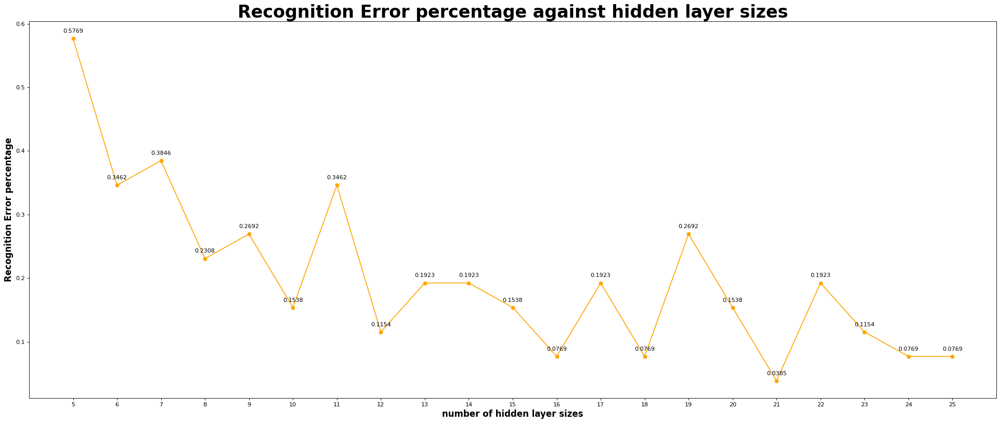

In [7]:
## plot the recognition error percentage against hidden layer sizes

layer_sizes = list(Recog_error_layer_size.keys())
rec_error = list(Recog_error_layer_size.values())
                  

plt.figure(figsize=(30, 12), dpi=80)

plt.plot(layer_sizes, rec_error, 'o-',color='orange',label=rec_error)
for x,y in zip(layer_sizes,rec_error):

    label = "{:.4f}".format(y)

    plt.annotate(label, 
                 (x,y), 
                 textcoords="offset points", 
                 xytext=(0,10), 
                 ha='center') 
plt.xlabel('number of hidden layer sizes',fontsize=15,fontweight ="bold")
plt.ylabel('Recognition Error percentage',fontsize=15,fontweight ="bold")
plt.xticks(np.arange(5,26), layer_sizes)
plt.title('Recognition Error percentage against hidden layer sizes',fontweight ="bold",fontsize=30)
plt.show()



In [9]:
## create a class to check the performance loss, stop training if the loss is less than 0.01

class performance_goal(cb):
    def __init__(self, monitor='loss', value=0.01, verbose=0):
        super(cb, self).__init__()
        self.monitor = monitor
        self.value = value
        self.verbose = verbose
        self.passes = 0

    def on_epoch_end(self, epoch, logs={}):
        current = logs.get(self.monitor)
        if current is None:
            warnings.warn("Early stopping requires %s available!" % self.monitor, RuntimeWarning)

        if current < self.value:
            self.passes+=1
            print(self.passes)
            if(self.passes==10):    
                if self.verbose > 0:
                    print("Epoch %05d: early stopping THR" % epoch)

                    self.model.stop_training = True

In [10]:
## using Adam optimizer with custom parameters

optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.95,
    beta_2=0.999,
    epsilon=0.1,
    amsgrad=False,
    name="Adam",
)
#initialize weights around 0.
initializer = tf.keras.initializers.RandomUniform(minval=-1., maxval=1.)

In [11]:
## comparision trainings
## 3-step training: model_partb, first train model with target letters(without noises), then with distorted letters(with noises)
##                  ,and finally train with target letters again.
## regular training: model_parta, only train model with target letters(without noises).

model_partb = keras.Sequential()
performance_goal = performance_goal()
model_partb.add(layers.Dense(15, activation="custom_activation",kernel_initializer=initializer, input_shape=(35,))) #hidden layer1
model_partb.add(layers.Dense(15, activation="custom_activation")) #hidden layer2
model_partb.add(layers.Dense(26,activation="softmax"))

model_partb.summary()
#model_partb.layers[1].get_weights()
model_partb.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy',metrics=['accuracy'])
#train network without noise for first time
history_partb_no_noise_1 = model_partb.fit(x_train,y_train,epochs=5000,batch_size=10)
#train network with noise and performance goal of 0.01 with 10 passes
history_partb_with_noise = model_partb.fit(x_train,y_train,epochs=5000,batch_size=10,callbacks=performance_goal)
#train network without noise for second time
history_partb_no_noise_2 = model_partb.fit(x_train,y_train,epochs=5000,batch_size=10)
        

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_63 (Dense)            (None, 15)                540       
                                                                 
 dense_64 (Dense)            (None, 15)                240       
                                                                 
 dense_65 (Dense)            (None, 26)                416       
                                                                 
Total params: 1,196
Trainable params: 1,196
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
3/3 [==============================] - 0s 6ms/step - loss: 4.6356 - accuracy: 0.0385
Epoch 2/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.6170 - accuracy: 0.0385
Epoch 3/5000
3/3 [==============================] - 0s 2ms/step - loss: 4.5966 - accuracy: 0.0385
Epoch 4/5000
3/3 [===

3/3 [==============================] - 0s 2ms/step - loss: 3.4185 - accuracy: 0.1154
Epoch 76/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.4125 - accuracy: 0.1154
Epoch 77/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4068 - accuracy: 0.1154
Epoch 78/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.4006 - accuracy: 0.1154
Epoch 79/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3938 - accuracy: 0.1154
Epoch 80/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3890 - accuracy: 0.1154
Epoch 81/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3832 - accuracy: 0.1154
Epoch 82/5000
3/3 [==============================] - 0s 3ms/step - loss: 3.3769 - accuracy: 0.1154
Epoch 83/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3722 - accuracy: 0.1154
Epoch 84/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.3659 - accuracy: 0.1154
Epoch 85/5000
3/3 [=====

3/3 [==============================] - 0s 9ms/step - loss: 3.0674 - accuracy: 0.1923
Epoch 158/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0638 - accuracy: 0.1923
Epoch 159/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0604 - accuracy: 0.1923
Epoch 160/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0569 - accuracy: 0.1923
Epoch 161/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0536 - accuracy: 0.1923
Epoch 162/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0504 - accuracy: 0.1923
Epoch 163/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0467 - accuracy: 0.1923
Epoch 164/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0436 - accuracy: 0.1923
Epoch 165/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0399 - accuracy: 0.1923
Epoch 166/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0367 - accuracy: 0.1923
Epoch 167/5000


3/3 [==============================] - 0s 2ms/step - loss: 2.7654 - accuracy: 0.2692
Epoch 240/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7611 - accuracy: 0.2692
Epoch 241/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7568 - accuracy: 0.2692
Epoch 242/5000
3/3 [==============================] - 0s 4ms/step - loss: 2.7528 - accuracy: 0.2692
Epoch 243/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7484 - accuracy: 0.2692
Epoch 244/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7441 - accuracy: 0.2692
Epoch 245/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7399 - accuracy: 0.2692
Epoch 246/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7358 - accuracy: 0.2692
Epoch 247/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7313 - accuracy: 0.2692
Epoch 248/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.7267 - accuracy: 0.2692
Epoch 249/5000


Epoch 321/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3592 - accuracy: 0.4231
Epoch 322/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3533 - accuracy: 0.4231
Epoch 323/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3477 - accuracy: 0.4231
Epoch 324/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3420 - accuracy: 0.4231
Epoch 325/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3360 - accuracy: 0.4231
Epoch 326/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3303 - accuracy: 0.4231
Epoch 327/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.3242 - accuracy: 0.4231
Epoch 328/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3184 - accuracy: 0.4231
Epoch 329/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3122 - accuracy: 0.4231
Epoch 330/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.3069 - accuracy: 0.4231


3/3 [==============================] - 0s 3ms/step - loss: 1.8382 - accuracy: 0.5385
Epoch 403/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8309 - accuracy: 0.5769
Epoch 404/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8240 - accuracy: 0.5769
Epoch 405/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8168 - accuracy: 0.6154
Epoch 406/5000
3/3 [==============================] - 0s 6ms/step - loss: 1.8101 - accuracy: 0.6154
Epoch 407/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.8029 - accuracy: 0.6154
Epoch 408/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7959 - accuracy: 0.6154
Epoch 409/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7891 - accuracy: 0.6538
Epoch 410/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7820 - accuracy: 0.6923
Epoch 411/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.7747 - accuracy: 0.6923
Epoch 412/5000


Epoch 484/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2720 - accuracy: 0.9231
Epoch 485/5000
3/3 [==============================] - 0s 5ms/step - loss: 1.2659 - accuracy: 0.9231
Epoch 486/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2594 - accuracy: 0.9231
Epoch 487/5000
3/3 [==============================] - 0s 3ms/step - loss: 1.2529 - accuracy: 0.9231
Epoch 488/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2465 - accuracy: 0.9231
Epoch 489/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2400 - accuracy: 0.9231
Epoch 490/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.2334 - accuracy: 0.9231
Epoch 491/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2272 - accuracy: 0.9231
Epoch 492/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2208 - accuracy: 0.9231
Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.2143 - accuracy: 0.9231


3/3 [==============================] - 0s 1ms/step - loss: 0.8118 - accuracy: 1.0000
Epoch 566/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.8073 - accuracy: 1.0000
Epoch 567/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.8023 - accuracy: 1.0000
Epoch 568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7977 - accuracy: 1.0000
Epoch 569/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7931 - accuracy: 1.0000
Epoch 570/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7881 - accuracy: 1.0000
Epoch 571/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7838 - accuracy: 1.0000
Epoch 572/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7792 - accuracy: 1.0000
Epoch 573/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7744 - accuracy: 1.0000
Epoch 574/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.7699 - accuracy: 1.0000
Epoch 575/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 1.0000
Epoch 648/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 1.0000
Epoch 649/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4932 - accuracy: 1.0000
Epoch 650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4903 - accuracy: 1.0000
Epoch 651/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4875 - accuracy: 1.0000
Epoch 652/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4843 - accuracy: 1.0000
Epoch 653/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 1.0000
Epoch 654/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4783 - accuracy: 1.0000
Epoch 655/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4758 - accuracy: 1.0000
Epoch 656/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 1.0000
Epoch 657/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.3112 - accuracy: 1.0000
Epoch 730/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3097 - accuracy: 1.0000
Epoch 731/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3080 - accuracy: 1.0000
Epoch 732/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3064 - accuracy: 1.0000
Epoch 733/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3045 - accuracy: 1.0000
Epoch 734/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3029 - accuracy: 1.0000
Epoch 735/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3015 - accuracy: 1.0000
Epoch 736/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2997 - accuracy: 1.0000
Epoch 737/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2984 - accuracy: 1.0000
Epoch 738/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.2967 - accuracy: 1.0000
Epoch 739/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.2026 - accuracy: 1.0000
Epoch 812/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2019 - accuracy: 1.0000
Epoch 813/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2008 - accuracy: 1.0000
Epoch 814/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1998 - accuracy: 1.0000
Epoch 815/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1989 - accuracy: 1.0000
Epoch 816/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1977 - accuracy: 1.0000
Epoch 817/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1968 - accuracy: 1.0000
Epoch 818/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1959 - accuracy: 1.0000
Epoch 819/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1950 - accuracy: 1.0000
Epoch 820/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 1.0000
Epoch 821/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.1388 - accuracy: 1.0000
Epoch 894/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1382 - accuracy: 1.0000
Epoch 895/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1379 - accuracy: 1.0000
Epoch 896/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1372 - accuracy: 1.0000
Epoch 897/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1367 - accuracy: 1.0000
Epoch 898/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1360 - accuracy: 1.0000
Epoch 899/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1355 - accuracy: 1.0000
Epoch 900/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1349 - accuracy: 1.0000
Epoch 901/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1342 - accuracy: 1.0000
Epoch 902/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1337 - accuracy: 1.0000
Epoch 903/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0996 - accuracy: 1.0000
Epoch 976/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0992 - accuracy: 1.0000
Epoch 977/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0989 - accuracy: 1.0000
Epoch 978/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0984 - accuracy: 1.0000
Epoch 979/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0980 - accuracy: 1.0000
Epoch 980/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0977 - accuracy: 1.0000
Epoch 981/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0973 - accuracy: 1.0000
Epoch 982/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0969 - accuracy: 1.0000
Epoch 983/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0966 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0962 - accuracy: 1.0000
Epoch 985/5000


3/3 [==============================] - 0s 6ms/step - loss: 0.0745 - accuracy: 1.0000
Epoch 1057/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0743 - accuracy: 1.0000
Epoch 1058/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0740 - accuracy: 1.0000
Epoch 1059/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0737 - accuracy: 1.0000
Epoch 1060/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0735 - accuracy: 1.0000
Epoch 1061/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0732 - accuracy: 1.0000
Epoch 1062/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0730 - accuracy: 1.0000
Epoch 1063/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0727 - accuracy: 1.0000
Epoch 1064/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0725 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0722 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 1.0000
Epoch 1137/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0575 - accuracy: 1.0000
Epoch 1138/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0573 - accuracy: 1.0000
Epoch 1139/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0571 - accuracy: 1.0000
Epoch 1140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 1141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 1142/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0566 - accuracy: 1.0000
Epoch 1143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0564 - accuracy: 1.0000
Epoch 1144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0563 - accuracy: 1.0000
Epoch 1145/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0561 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 1217/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0458 - accuracy: 1.0000
Epoch 1218/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0456 - accuracy: 1.0000
Epoch 1219/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 1220/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0454 - accuracy: 1.0000
Epoch 1221/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0453 - accuracy: 1.0000
Epoch 1222/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0452 - accuracy: 1.0000
Epoch 1223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0450 - accuracy: 1.0000
Epoch 1224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0450 - accuracy: 1.0000
Epoch 1225/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 1298/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 1299/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 1300/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 1301/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 1302/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 1303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 1304/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 1305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 1306/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0312 - accuracy: 1.0000
Epoch 1379/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 1380/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 1381/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0310 - accuracy: 1.0000
Epoch 1382/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 1383/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 1384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 1385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 1386/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 1460/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 1461/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 1462/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 1463/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 1464/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 1466/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 1467/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0227 - accuracy: 1.0000
Epoch 1541/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 1542/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 1543/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 1544/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 1545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 1546/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 1621/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 1622/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 1623/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 1624/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 1702/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 1703/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1704/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1783/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1784/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1785/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1786/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 1790/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 1791/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1864/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1865/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1866/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1868/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1869/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1870/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1871/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 1872/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 1945/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1946/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1947/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1948/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1949/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1950/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1951/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 1952/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 1953/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 2026/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 2027/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 2028/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 2029/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 2030/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 2031/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 2032/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 2033/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 2034/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2106/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2107/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2108/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2109/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2110/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2111/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2112/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2113/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 2114/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2187/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2188/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2189/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2190/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2191/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2192/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 2193/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 2194/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 2195/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 2268/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 2269/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2270/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2272/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2273/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2274/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2275/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2276/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2349/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2350/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2351/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2352/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2354/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2355/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2356/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2357/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2430/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2431/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2432/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2433/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2436/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2437/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2438/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 6ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2511/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2512/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2513/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2515/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2517/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2518/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 2519/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 11ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2591/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2592/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2593/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2594/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2595/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2596/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2597/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2598/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 2599/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2671/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2672/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2673/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2674/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2675/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2676/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2677/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2678/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 2679/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 2752/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2753/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2754/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2755/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2756/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2757/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2758/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2833/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2834/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2835/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2836/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2837/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2914/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2915/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2916/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2917/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2918/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2920/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2921/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2922/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2995/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2996/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2997/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2998/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2999/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3000/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3001/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3003/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3076/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3077/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3078/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3079/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3080/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3081/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3082/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3083/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3084/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3157/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3158/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3159/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3160/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3161/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3162/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3163/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3164/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3165/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3238/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3239/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3240/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3241/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3242/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3243/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3244/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3245/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3246/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3319/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3320/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3321/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3322/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3323/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3324/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3325/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3326/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3400/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3401/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3402/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3403/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3404/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3481/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3482/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3483/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3484/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3489/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3562/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3565/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3566/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3567/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3570/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3643/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3644/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3645/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3646/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3647/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3648/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3649/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3651/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3724/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3725/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3726/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3727/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3728/5000
3/3 [==============================] - 0s 12ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3729/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3732/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3805/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3806/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3807/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3808/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3810/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3812/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3813/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3886/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3887/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3888/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3889/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3890/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3891/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3894/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3967/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3968/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3969/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3970/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3972/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3973/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3974/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3975/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4048/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4049/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4050/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4051/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4052/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4053/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4054/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4055/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4056/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4129/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4130/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4131/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4132/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4133/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4134/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4135/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4136/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4137/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4210/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4211/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4212/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4213/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4214/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4215/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4216/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4217/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4218/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4291/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4292/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4293/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4294/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4295/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4296/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4297/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4298/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4299/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 7ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4371/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4372/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4373/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4374/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4375/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4376/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4377/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4378/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4379/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4452/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4453/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4454/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4455/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4456/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4457/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4458/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4459/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4460/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4533/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4534/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4535/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4536/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4537/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4538/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4539/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4540/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4541/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4614/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4615/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4616/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4617/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4618/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4619/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4620/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4621/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 6ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4695/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4696/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4697/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4698/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4699/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4701/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4702/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4703/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4776/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4777/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4778/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4779/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4780/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4781/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4782/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4783/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4784/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4857/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4858/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4859/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4860/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4861/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4862/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 4865/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4937/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4938/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4939/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4940/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4941/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4942/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4943/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4944/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 1/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 2/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 3/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 4/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 5/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 6/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 7/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 8/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 10/5000
3/3 [==============

3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 83/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 84/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 85/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 86/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 87/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 88/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 89/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 90/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 91/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 92/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 165/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 166/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 167/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 168/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 169/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 170/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 171/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 172/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 173/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 174/5000


3/3 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 247/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 248/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 249/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 250/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 251/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 252/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 253/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 254/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 255/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 256/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 329/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 330/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 331/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 332/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 333/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 334/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 335/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 336/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 337/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 338/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 411/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 413/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 414/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 415/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 416/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 417/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 418/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 419/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 420/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 494/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 495/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 496/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 497/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 498/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 499/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 500/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 501/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 502/5000


Epoch 574/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 575/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 576/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 577/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 578/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 579/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 580/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 581/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 582/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 583/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 656/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 657/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 658/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 659/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 660/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 661/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 662/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 663/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 664/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 665/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 738/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 739/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 740/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 741/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 742/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 743/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 744/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 745/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 746/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 747/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 820/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 821/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 822/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 823/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 824/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 825/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 826/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 827/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 828/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 829/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 902/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 903/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 904/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 905/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 906/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 907/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 908/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 909/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 910/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 911/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 985/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 986/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 987/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 988/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 989/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 990/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 991/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 992/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 993/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1066/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1067/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1068/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1069/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1070/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1071/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1072/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1073/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1147/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1148/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1149/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1150/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1151/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1152/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1153/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1154/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1227/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1228/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1229/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1230/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1231/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1232/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1233/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1234/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 1235/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1309/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1310/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1311/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1312/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1313/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1314/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1315/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1316/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1390/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1391/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1392/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1393/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1394/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1395/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1396/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1397/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1471/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1472/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1473/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1474/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1475/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1476/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1477/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1478/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1552/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1553/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1554/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1555/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1556/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1557/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1558/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 1559/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1633/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1634/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1635/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1636/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1637/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1638/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1639/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1640/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1714/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1715/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1716/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1717/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1718/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1719/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1720/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1721/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1794/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1795/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1796/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1797/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1798/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1799/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1800/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1801/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1802/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1875/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1876/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1877/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1878/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1879/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1880/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1881/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1882/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1883/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1956/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1957/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1958/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1959/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1960/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1961/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1962/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1963/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 1964/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2037/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2038/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2039/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2040/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2041/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2042/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2043/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2044/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2045/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2118/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2119/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2120/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2121/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2122/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2123/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2124/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2125/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2126/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2199/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2200/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2201/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2202/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2203/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2204/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2205/5000
3/3 [==============================] - 0s 9ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2206/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2207/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2280/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2281/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2282/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2283/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2284/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2285/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2286/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2287/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2288/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2361/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2362/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2363/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2364/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2365/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2366/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2367/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2368/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 2369/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2442/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2443/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2444/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2445/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2446/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2447/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2448/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2449/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2450/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2523/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2524/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2525/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2526/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2527/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2528/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2529/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2530/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2531/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2604/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2605/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2606/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2607/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2608/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2609/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2610/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2611/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2612/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2685/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2686/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2687/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2688/5000
3/3 [==============================] - 0s 14ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2689/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2690/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2691/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2692/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2765/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2766/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2767/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2768/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2769/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2770/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2771/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2772/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2773/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2846/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2847/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2848/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2849/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2850/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2851/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2852/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2853/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 2854/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2927/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2928/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2929/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2930/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2931/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2932/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2933/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2934/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 2935/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3008/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3009/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3010/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3011/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3012/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3013/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3014/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3015/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3016/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3089/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3090/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3091/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3092/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3093/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3094/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3095/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3096/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3097/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3170/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3171/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3172/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3173/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3174/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3175/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3176/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3177/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 3178/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 9.9169e-04 - accuracy: 1.0000
Epoch 3249/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9155e-04 - accuracy: 1.0000
Epoch 3250/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9135e-04 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9120e-04 - accuracy: 1.0000
Epoch 3252/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9100e-04 - accuracy: 1.0000
Epoch 3253/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9084e-04 - accuracy: 1.0000
Epoch 3254/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9066e-04 - accuracy: 1.0000
Epoch 3255/5000
3/3 [==============================] - 0s 4ms/step - loss: 9.9053e-04 - accuracy: 1.0000
Epoch 3256/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.9031e-04 - accuracy: 1.0000
Epoch 3257/5000
3/3 [==============================] - 0s 3ms/step - lo

3/3 [==============================] - 0s 4ms/step - loss: 9.7888e-04 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7877e-04 - accuracy: 1.0000
Epoch 3328/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7855e-04 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.7843e-04 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7824e-04 - accuracy: 1.0000
Epoch 3331/5000
3/3 [==============================] - 0s 5ms/step - loss: 9.7807e-04 - accuracy: 1.0000
Epoch 3332/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7793e-04 - accuracy: 1.0000
Epoch 3333/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7774e-04 - accuracy: 1.0000
Epoch 3334/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.7757e-04 - accuracy: 1.0000
Epoch 3335/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.6644e-04 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6625e-04 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6614e-04 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 6ms/step - loss: 9.6595e-04 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6579e-04 - accuracy: 1.0000
Epoch 3409/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6567e-04 - accuracy: 1.0000
Epoch 3410/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6548e-04 - accuracy: 1.0000
Epoch 3411/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6530e-04 - accuracy: 1.0000
Epoch 3412/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.6515e-04 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.5424e-04 - accuracy: 1.0000
Epoch 3483/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5407e-04 - accuracy: 1.0000
Epoch 3484/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5391e-04 - accuracy: 1.0000
Epoch 3485/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5376e-04 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5362e-04 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5342e-04 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5328e-04 - accuracy: 1.0000
Epoch 3489/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5310e-04 - accuracy: 1.0000
Epoch 3490/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.5295e-04 - accuracy: 1.0000
Epoch 3491/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.4233e-04 - accuracy: 1.0000
Epoch 3561/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4217e-04 - accuracy: 1.0000
Epoch 3562/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4203e-04 - accuracy: 1.0000
Epoch 3563/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4189e-04 - accuracy: 1.0000
Epoch 3564/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4174e-04 - accuracy: 1.0000
Epoch 3565/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4159e-04 - accuracy: 1.0000
Epoch 3566/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4142e-04 - accuracy: 1.0000
Epoch 3567/5000
3/3 [==============================] - 0s 3ms/step - loss: 9.4128e-04 - accuracy: 1.0000
Epoch 3568/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.4111e-04 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.3074e-04 - accuracy: 1.0000
Epoch 3639/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3059e-04 - accuracy: 1.0000
Epoch 3640/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3042e-04 - accuracy: 1.0000
Epoch 3641/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3030e-04 - accuracy: 1.0000
Epoch 3642/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.3015e-04 - accuracy: 1.0000
Epoch 3643/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2998e-04 - accuracy: 1.0000
Epoch 3644/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2985e-04 - accuracy: 1.0000
Epoch 3645/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2973e-04 - accuracy: 1.0000
Epoch 3646/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.2955e-04 - accuracy: 1.0000
Epoch 3647/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 9.1941e-04 - accuracy: 1.0000
Epoch 3717/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1922e-04 - accuracy: 1.0000
Epoch 3718/5000
3/3 [==============================] - 0s 10ms/step - loss: 9.1909e-04 - accuracy: 1.0000
Epoch 3719/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1895e-04 - accuracy: 1.0000
Epoch 3720/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1880e-04 - accuracy: 1.0000
Epoch 3721/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1868e-04 - accuracy: 1.0000
Epoch 3722/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1853e-04 - accuracy: 1.0000
Epoch 3723/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1836e-04 - accuracy: 1.0000
Epoch 3724/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.1822e-04 - accuracy: 1.0000
Epoch 3725/5000
3/3 [==============================] - 0s 2ms/step - l

3/3 [==============================] - 0s 2ms/step - loss: 9.0829e-04 - accuracy: 1.0000
Epoch 3795/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0814e-04 - accuracy: 1.0000
Epoch 3796/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.0799e-04 - accuracy: 1.0000
Epoch 3797/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0785e-04 - accuracy: 1.0000
Epoch 3798/5000
3/3 [==============================] - 0s 1ms/step - loss: 9.0772e-04 - accuracy: 1.0000
Epoch 3799/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0756e-04 - accuracy: 1.0000
Epoch 3800/5000
3/3 [==============================] - 0s 6ms/step - loss: 9.0743e-04 - accuracy: 1.0000
Epoch 3801/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0729e-04 - accuracy: 1.0000
Epoch 3802/5000
3/3 [==============================] - 0s 2ms/step - loss: 9.0718e-04 - accuracy: 1.0000
Epoch 3803/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.9742e-04 - accuracy: 1.0000
Epoch 3873/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9727e-04 - accuracy: 1.0000
Epoch 3874/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.9717e-04 - accuracy: 1.0000
Epoch 3875/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9703e-04 - accuracy: 1.0000
Epoch 3876/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9687e-04 - accuracy: 1.0000
Epoch 3877/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9673e-04 - accuracy: 1.0000
Epoch 3878/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9661e-04 - accuracy: 1.0000
Epoch 3879/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9645e-04 - accuracy: 1.0000
Epoch 3880/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.9631e-04 - accuracy: 1.0000
Epoch 3881/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.8679e-04 - accuracy: 1.0000
Epoch 3951/5000
3/3 [==============================] - 0s 6ms/step - loss: 8.8665e-04 - accuracy: 1.0000
Epoch 3952/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.8654e-04 - accuracy: 1.0000
Epoch 3953/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8641e-04 - accuracy: 1.0000
Epoch 3954/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8628e-04 - accuracy: 1.0000
Epoch 3955/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8614e-04 - accuracy: 1.0000
Epoch 3956/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.8600e-04 - accuracy: 1.0000
Epoch 3957/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8587e-04 - accuracy: 1.0000
Epoch 3958/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.8571e-04 - accuracy: 1.0000
Epoch 3959/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.7643e-04 - accuracy: 1.0000
Epoch 4029/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7626e-04 - accuracy: 1.0000
Epoch 4030/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7615e-04 - accuracy: 1.0000
Epoch 4031/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7599e-04 - accuracy: 1.0000
Epoch 4032/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7587e-04 - accuracy: 1.0000
Epoch 4033/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7573e-04 - accuracy: 1.0000
Epoch 4034/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7561e-04 - accuracy: 1.0000
Epoch 4035/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7547e-04 - accuracy: 1.0000
Epoch 4036/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.7534e-04 - accuracy: 1.0000
Epoch 4037/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.6628e-04 - accuracy: 1.0000
Epoch 4107/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.6614e-04 - accuracy: 1.0000
Epoch 4108/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6598e-04 - accuracy: 1.0000
Epoch 4109/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6586e-04 - accuracy: 1.0000
Epoch 4110/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6575e-04 - accuracy: 1.0000
Epoch 4111/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6562e-04 - accuracy: 1.0000
Epoch 4112/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.6549e-04 - accuracy: 1.0000
Epoch 4113/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6537e-04 - accuracy: 1.0000
Epoch 4114/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.6524e-04 - accuracy: 1.0000
Epoch 4115/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.5634e-04 - accuracy: 1.0000
Epoch 4185/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5622e-04 - accuracy: 1.0000
Epoch 4186/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5612e-04 - accuracy: 1.0000
Epoch 4187/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5596e-04 - accuracy: 1.0000
Epoch 4188/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5582e-04 - accuracy: 1.0000
Epoch 4189/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5569e-04 - accuracy: 1.0000
Epoch 4190/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5558e-04 - accuracy: 1.0000
Epoch 4191/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5544e-04 - accuracy: 1.0000
Epoch 4192/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.5533e-04 - accuracy: 1.0000
Epoch 4193/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.4674e-04 - accuracy: 1.0000
Epoch 4262/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4663e-04 - accuracy: 1.0000
Epoch 4263/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4648e-04 - accuracy: 1.0000
Epoch 4264/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4635e-04 - accuracy: 1.0000
Epoch 4265/5000
3/3 [==============================] - 0s 5ms/step - loss: 8.4625e-04 - accuracy: 1.0000
Epoch 4266/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4612e-04 - accuracy: 1.0000
Epoch 4267/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4600e-04 - accuracy: 1.0000
Epoch 4268/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4587e-04 - accuracy: 1.0000
Epoch 4269/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.4575e-04 - accuracy: 1.0000
Epoch 4270/5000
3/3 [==============================] - 0s 5ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.3721e-04 - accuracy: 1.0000
Epoch 4340/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3711e-04 - accuracy: 1.0000
Epoch 4341/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3696e-04 - accuracy: 1.0000
Epoch 4342/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3685e-04 - accuracy: 1.0000
Epoch 4343/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3674e-04 - accuracy: 1.0000
Epoch 4344/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3659e-04 - accuracy: 1.0000
Epoch 4345/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3647e-04 - accuracy: 1.0000
Epoch 4346/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3638e-04 - accuracy: 1.0000
Epoch 4347/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.3625e-04 - accuracy: 1.0000
Epoch 4348/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.2787e-04 - accuracy: 1.0000
Epoch 4418/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2772e-04 - accuracy: 1.0000
Epoch 4419/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2761e-04 - accuracy: 1.0000
Epoch 4420/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2748e-04 - accuracy: 1.0000
Epoch 4421/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2737e-04 - accuracy: 1.0000
Epoch 4422/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2727e-04 - accuracy: 1.0000
Epoch 4423/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2712e-04 - accuracy: 1.0000
Epoch 4424/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2704e-04 - accuracy: 1.0000
Epoch 4425/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.2688e-04 - accuracy: 1.0000
Epoch 4426/5000
3/3 [==============================] - 0s 4ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.1872e-04 - accuracy: 1.0000
Epoch 4496/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.1861e-04 - accuracy: 1.0000
Epoch 4497/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1848e-04 - accuracy: 1.0000
Epoch 4498/5000
3/3 [==============================] - 0s 1ms/step - loss: 8.1833e-04 - accuracy: 1.0000
Epoch 4499/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1824e-04 - accuracy: 1.0000
Epoch 4500/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1811e-04 - accuracy: 1.0000
Epoch 4501/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1801e-04 - accuracy: 1.0000
Epoch 4502/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.1788e-04 - accuracy: 1.0000
Epoch 4503/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.1775e-04 - accuracy: 1.0000
Epoch 4504/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0978e-04 - accuracy: 1.0000
Epoch 4574/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0962e-04 - accuracy: 1.0000
Epoch 4575/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0951e-04 - accuracy: 1.0000
Epoch 4576/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0940e-04 - accuracy: 1.0000
Epoch 4577/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0929e-04 - accuracy: 1.0000
Epoch 4578/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.0915e-04 - accuracy: 1.0000
Epoch 4579/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0907e-04 - accuracy: 1.0000
Epoch 4580/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.0898e-04 - accuracy: 1.0000
Epoch 4581/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0882e-04 - accuracy: 1.0000
Epoch 4582/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 8.0099e-04 - accuracy: 1.0000
Epoch 4652/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0089e-04 - accuracy: 1.0000
Epoch 4653/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0079e-04 - accuracy: 1.0000
Epoch 4654/5000
3/3 [==============================] - 0s 6ms/step - loss: 8.0068e-04 - accuracy: 1.0000
Epoch 4655/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0055e-04 - accuracy: 1.0000
Epoch 4656/5000
3/3 [==============================] - 0s 3ms/step - loss: 8.0045e-04 - accuracy: 1.0000
Epoch 4657/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0035e-04 - accuracy: 1.0000
Epoch 4658/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0024e-04 - accuracy: 1.0000
Epoch 4659/5000
3/3 [==============================] - 0s 2ms/step - loss: 8.0014e-04 - accuracy: 1.0000
Epoch 4660/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.9240e-04 - accuracy: 1.0000
Epoch 4730/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.9227e-04 - accuracy: 1.0000
Epoch 4731/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9218e-04 - accuracy: 1.0000
Epoch 4732/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9209e-04 - accuracy: 1.0000
Epoch 4733/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9197e-04 - accuracy: 1.0000
Epoch 4734/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9185e-04 - accuracy: 1.0000
Epoch 4735/5000
3/3 [==============================] - 0s 3ms/step - loss: 7.9175e-04 - accuracy: 1.0000
Epoch 4736/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9163e-04 - accuracy: 1.0000
Epoch 4737/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.9155e-04 - accuracy: 1.0000
Epoch 4738/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.8399e-04 - accuracy: 1.0000
Epoch 4808/5000
3/3 [==============================] - 0s 1ms/step - loss: 7.8389e-04 - accuracy: 1.0000
Epoch 4809/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8377e-04 - accuracy: 1.0000
Epoch 4810/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8365e-04 - accuracy: 1.0000
Epoch 4811/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8357e-04 - accuracy: 1.0000
Epoch 4812/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8343e-04 - accuracy: 1.0000
Epoch 4813/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8331e-04 - accuracy: 1.0000
Epoch 4814/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8322e-04 - accuracy: 1.0000
Epoch 4815/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.8314e-04 - accuracy: 1.0000
Epoch 4816/5000
3/3 [==============================] - 0s 2ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.7584e-04 - accuracy: 1.0000
Epoch 4885/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7573e-04 - accuracy: 1.0000
Epoch 4886/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7564e-04 - accuracy: 1.0000
Epoch 4887/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7555e-04 - accuracy: 1.0000
Epoch 4888/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7544e-04 - accuracy: 1.0000
Epoch 4889/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7533e-04 - accuracy: 1.0000
Epoch 4890/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7521e-04 - accuracy: 1.0000
Epoch 4891/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7510e-04 - accuracy: 1.0000
Epoch 4892/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.7499e-04 - accuracy: 1.0000
Epoch 4893/5000
3/3 [==============================] - 0s 4ms/step - lo

3/3 [==============================] - 0s 2ms/step - loss: 7.6776e-04 - accuracy: 1.0000
Epoch 4963/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6763e-04 - accuracy: 1.0000
Epoch 4964/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6756e-04 - accuracy: 1.0000
Epoch 4965/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6745e-04 - accuracy: 1.0000
Epoch 4966/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6734e-04 - accuracy: 1.0000
Epoch 4967/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6723e-04 - accuracy: 1.0000
Epoch 4968/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6713e-04 - accuracy: 1.0000
Epoch 4969/5000
3/3 [==============================] - 0s 2ms/step - loss: 7.6703e-04 - accuracy: 1.0000
Epoch 4970/5000
3/3 [==============================] - 0s 5ms/step - loss: 7.6691e-04 - accuracy: 1.0000
Epoch 4971/5000
3/3 [==============================] - 0s 2ms/step - lo

Text(0.5, 1.0, 'Training Errors with 3 steps training')

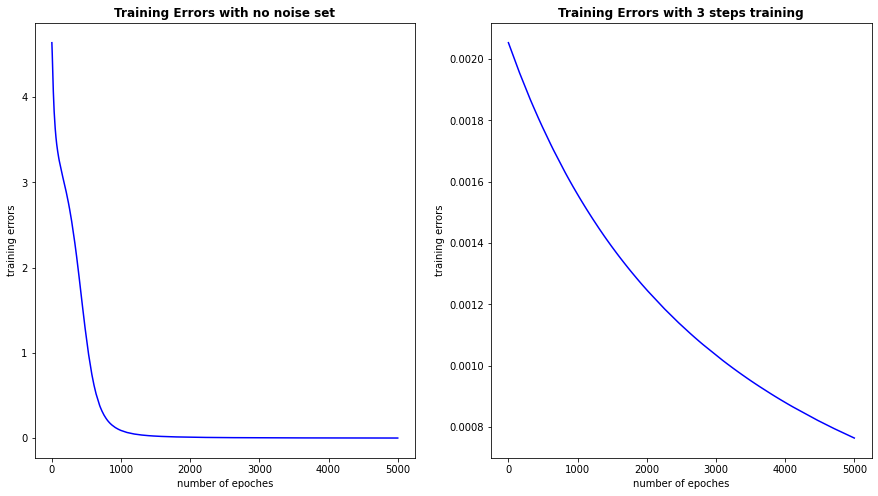

In [12]:
## plot the training errors comparison of two training methods 

fig_b, (ax_b_no_noise,ax_b_3_steps) = plt.subplots(1,2,figsize=(15, 8))
epoches_no_noise = np.arange(1,len(history_partb_no_noise_1.history['loss'])+1)
epoches_3_steps = np.arange(1,len(history_partb_no_noise_2.history['loss'])+1)
no_noise = ax_b_no_noise.plot(epoches_no_noise, history_partb_no_noise_1.history['loss'], '-',color='blue')
three_steps = ax_b_3_steps.plot(epoches_3_steps, history_partb_no_noise_2.history['loss'], '-',color='blue')
#fig_b.suptitle('Training Errors',fontweight ="bold")
ax_b_no_noise.set_xlabel('number of epoches')
ax_b_no_noise.set_ylabel('training errors')
ax_b_no_noise.set_title('Training Errors with no noise set',fontweight ="bold")
ax_b_3_steps.set_xlabel('number of epoches')
ax_b_3_steps.set_ylabel('training errors')
ax_b_3_steps.set_title('Training Errors with 3 steps training',fontweight ="bold")



In [13]:
#creating test examples with from one to three randomly flipped letters

def FlipOne(x):
    letter = lookup_table[x]
    r = random.randint(0,6)
    c = random.randint(0,4)
    if(letter[r][c]==0):
        letter[r][c]=1
    else:
        letter[r][c]=0
    return letter

    
def FlipTwo(x):
    letter = lookup_table[x]
    for i in range(2):
        r = random.randint(0,6)
        c = random.randint(0,4)
        if(letter[r][c]==0):
            letter[r][c]=1
        else:
            letter[r][c]=0
    return letter

    
def FlipThree(x):
    letter = lookup_table[x]
    for i in range(3):
        r = random.randint(0,6)
        c = random.randint(0,4)
        if(letter[r][c]==0):
            letter[r][c]=1
        else:
            letter[r][c]=0
    return letter

#FlipThree(24)

In [14]:
##randomly create 100 test sets for flip 0 bits
x_test_0 = []
y_test_0 = []
for i in range(100):
    l = random.randint(0,25)
    y_test_0.append(l)
for j in y_test_0:
    x_test_0.append(lookup_table[j].flatten())
    
x_test_0 = np.array(x_test_0)
y_test_0 = np.array(y_test_0)

##randomly create 100 test sets for flip 1 bits
x_test_1 = []
y_test_1 = []
for i in range(100):
    l = random.randint(0,25)
    y_test_1.append(l)
for j in y_test_1:
    n = FlipOne(j)
    x_test_1.append(n.flatten())
    
x_test_1 = np.array(x_test_1)
y_test_1 = np.array(y_test_1)

##randomly create 100 test sets for flip 2 bits
x_test_2 = []
y_test_2 = []
for i in range(100):
    l = random.randint(0,25)
    y_test_2.append(l)
for j in y_test_2:
    n = FlipTwo(j)
    x_test_2.append(n.flatten())
    
x_test_2 = np.array(x_test_2)
y_test_2 = np.array(y_test_2)

##randomly create 100 test sets for flip 3 bits
x_test_3 = []
y_test_3 = []
for i in range(100):
    l = random.randint(0,25)
    y_test_3.append(l)
for j in y_test_3:
    n = FlipThree(j)
    x_test_3.append(n.flatten())
    
x_test_3 = np.array(x_test_3)
y_test_3 = np.array(y_test_3)









In [15]:
## traing with only target letters and predict random generated 0-bit to 3-bits distorted letters

#initialize weights around 0.
initializer = tf.keras.initializers.RandomUniform(minval=-1., maxval=1.)

model_partc = keras.Sequential()
model_partc.add(layers.Dense(15, activation="custom_activation",kernel_initializer=initializer, input_shape=(35,))) #hidden layer1
#model_partc.add(layers.Dense(15, activation="custom_activation",input_shape=(35,)))
model_partc.add(layers.Dense(15, activation="custom_activation")) #hidden layer2
model_partc.add(layers.Dense(26,activation="softmax"))

model_partc.summary()
#model_partb.layers[1].get_weights()
model_partc.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy',metrics=['accuracy'])
history_partc_without_noise = model_partc.fit(x_train,y_train,epochs=5000,batch_size=10)

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_66 (Dense)            (None, 15)                540       
                                                                 
 dense_67 (Dense)            (None, 15)                240       
                                                                 
 dense_68 (Dense)            (None, 26)                416       
                                                                 
Total params: 1,196
Trainable params: 1,196
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.6537 - accuracy: 0.0385
Epoch 2/5000
3/3 [==============================] - 0s 1ms/step - loss: 3.6436 - accuracy: 0.0385
Epoch 3/5000
3/3 [==============================] - 0s 5ms/step - loss: 3.6275 - accuracy: 0.0385
Epoch 4/5000
3/3 [===

3/3 [==============================] - 0s 2ms/step - loss: 3.0213 - accuracy: 0.0769
Epoch 76/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0176 - accuracy: 0.0769
Epoch 77/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0137 - accuracy: 0.0769
Epoch 78/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0097 - accuracy: 0.0769
Epoch 79/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0061 - accuracy: 0.0769
Epoch 80/5000
3/3 [==============================] - 0s 2ms/step - loss: 3.0022 - accuracy: 0.0769
Epoch 81/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9984 - accuracy: 0.0769
Epoch 82/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9947 - accuracy: 0.0769
Epoch 83/5000
3/3 [==============================] - 0s 3ms/step - loss: 2.9906 - accuracy: 0.0769
Epoch 84/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.9867 - accuracy: 0.0769
Epoch 85/5000
3/3 [=====

3/3 [==============================] - 0s 2ms/step - loss: 2.6404 - accuracy: 0.3462
Epoch 158/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6348 - accuracy: 0.3462
Epoch 159/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6289 - accuracy: 0.3462
Epoch 160/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6230 - accuracy: 0.3462
Epoch 161/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6172 - accuracy: 0.3462
Epoch 162/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6115 - accuracy: 0.3462
Epoch 163/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.6053 - accuracy: 0.3462
Epoch 164/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5993 - accuracy: 0.3462
Epoch 165/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5932 - accuracy: 0.3462
Epoch 166/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.5873 - accuracy: 0.3462
Epoch 167/5000


3/3 [==============================] - 0s 2ms/step - loss: 2.0788 - accuracy: 0.3846
Epoch 240/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0713 - accuracy: 0.4231
Epoch 241/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0639 - accuracy: 0.4231
Epoch 242/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0565 - accuracy: 0.4231
Epoch 243/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0489 - accuracy: 0.4231
Epoch 244/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0409 - accuracy: 0.4231
Epoch 245/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0337 - accuracy: 0.4615
Epoch 246/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0260 - accuracy: 0.4615
Epoch 247/5000
3/3 [==============================] - 0s 2ms/step - loss: 2.0184 - accuracy: 0.5000
Epoch 248/5000
3/3 [==============================] - 0s 1ms/step - loss: 2.0103 - accuracy: 0.5000
Epoch 249/5000


3/3 [==============================] - 0s 2ms/step - loss: 1.4751 - accuracy: 0.7308
Epoch 322/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4682 - accuracy: 0.7308
Epoch 323/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4610 - accuracy: 0.7308
Epoch 324/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4546 - accuracy: 0.7308
Epoch 325/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4476 - accuracy: 0.7308
Epoch 326/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4410 - accuracy: 0.6923
Epoch 327/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4340 - accuracy: 0.7308
Epoch 328/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4274 - accuracy: 0.7308
Epoch 329/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4205 - accuracy: 0.7308
Epoch 330/5000
3/3 [==============================] - 0s 2ms/step - loss: 1.4145 - accuracy: 0.7308
Epoch 331/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.9851 - accuracy: 0.8462
Epoch 404/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9800 - accuracy: 0.8462
Epoch 405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9748 - accuracy: 0.8462
Epoch 406/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9694 - accuracy: 0.8462
Epoch 407/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9644 - accuracy: 0.8462
Epoch 408/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.9598 - accuracy: 0.8462
Epoch 409/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.9546 - accuracy: 0.8846
Epoch 410/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9496 - accuracy: 0.9231
Epoch 411/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.9452 - accuracy: 0.9231
Epoch 412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.9397 - accuracy: 0.9231
Epoch 413/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 1.0000
Epoch 486/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6312 - accuracy: 1.0000
Epoch 487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6278 - accuracy: 1.0000
Epoch 488/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6248 - accuracy: 1.0000
Epoch 489/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6210 - accuracy: 1.0000
Epoch 490/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6176 - accuracy: 1.0000
Epoch 491/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 1.0000
Epoch 492/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 1.0000
Epoch 493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.6077 - accuracy: 1.0000
Epoch 494/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 1.0000
Epoch 495/5000


Epoch 567/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 1.0000
Epoch 568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.4006 - accuracy: 1.0000
Epoch 569/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3984 - accuracy: 1.0000
Epoch 570/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3964 - accuracy: 1.0000
Epoch 571/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3940 - accuracy: 1.0000
Epoch 572/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3920 - accuracy: 1.0000
Epoch 573/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.3897 - accuracy: 1.0000
Epoch 574/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3876 - accuracy: 1.0000
Epoch 575/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 1.0000
Epoch 576/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 1.0000


3/3 [==============================] - 0s 2ms/step - loss: 0.2618 - accuracy: 1.0000
Epoch 649/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2606 - accuracy: 1.0000
Epoch 650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2592 - accuracy: 1.0000
Epoch 651/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2581 - accuracy: 1.0000
Epoch 652/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2568 - accuracy: 1.0000
Epoch 653/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.2553 - accuracy: 1.0000
Epoch 654/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2541 - accuracy: 1.0000
Epoch 655/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2529 - accuracy: 1.0000
Epoch 656/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2515 - accuracy: 1.0000
Epoch 657/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 1.0000
Epoch 658/5000


Epoch 730/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1775 - accuracy: 1.0000
Epoch 731/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1767 - accuracy: 1.0000
Epoch 732/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1758 - accuracy: 1.0000
Epoch 733/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1751 - accuracy: 1.0000
Epoch 734/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1744 - accuracy: 1.0000
Epoch 735/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1734 - accuracy: 1.0000
Epoch 736/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.1730 - accuracy: 1.0000
Epoch 737/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1720 - accuracy: 1.0000
Epoch 738/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1712 - accuracy: 1.0000
Epoch 739/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1705 - accuracy: 1.0000


3/3 [==============================] - 0s 3ms/step - loss: 0.1265 - accuracy: 1.0000
Epoch 812/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1259 - accuracy: 1.0000
Epoch 813/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1255 - accuracy: 1.0000
Epoch 814/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1250 - accuracy: 1.0000
Epoch 815/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1245 - accuracy: 1.0000
Epoch 816/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1241 - accuracy: 1.0000
Epoch 817/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1235 - accuracy: 1.0000
Epoch 818/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.1231 - accuracy: 1.0000
Epoch 819/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1225 - accuracy: 1.0000
Epoch 820/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.1222 - accuracy: 1.0000
Epoch 821/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0938 - accuracy: 1.0000
Epoch 894/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0935 - accuracy: 1.0000
Epoch 895/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0931 - accuracy: 1.0000
Epoch 896/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0929 - accuracy: 1.0000
Epoch 897/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0926 - accuracy: 1.0000
Epoch 898/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0922 - accuracy: 1.0000
Epoch 899/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0919 - accuracy: 1.0000
Epoch 900/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0916 - accuracy: 1.0000
Epoch 901/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0913 - accuracy: 1.0000
Epoch 902/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0910 - accuracy: 1.0000
Epoch 903/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0724 - accuracy: 1.0000
Epoch 976/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0722 - accuracy: 1.0000
Epoch 977/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0720 - accuracy: 1.0000
Epoch 978/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0718 - accuracy: 1.0000
Epoch 979/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0716 - accuracy: 1.0000
Epoch 980/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0713 - accuracy: 1.0000
Epoch 981/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0711 - accuracy: 1.0000
Epoch 982/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0709 - accuracy: 1.0000
Epoch 983/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0707 - accuracy: 1.0000
Epoch 984/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0706 - accuracy: 1.0000
Epoch 985/5000


3/3 [==============================] - 0s 2ms/step - loss: 0.0578 - accuracy: 1.0000
Epoch 1057/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0576 - accuracy: 1.0000
Epoch 1058/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0575 - accuracy: 1.0000
Epoch 1059/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0573 - accuracy: 1.0000
Epoch 1060/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0572 - accuracy: 1.0000
Epoch 1061/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 1062/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0569 - accuracy: 1.0000
Epoch 1063/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0567 - accuracy: 1.0000
Epoch 1064/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0566 - accuracy: 1.0000
Epoch 1065/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0564 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 1.0000
Epoch 1138/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0472 - accuracy: 1.0000
Epoch 1139/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 1140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0470 - accuracy: 1.0000
Epoch 1141/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0469 - accuracy: 1.0000
Epoch 1142/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 1143/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0466 - accuracy: 1.0000
Epoch 1144/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0465 - accuracy: 1.0000
Epoch 1145/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0464 - accuracy: 1.0000
Epoch 1146/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 1219/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 1220/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 1221/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 1222/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 1223/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 1224/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 1225/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 1226/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 1227/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0333 - accuracy: 1.0000
Epoch 1300/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 1301/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 1302/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 1303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0330 - accuracy: 1.0000
Epoch 1304/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 1305/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 1306/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 1307/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 1308/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0327 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 1381/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 1382/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 1383/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 1384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0284 - accuracy: 1.0000
Epoch 1385/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0283 - accuracy: 1.0000
Epoch 1386/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0283 - accuracy: 1.0000
Epoch 1387/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 1388/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 1389/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 1462/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 1463/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 1464/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 1465/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 1466/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 1467/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 1468/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 1469/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 1470/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 1543/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 1544/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 1545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 1546/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 1547/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 1548/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 1549/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 1550/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 1551/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 1624/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 1625/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 1626/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 1627/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 1628/5000
3/3 [==============================] - 0s 14ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 1629/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 1630/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 1631/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 1632/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 3ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1705/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 1707/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1708/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1709/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1710/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 1711/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 1712/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 1713/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 1786/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 1787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 1788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 1789/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 1790/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 1791/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 1792/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1793/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 1794/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 1867/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 1868/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 1869/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 1870/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 1871/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 1872/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 1873/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 1874/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 1875/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 1947/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1948/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1949/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1950/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1951/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1952/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1953/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 1954/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 1955/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 2028/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 2029/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 2030/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2031/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2032/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2033/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2034/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2035/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 2036/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2109/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2110/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2111/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2112/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2113/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2114/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2115/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2116/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 2117/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2190/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2191/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2192/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2193/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2194/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2195/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2196/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 2197/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 2198/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2271/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2272/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2273/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2274/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2275/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 2276/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 2277/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 2278/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 2279/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2352/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 2353/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2354/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2355/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2356/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2357/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2358/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2359/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 2360/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2433/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2434/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2435/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2436/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2437/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2438/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 2439/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 2440/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 2441/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2514/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2515/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2516/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2517/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2518/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 2519/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2520/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2521/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2522/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2595/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2596/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2597/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2598/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2599/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2600/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2601/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2602/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 2603/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2676/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2677/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2678/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2679/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2680/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2681/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2682/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2683/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 2684/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2757/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2758/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2759/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2760/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2761/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2762/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2763/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2764/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 2765/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2838/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2839/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2840/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2841/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2842/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2843/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2844/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2845/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2846/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2919/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2920/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2921/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2922/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2923/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2924/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2925/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2926/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 2927/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3000/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3001/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3002/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3003/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3004/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3005/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3006/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3007/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 3008/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 3081/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 3082/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 3083/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 3084/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 3085/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 3086/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 3087/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 3088/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 3089/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3162/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3163/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3164/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3165/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3166/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3167/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3168/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3169/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3170/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3243/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3244/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3245/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3246/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3247/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3248/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3249/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3250/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3251/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3324/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3325/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3326/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3327/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3328/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3329/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3330/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3331/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3332/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3405/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3406/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3407/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3408/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3409/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3410/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3411/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3412/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3413/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3486/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3487/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3488/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3489/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3490/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3491/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3492/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3493/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3494/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3567/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3568/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3569/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3570/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3571/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3572/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3573/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3574/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 3575/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3648/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3649/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3650/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3651/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3652/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3653/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3654/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3655/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 3656/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3729/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3730/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3731/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3732/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3733/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3734/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3735/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3736/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 3737/5000
3/3 [==============================] - 0s 12ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3809/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3810/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3811/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3812/5000
3/3 [==============================] - 0s 6ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3813/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3814/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3815/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3816/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3817/5000
3/3 [==============================] - 0s 10ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch

3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3890/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3891/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3892/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3893/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3894/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3895/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3896/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3897/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 3898/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3971/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3972/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3973/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3974/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3975/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3976/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3977/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3978/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3979/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4052/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4053/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4054/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4055/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4056/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4057/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4058/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4059/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 4060/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4133/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4134/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4135/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4136/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4137/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4138/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4139/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4140/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 4141/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4214/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4215/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4216/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4217/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4218/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4219/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4220/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4221/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 4222/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4295/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4296/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4297/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4298/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4299/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4300/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4301/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4302/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 4303/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4376/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4377/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4378/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4379/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4380/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4381/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4382/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4383/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4384/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4457/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4458/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4459/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4460/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4461/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4462/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 4463/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4464/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4465/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4538/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4539/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4540/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4541/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4542/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4543/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4544/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4545/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 4546/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4619/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4620/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4621/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4622/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4623/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4624/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4625/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4626/5000
3/3 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4627/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4700/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4701/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4702/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4703/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4704/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4705/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4706/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4707/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4708/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4781/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4782/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4783/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4784/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4785/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4786/5000
3/3 [==============================] - 0s 5ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4787/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4788/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 4789/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4862/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4863/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4864/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4865/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4866/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4867/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4868/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4869/5000
3/3 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 4870/5000
3/3 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 

3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4943/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4944/5000
3/3 [==============================] - 0s 7ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4945/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4946/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4947/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4948/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4949/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4950/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4951/5000
3/3 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 

In [16]:
## predict random generated 0-bit to 3-bits distorted letters
## and calculate the prediction accuracy percentage

predicted_without_noise_model_0 = model_partc.predict(x_test_0)
predicted_with_3_steps_model_0 = model_partb.predict(x_test_0)
predicted_without_noise_model_1 = model_partc.predict(x_test_1)
predicted_with_3_steps_model_1 = model_partb.predict(x_test_1)
predicted_without_noise_model_2 = model_partc.predict(x_test_2)
predicted_with_3_steps_model_2 = model_partb.predict(x_test_2)
predicted_without_noise_model_3 = model_partc.predict(x_test_3)
predicted_with_3_steps_model_3 = model_partb.predict(x_test_3)

predicted_labels_without_noise_0 = [np.argmax(i) for i in predicted_without_noise_model_0] 
predicted_labels_3_steps_0 = [np.argmax(i) for i in predicted_with_3_steps_model_0] 
predicted_labels_without_noise_1 = [np.argmax(i) for i in predicted_without_noise_model_1] 
predicted_labels_3_steps_1 = [np.argmax(i) for i in predicted_with_3_steps_model_1] 
predicted_labels_without_noise_2 = [np.argmax(i) for i in predicted_without_noise_model_2] 
predicted_labels_3_steps_2 = [np.argmax(i) for i in predicted_with_3_steps_model_2]
predicted_labels_without_noise_3 = [np.argmax(i) for i in predicted_without_noise_model_3] 
predicted_labels_3_steps_3 = [np.argmax(i) for i in predicted_with_3_steps_model_3] 

confusion_mat_without_noise_0 = tf.math.confusion_matrix(labels=y_test_0,predictions=predicted_labels_without_noise_0)
confusion_mat_3_steps_0 = tf.math.confusion_matrix(labels=y_test_0,predictions=predicted_labels_3_steps_0)
confusion_mat_without_noise_1 = tf.math.confusion_matrix(labels=y_test_1,predictions=predicted_labels_without_noise_1)
confusion_mat_3_steps_1 = tf.math.confusion_matrix(labels=y_test_1,predictions=predicted_labels_3_steps_1)
confusion_mat_without_noise_2 = tf.math.confusion_matrix(labels=y_test_2,predictions=predicted_labels_without_noise_2)
confusion_mat_3_steps_2 = tf.math.confusion_matrix(labels=y_test_2,predictions=predicted_labels_3_steps_2)
confusion_mat_without_noise_3 = tf.math.confusion_matrix(labels=y_test_3,predictions=predicted_labels_without_noise_3)
confusion_mat_3_steps_3 = tf.math.confusion_matrix(labels=y_test_3,predictions=predicted_labels_3_steps_3)

misclassfied_without_noise_0 = (len(y_test_0)-np.trace(confusion_mat_without_noise_0))/len(y_test_0)
misclassfied_3_steps_0 = (len(y_test_0)-np.trace(confusion_mat_3_steps_0))/len(y_test_0)
misclassfied_without_noise_1 = (len(y_test_1)-np.trace(confusion_mat_without_noise_1))/len(y_test_1)
misclassfied_3_steps_1 = (len(y_test_1)-np.trace(confusion_mat_3_steps_1))/len(y_test_1)
misclassfied_without_noise_2 = (len(y_test_2)-np.trace(confusion_mat_without_noise_2))/len(y_test_2)
misclassfied_3_steps_2 = (len(y_test_2)-np.trace(confusion_mat_3_steps_2))/len(y_test_2)
misclassfied_without_noise_3 = (len(y_test_3)-np.trace(confusion_mat_without_noise_3))/len(y_test_3)
misclassfied_3_steps_3 = (len(y_test_3)-np.trace(confusion_mat_3_steps_3))/len(y_test_3)


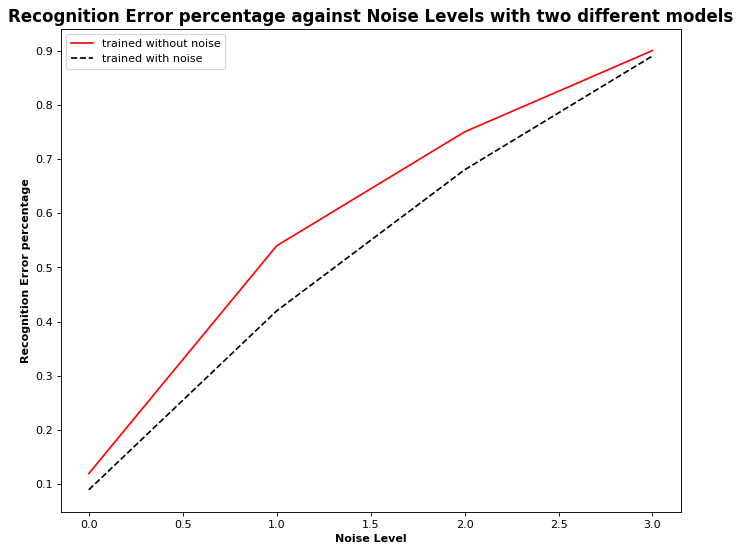

In [17]:
misclassified_without_noises = [misclassfied_without_noise_0,misclassfied_without_noise_1,misclassfied_without_noise_2,misclassfied_without_noise_3]
misclassified_3_steps = [misclassfied_3_steps_0,misclassfied_3_steps_1,misclassfied_3_steps_2,misclassfied_3_steps_3]
noise_levels = [0,1,2,3]

plt.figure(figsize=(10, 8), dpi=80)

plt.plot(noise_levels, misclassified_without_noises, '-',color='red',label='trained without noise')
plt.plot(noise_levels, misclassified_3_steps, '--',color='black',label='trained with noise')


plt.xlabel('Noise Level',fontsize=10,fontweight ="bold")
plt.ylabel('Recognition Error percentage',fontsize=10,fontweight ="bold")
plt.legend()
plt.title('Recognition Error percentage against Noise Levels with two different models',fontweight ="bold",fontsize=15)
plt.show()